In [27]:
import warnings
import tqdm
import time
import glob
import json

In [28]:
import argparse
import os

import numpy
import numpy as np
#from config import HabitatChallengeConfigPlugin
#from omegaconf import DictConfig

import habitat
from habitat.config.default_structured_configs import register_hydra_plugin
from habitat_baselines.config.default import get_config
from habitat.config.default_structured_configs import (HeadingSensorConfig,TopDownMapMeasurementConfig, HabitatSimSemanticSensorConfig,MoveForwardWaypointActionConfig)
import habitat_sim
import sys
import pandas as pd
import matplotlib.pyplot as plt
#from utils import FrameSkip, FrameStack, draw_top_down_map, plot_colortable, rand_cmap
import numba
import random
from moviepy.editor import ImageSequenceClip
import cv2
#from utils import FrameSkip, FrameStack, draw_top_down_map, plot_colortable, rand_cmap

In [29]:
from utils import FrameSkip, FrameStack, draw_top_down_map, plot_colortable, rand_cmap
import utils_for_vectorenv
from habitat import make_dataset

In [30]:
print(os.listdir("./data/scene_datasets/hm3d_v0.2/"))

['hm3d_annotated_basis.scene_dataset_config.json', '.ipynb_checkpoints']


In [31]:
parser = argparse.ArgumentParser()
parser.add_argument(
    "--input-type",
    default="rgbd",
    choices=["blind", "rgb", "depth", "rgbd"],
)
parser.add_argument(
    "--evaluation", type=str, required=True, choices=["local", "remote"]
)
parser.add_argument("--model-path", default="", type=str)
parser.add_argument(
    "--task", required=True, type=str, choices=["objectnav", "imagenav"]
)
parser.add_argument("--task-config", type=str, required=True)
parser.add_argument(
    "--action_space",
    type=str,
    default="velocity_controller",
    choices=[
        "velocity_controller",
        "waypoint_controller",
        "discrete_waypoint_controller",
    ],
    help="Action space to use for the agent",
)
parser.add_argument(
    "overrides",
    default=None,
    nargs=argparse.REMAINDER,
    help="Modify config options from command line",
)


benchmark_config_path =  "/habitat-lab/habitat-lab/habitat/config/benchmark/nav/objectnav/objectnav_v2_hm3d_stretch.yaml"
args = parser.parse_args('--evaluation local --model-path objectnav_baseline_habitat_navigation_challenge_2023.pth --input-type rgbd --task objectnav --action_space discrete_waypoint_controller --task-config /habitat-lab/habitat-baselines/habitat_baselines/config/objectnav/ddppo_objectnav_v2_hm3d_stretch.yaml'.split())

# Override actions

In [32]:
#!/usr/bin/env python3

# Copyright (c) Meta Platforms, Inc. and its affiliates.
# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.


r"""
This is an example of how to add new actions to habitat-lab


We will use the strafe action outline in the habitat_sim example
"""

import attr
import numpy as np

import habitat
import habitat_sim
from habitat.config.default_structured_configs import ActionConfig
from habitat.sims.habitat_simulator.actions import (
    HabitatSimActions,
    HabitatSimV1ActionSpaceConfiguration,
)
from habitat.tasks.nav.nav import SimulatorTaskAction


@attr.s(auto_attribs=True, slots=True)
class NoisyStrafeActuationSpec:
    move_amount: float
    # Classic strafing is to move perpendicular (90 deg) to the forward direction
    strafe_angle: float = 180.0
    noise_amount: float = 0.00


def _strafe_impl(
    scene_node: habitat_sim.SceneNode,
    move_amount: float,
    strafe_angle: float,
    noise_amount: float,
):
    forward_ax = (
        np.array(scene_node.absolute_transformation().rotation_scaling())
        @ habitat_sim.geo.FRONT
    )
    strafe_angle = np.deg2rad(strafe_angle)
    strafe_angle = np.random.uniform(
        (1 - noise_amount) * strafe_angle, (1 + noise_amount) * strafe_angle
    )

    rotation = habitat_sim.utils.quat_from_angle_axis(
        strafe_angle, habitat_sim.geo.UP
    )
    move_ax = habitat_sim.utils.quat_rotate_vector(rotation, forward_ax)

    move_amount = np.random.uniform(
        (1 - noise_amount) * move_amount, (1 + noise_amount) * move_amount
    )
    scene_node.translate_local(move_ax * move_amount)


@habitat_sim.registry.register_move_fn(body_action=True)
class NoisyStrafeLeft(habitat_sim.SceneNodeControl):
    def __call__(
        self,
        scene_node: habitat_sim.SceneNode,
        actuation_spec: NoisyStrafeActuationSpec,
    ):
        print(f"strafing left with noise_amount={actuation_spec.noise_amount}")
        _strafe_impl(
            scene_node,
            actuation_spec.move_amount,
            actuation_spec.strafe_angle,
            actuation_spec.noise_amount,
        )



@habitat.registry.register_action_space_configuration
class NoNoiseStrafe(HabitatSimV1ActionSpaceConfiguration):
    def get(self):
        config = super().get()

        config[HabitatSimActions.move_backward] = habitat_sim.ActionSpec(
            "noisy_strafe_left",
            NoisyStrafeActuationSpec(0.25, noise_amount=0.0),
        )

        return config


@habitat.registry.register_action_space_configuration
class NoiseStrafe(HabitatSimV1ActionSpaceConfiguration):
    def get(self):
        config = super().get()

        config[HabitatSimActions.move_backward] = habitat_sim.ActionSpec(
            "noisy_strafe_left",
            NoisyStrafeActuationSpec(0.25, noise_amount=0.05),
        )

        return config


@habitat.registry.register_task_action
class StrafeLeft(SimulatorTaskAction):
    def _get_uuid(self, *args, **kwargs) -> str:
        return "move_backward"

    def step(self, *args, **kwargs):
        return self._sim.step(HabitatSimActions.move_backward)


HabitatSimActions.extend_action_space("move_backward")


AssertionError: Cannot register an action name twice

In [38]:
split = "train"
overrides = args.overrides + [
        'habitat_baselines.rl.policy.action_distribution_type=categorical', 
        'habitat_baselines.load_resume_state_config=True',
        "benchmark/nav/" + args.task + "=" + os.path.basename(benchmark_config_path),
        "habitat/task/actions=" + args.action_space,
        f"habitat.dataset.split={split}",
        f"habitat.dataset.data_path=/data/datasets/objectnav/hm3d/v2/{split}/{split}.json.gz",
        "habitat.simulator.scene_dataset=/data/scene_datasets/hm3d_v0.2/hm3d_annotated_basis.scene_dataset_config.json",
        "habitat.dataset.scenes_dir=/data/scene_datasets",
        #"+my_habitat_scene="+'/data/scene_datasets/habitat-test-scenes/van-gogh-room.glb',
        #"+habitat/simulator/agents/main_agent/sim_sensors@sim_sensors.third_rgb_sensor=third_rgb_sensor",
        "+pth_gpu_id=1",
        "+input_type=" + args.input_type,
        "+model_path=" + args.model_path,
        "+random_seed=7",
    ]

In [39]:
config = get_config(
        args.task_config,
        overrides,
    )
with habitat.config.read_write(config):
    config.habitat.task.measurements.update(
        {"top_down_map": TopDownMapMeasurementConfig()})
    config.habitat.task.lab_sensors.update(
        {"heading_sensor": HeadingSensorConfig()})
    config.habitat.simulator.agents.main_agent.sim_sensors.update(
        {"semantic_sensor": HabitatSimSemanticSensorConfig(width=480,height=640,position=[0.0, 1.31, 0.0], hfov=42)}
    )

    config.habitat.task.actions.update({"move_backward": ActionConfig(
        type="StrafeLeft")}
    )
    config.habitat.simulator.action_space_config = "NoNoiseStrafe"
    config.habitat.environment.iterator_options.shuffle = False
    config.habitat.task.actions.turn_left_waypoint.turn_angle = 15 * 2 * np.pi / 360 # 15 degrees
    config.habitat.task.actions.turn_right_waypoint.turn_angle = 15 * 2 * np.pi / 360 # 15 degrees

In [40]:
config.habitat.task.actions.turn_left_waypoint

{'type': 'TurnLeftWaypointAction', 'agent_index': 0, 'lin_vel_range': [0.0, 0.3], 'ang_vel_range': [-0.45, 0.45], 'ang_vel_range_camera_pitch': [-0.45, 0.45], 'ang_range_camera_pitch': [-1.57, 0.43], 'time_step': 0.1, 'enable_scale_convert': True, 'action_duration': 1.0, 'waypoint_lin_range': [-0.5, 0.5], 'waypoint_ang_range': [-3.141592653589793, 3.141592653589793], 'delta_ang_range_camera_pitch': [-0.2, 0.2], 'wait_duration_range': [0.0, 10.0], 'yaw_input_in_degrees': False, 'min_abs_lin_speed': 0.025, 'min_abs_ang_speed': 0.018, 'min_abs_ang_speed_camera_pitch': 0.018, 'v_max': 0.3, 'w_max': 0.45, 'w_max_camera_pitch': 0.9, 'acc_lin': 0.2, 'acc_ang': 0.6, 'acc_ang_camera_pitch': 0.6, 'max_heading_ang': 0.7853981633974483, 'lin_error_tol': 0.01, 'ang_error_tol': 0.025, 'max_wait_duration': 3.0, 'turn_angle': 0.2617993877991494}

In [41]:
import os
from typing import Any, Dict, List, Optional, Sequence, Tuple
import imageio
import numpy as np
import scipy.ndimage
from habitat.core.utils import try_cv2_import
from habitat.utils.visualizations import utils
from habitat.utils.visualizations import maps
from habitat_sim.agent.agent import AgentState, SixDOFPose
from habitat_sim.utils.common import quat_from_angle_axis, quat_to_angle_axis, quat_to_coeffs

In [42]:
from habitat import make_dataset
_dataset = make_dataset(id_dataset=config.habitat.dataset.type, config=config.habitat.dataset)

2023-09-03 10:12:52,926 Initializing dataset ObjectNav-v1


In [43]:
from env_orb_23 import Env
one_env = Env(config=config,dataset=_dataset)

2023-09-03 10:23:30,044 initializing sim Sim-v0
2023-09-03 10:23:35,734 Initializing task ObjectNav-v2


0 /data/scene_datasets/hm3d_v0.2/train/00744-1S7LAXRdDqK/1S7LAXRdDqK.basis.glb
49998 /data/scene_datasets/hm3d_v0.2/train/00057-1UnKg1rAb8A/1UnKg1rAb8A.basis.glb
99996 /data/scene_datasets/hm3d_v0.2/train/00262-1xGrZPxG1Hz/1xGrZPxG1Hz.basis.glb
149996 /data/scene_datasets/hm3d_v0.2/train/00099-226REUyJh2K/226REUyJh2K.basis.glb
199996 /data/scene_datasets/hm3d_v0.2/train/00258-2Pc8W48bu21/2Pc8W48bu21.basis.glb
249994 /data/scene_datasets/hm3d_v0.2/train/00538-3CBBjsNkhqW/3CBBjsNkhqW.basis.glb
299992 /data/scene_datasets/hm3d_v0.2/train/00035-3XYAD64HpDr/3XYAD64HpDr.basis.glb
341657 /data/scene_datasets/hm3d_v0.2/train/00508-4vwGX7U38Ux/4vwGX7U38Ux.basis.glb
391657 /data/scene_datasets/hm3d_v0.2/train/00143-5Kw4nGdqYtS/5Kw4nGdqYtS.basis.glb
441657 /data/scene_datasets/hm3d_v0.2/train/00081-5biL7VEkByM/5biL7VEkByM.basis.glb
491655 /data/scene_datasets/hm3d_v0.2/train/00096-6HRFAUDqpTb/6HRFAUDqpTb.basis.glb
541610 /data/scene_datasets/hm3d_v0.2/train/00668-6YtDG3FhNvx/6YtDG3FhNvx.basis.glb

In [44]:
eval_episodes = []
prev_scene = one_env._episode_iterator.episodes[0].scene_id.split('/')[-1]
scenes = [prev_scene]
print('0','\t',one_env._episode_iterator.episodes[0].scene_id.split('/')[-1])#,np.round(one_env.closest_dist[0],2))
for ii,i in enumerate(one_env.eps):
    nex_scene = one_env._episode_iterator.episodes[i].scene_id.split('/')[-1]
    if nex_scene!=prev_scene:
        print(ii,'\t',nex_scene)#,np.round(one_env.closest_dist[ii],2)
        prev_scene=nex_scene
        eval_episodes.append(ii)

0 	 1S7LAXRdDqK.basis.glb
49998 	 1UnKg1rAb8A.basis.glb
99996 	 1xGrZPxG1Hz.basis.glb
149996 	 226REUyJh2K.basis.glb
199996 	 2Pc8W48bu21.basis.glb
249994 	 3CBBjsNkhqW.basis.glb
299992 	 3XYAD64HpDr.basis.glb
341657 	 4vwGX7U38Ux.basis.glb
391657 	 5Kw4nGdqYtS.basis.glb
441657 	 5biL7VEkByM.basis.glb
491655 	 6HRFAUDqpTb.basis.glb
541610 	 6YtDG3FhNvx.basis.glb
591610 	 6imZUJGRUq4.basis.glb
641608 	 741Fdj7NLF9.basis.glb
691606 	 77mMEyxhs44.basis.glb
741604 	 8B43pG641ff.basis.glb
791602 	 8wJuSPJ9FXG.basis.glb
841600 	 92vYG1q49FY.basis.glb
891598 	 9h5JJxM6E5S.basis.glb
941596 	 ACZZiU6BXLz.basis.glb
991594 	 CQWES1bawee.basis.glb
1041592 	 CthA7sQNTPK.basis.glb
1091590 	 DBBESbk4Y3k.basis.glb
1141590 	 DNWbUAJYsPy.basis.glb
1191590 	 DoSbsoo4EAg.basis.glb
1241590 	 DqJKU7YU7dA.basis.glb
1291588 	 DsEJeNPcZtE.basis.glb
1341586 	 E1NrAhMoqvB.basis.glb
1391584 	 ENiCjXWB6aQ.basis.glb
1441582 	 FRQ75PjD278.basis.glb
1491582 	 FnDDfrBZPhh.basis.glb
1541580 	 GGBvSFddQgs.basis.glb
1591

In [14]:
print(eval_episodes)

[28, 56, 84, 112, 140, 168, 196, 224, 252, 279, 307, 335, 363, 391, 419, 447, 475, 503, 531, 559, 587, 615, 643, 670, 698, 726, 754, 782, 810, 838, 866, 894, 922, 950, 978]


TypeError: unsupported operand type(s) for -: 'int' and 'tuple'

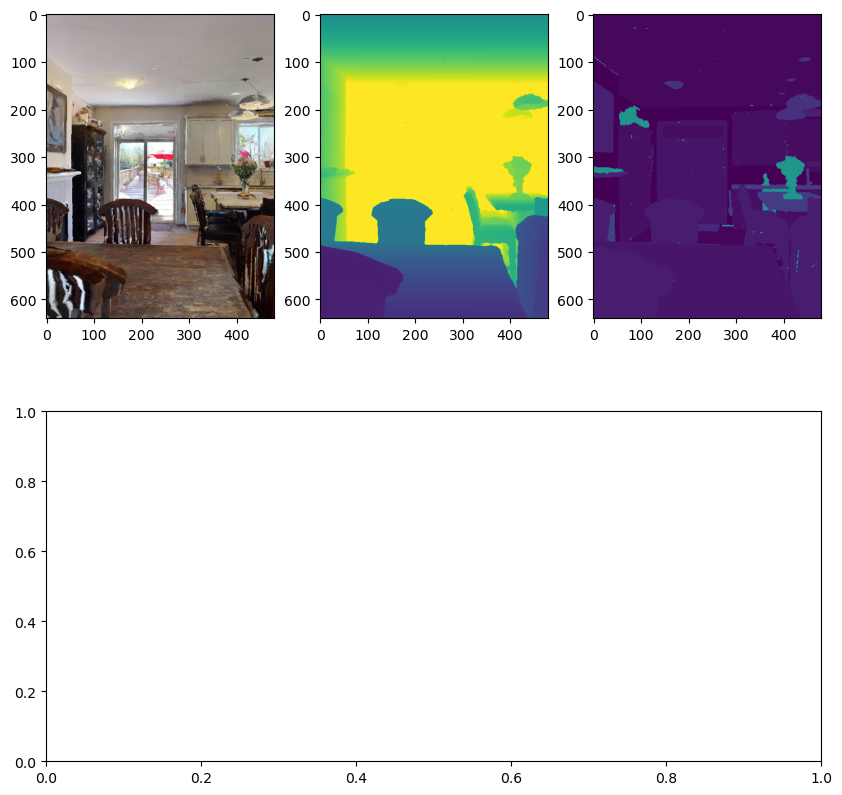

In [45]:
obs = one_env.reset(0); idd = 0
obs, reward, done, info = one_env.step(action=3)
obs, reward, done, info = one_env.step(action=3)
f = plt.figure(figsize=(10,10))
ax = f.add_subplot(2,3,1)
ax1 = f.add_subplot(2,3,2)
ax2 = f.add_subplot(2,3,3)
ax3 = f.add_subplot(2,1,2)
ax.imshow(obs['rgb'])
ax1.imshow(obs['depth'][:,:,0])
ax2.imshow(one_env.sem_to_model[:,:,0])
top_down_map = draw_top_down_map(info,obs['heading'][0],obs['rgb'][0].shape[0])
ax3.imshow(top_down_map)
print(np.rad2deg(obs['compass']))

Define dataset collection parameters

In [46]:
# define dataset collection parameters
TRAIN = True
NUM_ANCHORS = 1160 if TRAIN else 144
NUM_STEPS = 4
ROT_ANGLE = 30
SCENES = [0] + eval_episodes
ACTIONS = ['turn_left_waypoint', 'turn_right_waypoint', 'look_up_discrete_to_velocity', 'look_down_discrete_to_velocity', "move_backward"]
IMG_ROOT = '/data/interactron_ade_4_steps/train' if TRAIN else '/data/interactron_ade_4_steps/val'
ANN_PATH = '/data/interactron_ade_4_steps/annotations/interactron_v1_train.json' if TRAIN \
    else '/data/interactron_ade_4_steps/annotations/interactron_v1_val.json'

In [47]:
def pos_to_id(state):
    sensor_angle, sensor_axis = quat_to_angle_axis(state.sensor_states['rgb'].rotation)
    return "pos=[%.2f,%.2f,%.2f]_rot=[%.2frad]_rgb_angle=[%.2frad]_rgb_axis=[%.2f,%.2f,%.2f]" % (
        state.position[0], state.position[1], state.position[2], quat_to_angle_axis(state.rotation)[0],
        sensor_angle, sensor_axis[0], sensor_axis[1], sensor_axis[2])


def mask_to_polygon(mask):
    mask = mask.astype(np.uint8)
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return _cv2_format_to_lvis_format(contours)


def _cv2_format_to_lvis_format(contours):
    out = []
    for i in range(len(contours)):
        if len(contours[i]) < 6:
            continue
        segment = []
        for p in contours[i]:
            segment.append(int(p[0, 0]))
            segment.append(int(p[0, 1]))
        if len(segment) > 0:
            out.append(segment)
    return out


def reset_to_point(one_env, initial_state):
    one_env.sim.agents[0].set_state(initial_state, is_initial=False)
    one_env._reset_stats()
    obs, rew, done, info = one_env.step(action="turn_left_waypoint",in_reset=True)
    obs, rew, done, info = one_env.step(action="turn_right_waypoint",in_reset=True)
    return obs


def take_step(ctrl, state, action):
    #reset_to_point(ctrl, state)
    one_env.sim.agents[0].set_state(state, is_initial=False)
    one_env._reset_stats()
    e, rew, done, info = ctrl.step(action)
    seg_mask = one_env.sem_to_model
    cats = np.unique(seg_mask)
    #masks = {meta_categories[cat]: mask_to_polygon((seg_mask == cat).astype(float)) for cat in cats}
    #areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
    instance_ids = sorted(np.unique(e["instance"]))
    instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
    instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
    instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
    #objects = {n: [int(m[0]), int(m[1]), int(m[2] - m[0]), int(m[3] - m[1])] for n, m in
    #           e.instance_detections2D.items()}
    detections = {}
    for index, iid in enumerate(instance_ids):
        seg_value = iid

        segmentation = np.where(e["instance"] == seg_value)

        mask = (e["instance"] == seg_value)
        # Bounding Box
        bbox = 0, 0, 0, 0
        if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
            x_min = int(np.min(segmentation[1]))
            x_max = int(np.max(segmentation[1]))
            y_min = int(np.min(segmentation[0]))
            y_max = int(np.max(segmentation[0]))

            bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
        detections[str(iid)] = {
            "category_id": instance_cats[index],
            "bbox": bbox,
            "mask": mask_to_polygon(mask)
        }

    #for name, bbox in objects.items():
    #    cat = name.split("|")[0]
    #    if cat not in korea_to_lvis or len(masks[name]) == 0:
    #         continue
    #    detections[name] = {
    #        "category_id": tlvis_categories.index(korea_to_lvis[cat]),
    #        "bbox": bbox,
    #    }
    return {
        "pos": ctrl._sim.get_agent_state().position,
        "rot": ctrl._sim.get_agent_state().rotation,
        "hor": ctrl._sim.get_agent_state().sensor_states['rgb'].rotation,
        "seg_mask": seg_mask,
        #"stand": state["stand"],
        "img": e["rgb"],
        #"depth": e["depth"],
        "state": ctrl._sim.get_agent_state(),
        #"objects": objects,
        #"masks": masks,
        #"areas": areas,
        "detections": detections
    }


def find_shortes_terminal_path(state, table, depth=0, max_depth=4):
    actions = table[state]['actions']
    if len(actions) == 0 or depth > max_depth:
        return depth
    depths = []
    for action in actions:
        new_state = actions[action]
        new_depth = find_shortes_terminal_path(new_state, table, depth=depth+1, max_depth=max_depth)
        depths.append(new_depth)
    return min(depths)

In [48]:
def rollout_rec(root_state, state_table, d=0):
    #print(pos_to_id(root_state))
    # if we reached the end of the rollout return empty dict of next steps
    if d >= NUM_STEPS:
        return {}
    # otherwise generate the data for the steps we can take from this state
    if pos_to_id(root_state) in state_table and len(state_table[pos_to_id(root_state)]['actions']) > 0:
        steps = state_table[pos_to_id(root_state)]['actions']
    else:
        steps = {}
        for action in ACTIONS:
            new_state = take_step(one_env, root_state, action)
            steps[action] = pos_to_id(new_state["state"])
            if pos_to_id(new_state["state"]) not in state_table:
                state_table[pos_to_id(new_state["state"])] = new_state
                state_table[pos_to_id(new_state["state"])]["actions"] = {}
            if "state" not in new_state:
                print("for state", new_state)
    #print(steps)
    #print(state_table.keys())
    for state_name in steps.values():
        state = state_table[state_name]
        next_steps = rollout_rec(state["state"], state_table, d=d+1)
        if len(state_table[pos_to_id(state["state"])]["actions"]) == 0:
            state_table[pos_to_id(state["state"])]["actions"] = next_steps
    return steps

In [49]:
print(one_env._sim.agents[0].agent_config)


AgentConfiguration(height=1.41, radius=0.17, cell_height=0.05, max_climb=0.1, sensor_specifications=[<habitat_sim._ext.habitat_sim_bindings.CameraSensorSpec object at 0x7f35ece239f0>, <habitat_sim._ext.habitat_sim_bindings.CameraSensorSpec object at 0x7f35ece23c20>, <habitat_sim._ext.habitat_sim_bindings.CameraSensorSpec object at 0x7f35ece23bd0>], action_space={0: ActionSpec(name='stop', actuation=None), 1: ActionSpec(name='move_forward', actuation=ActuationSpec(amount=0.25, constraint=None)), 2: ActionSpec(name='turn_left', actuation=ActuationSpec(amount=10, constraint=None)), 3: ActionSpec(name='turn_right', actuation=ActuationSpec(amount=10, constraint=None)), 4: ActionSpec(name='look_up', actuation=ActuationSpec(amount=15, constraint=None)), 5: ActionSpec(name='look_down', actuation=ActuationSpec(amount=15, constraint=None)), 16: ActionSpec(name='noisy_strafe_left', actuation=NoisyStrafeActuationSpec(move_amount=0.25, strafe_angle=180.0, noise_amount=0.0))}, body_type='cylinder')


In [50]:
meta_categories = {0: 'wall',
1: 'building',
2: 'sky',
3: 'floor',
4: 'tree',
5: 'ceiling',
6: 'road, route',
7: 'bed',
8: 'window',
9: 'grass',
10: 'cabinet',
11: 'sidewalk, pavement',
12: 'person',
13: 'earth, ground',
14: 'door',
15: 'table',
16: 'mountain, mount',
17: 'plant',
18: 'curtain',
19: 'chair',
20: 'car',
21: 'water',
22: 'painting, picture',
23: 'sofa',
24: 'shelf',
25: 'house',
26: 'sea',
27: 'mirror',
28: 'rug',
29: 'field',
30: 'armchair',
31: 'seat',
32: 'fence',
33: 'desk',
34: 'rock, stone',
35: 'wardrobe, closet, press',
36: 'lamp',
37: 'tub',
38: 'rail',
39: 'cushion',
40: 'base, pedestal, stand',
41: 'box',
42: 'column, pillar',
43: 'signboard, sign',
44: 'chest of drawers, chest, bureau, dresser',
45: 'counter',
46: 'sand',
47: 'sink',
48: 'skyscraper',
49: 'fireplace',
50: 'refrigerator, icebox',
51: 'grandstand, covered stand',
52: 'path',
53: 'stairs',
54: 'runway',
55: 'case, display case, showcase, vitrine',
56: 'pool table, billiard table, snooker table',
57: 'pillow',
58: 'screen door, screen',
59: 'stairway, staircase',
60: 'river',
61: 'bridge, span',
62: 'bookcase',
63: 'blind, screen',
64: 'coffee table',
65: 'toilet, can, commode, crapper, pot, potty, stool, throne',
66: 'flower',
67: 'book',
68: 'hill',
69: 'bench',
70: 'countertop',
71: 'stove',
72: 'palm, palm tree',
73: 'kitchen island',
74: 'computer',
75: 'swivel chair',
76: 'boat',
77: 'bar',
78: 'arcade machine',
79: 'hovel, hut, hutch, shack, shanty',
80: 'bus',
81: 'towel',
82: 'light',
83: 'truck',
84: 'tower',
85: 'chandelier',
86: 'awning, sunshade, sunblind',
87: 'street lamp',
88: 'booth',
89: 'tv',
90: 'plane',
91: 'dirt track',
92: 'clothes',
93: 'pole',
94: 'land, ground, soil',
95: 'bannister, banister, balustrade, balusters, handrail',
96: 'escalator, moving staircase, moving stairway',
97: 'ottoman, pouf, pouffe, puff, hassock',
98: 'bottle',
99: 'buffet, counter, sideboard',
100: 'poster, posting, placard, notice, bill, card',
101: 'stage',
102: 'van',
103: 'ship',
104: 'fountain',
105: 'conveyer belt, conveyor belt, conveyer, conveyor, transporter',
106: 'canopy',
107: 'washer, automatic washer, washing machine',
108: 'plaything, toy',
109: 'pool',
110: 'stool',
111: 'barrel, cask',
112: 'basket, handbasket',
113: 'falls',
114: 'tent',
115: 'bag',
116: 'minibike, motorbike',
117: 'cradle',
118: 'oven',
119: 'ball',
120: 'food, solid food',
121: 'step, stair',
122: 'tank, storage tank',
123: 'trade name',
124: 'microwave',
125: 'pot',
126: 'animal',
127: 'bicycle',
128: 'lake',
129: 'dishwasher',
130: 'screen',
131: 'blanket, cover',
132: 'sculpture',
133: 'hood, exhaust hood',
134: 'sconce',
135: 'vase',
136: 'traffic light',
137: 'tray',
138: 'trash can',
139: 'fan',
140: 'pier',
141: 'crt screen',
142: 'plate',
143: 'monitor',
144: 'bulletin board',
145: 'shower',
146: 'radiator',
147: 'glass, drinking glass',
148: 'clock',
149: 'flag',
255: 'unlabeled' 
}
obj_name_to_150ids = {i:ii for ii,i in meta_categories.items()}

# Record dataset starting from the same points as existing dataset

In [52]:
with open("/data/interactron_ade_4_steps/annotations/interactron_v1_train-Copy2.json", "r") as f:
    anns = json.load(f)

In [53]:
import copy

In [22]:
with open("/data/interactron_ade_4_steps_15/annotations/interactron_v1_val-Copy1.json", "r") as f:
    annotations = json.load(f)
#annotations = {
#    "data": [],
#    "metadata": {
#        "actions": ACTIONS,
#        "max_steps": NUM_STEPS,
#        "rotation_angle": ROT_ANGLE,
#        "scenes": SCENES
#    }
#}

In [54]:
IMG_ROOT_NEW = '/data/interactron_ade_4_steps_15/train' if TRAIN else '/data/interactron_ade_4_steps_15/val'
ANN_PATH_NEW = '/data/interactron_ade_4_steps_15/annotations/interactron_v1_train_part_2.json' if TRAIN \
    else '/data/interactron_ade_4_steps_15/annotations/interactron_v1_val.json'

In [55]:
if NUM_ANCHORS % len(SCENES) != 0:
    warnings.warn("The number of anchors specified (%d) is not integer divisible by the number"
                  "of scenes (%d). To maintain dataset balance the number of anchors will"
                  "be reduced to (%d)" % (NUM_ANCHORS, len(SCENES), NUM_ANCHORS // len(SCENES)))
samples_per_scene = NUM_ANCHORS // len(SCENES)
annotations = {
    "data": [],
    "metadata": {
        "actions": ACTIONS,
        "max_steps": NUM_STEPS,
        "rotation_angle": ROT_ANGLE,
        "scenes": SCENES
    }
}

for p in tqdm.tqdm(anns["data"][(207+953//2):]):
    start_time = time.time()
    point = copy.deepcopy(p)
    scene = int(point["scene_name"].split("_")[0])
    one_env.reset(scene)
    print(scene)
    root_state = point["root"]
    point_agentcord = point["state_table"][root_state]["pos"]
    #print(point_agentcord)
    rotation = 0.0
    sensor_angle = float(root_state.split("rgb_angle=[")[-1].split("rad]")[0])
    sensor_axis = np.array(root_state.split("rgb_axis=[")[-1].split("]")[0].split(",")).astype(np.float32)
    #print(sensor_axis)
    initial_state = AgentState()
    initial_state.position = np.array(point_agentcord)
    initial_state.rotation = point["state_table"][root_state]["rot"]
    #initial_state.rotation = quat_from_angle_axis(sensor_angle, sensor_axis)
    point_agentcord[1] += 1.31
    initial_state.sensor_states['rgb'] = SixDOFPose()
    initial_state.sensor_states['rgb'].position = np.array(point_agentcord)
    sensor_rot = point["state_table"][root_state]["hor"]
    initial_state.sensor_states['rgb'].rotation = sensor_rot
    initial_state.sensor_states['semantic'] = SixDOFPose()
    initial_state.sensor_states['semantic'].position = np.array(point_agentcord)
    initial_state.sensor_states['semantic'].rotation = sensor_rot           
    #initial_state.rotation = [sensor_rot[3], sensor_rot[0], sensor_rot[1], sensor_rot[2]]
    #initial_state.rotation = sensor_rot 
    #initial_state.rotation = point["state_table"][state]["hor"]
    point_agentcord[1] -= 1.31
    #initial_state.sensor_states['rgb'] = SixDOFPose()
    #initial_state.sensor_states['rgb'].position = np.array(point_agentcord)
    #initial_state.sensor_states['rgb'].rotation = quat_from_angle_axis(sensor_angle, sensor_axis)
    #print(initial_state)
    one_env._sim.agents[0].set_state(initial_state, reset_sensors=False, infer_sensor_states=False, is_initial=False)
    root = one_env._sim.get_sensor_observations()
    root_id = pos_to_id(one_env._sim.get_agent_state())
    print(root_id)
    #seg_mask = np.vectorize(one_env.index_to_title_map.get)(one_env.sem_to_model)
    #seg_mask = np.vectorize(obj_name_to_40ids.get)(seg_mask)
    seg_mask = one_env.sem_to_model
    cats = np.unique(seg_mask)
    masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
    areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
    root['semantic'][root['semantic']>max(one_env.instance_id_to_label_id.keys())] = 0
    instance_ids = sorted(np.unique(root["semantic"]))
    instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
    instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
    instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
    detections = {}
    for index, iid in enumerate(instance_ids):
        seg_value = iid

        segmentation = np.where(root["semantic"] == seg_value)

        # Bounding Box
        bbox = 0, 0, 0, 0
        if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
            x_min = int(np.min(segmentation[1]))
            x_max = int(np.max(segmentation[1]))
            y_min = int(np.min(segmentation[0]))
            y_max = int(np.max(segmentation[0]))

            bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
        detections[str(iid)] = {
            "category_id": instance_cats[index],
            "bbox": bbox,
        }
    root_state = {
        "pos": one_env._sim.get_agent_state().position,
        "rot": one_env._sim.get_agent_state().rotation,
        "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
        "seg_mask": one_env.sem_to_model,
        #"stand": state["stand"],
        "img": root["rgb"],
        #"depth": root["depth"],
        "state": one_env._sim.get_agent_state(),
        #"objects": objects,
        #"masks": masks,
        #"areas": areas,
        "detections": detections
    }
    state_table = {root_id: root_state}
    state_table[root_id]["actions"] = {}
    state_table[root_id]["actions"] = rollout_rec(initial_state, state_table)
    # check to see that all paths in this tree are at least as long as out max depth
    validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
    print(time.time() - start_time)
    if validated_root:
        print("Validated root")
        #images_per_scene = point["scene_name"].split("_")[0]
        # save data
        scene_name = point["scene_name"]
        os.makedirs("{}/{}".format(IMG_ROOT_NEW, scene_name), exist_ok=True)
        os.makedirs("{}_{}/{}".format(IMG_ROOT_NEW, "mask", scene_name), exist_ok=True)
        files = glob.glob("{}/{}/*".format(IMG_ROOT_NEW, scene_name))
        for f in files:
            os.remove(f)
        files = glob.glob("{}_{}/{}/*".format(IMG_ROOT_NEW, "mask", scene_name))
        for f in files:
            os.remove(f)   
        for state, values in state_table.items():
            cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT_NEW, scene_name, pos_to_id(values["state"])), cv2.cvtColor(values["img"], cv2.COLOR_RGB2BGR))
            cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT_NEW,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
        # reformat state table into dataset format
        light_state_table = {}
        for name, fields in state_table.items():
            light_state_table[name] = {
                "pos": fields["pos"].tolist(),
                "rot": quat_to_coeffs(fields["rot"]).tolist(),
                "hor": quat_to_coeffs(fields["hor"]).tolist(),
                #"stand": fields["stand"],
                "detections": fields["detections"],
                "actions": fields["actions"]
            }
        annotations["data"].append({
            "scene_name": scene_name,
            "state_table": light_state_table,
            "root": root_id
        })
    print(time.time() - start_time)
    with open(ANN_PATH_NEW, 'w') as f:
        json.dump(annotations, f)

  0%|          | 0/477 [00:00<?, ?it/s]

4223185
pos=[-4.79,0.01,0.38]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
47.56654453277588
Validated root


  0%|          | 1/477 [00:47<6:20:33, 47.97s/it]

47.91992473602295
4223185
pos=[-3.84,0.01,0.54]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amo

  0%|          | 2/477 [02:19<9:41:50, 73.50s/it]

4223185
pos=[-8.70,-0.34,0.85]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  1%|          | 3/477 [03:49<10:40:12, 81.04s/it]

4223185
pos=[-6.94,0.01,3.53]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  1%|          | 4/477 [05:35<11:58:20, 91.12s/it]

4223185
pos=[-0.36,0.01,1.61]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  1%|          | 5/477 [07:16<12:22:48, 94.42s/it]

4273183
pos=[0.43,0.05,7.51]_rot=[1.52rad]_rgb_angle=[1.52rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  1%|▏         | 6/477 [09:18<13:36:45, 104.05s/it]

4273183
pos=[0.47,0.05,8.11]_rot=[1.45rad]_rgb_angle=[1.45rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  1%|▏         | 7/477 [11:13<14:01:09, 107.38s/it]

4273183
pos=[5.85,-0.00,3.74]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  2%|▏         | 8/477 [12:29<12:43:14, 97.64s/it] 

4273183
pos=[3.74,0.01,-4.70]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  2%|▏         | 9/477 [14:02<12:28:44, 95.99s/it]

4273183
pos=[7.03,0.05,-6.78]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  2%|▏         | 10/477 [16:07<13:38:15, 105.13s/it]

4273183
pos=[6.77,0.05,-8.72]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  2%|▏         | 11/477 [17:38<13:02:21, 100.73s/it]

4273183
pos=[6.02,0.05,1.70]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  3%|▎         | 12/477 [19:29<13:23:38, 103.70s/it]

4273183
pos=[7.03,0.05,2.31]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  3%|▎         | 13/477 [21:30<14:03:14, 109.04s/it]

4323183
pos=[-2.89,0.01,-4.47]_rot=[0.59rad]_rgb_angle=[0.59rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

  3%|▎         | 14/477 [22:46<12:45:14, 99.17s/it] 

4323183
pos=[0.33,0.01,0.54]_rot=[1.46rad]_rgb_angle=[1.46rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  3%|▎         | 15/477 [24:08<12:03:22, 93.94s/it]

4323183
pos=[-6.06,-3.19,0.04]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  3%|▎         | 16/477 [25:35<11:44:21, 91.67s/it]

4323183
pos=[-8.96,0.01,-3.06]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  4%|▎         | 17/477 [26:33<10:26:41, 81.74s/it]

4323183
pos=[-7.66,-3.19,-3.81]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
32.62466096878052
Validated root
33.06922721

  4%|▍         | 18/477 [27:15<8:53:22, 69.72s/it] 

4323183
pos=[-5.19,0.03,0.47]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  4%|▍         | 19/477 [28:28<9:00:34, 70.82s/it]

4323183
pos=[-7.01,-3.19,-0.36]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
42.096611976623535
Validated root
42.3725311

  4%|▍         | 20/477 [29:19<8:13:34, 64.80s/it]

4323183
pos=[-6.96,0.01,-4.10]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  4%|▍         | 21/477 [30:48<9:07:24, 72.03s/it]

4373181
pos=[-1.39,0.06,9.75]_rot=[0.72rad]_rgb_angle=[0.72rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  5%|▍         | 22/477 [32:39<10:35:25, 83.79s/it]

4373181
pos=[-6.71,0.06,10.62]_rot=[2.15rad]_rgb_angle=[2.15rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

  5%|▍         | 23/477 [33:44<9:51:55, 78.23s/it] 

4373181
pos=[2.25,0.06,7.20]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  5%|▌         | 24/477 [35:05<9:55:42, 78.90s/it]

4373181
pos=[2.30,0.06,5.65]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  5%|▌         | 25/477 [36:51<10:56:01, 87.08s/it]

4373181
pos=[4.09,0.06,10.37]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  5%|▌         | 26/477 [38:29<11:18:40, 90.29s/it]

4373181
pos=[-1.05,-3.34,5.45]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  6%|▌         | 27/477 [40:03<11:26:04, 91.48s/it]

4373181
pos=[2.50,-3.34,10.80]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  6%|▌         | 28/477 [41:51<12:00:49, 96.32s/it]

4373181
pos=[1.10,-3.34,1.35]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  6%|▌         | 29/477 [43:20<11:43:19, 94.20s/it]

4423181
pos=[16.72,2.86,-6.14]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  6%|▋         | 30/477 [44:53<11:38:10, 93.71s/it]

4423181
pos=[4.05,0.11,-0.27]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  6%|▋         | 31/477 [46:30<11:45:12, 94.87s/it]

4423181
pos=[9.45,0.01,-3.79]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  7%|▋         | 32/477 [48:11<11:56:28, 96.60s/it]

4423181
pos=[8.27,0.01,-3.24]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  7%|▋         | 33/477 [49:53<12:07:43, 98.34s/it]

4423181
pos=[8.08,0.11,-1.78]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

  7%|▋         | 34/477 [51:44<12:33:47, 102.09s/it]

4423181
pos=[10.86,0.01,-1.81]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  7%|▋         | 35/477 [53:27<12:33:49, 102.33s/it]

4423181
pos=[8.43,0.01,-3.23]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
40.935049295425415
Validated root
41.202474355

  8%|▊         | 36/477 [54:22<10:48:52, 88.28s/it] 

4423181
pos=[16.48,2.81,-4.21]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  8%|▊         | 37/477 [55:50<10:45:07, 87.97s/it]

4473182
pos=[4.64,-0.01,-10.03]_rot=[0.04rad]_rgb_angle=[0.04rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
57.75230574607849
Validated root
58.3927111

  8%|▊         | 38/477 [57:04<10:13:04, 83.79s/it]

4473182
pos=[5.49,0.04,-7.88]_rot=[2.03rad]_rgb_angle=[2.03rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  8%|▊         | 39/477 [59:22<12:11:31, 100.21s/it]

4473182
pos=[2.73,0.04,3.99]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  8%|▊         | 40/477 [1:01:22<12:53:35, 106.21s/it]

4473182
pos=[3.78,0.04,2.99]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  9%|▊         | 41/477 [1:03:18<13:11:12, 108.88s/it]

4473182
pos=[6.22,0.04,5.99]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  9%|▉         | 42/477 [1:05:46<14:35:41, 120.79s/it]

4473182
pos=[3.82,0.00,0.05]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  9%|▉         | 43/477 [1:08:06<15:15:49, 126.61s/it]

4473182
pos=[3.18,0.04,2.99]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
61.70771074295044
Validated root
62.32728910446

  9%|▉         | 44/477 [1:09:27<13:33:40, 112.75s/it]

4473182
pos=[4.18,-0.01,-4.06]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

  9%|▉         | 45/477 [1:12:04<15:07:19, 126.02s/it]

4523180
pos=[8.77,0.02,-0.85]_rot=[3.07rad]_rgb_angle=[3.07rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 10%|▉         | 46/477 [1:14:34<15:57:09, 133.25s/it]

4523180
pos=[8.48,-0.00,-0.85]_rot=[2.24rad]_rgb_angle=[2.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 10%|▉         | 47/477 [1:17:24<17:14:29, 144.35s/it]

4523180
pos=[-3.40,0.01,-1.59]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 10%|█         | 48/477 [1:20:19<18:18:23, 153.62s/it]

4523180
pos=[-3.74,0.05,-1.11]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
85.2283866405487
Validated root
85.5523436069

 10%|█         | 49/477 [1:22:04<16:30:26, 138.85s/it]

4523180
pos=[0.61,-0.00,-0.16]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 10%|█         | 50/477 [1:25:08<18:06:03, 152.61s/it]

4523180
pos=[-4.90,-0.00,-0.18]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 11%|█         | 51/477 [1:29:00<20:52:05, 176.35s/it]

4523180
pos=[-9.09,-0.00,-0.76]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 11%|█         | 52/477 [1:33:02<23:08:47, 196.06s/it]

4523180
pos=[0.66,0.05,-0.61]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 11%|█         | 53/477 [1:35:46<21:57:34, 186.45s/it]

4573180
pos=[-0.94,2.83,-3.24]_rot=[0.23rad]_rgb_angle=[0.23rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 11%|█▏        | 54/477 [1:37:25<18:48:48, 160.11s/it]

4573180
pos=[5.65,2.83,1.22]_rot=[1.44rad]_rgb_angle=[1.44rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 12%|█▏        | 55/477 [1:39:16<17:01:46, 145.28s/it]

4573180
pos=[1.57,2.83,2.41]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 12%|█▏        | 56/477 [1:41:38<16:53:35, 144.45s/it]

4573180
pos=[8.16,-0.32,-2.89]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 12%|█▏        | 57/477 [1:43:57<16:39:53, 142.84s/it]

4573180
pos=[1.51,2.83,-1.19]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
38.55519127845764
Validated root
38.8736035823

 12%|█▏        | 58/477 [1:45:03<13:56:05, 119.73s/it]

4573180
pos=[-0.84,-0.37,-5.19]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 12%|█▏        | 59/477 [1:47:16<14:22:45, 123.84s/it]

4573180
pos=[0.96,2.83,2.46]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
39.206387996673584
Validated root
39.7983796596

 13%|█▎        | 60/477 [1:48:27<12:28:41, 107.72s/it]

4573180
pos=[-0.64,-0.37,-0.94]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 13%|█▎        | 61/477 [1:50:39<13:19:06, 115.26s/it]

4623180
pos=[-10.67,-2.62,-3.44]_rot=[3.02rad]_rgb_angle=[3.02rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafin

 13%|█▎        | 62/477 [1:53:51<15:56:31, 138.29s/it]

4623180
pos=[-10.71,-2.63,-3.51]_rot=[2.86rad]_rgb_angle=[2.86rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafin

 13%|█▎        | 63/477 [1:56:25<16:26:49, 143.02s/it]

4623180
pos=[-7.31,2.75,-0.66]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 13%|█▎        | 64/477 [1:57:54<14:32:47, 126.80s/it]

4623180
pos=[-7.27,2.76,-0.79]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 14%|█▎        | 65/477 [2:00:05<14:37:30, 127.79s/it]

4623180
pos=[-6.86,-2.60,1.14]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 14%|█▍        | 66/477 [2:03:08<16:30:39, 144.62s/it]

4623180
pos=[-4.96,2.75,-0.21]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
60.80977725982666
Validated root
61.179551601

 14%|█▍        | 67/477 [2:04:40<14:40:12, 128.81s/it]

4623180
pos=[-8.31,0.00,-1.86]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 14%|█▍        | 68/477 [2:07:38<16:17:45, 143.44s/it]

4623180
pos=[-4.58,2.75,0.18]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 14%|█▍        | 69/477 [2:10:19<16:51:29, 148.75s/it]

4664845
pos=[-2.58,2.98,-3.15]_rot=[0.93rad]_rgb_angle=[0.93rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 15%|█▍        | 70/477 [2:14:10<19:35:21, 173.27s/it]

4664845
pos=[-1.42,0.01,-3.57]_rot=[1.18rad]_rgb_angle=[1.18rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 15%|█▍        | 71/477 [2:18:01<21:30:56, 190.78s/it]

4664845
pos=[-4.77,2.98,0.79]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 15%|█▌        | 72/477 [2:22:02<23:09:20, 205.83s/it]

4664845
pos=[-5.38,-0.02,-0.23]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 15%|█▌        | 73/477 [2:26:01<24:11:42, 215.60s/it]

4664845
pos=[-4.73,2.98,-1.75]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 16%|█▌        | 74/477 [2:28:53<22:40:45, 202.59s/it]

4664845
pos=[-3.68,2.98,-0.68]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 16%|█▌        | 75/477 [2:32:12<22:29:58, 201.49s/it]

4664845
pos=[-2.83,2.98,-0.45]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 16%|█▌        | 76/477 [2:35:24<22:08:31, 198.78s/it]

4664845
pos=[-1.92,2.98,-0.21]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 16%|█▌        | 77/477 [2:39:26<23:31:06, 211.67s/it]

4714843
pos=[4.23,0.03,4.52]_rot=[1.98rad]_rgb_angle=[1.98rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 16%|█▋        | 78/477 [2:41:52<21:16:17, 191.92s/it]

4714843
pos=[-0.23,0.06,-6.09]_rot=[2.03rad]_rgb_angle=[2.03rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 17%|█▋        | 79/477 [2:44:01<19:09:06, 173.23s/it]

4714843
pos=[5.35,0.06,-4.22]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 17%|█▋        | 80/477 [2:46:15<17:46:49, 161.23s/it]

4714843
pos=[0.47,-3.19,2.51]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
51.01000738143921
Validated root
51.5205066204

 17%|█▋        | 81/477 [2:47:43<15:19:53, 139.38s/it]

4714843
pos=[4.14,0.01,1.40]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 17%|█▋        | 82/477 [2:49:51<14:56:01, 136.11s/it]

4714843
pos=[5.52,0.02,-3.03]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 17%|█▋        | 83/477 [2:51:46<14:11:04, 129.60s/it]

4714843
pos=[2.52,0.06,-3.19]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
31.979615211486816
Validated root
32.229216098

 18%|█▊        | 84/477 [2:52:52<12:04:47, 110.65s/it]

4714843
pos=[5.22,0.06,-4.19]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 18%|█▊        | 85/477 [2:54:44<12:04:15, 110.86s/it]

4764841
pos=[3.33,-3.23,-1.70]_rot=[2.48rad]_rgb_angle=[2.48rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 18%|█▊        | 86/477 [2:56:20<11:34:22, 106.55s/it]

4764841
pos=[-6.07,0.02,2.43]_rot=[2.24rad]_rgb_angle=[2.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 18%|█▊        | 87/477 [2:57:51<11:02:29, 101.92s/it]

4764841
pos=[0.69,-3.23,1.95]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 18%|█▊        | 88/477 [2:59:47<11:27:39, 106.07s/it]

4764841
pos=[-8.16,0.02,7.15]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 19%|█▊        | 89/477 [3:01:45<11:48:18, 109.53s/it]

4764841
pos=[-8.56,0.02,4.21]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 19%|█▉        | 90/477 [3:03:38<11:53:06, 110.56s/it]

4764841
pos=[1.14,-3.23,7.85]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
34.733025550842285
Validated root
35.059113025

 19%|█▉        | 91/477 [3:04:53<10:43:24, 100.01s/it]

4764841
pos=[-0.96,0.02,4.05]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 19%|█▉        | 92/477 [3:06:53<11:20:37, 106.07s/it]

4764841
pos=[2.02,0.05,-1.16]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 19%|█▉        | 93/477 [3:08:55<11:49:25, 110.85s/it]

4814839
pos=[11.23,3.04,1.25]_rot=[0.94rad]_rgb_angle=[0.94rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 20%|█▉        | 94/477 [3:11:27<13:06:18, 123.18s/it]

4814839
pos=[12.71,3.04,0.25]_rot=[2.92rad]_rgb_angle=[2.92rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 20%|█▉        | 95/477 [3:13:37<13:17:24, 125.25s/it]

4814839
pos=[0.19,3.04,2.06]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
37.558894872665405
Validated root
37.9838438034

 20%|██        | 96/477 [3:14:57<11:47:48, 111.47s/it]

4814839
pos=[-0.21,0.04,-3.89]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
44.36011791229248
Validated root
44.764195919

 20%|██        | 97/477 [3:16:24<11:00:20, 104.26s/it]

4814839
pos=[4.69,3.04,-2.39]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 21%|██        | 98/477 [3:18:50<12:18:19, 116.88s/it]

4814839
pos=[3.99,3.04,-1.69]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 21%|██        | 99/477 [3:20:43<12:08:57, 115.71s/it]

4814839
pos=[7.34,0.04,-3.09]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 21%|██        | 100/477 [3:22:28<11:46:24, 112.43s/it]

4814839
pos=[1.19,3.04,-2.94]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
37.65705227851868
Validated root
37.9246180057

 21%|██        | 101/477 [3:23:43<10:33:36, 101.11s/it]

4864837
pos=[-0.28,0.02,3.47]_rot=[0.95rad]_rgb_angle=[0.95rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 21%|██▏       | 102/477 [3:26:17<12:11:42, 117.07s/it]

4864837
pos=[12.84,1.67,2.64]_rot=[2.99rad]_rgb_angle=[2.99rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 22%|██▏       | 103/477 [3:29:11<13:55:48, 134.09s/it]

4864837
pos=[10.11,1.67,5.49]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
60.14163851737976
Validated root
60.5092847347

 22%|██▏       | 104/477 [3:30:59<13:05:06, 126.29s/it]

4864837
pos=[1.61,0.02,2.59]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 22%|██▏       | 105/477 [3:33:51<14:28:09, 140.02s/it]

4864837
pos=[6.06,0.02,2.30]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 22%|██▏       | 106/477 [3:36:47<15:32:29, 150.81s/it]

4864837
pos=[9.96,1.67,5.64]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 22%|██▏       | 107/477 [3:39:11<15:17:46, 148.83s/it]

4864837
pos=[-0.17,0.02,3.08]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 23%|██▎       | 108/477 [3:42:19<16:28:04, 160.66s/it]

4864837
pos=[0.46,0.02,3.54]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 23%|██▎       | 109/477 [3:45:08<16:40:46, 163.17s/it]

4914837
pos=[-1.86,2.76,-2.53]_rot=[1.09rad]_rgb_angle=[1.09rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 23%|██▎       | 110/477 [3:48:39<18:04:31, 177.31s/it]

4914837
pos=[0.44,0.01,-1.50]_rot=[2.99rad]_rgb_angle=[2.99rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 23%|██▎       | 111/477 [3:51:31<17:52:01, 175.74s/it]

4914837
pos=[-1.28,0.01,-1.62]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
71.76616406440735
Validated root
72.043307065

 23%|██▎       | 112/477 [3:53:25<15:56:12, 157.19s/it]

4914837
pos=[-1.78,0.01,-3.35]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 24%|██▎       | 113/477 [3:56:03<15:55:13, 157.46s/it]

4914837
pos=[-1.15,0.04,-3.56]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 24%|██▍       | 114/477 [3:58:30<15:34:07, 154.40s/it]

4914837
pos=[-0.68,0.06,-3.77]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
54.45800471305847
Validated root
54.741547346

 24%|██▍       | 115/477 [4:00:12<13:55:56, 138.55s/it]

4914837
pos=[-1.73,0.01,-2.12]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 24%|██▍       | 116/477 [4:03:34<15:48:14, 157.60s/it]

4914837
pos=[-5.93,0.06,-5.12]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
63.37595748901367
Validated root
63.664025545

 25%|██▍       | 117/477 [4:05:26<14:24:28, 144.08s/it]

4964835
pos=[-1.52,-2.82,1.70]_rot=[0.74rad]_rgb_angle=[0.74rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 25%|██▍       | 118/477 [4:08:12<15:01:21, 150.64s/it]

4964835
pos=[0.44,-2.77,6.38]_rot=[0.75rad]_rgb_angle=[0.75rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 25%|██▍       | 119/477 [4:10:59<15:27:30, 155.45s/it]

4964835
pos=[-6.70,0.03,3.69]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
56.569600105285645
Validated root
56.917427062

 25%|██▌       | 120/477 [4:12:46<13:58:29, 140.92s/it]

4964835
pos=[-0.45,0.03,2.21]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 25%|██▌       | 121/477 [4:15:14<14:09:38, 143.20s/it]

4964835
pos=[-6.35,-2.87,0.44]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
39.00683116912842
Validated root
39.271332979

 26%|██▌       | 122/477 [4:16:37<12:19:26, 124.98s/it]

4964835
pos=[-1.15,-2.82,2.16]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 26%|██▌       | 123/477 [4:18:54<12:38:04, 128.49s/it]

4964835
pos=[-8.60,0.03,8.09]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 26%|██▌       | 124/477 [4:20:58<12:28:47, 127.27s/it]

4964835
pos=[-9.52,0.03,7.63]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 26%|██▌       | 125/477 [4:22:50<11:59:20, 122.61s/it]

5014833
pos=[-1.49,0.02,0.39]_rot=[0.22rad]_rgb_angle=[0.22rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 26%|██▋       | 126/477 [4:25:18<12:42:31, 130.35s/it]

5014833
pos=[-1.55,0.02,-2.52]_rot=[1.70rad]_rgb_angle=[1.70rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 27%|██▋       | 127/477 [4:27:39<12:58:05, 133.39s/it]

5014833
pos=[-7.30,0.02,-4.59]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 27%|██▋       | 128/477 [4:30:19<13:42:50, 141.46s/it]

5014833
pos=[-2.01,0.02,-3.08]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 27%|██▋       | 129/477 [4:33:24<14:56:43, 154.61s/it]

5014833
pos=[-6.80,0.02,-4.09]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 27%|██▋       | 130/477 [4:36:02<15:00:03, 155.63s/it]

5014833
pos=[-6.05,-2.58,-4.04]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 27%|██▋       | 131/477 [4:39:10<15:53:22, 165.32s/it]

5014833
pos=[-8.11,0.06,-6.33]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 28%|██▊       | 132/477 [4:41:26<14:59:02, 156.35s/it]

5014833
pos=[-6.10,-2.58,-3.79]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 28%|██▊       | 133/477 [4:44:03<14:57:23, 156.52s/it]

5064831
pos=[-3.41,0.03,1.74]_rot=[2.47rad]_rgb_angle=[2.47rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 28%|██▊       | 134/477 [4:46:14<14:12:37, 149.15s/it]

5064831
pos=[1.91,0.03,-3.07]_rot=[0.97rad]_rgb_angle=[0.97rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 28%|██▊       | 135/477 [4:48:38<13:59:43, 147.32s/it]

5064831
pos=[7.98,0.08,0.76]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 29%|██▊       | 136/477 [4:51:08<14:03:20, 148.39s/it]

5064831
pos=[8.13,0.08,1.09]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 29%|██▊       | 137/477 [4:52:57<12:52:45, 136.37s/it]

5064831
pos=[2.68,-2.42,-0.61]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 29%|██▉       | 138/477 [4:54:56<12:21:02, 131.16s/it]

5064831
pos=[7.64,0.07,0.28]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 29%|██▉       | 139/477 [4:57:25<12:50:08, 136.71s/it]

5064831
pos=[5.38,-2.47,-0.81]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 29%|██▉       | 140/477 [4:59:45<12:53:31, 137.72s/it]

5064831
pos=[-0.82,0.03,0.24]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
30.993622303009033
Validated root
31.317761898

 30%|██▉       | 141/477 [5:01:06<11:15:31, 120.63s/it]

5114831
pos=[1.28,4.12,3.44]_rot=[2.06rad]_rgb_angle=[2.06rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 30%|██▉       | 142/477 [5:03:01<11:04:16, 118.97s/it]

5114831
pos=[6.21,4.12,4.97]_rot=[0.37rad]_rgb_angle=[0.37rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 30%|██▉       | 143/477 [5:04:49<10:43:56, 115.68s/it]

5114831
pos=[3.68,0.02,2.98]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
25.685296535491943
Validated root
25.9288265705

 30%|███       | 144/477 [5:06:04<9:33:13, 103.28s/it] 

5114831
pos=[4.68,0.02,0.68]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
29.612497806549072
Validated root
29.8596184253

 30%|███       | 145/477 [5:07:22<8:50:27, 95.87s/it] 

5114831
pos=[3.83,0.02,-1.67]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 31%|███       | 146/477 [5:09:13<9:13:13, 100.28s/it]

5114831
pos=[3.68,0.02,2.33]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 31%|███       | 147/477 [5:11:13<9:45:10, 106.40s/it]

5114831
pos=[3.68,0.02,-1.82]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 31%|███       | 148/477 [5:13:40<10:49:25, 118.44s/it]

5114831
pos=[3.65,0.02,-5.36]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 31%|███       | 149/477 [5:15:50<11:06:35, 121.94s/it]

5164831
pos=[3.60,2.65,-9.17]_rot=[2.36rad]_rgb_angle=[2.36rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 31%|███▏      | 150/477 [5:18:22<11:53:13, 130.87s/it]

5164831
pos=[-0.33,-0.15,-8.34]_rot=[0.04rad]_rgb_angle=[0.04rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafin

 32%|███▏      | 151/477 [5:20:47<12:14:59, 135.27s/it]

5164831
pos=[4.46,2.65,-9.42]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 32%|███▏      | 152/477 [5:23:34<13:04:22, 144.81s/it]

5164831
pos=[3.07,-0.15,-4.20]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 32%|███▏      | 153/477 [5:25:56<12:55:58, 143.70s/it]

5164831
pos=[0.68,2.60,-8.50]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 32%|███▏      | 154/477 [5:28:05<12:30:34, 139.43s/it]

5164831
pos=[1.91,2.60,-6.18]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 32%|███▏      | 155/477 [5:30:23<12:26:05, 139.02s/it]

5164831
pos=[-0.87,2.65,-3.45]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 33%|███▎      | 156/477 [5:33:11<13:10:54, 147.83s/it]

5164831
pos=[0.73,2.60,-8.15]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
39.0920672416687
Validated root
39.52048587799

 33%|███▎      | 157/477 [5:34:57<12:01:23, 135.26s/it]

5204831
pos=[12.07,1.59,17.77]_rot=[1.03rad]_rgb_angle=[1.03rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 33%|███▎      | 158/477 [5:37:22<12:14:18, 138.11s/it]

5204831
pos=[9.45,1.59,16.50]_rot=[0.90rad]_rgb_angle=[0.90rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 33%|███▎      | 159/477 [5:39:40<12:11:33, 138.03s/it]

5204831
pos=[12.31,1.59,19.18]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
35.64422273635864
Validated root
35.892384767

 34%|███▎      | 160/477 [5:41:22<11:11:52, 127.17s/it]

5204831
pos=[-7.14,-2.31,11.43]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 34%|███▍      | 161/477 [5:43:49<11:40:36, 133.03s/it]

5204831
pos=[-3.59,0.04,6.78]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
39.22101950645447
Validated root
39.7048647403

 34%|███▍      | 162/477 [5:45:38<11:00:34, 125.82s/it]

5204831
pos=[-3.23,-2.31,8.90]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 34%|███▍      | 163/477 [5:48:03<11:29:49, 131.81s/it]

5204831
pos=[10.81,1.59,19.53]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 34%|███▍      | 164/477 [5:50:01<11:06:06, 127.69s/it]

5204831
pos=[0.71,0.44,11.23]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 35%|███▍      | 165/477 [5:51:59<10:47:59, 124.61s/it]

5254829
pos=[0.77,0.04,0.36]_rot=[1.30rad]_rgb_angle=[1.30rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 35%|███▍      | 166/477 [5:54:19<11:09:36, 129.18s/it]

5254829
pos=[2.71,0.04,1.64]_rot=[0.22rad]_rgb_angle=[0.22rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 35%|███▌      | 167/477 [5:56:28<11:07:36, 129.21s/it]

5254829
pos=[2.35,0.04,3.85]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 35%|███▌      | 168/477 [5:58:27<10:49:55, 126.20s/it]

5254829
pos=[3.63,0.04,4.03]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 35%|███▌      | 169/477 [6:01:12<11:47:49, 137.89s/it]

5254829
pos=[5.18,0.04,4.50]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
46.29440498352051
Validated root
46.84718441963

 36%|███▌      | 170/477 [6:03:09<11:13:46, 131.68s/it]

5254829
pos=[4.98,-3.06,6.40]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 36%|███▌      | 171/477 [6:06:04<12:17:17, 144.57s/it]

5254829
pos=[1.83,-3.06,0.55]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 36%|███▌      | 172/477 [6:08:44<12:38:32, 149.22s/it]

5254829
pos=[1.53,0.04,2.25]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
45.05925416946411
Validated root
45.43868517875

 36%|███▋      | 173/477 [6:10:38<11:42:21, 138.62s/it]

5304827
pos=[-11.73,0.06,9.77]_rot=[0.70rad]_rgb_angle=[0.70rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 36%|███▋      | 174/477 [6:13:41<12:47:19, 151.94s/it]

5304827
pos=[2.57,0.05,-0.21]_rot=[1.92rad]_rgb_angle=[1.92rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 37%|███▋      | 175/477 [6:16:22<12:58:37, 154.69s/it]

5304827
pos=[-7.56,0.01,10.60]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 37%|███▋      | 176/477 [6:18:59<12:58:41, 155.22s/it]

5304827
pos=[1.09,0.01,3.70]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 37%|███▋      | 177/477 [6:21:47<13:15:48, 159.16s/it]

5304827
pos=[-1.76,0.01,3.25]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
47.95242786407471
Validated root
48.4181690216

 37%|███▋      | 178/477 [6:23:48<12:16:09, 147.72s/it]

5304827
pos=[-0.26,0.06,5.15]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 38%|███▊      | 179/477 [6:26:54<13:10:23, 159.14s/it]

5304827
pos=[-1.54,0.01,-1.25]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 38%|███▊      | 180/477 [6:29:25<12:55:17, 156.63s/it]

5304827
pos=[-11.51,0.06,7.55]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 38%|███▊      | 181/477 [6:31:56<12:44:48, 155.03s/it]

5354825
pos=[0.89,0.04,1.17]_rot=[2.12rad]_rgb_angle=[2.12rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 38%|███▊      | 182/477 [6:34:14<12:16:54, 149.88s/it]

5354825
pos=[8.96,0.07,1.21]_rot=[3.01rad]_rgb_angle=[3.01rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 38%|███▊      | 183/477 [6:36:27<11:50:19, 144.96s/it]

5354825
pos=[2.29,0.01,-1.37]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 39%|███▊      | 184/477 [6:39:09<12:13:10, 150.14s/it]

5354825
pos=[2.97,0.01,3.74]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 39%|███▉      | 185/477 [6:41:52<12:29:16, 153.96s/it]

5354825
pos=[8.14,0.01,-0.77]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
40.59589076042175
Validated root
40.8693659305

 39%|███▉      | 186/477 [6:43:51<11:34:35, 143.21s/it]

5354825
pos=[8.98,0.01,-5.61]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 39%|███▉      | 187/477 [6:46:06<11:21:25, 140.98s/it]

5354825
pos=[1.99,0.01,0.98]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 39%|███▉      | 188/477 [6:48:25<11:15:17, 140.20s/it]

5354825
pos=[2.04,0.01,-6.82]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 40%|███▉      | 189/477 [6:50:37<11:02:12, 137.96s/it]

5404825
pos=[5.10,1.55,-0.69]_rot=[2.08rad]_rgb_angle=[2.08rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 40%|███▉      | 190/477 [6:53:29<11:47:28, 147.90s/it]

5404825
pos=[-8.79,1.55,5.54]_rot=[2.78rad]_rgb_angle=[2.78rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 40%|████      | 191/477 [6:56:13<12:08:07, 152.75s/it]

5404825
pos=[4.83,1.55,-0.07]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 40%|████      | 192/477 [6:59:05<12:33:09, 158.56s/it]

5404825
pos=[-1.28,1.55,0.83]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
44.920897006988525
Validated root
45.220874786

 40%|████      | 193/477 [7:01:02<11:31:19, 146.06s/it]

5404825
pos=[0.16,1.55,2.36]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 41%|████      | 194/477 [7:03:45<11:53:41, 151.31s/it]

5404825
pos=[-5.94,-1.50,6.36]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
47.49819207191467
Validated root
47.760633945

 41%|████      | 195/477 [7:05:42<11:02:28, 140.95s/it]

5404825
pos=[-0.95,-1.50,3.92]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 41%|████      | 196/477 [7:08:22<11:27:31, 146.80s/it]

5404825
pos=[-2.39,1.55,5.06]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 41%|████▏     | 197/477 [7:11:00<11:40:16, 150.06s/it]

5454823
pos=[3.71,3.21,-4.45]_rot=[1.75rad]_rgb_angle=[1.75rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 42%|████▏     | 198/477 [7:13:57<12:15:16, 158.12s/it]

5454823
pos=[4.30,3.18,1.48]_rot=[3.08rad]_rgb_angle=[3.08rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 42%|████▏     | 199/477 [7:16:48<12:29:58, 161.87s/it]

5454823
pos=[-0.13,-2.79,-3.98]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 42%|████▏     | 200/477 [7:19:19<12:13:28, 158.88s/it]

5454823
pos=[0.17,-2.79,-3.73]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 42%|████▏     | 201/477 [7:22:29<12:53:08, 168.07s/it]

5454823
pos=[-1.33,-2.79,-1.53]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 42%|████▏     | 202/477 [7:25:28<13:04:44, 171.22s/it]

5454823
pos=[1.77,-2.79,-1.78]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 43%|████▎     | 203/477 [7:27:43<12:12:31, 160.41s/it]

5454823
pos=[4.67,0.06,1.27]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 43%|████▎     | 204/477 [7:31:02<13:03:27, 172.19s/it]

5454823
pos=[4.72,3.21,-3.48]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 43%|████▎     | 205/477 [7:33:58<13:05:17, 173.23s/it]

5504821
pos=[-7.06,-0.02,8.08]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
40.40323734283447
Validated root
40.737278461

 43%|████▎     | 206/477 [7:35:49<11:38:08, 154.57s/it]

5504821
pos=[2.34,0.03,7.08]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
33.69220757484436
Validated root
34.00801825523

 43%|████▎     | 207/477 [7:37:34<10:28:55, 139.76s/it]

5504821
pos=[0.39,-0.07,9.53]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 44%|████▎     | 208/477 [7:39:54<10:26:07, 139.66s/it]

5504821
pos=[-3.71,0.03,-3.57]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 44%|████▍     | 209/477 [7:42:08<10:16:31, 138.03s/it]

5504821
pos=[-9.51,0.03,-3.02]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 44%|████▍     | 210/477 [7:44:27<10:15:12, 138.25s/it]

5504821
pos=[-1.54,-0.04,10.31]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 44%|████▍     | 211/477 [7:46:47<10:16:09, 138.98s/it]

5504821
pos=[-4.11,0.03,-1.47]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
30.23326301574707
Validated root
30.495389938

 44%|████▍     | 212/477 [7:48:31<9:27:20, 128.45s/it] 

5504821
pos=[-1.73,0.03,-4.17]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 45%|████▍     | 213/477 [7:50:45<9:32:05, 130.02s/it]

5554819
pos=[0.90,0.03,5.67]_rot=[0.50rad]_rgb_angle=[0.50rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 45%|████▍     | 214/477 [7:53:27<10:11:53, 139.60s/it]

5554819
pos=[1.06,0.03,2.10]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 45%|████▌     | 215/477 [7:55:45<10:07:23, 139.10s/it]

5554819
pos=[-12.26,3.18,7.52]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 45%|████▌     | 216/477 [7:58:09<10:11:39, 140.61s/it]

5554819
pos=[-11.01,3.18,10.44]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 45%|████▌     | 217/477 [8:00:31<10:11:34, 141.13s/it]

5554819
pos=[-7.15,0.03,-1.58]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 46%|████▌     | 218/477 [8:02:34<9:45:15, 135.58s/it] 

5554819
pos=[-8.56,0.03,6.97]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
33.53587222099304
Validated root
33.8472704887

 46%|████▌     | 219/477 [8:04:22<9:07:27, 127.32s/it]

5554819
pos=[-14.50,0.03,7.95]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 46%|████▌     | 220/477 [8:06:28<9:03:09, 126.81s/it]

5554819
pos=[2.69,0.03,2.87]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 46%|████▋     | 221/477 [8:08:58<9:31:29, 133.94s/it]

5604819
pos=[-3.79,0.08,0.57]_rot=[0.01rad]_rgb_angle=[0.01rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 47%|████▋     | 222/477 [8:12:01<10:31:45, 148.65s/it]

5604819
pos=[-3.13,0.08,2.03]_rot=[1.65rad]_rgb_angle=[1.65rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 47%|████▋     | 223/477 [8:14:49<10:53:38, 154.41s/it]

5604819
pos=[6.39,-2.77,1.41]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
43.90222525596619
Validated root
44.1622600555

 47%|████▋     | 224/477 [8:16:47<10:05:24, 143.58s/it]

5604819
pos=[9.74,0.03,1.41]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 47%|████▋     | 225/477 [8:19:46<10:47:53, 154.26s/it]

5604819
pos=[0.75,0.08,3.65]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 47%|████▋     | 226/477 [8:22:26<10:51:46, 155.80s/it]

5604819
pos=[5.89,0.03,5.46]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
44.040672302246094
Validated root
44.3017063140

 48%|████▊     | 227/477 [8:24:27<10:06:03, 145.45s/it]

5604819
pos=[9.89,0.03,1.26]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
45.660648345947266
Validated root
45.9245045185

 48%|████▊     | 228/477 [8:26:29<9:34:33, 138.45s/it] 

5604819
pos=[7.97,-2.77,1.79]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 48%|████▊     | 229/477 [8:29:30<10:25:08, 151.24s/it]

5654817
pos=[-4.00,0.01,-2.15]_rot=[1.88rad]_rgb_angle=[1.88rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 48%|████▊     | 230/477 [8:31:56<10:15:40, 149.56s/it]

5654817
pos=[3.34,3.26,0.33]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 48%|████▊     | 231/477 [8:34:31<10:19:21, 151.07s/it]

5654817
pos=[3.05,3.26,-5.13]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 49%|████▊     | 232/477 [8:37:10<10:27:10, 153.59s/it]

5654817
pos=[1.11,3.26,-1.35]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 49%|████▉     | 233/477 [8:39:46<10:26:59, 154.18s/it]

5654817
pos=[0.16,3.26,-4.85]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 49%|████▉     | 234/477 [8:42:20<10:25:02, 154.33s/it]

5654817
pos=[-4.74,0.01,-4.15]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
32.74711298942566
Validated root
33.025634050

 49%|████▉     | 235/477 [8:44:14<9:32:49, 142.02s/it] 

5654817
pos=[-4.69,0.01,-4.65]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 49%|████▉     | 236/477 [8:46:50<9:47:37, 146.30s/it]

5654817
pos=[2.80,3.26,-5.21]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 50%|████▉     | 237/477 [8:49:18<9:47:44, 146.94s/it]

5704815
pos=[-7.97,0.02,-11.29]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
46.173325538635254
Validated root
46.4477651

 50%|████▉     | 238/477 [8:51:27<9:22:58, 141.33s/it]

5704815
pos=[-2.62,0.02,0.26]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
32.7596070766449
Validated root
33.00094294548

 50%|█████     | 239/477 [8:53:18<8:44:57, 132.34s/it]

5704815
pos=[-4.00,0.07,-28.75]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 50%|█████     | 240/477 [8:55:45<8:59:35, 136.61s/it]

5704815
pos=[-0.52,0.07,-24.04]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 51%|█████     | 241/477 [8:58:10<9:08:03, 139.34s/it]

5704815
pos=[-7.07,0.02,-14.74]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 51%|█████     | 242/477 [9:00:34<9:11:22, 140.78s/it]

5704815
pos=[-5.68,0.18,-31.15]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
37.23094964027405
Validated root
37.48490166

 51%|█████     | 243/477 [9:02:34<8:43:58, 134.35s/it]

5704815
pos=[-6.52,0.02,0.06]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 51%|█████     | 244/477 [9:05:03<8:58:57, 138.79s/it]

5704815
pos=[-7.67,0.02,-13.89]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
29.856314659118652
Validated root
30.0820922

 51%|█████▏    | 245/477 [9:06:53<8:23:23, 130.19s/it]

5754815
pos=[1.17,2.91,1.47]_rot=[2.52rad]_rgb_angle=[2.52rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 52%|█████▏    | 246/477 [9:09:50<9:15:45, 144.35s/it]

5754815
pos=[0.61,-2.83,1.28]_rot=[1.83rad]_rgb_angle=[1.83rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 52%|█████▏    | 247/477 [9:12:40<9:42:31, 151.97s/it]

5754815
pos=[1.98,0.01,-0.34]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 52%|█████▏    | 248/477 [9:15:18<9:47:14, 153.86s/it]

5754815
pos=[-0.47,0.01,-0.99]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
42.571608543395996
Validated root
42.83834099

 52%|█████▏    | 249/477 [9:17:22<9:10:31, 144.87s/it]

5754815
pos=[1.78,0.01,-0.64]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 52%|█████▏    | 250/477 [9:19:59<9:21:12, 148.34s/it]

5754815
pos=[3.68,0.01,0.26]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 53%|█████▎    | 251/477 [9:22:40<9:33:45, 152.32s/it]

5754815
pos=[3.73,-2.84,0.46]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
40.61720108985901
Validated root
40.8883883953

 53%|█████▎    | 252/477 [9:24:42<8:57:02, 143.21s/it]

5754815
pos=[1.88,-2.84,-0.59]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 53%|█████▎    | 253/477 [9:27:37<9:29:34, 152.56s/it]

5804813
pos=[2.08,0.05,-0.49]_rot=[3.03rad]_rgb_angle=[3.03rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 53%|█████▎    | 254/477 [9:30:05<9:21:55, 151.19s/it]

5804813
pos=[2.43,0.05,-0.83]_rot=[2.55rad]_rgb_angle=[2.55rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 53%|█████▎    | 255/477 [9:32:30<9:12:52, 149.42s/it]

5804813
pos=[1.17,0.05,-3.60]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 54%|█████▎    | 256/477 [9:34:54<9:04:36, 147.86s/it]

5804813
pos=[13.81,0.00,0.16]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 54%|█████▍    | 257/477 [9:37:28<9:08:18, 149.54s/it]

5804813
pos=[7.41,0.05,-4.19]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 54%|█████▍    | 258/477 [9:39:30<8:36:36, 141.53s/it]

5804813
pos=[13.16,0.00,-2.74]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 54%|█████▍    | 259/477 [9:42:14<8:58:28, 148.20s/it]

5804813
pos=[11.37,0.02,0.98]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 55%|█████▍    | 260/477 [9:44:39<8:52:46, 147.31s/it]

5804813
pos=[5.11,0.00,-1.54]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 55%|█████▍    | 261/477 [9:46:59<8:41:42, 144.92s/it]

5854811
pos=[1.57,2.81,-3.58]_rot=[1.80rad]_rgb_angle=[1.80rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 55%|█████▍    | 262/477 [9:51:06<10:28:48, 175.48s/it]

5854811
pos=[2.33,0.06,-1.96]_rot=[1.14rad]_rgb_angle=[1.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 55%|█████▌    | 263/477 [9:55:02<11:30:34, 193.62s/it]

5854811
pos=[3.76,-2.94,0.18]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
73.88674139976501
Validated root
74.1321022510

 55%|█████▌    | 264/477 [9:57:41<10:50:49, 183.33s/it]

5854811
pos=[6.62,-2.94,-2.26]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
71.93745064735413
Validated root
72.196120262

 56%|█████▌    | 265/477 [10:00:20<10:22:25, 176.16s/it]

5854811
pos=[4.31,2.82,0.17]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 56%|█████▌    | 266/477 [10:03:55<11:00:12, 187.74s/it]

5854811
pos=[2.92,0.06,-0.96]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 56%|█████▌    | 267/477 [10:08:02<11:59:14, 205.50s/it]

5854811
pos=[5.63,2.81,0.23]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 56%|█████▌    | 268/477 [10:11:35<12:03:24, 207.68s/it]

5854811
pos=[7.37,-2.94,-2.36]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
67.11277961730957
Validated root
67.359376430

 56%|█████▋    | 269/477 [10:14:08<11:02:59, 191.25s/it]

5904809
pos=[3.01,0.01,1.02]_rot=[2.29rad]_rgb_angle=[2.29rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 57%|█████▋    | 270/477 [10:17:59<11:41:24, 203.31s/it]

5904809
pos=[-1.17,0.01,0.28]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
64.57177066802979
Validated root
64.8326747417

 57%|█████▋    | 271/477 [10:20:31<10:44:53, 187.83s/it]

5904809
pos=[-2.82,0.01,-0.59]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 57%|█████▋    | 272/477 [10:23:53<10:56:21, 192.10s/it]

5904809
pos=[-0.35,0.01,-0.16]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 57%|█████▋    | 273/477 [10:27:09<10:57:05, 193.26s/it]

5904809
pos=[-1.24,0.01,0.09]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 57%|█████▋    | 274/477 [10:30:58<11:30:08, 203.98s/it]

5904809
pos=[-2.77,0.01,1.53]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 58%|█████▊    | 275/477 [10:34:41<11:45:44, 209.63s/it]

5904809
pos=[-6.67,0.01,2.68]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
59.74647068977356
Validated root
60.0720767974

 58%|█████▊    | 276/477 [10:37:21<10:53:13, 194.99s/it]

5904809
pos=[-6.02,0.01,2.03]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 58%|█████▊    | 277/477 [10:40:59<11:12:33, 201.77s/it]

5946474
pos=[3.74,0.03,6.63]_rot=[2.47rad]_rgb_angle=[2.47rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 58%|█████▊    | 278/477 [10:43:35<10:23:41, 188.05s/it]

5946474
pos=[-7.62,0.03,6.79]_rot=[2.40rad]_rgb_angle=[2.40rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 58%|█████▊    | 279/477 [10:46:24<10:01:24, 182.25s/it]

5946474
pos=[-4.86,0.03,5.44]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 59%|█████▊    | 280/477 [10:49:15<9:47:01, 178.79s/it] 

5946474
pos=[-0.96,0.03,-0.01]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 59%|█████▉    | 281/477 [10:52:10<9:40:19, 177.65s/it]

5946474
pos=[0.44,0.03,4.89]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 59%|█████▉    | 282/477 [10:55:22<9:51:37, 182.04s/it]

5946474
pos=[-3.11,0.03,-0.61]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 59%|█████▉    | 283/477 [10:58:15<9:39:33, 179.24s/it]

5946474
pos=[-0.21,0.03,0.89]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 60%|█████▉    | 284/477 [11:00:34<8:57:58, 167.25s/it]

5946474
pos=[-4.89,0.03,5.85]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 60%|█████▉    | 285/477 [11:03:27<9:00:58, 169.05s/it]

5996472
pos=[3.43,0.04,5.47]_rot=[0.60rad]_rgb_angle=[0.60rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 60%|█████▉    | 286/477 [11:06:07<8:49:54, 166.46s/it]

5996472
pos=[1.54,0.04,5.20]_rot=[0.53rad]_rgb_angle=[0.53rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 60%|██████    | 287/477 [11:08:38<8:32:10, 161.74s/it]

5996472
pos=[1.40,0.04,5.45]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 60%|██████    | 288/477 [11:11:15<8:24:37, 160.20s/it]

5996472
pos=[-0.05,0.04,3.90]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 61%|██████    | 289/477 [11:13:48<8:15:18, 158.08s/it]

5996472
pos=[6.15,0.04,-0.67]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 61%|██████    | 290/477 [11:15:55<7:44:06, 148.91s/it]

5996472
pos=[6.10,0.04,-2.00]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 61%|██████    | 291/477 [11:18:25<7:42:22, 149.15s/it]

5996472
pos=[0.14,0.04,4.67]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 61%|██████    | 292/477 [11:20:59<7:44:17, 150.58s/it]

5996472
pos=[2.00,0.04,5.93]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 61%|██████▏   | 293/477 [11:23:28<7:40:10, 150.05s/it]

6046470
pos=[-9.25,0.24,5.17]_rot=[0.89rad]_rgb_angle=[0.89rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 62%|██████▏   | 294/477 [11:26:47<8:22:57, 164.90s/it]

6046470
pos=[-7.80,0.22,1.55]_rot=[2.31rad]_rgb_angle=[2.31rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 62%|██████▏   | 295/477 [11:30:04<8:49:23, 174.53s/it]

6046470
pos=[0.16,0.02,2.35]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 62%|██████▏   | 296/477 [11:33:26<9:10:48, 182.59s/it]

6046470
pos=[2.26,2.92,1.75]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 62%|██████▏   | 297/477 [11:36:51<9:28:18, 189.44s/it]

6046470
pos=[-8.54,0.22,5.00]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 62%|██████▏   | 298/477 [11:40:22<9:44:17, 195.85s/it]

6046470
pos=[0.31,0.02,2.50]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
48.90999913215637
Validated root
49.24074268341

 63%|██████▎   | 299/477 [11:42:46<8:55:01, 180.34s/it]

6046470
pos=[2.10,2.92,0.90]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 63%|██████▎   | 300/477 [11:45:41<8:47:11, 178.71s/it]

6046470
pos=[4.96,0.02,1.10]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 63%|██████▎   | 301/477 [11:48:50<8:53:33, 181.89s/it]

6096468
pos=[-3.68,0.01,5.40]_rot=[1.33rad]_rgb_angle=[1.33rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 63%|██████▎   | 302/477 [11:51:28<8:29:27, 174.67s/it]

6096468
pos=[-2.78,0.01,6.75]_rot=[2.85rad]_rgb_angle=[2.85rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 64%|██████▎   | 303/477 [11:54:13<8:18:11, 171.79s/it]

6096468
pos=[-0.55,0.01,0.67]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 64%|██████▎   | 304/477 [11:57:00<8:10:45, 170.21s/it]

6096468
pos=[11.05,-0.34,2.42]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 64%|██████▍   | 305/477 [11:59:54<8:11:41, 171.52s/it]

6096468
pos=[11.34,-0.34,1.92]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 64%|██████▍   | 306/477 [12:02:50<8:12:29, 172.80s/it]

6096468
pos=[5.30,0.01,9.57]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
30.564610719680786
Validated root
30.8753433227

 64%|██████▍   | 307/477 [12:04:58<7:31:35, 159.38s/it]

6096468
pos=[10.55,-0.34,2.92]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 65%|██████▍   | 308/477 [12:07:58<7:45:58, 165.43s/it]

6096468
pos=[11.05,-0.34,3.32]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 65%|██████▍   | 309/477 [12:10:51<7:49:45, 167.77s/it]

6146466
pos=[11.46,0.00,1.88]_rot=[1.80rad]_rgb_angle=[1.80rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 65%|██████▍   | 310/477 [12:14:48<8:44:59, 188.62s/it]

6146466
pos=[0.50,-2.20,0.06]_rot=[0.63rad]_rgb_angle=[0.63rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 65%|██████▌   | 311/477 [12:18:54<9:28:57, 205.65s/it]

6146466
pos=[11.27,-2.40,2.02]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 65%|██████▌   | 312/477 [12:23:00<9:58:44, 217.72s/it]

6146466
pos=[2.17,0.60,-0.58]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 66%|██████▌   | 313/477 [12:26:36<9:54:00, 217.32s/it]

6146466
pos=[5.57,-2.20,1.32]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 66%|██████▌   | 314/477 [12:30:42<10:13:48, 225.94s/it]

6146466
pos=[10.52,0.05,-0.88]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 66%|██████▌   | 315/477 [12:34:32<10:13:40, 227.28s/it]

6146466
pos=[5.77,-2.20,0.02]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 66%|██████▌   | 316/477 [12:38:23<10:12:10, 228.14s/it]

6146466
pos=[6.90,-2.20,2.41]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 66%|██████▋   | 317/477 [12:42:40<10:31:22, 236.76s/it]

6196464
pos=[-2.14,2.72,1.58]_rot=[2.35rad]_rgb_angle=[2.35rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 67%|██████▋   | 318/477 [12:46:06<10:03:16, 227.65s/it]

6196464
pos=[-5.64,0.02,0.00]_rot=[1.12rad]_rgb_angle=[1.12rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 67%|██████▋   | 319/477 [12:49:07<9:23:00, 213.80s/it] 

6196464
pos=[-3.74,0.02,3.69]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
48.225300312042236
Validated root
48.500084877

 67%|██████▋   | 320/477 [12:51:39<8:30:21, 195.04s/it]

6196464
pos=[-1.57,0.07,4.28]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 67%|██████▋   | 321/477 [12:55:03<8:34:04, 197.72s/it]

6196464
pos=[0.13,0.07,1.62]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 68%|██████▊   | 322/477 [12:58:28<8:36:49, 200.06s/it]

6196464
pos=[-1.44,-2.33,1.99]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 68%|██████▊   | 323/477 [13:02:05<8:46:37, 205.18s/it]

6196464
pos=[-0.20,-2.33,0.08]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 68%|██████▊   | 324/477 [13:05:42<8:51:50, 208.56s/it]

6196464
pos=[-4.34,-2.33,3.24]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 68%|██████▊   | 325/477 [13:08:31<8:18:15, 196.68s/it]

6246462
pos=[10.88,2.89,-1.56]_rot=[0.64rad]_rgb_angle=[0.64rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 68%|██████▊   | 326/477 [13:12:50<9:02:12, 215.45s/it]

6246462
pos=[2.96,2.89,-1.89]_rot=[0.82rad]_rgb_angle=[0.82rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 69%|██████▊   | 327/477 [13:17:07<9:29:33, 227.82s/it]

6246462
pos=[8.15,2.89,-1.17]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
73.42625498771667
Validated root
73.6952626705

 69%|██████▉   | 328/477 [13:20:04<8:48:33, 212.84s/it]

6246462
pos=[3.94,2.89,-2.19]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 69%|██████▉   | 329/477 [13:24:17<9:14:12, 224.68s/it]

6246462
pos=[7.80,0.04,-1.57]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 69%|██████▉   | 330/477 [13:28:40<9:38:31, 236.13s/it]

6246462
pos=[7.70,2.89,-0.67]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 69%|██████▉   | 331/477 [13:32:49<9:44:23, 240.16s/it]

6246462
pos=[8.07,2.89,-1.31]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 70%|██████▉   | 332/477 [13:37:04<9:51:20, 244.70s/it]

6246462
pos=[3.55,2.89,-0.87]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
73.88873338699341
Validated root
74.2435765266

 70%|██████▉   | 333/477 [13:40:05<9:00:58, 225.40s/it]

6296460
pos=[-0.35,0.02,8.24]_rot=[0.80rad]_rgb_angle=[0.80rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 70%|███████   | 334/477 [13:42:54<8:17:07, 208.59s/it]

6296460
pos=[-2.40,0.02,8.28]_rot=[3.12rad]_rgb_angle=[3.12rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 70%|███████   | 335/477 [13:45:51<7:51:14, 199.11s/it]

6296460
pos=[-7.63,0.04,-4.98]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 70%|███████   | 336/477 [13:48:53<7:35:56, 194.02s/it]

6296460
pos=[-2.06,-0.01,-5.82]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 71%|███████   | 337/477 [13:51:56<7:25:04, 190.74s/it]

6296460
pos=[-5.48,0.04,-6.38]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
36.21214747428894
Validated root
36.459284782

 71%|███████   | 338/477 [13:54:20<6:48:51, 176.49s/it]

6296460
pos=[-0.86,-0.01,-6.19]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 71%|███████   | 339/477 [13:57:39<7:01:37, 183.31s/it]

6296460
pos=[-6.61,0.04,-1.89]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 71%|███████▏  | 340/477 [14:00:46<7:01:25, 184.57s/it]

6296460
pos=[-8.38,0.04,-4.73]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 71%|███████▏  | 341/477 [14:03:45<6:54:03, 182.67s/it]

6346458
pos=[-2.13,2.73,3.91]_rot=[1.78rad]_rgb_angle=[1.78rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 72%|███████▏  | 342/477 [14:07:26<7:17:19, 194.36s/it]

6346458
pos=[-2.71,2.73,-1.69]_rot=[2.27rad]_rgb_angle=[2.27rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
51.334080934524536
Validated root
51.61130094

 72%|███████▏  | 343/477 [14:10:05<6:49:59, 183.58s/it]

6346458
pos=[-0.29,2.73,3.71]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 72%|███████▏  | 344/477 [14:13:40<7:07:45, 192.98s/it]

6346458
pos=[-0.54,2.73,-0.04]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 72%|███████▏  | 345/477 [14:17:19<7:22:00, 200.91s/it]

6346458
pos=[2.71,0.03,2.86]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
53.731202602386475
Validated root
53.9982650279

 73%|███████▎  | 346/477 [14:20:00<6:52:44, 189.04s/it]

6346458
pos=[0.11,0.03,0.91]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 73%|███████▎  | 347/477 [14:23:49<7:15:29, 201.00s/it]

6346458
pos=[0.26,-0.02,0.71]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 73%|███████▎  | 348/477 [14:27:30<7:24:43, 206.85s/it]

6346458
pos=[-0.34,2.73,2.76]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 73%|███████▎  | 349/477 [14:31:11<7:30:16, 211.07s/it]

6396456
pos=[12.52,0.03,0.24]_rot=[1.65rad]_rgb_angle=[1.65rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 73%|███████▎  | 350/477 [14:34:14<7:08:53, 202.63s/it]

6396456
pos=[-1.83,0.03,-3.65]_rot=[2.37rad]_rgb_angle=[2.37rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 74%|███████▎  | 351/477 [14:37:05<6:45:55, 193.30s/it]

6396456
pos=[10.75,0.03,5.75]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 74%|███████▍  | 352/477 [14:40:09<6:36:44, 190.43s/it]

6396456
pos=[7.85,0.03,3.90]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 74%|███████▍  | 353/477 [14:43:13<6:29:33, 188.50s/it]

6396456
pos=[7.45,0.03,-3.55]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
32.22740197181702
Validated root
32.6002135276

 74%|███████▍  | 354/477 [14:45:40<6:00:50, 176.02s/it]

6396456
pos=[10.54,0.03,5.36]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 74%|███████▍  | 355/477 [14:48:38<5:59:11, 176.65s/it]

6396456
pos=[11.84,0.03,6.29]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 75%|███████▍  | 356/477 [14:51:38<5:58:26, 177.74s/it]

6396456
pos=[11.45,0.03,-0.25]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
28.72541856765747
Validated root
29.002182722

 75%|███████▍  | 357/477 [14:53:56<5:31:44, 165.87s/it]

6446454
pos=[-5.74,-0.22,0.88]_rot=[2.96rad]_rgb_angle=[2.96rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 75%|███████▌  | 358/477 [14:56:47<5:31:41, 167.24s/it]

6446454
pos=[-5.57,-0.22,0.26]_rot=[2.10rad]_rgb_angle=[2.10rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 75%|███████▌  | 359/477 [15:00:12<5:51:01, 178.49s/it]

6446454
pos=[-0.59,2.73,1.71]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 75%|███████▌  | 360/477 [15:03:20<5:53:42, 181.39s/it]

6446454
pos=[-4.89,-0.22,0.21]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
39.50943064689636
Validated root
39.820067167

 76%|███████▌  | 361/477 [15:05:52<5:33:50, 172.67s/it]

6446454
pos=[2.34,-0.22,2.10]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 76%|███████▌  | 362/477 [15:08:42<5:29:24, 171.87s/it]

6446454
pos=[3.01,2.73,2.46]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 76%|███████▌  | 363/477 [15:11:54<5:37:57, 177.88s/it]

6446454
pos=[1.46,-0.22,2.36]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
41.186240434646606
Validated root
41.535784244

 76%|███████▋  | 364/477 [15:14:28<5:21:46, 170.85s/it]

6446454
pos=[3.11,-0.22,2.31]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 77%|███████▋  | 365/477 [15:17:35<5:27:32, 175.47s/it]

6496452
pos=[-6.00,0.06,-4.61]_rot=[0.78rad]_rgb_angle=[0.78rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 77%|███████▋  | 366/477 [15:20:36<5:27:48, 177.19s/it]

6496452
pos=[-5.44,0.01,-1.10]_rot=[0.51rad]_rgb_angle=[0.51rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 77%|███████▋  | 367/477 [15:23:44<5:31:00, 180.55s/it]

6496452
pos=[4.96,0.01,-4.19]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 77%|███████▋  | 368/477 [15:26:49<5:30:01, 181.66s/it]

6496452
pos=[-5.40,0.01,0.21]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 77%|███████▋  | 369/477 [15:30:18<5:42:07, 190.07s/it]

6496452
pos=[2.50,2.96,-3.11]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 78%|███████▊  | 370/477 [15:33:28<5:38:49, 189.99s/it]

6496452
pos=[0.75,0.01,-5.56]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 78%|███████▊  | 371/477 [15:36:29<5:31:00, 187.37s/it]

6496452
pos=[5.42,0.00,-8.57]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 78%|███████▊  | 372/477 [15:39:27<5:22:41, 184.40s/it]

6496452
pos=[-4.75,0.06,-1.01]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 78%|███████▊  | 373/477 [15:42:52<5:30:27, 190.65s/it]

6546452
pos=[13.12,0.06,-2.78]_rot=[1.40rad]_rgb_angle=[1.40rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 78%|███████▊  | 374/477 [15:46:31<5:42:03, 199.25s/it]

6546452
pos=[14.62,0.06,-1.58]_rot=[2.29rad]_rgb_angle=[2.29rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 79%|███████▊  | 375/477 [15:50:02<5:44:28, 202.63s/it]

6546452
pos=[9.52,0.01,-1.10]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 79%|███████▉  | 376/477 [15:53:31<5:44:38, 204.74s/it]

6546452
pos=[7.23,0.01,-0.30]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 79%|███████▉  | 377/477 [15:57:04<5:45:13, 207.13s/it]

6546452
pos=[9.57,-3.09,-2.90]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
49.29095816612244
Validated root
49.574766159

 79%|███████▉  | 378/477 [15:59:53<5:22:43, 195.59s/it]

6546452
pos=[11.77,0.06,-3.60]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
45.85593819618225
Validated root
46.179985761

 79%|███████▉  | 379/477 [16:02:37<5:04:14, 186.28s/it]

6546452
pos=[12.61,0.06,-2.52]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 80%|███████▉  | 380/477 [16:06:20<5:18:39, 197.10s/it]

6546452
pos=[3.77,0.06,-2.15]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 80%|███████▉  | 381/477 [16:10:02<5:27:20, 204.59s/it]

6596450
pos=[7.94,0.03,-0.58]_rot=[2.04rad]_rgb_angle=[2.04rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 80%|████████  | 382/477 [16:13:09<5:15:32, 199.28s/it]

6596450
pos=[-2.82,0.03,3.77]_rot=[1.87rad]_rgb_angle=[1.87rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 80%|████████  | 383/477 [16:15:55<4:56:55, 189.52s/it]

6596450
pos=[4.16,-3.17,2.82]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 81%|████████  | 384/477 [16:19:01<4:51:52, 188.30s/it]

6596450
pos=[1.12,0.03,4.95]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 81%|████████  | 385/477 [16:21:41<4:35:37, 179.76s/it]

6596450
pos=[7.86,-3.14,1.03]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 81%|████████  | 386/477 [16:24:49<4:36:37, 182.39s/it]

6596450
pos=[0.97,0.03,4.00]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 81%|████████  | 387/477 [16:28:01<4:37:45, 185.17s/it]

6596450
pos=[7.72,0.03,3.30]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 81%|████████▏ | 388/477 [16:31:10<4:36:17, 186.27s/it]

6596450
pos=[7.65,-3.19,1.95]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 82%|████████▏ | 389/477 [16:34:22<4:35:37, 187.92s/it]

6646448
pos=[-1.32,0.01,9.66]_rot=[0.68rad]_rgb_angle=[0.68rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 82%|████████▏ | 390/477 [16:37:21<4:28:38, 185.28s/it]

6646448
pos=[-1.38,0.01,9.13]_rot=[3.09rad]_rgb_angle=[3.09rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 82%|████████▏ | 391/477 [16:40:27<4:25:54, 185.51s/it]

6646448
pos=[-2.07,0.01,8.64]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 82%|████████▏ | 392/477 [16:43:41<4:26:30, 188.13s/it]

6646448
pos=[-9.37,0.01,0.42]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 82%|████████▏ | 393/477 [16:46:54<4:25:15, 189.47s/it]

6646448
pos=[-8.12,0.01,2.67]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
33.771320104599
Validated root
34.017846584320

 83%|████████▎ | 394/477 [16:49:31<4:08:46, 179.83s/it]

6646448
pos=[-7.97,0.01,2.72]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 83%|████████▎ | 395/477 [16:52:44<4:11:09, 183.77s/it]

6646448
pos=[-1.07,0.01,3.12]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 83%|████████▎ | 396/477 [16:56:02<4:13:58, 188.14s/it]

6646448
pos=[-8.49,0.01,0.30]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 83%|████████▎ | 397/477 [16:59:10<4:10:49, 188.12s/it]

6696446
pos=[-7.89,0.07,-8.71]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 83%|████████▎ | 398/477 [17:03:22<4:32:43, 207.14s/it]

6696446
pos=[-3.75,0.07,-5.72]_rot=[2.60rad]_rgb_angle=[2.60rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 84%|████████▎ | 399/477 [17:06:44<4:27:11, 205.53s/it]

6696446
pos=[-4.26,0.05,-4.28]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 84%|████████▍ | 400/477 [17:10:05<4:22:01, 204.17s/it]

6696446
pos=[-6.34,-0.03,-0.92]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 84%|████████▍ | 401/477 [17:13:33<4:20:10, 205.40s/it]

6696446
pos=[3.36,0.02,-1.09]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 84%|████████▍ | 402/477 [17:16:52<4:14:31, 203.62s/it]

6696446
pos=[-7.01,0.02,-0.86]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 84%|████████▍ | 403/477 [17:20:23<4:13:42, 205.71s/it]

6696446
pos=[1.54,0.02,-0.41]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 85%|████████▍ | 404/477 [17:23:32<4:04:05, 200.62s/it]

6696446
pos=[0.24,0.02,-4.86]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 85%|████████▍ | 405/477 [17:26:52<4:00:39, 200.54s/it]

6746446
pos=[-1.66,-2.72,-4.08]_rot=[2.63rad]_rgb_angle=[2.63rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafin

 85%|████████▌ | 406/477 [17:30:47<4:09:31, 210.87s/it]

6746446
pos=[0.34,0.78,-2.81]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
46.18800616264343
Validated root
46.4479501247

 85%|████████▌ | 407/477 [17:33:42<3:53:26, 200.09s/it]

6746446
pos=[-2.00,0.78,-7.28]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 86%|████████▌ | 408/477 [17:37:37<4:02:04, 210.50s/it]

6746446
pos=[0.49,-2.72,-6.41]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 86%|████████▌ | 409/477 [17:41:22<4:03:36, 214.95s/it]

6746446
pos=[-0.04,0.78,-5.03]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 86%|████████▌ | 410/477 [17:45:07<4:03:15, 217.84s/it]

6746446
pos=[0.09,-2.72,-1.86]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 86%|████████▌ | 411/477 [17:48:58<4:04:14, 222.04s/it]

6746446
pos=[-2.70,0.78,-4.32]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 86%|████████▋ | 412/477 [17:52:23<3:54:52, 216.80s/it]

6746446
pos=[-0.41,0.78,-4.81]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 87%|████████▋ | 413/477 [17:56:15<3:56:06, 221.34s/it]

6796444
pos=[9.03,0.01,-2.16]_rot=[1.85rad]_rgb_angle=[1.85rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 87%|████████▋ | 414/477 [17:59:51<3:50:49, 219.83s/it]

6796444
pos=[8.67,0.01,1.07]_rot=[1.83rad]_rgb_angle=[1.83rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 87%|████████▋ | 415/477 [18:03:19<3:43:19, 216.12s/it]

6796444
pos=[5.47,0.06,2.51]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
33.57895541191101
Validated root
33.84608030319

 87%|████████▋ | 416/477 [18:06:04<3:24:20, 201.00s/it]

6796444
pos=[-12.33,0.01,-0.54]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 87%|████████▋ | 417/477 [18:09:35<3:23:55, 203.93s/it]

6796444
pos=[-5.93,0.01,-0.39]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 88%|████████▊ | 418/477 [18:12:52<3:18:32, 201.91s/it]

6796444
pos=[-3.29,0.02,-3.10]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 88%|████████▊ | 419/477 [18:16:26<3:18:29, 205.33s/it]

6796444
pos=[7.72,0.01,-0.79]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 88%|████████▊ | 420/477 [18:19:54<3:16:01, 206.34s/it]

6796444
pos=[7.27,0.01,-0.14]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 88%|████████▊ | 421/477 [18:23:22<3:12:51, 206.63s/it]

6846442
pos=[-2.12,0.01,-0.92]_rot=[1.40rad]_rgb_angle=[1.40rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 88%|████████▊ | 422/477 [18:26:40<3:07:00, 204.02s/it]

6846442
pos=[-0.55,0.01,0.17]_rot=[2.01rad]_rgb_angle=[2.01rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 89%|████████▊ | 423/477 [18:30:07<3:04:37, 205.14s/it]

6846442
pos=[0.96,0.06,14.47]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 89%|████████▉ | 424/477 [18:33:40<3:03:15, 207.47s/it]

6846442
pos=[-3.79,0.01,11.67]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
34.03047728538513
Validated root
34.366365432

 89%|████████▉ | 425/477 [18:36:31<2:50:10, 196.35s/it]

6846442
pos=[0.87,0.02,10.11]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 89%|████████▉ | 426/477 [18:40:07<2:52:06, 202.47s/it]

6846442
pos=[-0.49,0.01,1.32]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 90%|████████▉ | 427/477 [18:43:39<2:50:58, 205.18s/it]

6846442
pos=[2.46,0.01,12.97]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 90%|████████▉ | 428/477 [18:47:16<2:50:24, 208.66s/it]

6846442
pos=[-0.49,0.01,2.67]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 90%|████████▉ | 429/477 [18:50:50<2:48:22, 210.46s/it]

6896440
pos=[-2.52,0.02,-2.99]_rot=[1.60rad]_rgb_angle=[1.60rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 90%|█████████ | 430/477 [18:54:27<2:46:23, 212.42s/it]

6896440
pos=[-7.00,0.04,1.62]_rot=[1.04rad]_rgb_angle=[1.04rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
38.1645188331604
Validated root
38.4352924823

 90%|█████████ | 431/477 [18:57:24<2:34:39, 201.72s/it]

6896440
pos=[-2.12,0.02,6.77]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 91%|█████████ | 432/477 [19:00:37<2:29:16, 199.04s/it]

6896440
pos=[-10.90,0.02,2.29]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
35.212867736816406
Validated root
35.46280789

 91%|█████████ | 433/477 [19:03:31<2:20:24, 191.46s/it]

6896440
pos=[-9.05,0.02,0.19]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
33.83617281913757
Validated root
34.0829753875

 91%|█████████ | 434/477 [19:06:27<2:13:53, 186.83s/it]

6896440
pos=[-4.10,0.02,9.34]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 91%|█████████ | 435/477 [19:09:54<2:14:58, 192.83s/it]

6896440
pos=[-9.15,0.02,6.79]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 91%|█████████▏| 436/477 [19:13:19<2:14:21, 196.62s/it]

6896440
pos=[-9.25,0.02,10.54]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 92%|█████████▏| 437/477 [19:16:48<2:13:30, 200.25s/it]

6946440
pos=[19.96,0.01,4.43]_rot=[1.81rad]_rgb_angle=[1.81rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 92%|█████████▏| 438/477 [19:20:18<2:12:11, 203.38s/it]

6946440
pos=[20.31,0.01,4.96]_rot=[2.84rad]_rgb_angle=[2.84rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 92%|█████████▏| 439/477 [19:23:37<2:07:50, 201.85s/it]

6946440
pos=[-1.28,0.04,6.04]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 92%|█████████▏| 440/477 [19:26:49<2:02:47, 199.11s/it]

6946440
pos=[2.57,0.06,-3.20]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 92%|█████████▏| 441/477 [19:30:24<2:02:17, 203.81s/it]

6946440
pos=[2.12,0.01,4.85]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 93%|█████████▎| 442/477 [19:33:54<1:59:58, 205.66s/it]

6946440
pos=[-3.18,0.01,1.40]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 93%|█████████▎| 443/477 [19:37:09<1:54:37, 202.28s/it]

6946440
pos=[1.12,0.06,-3.73]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 93%|█████████▎| 444/477 [19:40:35<1:51:56, 203.53s/it]

6946440
pos=[12.67,0.01,5.60]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 93%|█████████▎| 445/477 [19:44:00<1:48:50, 204.08s/it]

6996438
pos=[0.66,0.02,5.55]_rot=[2.73rad]_rgb_angle=[2.73rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 94%|█████████▎| 446/477 [19:47:45<1:48:35, 210.19s/it]

6996438
pos=[-5.92,0.00,5.82]_rot=[0.31rad]_rgb_angle=[0.31rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 94%|█████████▎| 447/477 [19:51:07<1:43:56, 207.88s/it]

6996438
pos=[0.13,0.00,2.71]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 94%|█████████▍| 448/477 [19:54:49<1:42:24, 211.89s/it]

6996438
pos=[-2.82,0.02,1.54]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 94%|█████████▍| 449/477 [19:58:23<1:39:14, 212.65s/it]

6996438
pos=[-1.32,0.00,2.16]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 94%|█████████▍| 450/477 [20:01:58<1:36:00, 213.35s/it]

6996438
pos=[-1.50,0.00,10.02]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 95%|█████████▍| 451/477 [20:05:43<1:34:02, 217.00s/it]

6996438
pos=[-1.72,0.00,6.96]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 95%|█████████▍| 452/477 [20:09:23<1:30:43, 217.73s/it]

6996438
pos=[2.79,0.05,8.20]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 95%|█████████▍| 453/477 [20:12:49<1:25:39, 214.14s/it]

7046436
pos=[0.58,0.01,1.99]_rot=[0.88rad]_rgb_angle=[0.88rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 95%|█████████▌| 454/477 [20:16:26<1:22:30, 215.24s/it]

7046436
pos=[0.70,0.01,3.67]_rot=[1.79rad]_rgb_angle=[1.79rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 95%|█████████▌| 455/477 [20:19:44<1:16:58, 209.94s/it]

7046436
pos=[5.09,0.01,0.76]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
35.918686866760254
Validated root
36.1679444313

 96%|█████████▌| 456/477 [20:22:47<1:10:37, 201.80s/it]

7046436
pos=[9.34,0.01,0.46]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 96%|█████████▌| 457/477 [20:26:16<1:07:57, 203.87s/it]

7046436
pos=[7.64,0.06,2.18]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 96%|█████████▌| 458/477 [20:29:43<1:04:53, 204.94s/it]

7046436
pos=[5.74,0.06,-0.29]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 96%|█████████▌| 459/477 [20:33:27<1:03:09, 210.53s/it]

7046436
pos=[4.53,0.03,-4.17]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 96%|█████████▋| 460/477 [20:37:07<1:00:30, 213.54s/it]

7046436
pos=[7.29,0.01,1.71]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 97%|█████████▋| 461/477 [20:40:23<55:31, 208.22s/it]  

7096436
pos=[-5.50,-0.48,3.30]_rot=[3.05rad]_rgb_angle=[3.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 97%|█████████▋| 462/477 [20:44:05<53:07, 212.49s/it]

7096436
pos=[-4.23,-0.48,5.96]_rot=[1.86rad]_rgb_angle=[1.86rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 97%|█████████▋| 463/477 [20:47:29<48:58, 209.91s/it]

7096436
pos=[1.46,2.67,4.33]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
43.53782653808594
Validated root
43.79526996612

 97%|█████████▋| 464/477 [20:50:41<44:17, 204.45s/it]

7096436
pos=[7.26,-0.53,2.93]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 97%|█████████▋| 465/477 [20:54:20<41:45, 208.79s/it]

7096436
pos=[-3.47,2.67,4.13]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 98%|█████████▊| 466/477 [20:58:10<39:27, 215.24s/it]

7096436
pos=[-4.44,-0.48,3.88]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 98%|█████████▊| 467/477 [21:01:41<35:39, 213.93s/it]

7096436
pos=[-0.33,-0.48,1.38]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 98%|█████████▊| 468/477 [21:05:28<32:41, 217.96s/it]

7096436
pos=[4.71,2.67,0.73]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 98%|█████████▊| 469/477 [21:09:18<29:31, 221.49s/it]

7146436
pos=[7.32,0.03,1.61]_rot=[0.56rad]_rgb_angle=[0.56rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 99%|█████████▊| 470/477 [21:12:56<25:42, 220.29s/it]

7146436
pos=[8.52,0.03,7.19]_rot=[1.15rad]_rgb_angle=[1.15rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 99%|█████████▊| 471/477 [21:16:29<21:49, 218.18s/it]

7146436
pos=[3.67,0.03,2.66]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 99%|█████████▉| 472/477 [21:20:21<18:31, 222.32s/it]

7146436
pos=[1.62,0.03,2.01]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
36.62873029708862
Validated root
36.87817072868

 99%|█████████▉| 473/477 [21:23:29<14:07, 211.94s/it]

7146436
pos=[5.97,0.03,1.66]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
33.07292914390564
Validated root
33.38381719589

 99%|█████████▉| 474/477 [21:26:33<10:11, 203.68s/it]

7146436
pos=[1.87,0.03,2.71]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

100%|█████████▉| 475/477 [21:30:18<07:00, 210.20s/it]

7146436
pos=[6.47,-0.33,8.88]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

100%|█████████▉| 476/477 [21:34:25<03:40, 220.99s/it]

7146436
pos=[6.27,0.03,4.61]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

100%|██████████| 477/477 [21:38:09<00:00, 163.29s/it]


In [184]:
anns["data"][0]["state_table"]['pos=[-7.10,0.04,-4.38]_rot=[0.91rad]_rgb_angle=[1.04rad]_rgb_axis=[-0.47,0.85,0.23]']

{'pos': [-7.104000091552734, 0.04159951210021973, -4.378890037536621],
 'rot': [0.0, 0.438629150390625, 0.0, 0.8986681699752808],
 'hor': [-0.2338942289352417,
  0.42351242899894714,
  0.11416096240282059,
  0.8676968812942505],
 'detections': {'0': {'category_id': 255, 'bbox': [3, 11, 475, 619]},
  '2': {'category_id': 0, 'bbox': [283, 45, 24, 29]},
  '3': {'category_id': 0, 'bbox': [20, 0, 30, 108]},
  '23': {'category_id': 45, 'bbox': [479, 75, 0, 1]},
  '30': {'category_id': 10, 'bbox': [473, 108, 6, 35]},
  '40': {'category_id': 10, 'bbox': [0, 344, 479, 295]},
  '41': {'category_id': 45, 'bbox': [0, 126, 479, 488]},
  '42': {'category_id': 135, 'bbox': [163, 0, 195, 254]},
  '43': {'category_id': 135, 'bbox': [123, 195, 103, 89]},
  '46': {'category_id': 19, 'bbox': [0, 91, 165, 119]},
  '47': {'category_id': 19, 'bbox': [189, 69, 142, 97]},
  '55': {'category_id': 17, 'bbox': [0, 0, 32, 112]},
  '56': {'category_id': 10, 'bbox': [28, 0, 179, 173]},
  '61': {'category_id': 14, 'b

# Goal dataset

In [36]:
if NUM_ANCHORS % len(SCENES) != 0:
    warnings.warn("The number of anchors specified (%d) is not integer divisible by the number"
                  "of scenes (%d). To maintain dataset balance the number of anchors will"
                  "be reduced to (%d)" % (NUM_ANCHORS, len(SCENES), NUM_ANCHORS // len(SCENES)))
samples_per_scene = NUM_ANCHORS // len(SCENES)
annotations = {
    "data": [],
    "metadata": {
        "actions": ACTIONS,
        "max_steps": NUM_STEPS,
        "rotation_angle": ROT_ANGLE,
        "scenes": SCENES
    }
}

for scene in tqdm.tqdm([0]+eval_episodes):
    print(scene)
    one_env.reset(scene)
    point_agentcord = [0.0, 0.0, 0.0]
    rotation = 0.0
    initial_state = AgentState()
    initial_state.position = np.array(point_agentcord)
    initial_state.rotation = quat_from_angle_axis(rotation, np.array([0, 1, 0]))
    one_env.sim.agents[0].set_state(initial_state, is_initial=True)
    
    rotations = np.arange(0, 2.0 * np.pi, ROT_ANGLE * 2.0 * np.pi / 360)
    #horizons = [0]
    #standing = [True]
    start_time = time.time()

    # GOAL VIEWPOINTS
    num_viewpoints = samples_per_scene // 4
    images_per_scene = 0
    for gl in one_env._current_episode.goals:
        vp_count = 0
        if len(one_env._current_episode.goals)>20:
            every_step = 100
        else:
            every_step = 50
        validated_root = False
        for i, view_point in enumerate(np.random.permutation(gl.view_points[::every_step])):
    
            print(i)
            # try generating data until you have a complete validated tree
            
            # find a valid root
            num_valid_objects = 0
            initial_state = AgentState()
            initial_state.position = np.array(view_point.agent_state.position)
            initial_state.rotation = view_point.agent_state.rotation
            root = reset_to_point(one_env, initial_state)
            initial_state = one_env._sim.get_agent_state()
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            print(instance_cats)
            instance_cats = np.array([obj_name_to_150ids[ii] for ii in instance_cats])
            #p = random.choice(one_env.step(action="GetReachablePositions").metadata["actionReturn"])
            #r = random.choice(rotations)
            #h = random.choice(horizons)
            #s = random.choice(standing)
            #root = teleport_to(one_env, {"pos": p, "rot": r, "hor": h, "stand": s})
            print(instance_cats)
            num_valid_objects = len(np.unique(instance_cats))
            if num_valid_objects > 4:
                break
            
        if num_valid_objects > 4:
            # generate data from this root
            print("Num valid objects", num_valid_objects)
            root_id = pos_to_id(one_env._sim.get_agent_state())
            print(root_id)
            seg_mask = one_env.sem_to_model
            cats = np.unique(seg_mask)
            masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
            areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
            detections = {}
            for index, iid in enumerate(instance_ids):
                seg_value = iid

                segmentation = np.where(root["instance"] == seg_value)

                # Bounding Box
                bbox = 0, 0, 0, 0
                if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                    x_min = int(np.min(segmentation[1]))
                    x_max = int(np.max(segmentation[1]))
                    y_min = int(np.min(segmentation[0]))
                    y_max = int(np.max(segmentation[0]))

                    bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                detections[str(iid)] = {
                    "category_id": instance_cats[index],
                    "bbox": bbox,
                }
            root_state = {
                "pos": one_env._sim.get_agent_state().position,
                "rot": one_env._sim.get_agent_state().rotation,
                "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
                "seg_mask": one_env.sem_to_model,
                #"stand": state["stand"],
                "img": root["rgb"],
                #"depth": root["depth"],
                "state": one_env._sim.get_agent_state(),
                #"objects": objects,
                #"masks": masks,
                #"areas": areas,
                "detections": detections
            }
            state_table = {root_id: root_state}
            state_table[root_id]["actions"] = {}
            state_table[root_id]["actions"] = rollout_rec(initial_state, state_table)
            # check to see that all paths in this tree are at least as long as out max depth
            validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
        print(time.time() - start_time)
        if validated_root:
            print("Validated root")
            images_per_scene += 1
            # save data
            scene_name = "{}_{:05d}".format(scene, images_per_scene)
            os.makedirs("{}/{}".format(IMG_ROOT, scene_name), exist_ok=True)
            os.makedirs("{}_{}/{}".format(IMG_ROOT, "mask", scene_name), exist_ok=True)
            files = glob.glob("{}/{}/*".format(IMG_ROOT, scene_name))
            for f in files:
                os.remove(f)
            files = glob.glob("{}_{}/{}/*".format(IMG_ROOT, "mask", scene_name))
            for f in files:
                os.remove(f)   
            for state, values in state_table.items():
                cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT, scene_name, pos_to_id(values["state"])), cv2.cvtColor(values["img"], cv2.COLOR_RGB2BGR))
                cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
            # reformat state table into dataset format
            light_state_table = {}
            for name, fields in state_table.items():
                light_state_table[name] = {
                    "pos": fields["pos"].tolist(),
                    "rot": quat_to_coeffs(fields["rot"]).tolist(),
                    "hor": quat_to_coeffs(fields["hor"]).tolist(),
                    #"stand": fields["stand"],
                    "detections": fields["detections"],
                    "actions": fields["actions"]
                }
            annotations["data"].append({
                "scene_name": scene_name,
                "state_table": light_state_table,
                "root": root_id
            })
        print(time.time() - start_time)
        if images_per_scene > (num_viewpoints-1):
            break

    # UNIFORMLY COLLECT FROM SHORTEST PATH TO GOAL
    
    ppoints = []
    for iii in range(10):
        if TRAIN:
            obs = one_env.reset(scene+iii*4000)
        else:
            obs = one_env.reset(scene+iii*2)
        ppoints.extend([tuple(iiii) for iiii in one_env.current_episode._shortest_path_cache.points])
    ppoints = set(ppoints)    
    
    shortest_points = 0        
    for pnt in np.random.permutation(list(ppoints)):
        print(pnt)
        # try generating data until you have a complete validated tree
        validated_root = False
        
        # randomize scene
        # find a valid root
        num_valid_objects = 0
        for rotation in np.random.permutation(rotations):
            initial_state = AgentState()
            initial_state.position = np.array(pnt)
            initial_state.rotation = quat_from_angle_axis(rotation, np.array([0, 1, 0]))
            root = reset_to_point(one_env, initial_state)
            initial_state = one_env._sim.get_agent_state()
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            print(instance_cats)
            instance_cats = np.array([obj_name_to_150ids[ii] for ii in instance_cats])
            #p = random.choice(one_env.step(action="GetReachablePositions").metadata["actionReturn"])
            #r = random.choice(rotations)
            #h = random.choice(horizons)
            #s = random.choice(standing)
            #root = teleport_to(one_env, {"pos": p, "rot": r, "hor": h, "stand": s})
            print(instance_cats)
            num_valid_objects = len(np.unique(instance_cats))
            if num_valid_objects > 8:
                break
            
        if num_valid_objects > 8:
            # generate data from this root
            print("Num valid objects", num_valid_objects)
            root_id = pos_to_id(one_env._sim.get_agent_state())
            print(root_id)
            #seg_mask = np.vectorize(one_env.index_to_title_map.get)(one_env.sem_to_model)
            #seg_mask = np.vectorize(obj_name_to_40ids.get)(seg_mask)
            seg_mask = one_env.sem_to_model
            cats = np.unique(seg_mask)
            masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
            areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
            detections = {}
            for index, iid in enumerate(instance_ids):
                seg_value = iid

                segmentation = np.where(root["instance"] == seg_value)

                # Bounding Box
                bbox = 0, 0, 0, 0
                if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                    x_min = int(np.min(segmentation[1]))
                    x_max = int(np.max(segmentation[1]))
                    y_min = int(np.min(segmentation[0]))
                    y_max = int(np.max(segmentation[0]))

                    bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                detections[str(iid)] = {
                    "category_id": instance_cats[index],
                    "bbox": bbox,
                }
            root_state = {
                "pos": one_env._sim.get_agent_state().position,
                "rot": one_env._sim.get_agent_state().rotation,
                "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
                "seg_mask": one_env.sem_to_model,
                #"stand": state["stand"],
                "img": root["rgb"],
                #"depth": root["depth"],
                "state": one_env._sim.get_agent_state(),
                #"objects": objects,
                #"masks": masks,
                #"areas": areas,
                "detections": detections
            }
            state_table = {root_id: root_state}
            state_table[root_id]["actions"] = {}
            state_table[root_id]["actions"] = rollout_rec(initial_state, state_table)
            # check to see that all paths in this tree are at least as long as out max depth
            validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
        print(time.time() - start_time)
        if validated_root:
            print("Validated root")
            images_per_scene += 1
            # save data
            scene_name = "{}_{:05d}".format(scene, images_per_scene)
            os.makedirs("{}/{}".format(IMG_ROOT, scene_name), exist_ok=True)
            os.makedirs("{}_{}/{}".format(IMG_ROOT, "mask", scene_name), exist_ok=True)
            files = glob.glob("{}/{}/*".format(IMG_ROOT, scene_name))
            for f in files:
                os.remove(f)
            files = glob.glob("{}_{}/{}/*".format(IMG_ROOT, "mask", scene_name))
            for f in files:
                os.remove(f)   
            for state, values in state_table.items():
                cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT, scene_name, pos_to_id(values["state"])), cv2.cvtColor(values["img"], cv2.COLOR_RGB2BGR))
                cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
            # reformat state table into dataset format
            light_state_table = {}
            for name, fields in state_table.items():
                light_state_table[name] = {
                    "pos": fields["pos"].tolist(),
                    "rot": quat_to_coeffs(fields["rot"]).tolist(),
                    "hor": quat_to_coeffs(fields["hor"]).tolist(),
                    #"stand": fields["stand"],
                    "detections": fields["detections"],
                    "actions": fields["actions"]
                }
            annotations["data"].append({
                "scene_name": scene_name,
                "state_table": light_state_table,
                "root": root_id
            })
        print(time.time() - start_time)
        if images_per_scene > (samples_per_scene-1):
            break
    with open(ANN_PATH, 'w') as f:
        json.dump(annotations, f)

  0%|          | 0/145 [00:00<?, ?it/s]

0
0
['unlabeled' 'wall' 'wall' 'counter' 'cabinet' 'counter' 'vase' 'vase'
 'chair' 'chair' 'plant' 'plant' 'cabinet' 'sconce' 'sconce' 'sconce'
 'sconce' 'door' 'window' 'door' 'lamp' 'ceiling' 'lamp']
[255   0   0  45  10  45 135 135  19  19  17  17  10 134 134 134 134  14
   8  14  36   5  36]
Num valid objects 12
pos=[-7.10,0.04,-4.38]_rot=[0.91rad]_rgb_angle=[0.91rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noi

  1%|          | 1/145 [25:19<60:46:53, 1519.54s/it]

1516.2180602550507
49998
0
['unlabeled' 'wall' 'ceiling' 'clock' 'vase' 'vase' 'vase' 'vase' 'sofa'
 'cushion' 'cushion' 'wall']
[255   0   5 148 135 135 135 135  23  39  39   0]
Num valid objects 7
pos=[1.18,-2.85,-3.18]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.

  1%|▏         | 2/145 [52:53<63:30:39, 1598.88s/it]

1646.3007609844208
99996
0
['unlabeled' 'armchair' 'wall' 'wall' 'curtain' 'bed']
[255  30   0   0  18   7]
Num valid objects 5
pos=[-7.50,2.51,4.02]_rot=[1.52rad]_rgb_angle=[1.52rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0

  2%|▏         | 3/145 [1:25:02<69:00:36, 1749.55s/it]

1920.7948846817017
149996
0
['unlabeled' 'wall' 'curtain' 'wall' 'armchair' 'unlabeled']
[255   0  18   0  30 255]
1
['unlabeled' 'wall' 'curtain' 'wall' 'armchair' 'unlabeled']
[255   0  18   0  30 255]
2
['unlabeled' 'wall' 'curtain' 'wall' 'armchair' 'unlabeled']
[255   0  18   0  30 255]
1.032222032546997
1.0322349071502686
0
['unlabeled' 'ceiling' 'floor' 'curtain' 'wall' 'wall' 'door' 'wall'
 'desk' 'chair' 'lamp' 'door' 'ceiling' 'ceiling' 'wall' 'blind, screen'
 'window' 'window' 'window' 'floor' 'painting, picture' 'rug' 'lamp'
 'plaything, toy' 'column, pillar' 'armchair' 'chair' 'ceiling'
 'blind, screen' 'window']
[255   5   3  18   0   0  14   0  33  19  36  14   5   5   0  63   8   8
   8   3  22  28  36 108  42  30  19   5  63   8]
Num valid objects 16
pos=[-1.52,-0.08,-5.80]_rot=[1.95rad]_rgb_angle=[1.95rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amou

  2%|▏         | 3/145 [1:27:22<68:55:55, 1747.57s/it]


KeyboardInterrupt: 

In [37]:
with open(ANN_PATH, 'w') as f:
    json.dump(annotations, f)

In [38]:
for scene in tqdm.tqdm(eval_episodes[2:len(eval_episodes)//2]):
    print(scene)
    one_env.reset(scene)
    point_agentcord = [0.0, 0.0, 0.0]
    rotation = 0.0
    initial_state = AgentState()
    initial_state.position = np.array(point_agentcord)
    initial_state.rotation = quat_from_angle_axis(rotation, np.array([0, 1, 0]))
    one_env.sim.agents[0].set_state(initial_state, is_initial=True)
    
    rotations = np.arange(0, 2.0 * np.pi, ROT_ANGLE * 2.0 * np.pi / 360)
    #horizons = [0]
    #standing = [True]
    start_time = time.time()

    # GOAL VIEWPOINTS
    num_viewpoints = samples_per_scene // 4
    images_per_scene = 0
    for gl in one_env._current_episode.goals:
        vp_count = 0
        if len(one_env._current_episode.goals)>20:
            every_step = 100
        else:
            every_step = 50
        validated_root = False
        for i, view_point in enumerate(np.random.permutation(gl.view_points[::every_step])):
    
            print(i)
            # try generating data until you have a complete validated tree
            
            # find a valid root
            num_valid_objects = 0
            initial_state = AgentState()
            initial_state.position = np.array(view_point.agent_state.position)
            initial_state.rotation = view_point.agent_state.rotation
            root = reset_to_point(one_env, initial_state)
            initial_state = one_env._sim.get_agent_state()
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            print(instance_cats)
            instance_cats = np.array([obj_name_to_150ids[ii] for ii in instance_cats])
            #p = random.choice(one_env.step(action="GetReachablePositions").metadata["actionReturn"])
            #r = random.choice(rotations)
            #h = random.choice(horizons)
            #s = random.choice(standing)
            #root = teleport_to(one_env, {"pos": p, "rot": r, "hor": h, "stand": s})
            print(instance_cats)
            num_valid_objects = len(np.unique(instance_cats))
            if num_valid_objects > 4:
                break
            
        if num_valid_objects > 4:
            # generate data from this root
            print("Num valid objects", num_valid_objects)
            root_id = pos_to_id(one_env._sim.get_agent_state())
            print(root_id)
            seg_mask = one_env.sem_to_model
            cats = np.unique(seg_mask)
            masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
            areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
            detections = {}
            for index, iid in enumerate(instance_ids):
                seg_value = iid

                segmentation = np.where(root["instance"] == seg_value)

                # Bounding Box
                bbox = 0, 0, 0, 0
                if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                    x_min = int(np.min(segmentation[1]))
                    x_max = int(np.max(segmentation[1]))
                    y_min = int(np.min(segmentation[0]))
                    y_max = int(np.max(segmentation[0]))

                    bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                detections[str(iid)] = {
                    "category_id": instance_cats[index],
                    "bbox": bbox,
                }
            root_state = {
                "pos": one_env._sim.get_agent_state().position,
                "rot": one_env._sim.get_agent_state().rotation,
                "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
                "seg_mask": one_env.sem_to_model,
                #"stand": state["stand"],
                "img": root["rgb"],
                #"depth": root["depth"],
                "state": one_env._sim.get_agent_state(),
                #"objects": objects,
                #"masks": masks,
                #"areas": areas,
                "detections": detections
            }
            state_table = {root_id: root_state}
            state_table[root_id]["actions"] = {}
            state_table[root_id]["actions"] = rollout_rec(initial_state, state_table)
            # check to see that all paths in this tree are at least as long as out max depth
            validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
        print(time.time() - start_time)
        if validated_root:
            print("Validated root")
            images_per_scene += 1
            # save data
            scene_name = "{}_{:05d}".format(scene, images_per_scene)
            os.makedirs("{}/{}".format(IMG_ROOT, scene_name), exist_ok=True)
            os.makedirs("{}_{}/{}".format(IMG_ROOT, "mask", scene_name), exist_ok=True)
            files = glob.glob("{}/{}/*".format(IMG_ROOT, scene_name))
            for f in files:
                os.remove(f)
            files = glob.glob("{}_{}/{}/*".format(IMG_ROOT, "mask", scene_name))
            for f in files:
                os.remove(f)   
            for state, values in state_table.items():
                cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT, scene_name, pos_to_id(values["state"])), cv2.cvtColor(values["img"], cv2.COLOR_RGB2BGR))
                cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
            # reformat state table into dataset format
            light_state_table = {}
            for name, fields in state_table.items():
                light_state_table[name] = {
                    "pos": fields["pos"].tolist(),
                    "rot": quat_to_coeffs(fields["rot"]).tolist(),
                    "hor": quat_to_coeffs(fields["hor"]).tolist(),
                    #"stand": fields["stand"],
                    "detections": fields["detections"],
                    "actions": fields["actions"]
                }
            annotations["data"].append({
                "scene_name": scene_name,
                "state_table": light_state_table,
                "root": root_id
            })
        print(time.time() - start_time)
        if images_per_scene > (num_viewpoints-1):
            break

    # UNIFORMLY COLLECT FROM SHORTEST PATH TO GOAL
    
    ppoints = []
    for iii in range(10):
        if TRAIN:
            obs = one_env.reset(scene+iii*4000)
        else:
            obs = one_env.reset(scene+iii*2)
        ppoints.extend([tuple(iiii) for iiii in one_env.current_episode._shortest_path_cache.points])
    ppoints = set(ppoints)    
    
    shortest_points = 0        
    for pnt in np.random.permutation(list(ppoints)):
        print(pnt)
        # try generating data until you have a complete validated tree
        validated_root = False
        
        # randomize scene
        # find a valid root
        num_valid_objects = 0
        for rotation in np.random.permutation(rotations):
            initial_state = AgentState()
            initial_state.position = np.array(pnt)
            initial_state.rotation = quat_from_angle_axis(rotation, np.array([0, 1, 0]))
            root = reset_to_point(one_env, initial_state)
            initial_state = one_env._sim.get_agent_state()
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            print(instance_cats)
            instance_cats = np.array([obj_name_to_150ids[ii] for ii in instance_cats])
            #p = random.choice(one_env.step(action="GetReachablePositions").metadata["actionReturn"])
            #r = random.choice(rotations)
            #h = random.choice(horizons)
            #s = random.choice(standing)
            #root = teleport_to(one_env, {"pos": p, "rot": r, "hor": h, "stand": s})
            print(instance_cats)
            num_valid_objects = len(np.unique(instance_cats))
            if num_valid_objects > 8:
                break
            
        if num_valid_objects > 8:
            # generate data from this root
            print("Num valid objects", num_valid_objects)
            root_id = pos_to_id(one_env._sim.get_agent_state())
            print(root_id)
            #seg_mask = np.vectorize(one_env.index_to_title_map.get)(one_env.sem_to_model)
            #seg_mask = np.vectorize(obj_name_to_40ids.get)(seg_mask)
            seg_mask = one_env.sem_to_model
            cats = np.unique(seg_mask)
            masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
            areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
            detections = {}
            for index, iid in enumerate(instance_ids):
                seg_value = iid

                segmentation = np.where(root["instance"] == seg_value)

                # Bounding Box
                bbox = 0, 0, 0, 0
                if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                    x_min = int(np.min(segmentation[1]))
                    x_max = int(np.max(segmentation[1]))
                    y_min = int(np.min(segmentation[0]))
                    y_max = int(np.max(segmentation[0]))

                    bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                detections[str(iid)] = {
                    "category_id": instance_cats[index],
                    "bbox": bbox,
                }
            root_state = {
                "pos": one_env._sim.get_agent_state().position,
                "rot": one_env._sim.get_agent_state().rotation,
                "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
                "seg_mask": one_env.sem_to_model,
                #"stand": state["stand"],
                "img": root["rgb"],
                #"depth": root["depth"],
                "state": one_env._sim.get_agent_state(),
                #"objects": objects,
                #"masks": masks,
                #"areas": areas,
                "detections": detections
            }
            state_table = {root_id: root_state}
            state_table[root_id]["actions"] = {}
            state_table[root_id]["actions"] = rollout_rec(initial_state, state_table)
            # check to see that all paths in this tree are at least as long as out max depth
            validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
        print(time.time() - start_time)
        if validated_root:
            print("Validated root")
            images_per_scene += 1
            # save data
            scene_name = "{}_{:05d}".format(scene, images_per_scene)
            os.makedirs("{}/{}".format(IMG_ROOT, scene_name), exist_ok=True)
            os.makedirs("{}_{}/{}".format(IMG_ROOT, "mask", scene_name), exist_ok=True)
            files = glob.glob("{}/{}/*".format(IMG_ROOT, scene_name))
            for f in files:
                os.remove(f)
            files = glob.glob("{}_{}/{}/*".format(IMG_ROOT, "mask", scene_name))
            for f in files:
                os.remove(f)   
            for state, values in state_table.items():
                cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT, scene_name, pos_to_id(values["state"])), cv2.cvtColor(values["img"], cv2.COLOR_RGB2BGR))
                cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
            # reformat state table into dataset format
            light_state_table = {}
            for name, fields in state_table.items():
                light_state_table[name] = {
                    "pos": fields["pos"].tolist(),
                    "rot": quat_to_coeffs(fields["rot"]).tolist(),
                    "hor": quat_to_coeffs(fields["hor"]).tolist(),
                    #"stand": fields["stand"],
                    "detections": fields["detections"],
                    "actions": fields["actions"]
                }
            annotations["data"].append({
                "scene_name": scene_name,
                "state_table": light_state_table,
                "root": root_id
            })
        print(time.time() - start_time)
        if images_per_scene > (samples_per_scene-1):
            break
    # save annotations
    with open(ANN_PATH, 'w') as f:
        json.dump(annotations, f)

  0%|          | 0/70 [00:00<?, ?it/s]

149996
0
['unlabeled' 'wall' 'curtain' 'wall' 'armchair' 'unlabeled']
[255   0  18   0  30 255]
1
['unlabeled' 'wall' 'curtain' 'wall' 'armchair' 'unlabeled']
[255   0  18   0  30 255]
2
['unlabeled' 'wall' 'curtain' 'wall' 'armchair' 'unlabeled']
[255   0  18   0  30 255]
1.0564000606536865
1.056420087814331
0
['unlabeled' 'curtain' 'desk' 'chair' 'lamp']
[255  18  33  19  36]
Num valid objects 5
pos=[-0.25,-0.04,-4.10]_rot=[0.16rad]_rgb_angle=[0.16rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  1%|▏         | 1/70 [18:24<21:10:35, 1104.86s/it]

199996
0
['unlabeled' 'sconce' 'ceiling' 'sconce' 'lamp' 'cabinet' 'plaything, toy'
 'plaything, toy' 'cushion' 'cushion' 'cushion' 'bed' 'box' 'shelf' 'wall'
 'wall' 'door' 'door' 'wall' 'lamp' 'lamp' 'ceiling' 'door' 'wall']
[255 134   5 134  36  10 108 108  39  39  39   7  41  24   0   0  14  14
   0  36  36   5  14   0]
Num valid objects 12
pos=[-1.65,3.32,-2.39]_rot=[0.98rad]_rgb_angle=[0.98rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amou

  3%|▎         | 2/70 [38:53<22:14:34, 1177.57s/it]

249994
0
['unlabeled' 'ceiling' 'painting, picture' 'lamp' 'cushion' 'cushion'
 'bed' 'wall']
[255   5  22  36  39  39   7   0]
Num valid objects 7
pos=[-17.08,-3.01,7.76]_rot=[3.00rad]_rgb_angle=[3.00rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

  4%|▍         | 3/70 [59:39<22:29:43, 1208.71s/it]

299992
0
['unlabeled' 'wall' 'ceiling' 'wall' 'sofa' 'cushion' 'cushion' 'cushion'
 'blind, screen' 'window' 'wall' 'wall' 'wall' 'wall' 'wall' 'window']
[255   0   5   0  23  39  39  39  63   8   0   0   0   0   0   8]
Num valid objects 7
pos=[1.49,-3.06,-1.64]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amou

  6%|▌         | 4/70 [1:28:59<26:09:03, 1426.41s/it]

341657
0
['unlabeled' 'wall' 'wall' 'painting, picture' 'bed' 'cushion' 'cushion'
 'plaything, toy' 'book']
[255   0   0  22   7  39  39 108  67]
Num valid objects 7
pos=[4.62,0.03,-1.32]_rot=[0.92rad]_rgb_angle=[0.92rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=

  7%|▋         | 5/70 [1:50:05<24:42:44, 1368.68s/it]

391657
0
['unlabeled' 'ceiling' 'bulletin board' 'clothes' 'chair' 'stove'
 'painting, picture' 'painting, picture' 'door' 'wall' 'chair' 'computer'
 'unlabeled' 'desk' 'wall' 'vase' 'unlabeled' 'book' 'book' 'book'
 'bookcase']
[255   5 144  92  19  71  22  22  14   0  19  74 255  33   0 135 255  67
  67  67  62]
Num valid objects 14
pos=[-1.11,-2.51,1.06]_rot=[0.83rad]_rgb_angle=[0.83rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
stra

  9%|▊         | 6/70 [2:19:30<26:43:30, 1503.28s/it]

441657
0
['unlabeled' 'wall' 'wall' 'poster, posting, placard, notice, bill, card'
 'bed' 'wall']
[255   0   0 100   7   0]
1
['unlabeled' 'wall' 'wall' 'poster, posting, placard, notice, bill, card'
 'bed' 'wall']
[255   0   0 100   7   0]
2
['unlabeled' 'wall' 'wall' 'poster, posting, placard, notice, bill, card'
 'bed' 'wall']
[255   0   0 100   7   0]
3
['unlabeled' 'wall' 'wall' 'poster, posting, placard, notice, bill, card'
 'bed' 'wall']
[255   0   0 100   7   0]
4
['unlabeled' 'wall' 'wall' 'poster, posting, placard, notice, bill, card'
 'bed' 'wall']
[255   0   0 100   7   0]
5
['unlabeled' 'wall' 'wall' 'poster, posting, placard, notice, bill, card'
 'bed' 'wall']
[255   0   0 100   7   0]
2.4679605960845947
2.467984676361084
0
['unlabeled' 'wall' 'cabinet' 'book' 'bed' 'cabinet' 'wall' 'wall'
 'window' 'chair']
[255   0  10  67   7  10   0   0   8  19]
Num valid objects 7
pos=[-0.49,2.92,7.12]_rot=[0.05rad]_rgb_angle=[0.05rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with no

 10%|█         | 7/70 [2:40:14<24:49:28, 1418.54s/it]

491655
0
['unlabeled' 'wall' 'wall' 'ceiling' 'curtain' 'plant' 'wall']
[255   0   0   5  18  17   0]
Num valid objects 5
pos=[3.17,1.44,-3.79]_rot=[0.23rad]_rgb_angle=[0.23rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
stra

 11%|█▏        | 8/70 [3:02:50<24:05:23, 1398.76s/it]

541610
0
['unlabeled' 'box' 'lamp' 'desk' 'cabinet' 'bed' 'wall' 'ceiling']
[255  41  36  33  10   7   0   5]
Num valid objects 8
pos=[1.99,0.04,2.07]_rot=[0.98rad]_rgb_angle=[0.98rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0

 13%|█▎        | 9/70 [3:21:44<22:17:47, 1315.85s/it]

591610
0
['unlabeled' 'floor' 'wall' 'wall' 'armchair' 'rug' 'box'
 'washer, automatic washer, washing machine' 'computer' 'wall' 'wall'
 'wall' 'wall' 'unlabeled' 'tank, storage tank' 'tank, storage tank'
 'computer' 'unlabeled' 'plaything, toy' 'unlabeled' 'unlabeled'
 'unlabeled' 'washer, automatic washer, washing machine']
[255   3   0   0  30  28  41 107  74   0   0   0   0 255 122 122  74 255
 108 255 255 255 107]
Num valid objects 10
pos=[-7.37,-1.54,-1.58]_rot=[1.93rad]_rgb_angle=[1.93rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
str

 14%|█▍        | 10/70 [3:41:58<21:24:23, 1284.38s/it]

641608
0
['unlabeled' 'wall' 'ceiling' 'window' 'chair' 'lamp' 'floor' 'wall'
 'wall' 'cabinet' 'chest of drawers, chest, bureau, dresser' 'cabinet'
 'cabinet' 'refrigerator, icebox' 'unlabeled' 'cabinet'
 'chest of drawers, chest, bureau, dresser' 'counter' 'box' 'door' 'door'
 'kitchen island' 'stool' 'ceiling' 'floor']
[255   0   5   8  19  36   3   0   0  10  44  10  10  50 255  10  44  45
  41  14  14  73 110   5   3]
Num valid objects 15
pos=[10.25,-0.02,17.21]_rot=[0.67rad]_rgb_angle=[0.67rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0


 16%|█▌        | 11/70 [4:06:57<22:07:38, 1350.15s/it]

691606
0
['unlabeled' 'wall' 'wall' 'bed'
 'chest of drawers, chest, bureau, dresser' 'sconce' 'unlabeled'
 'painting, picture' 'painting, picture' 'radiator' 'window' 'window'
 'painting, picture' 'plaything, toy' 'wall' 'wall']
[255   0   0   7  44 134 255  22  22 146   8   8  22 108   0   0]
Num valid objects 9
pos=[1.76,2.56,-5.41]_rot=[1.65rad]_rgb_angle=[1.65rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_a

 17%|█▋        | 12/70 [4:26:30<20:53:13, 1296.43s/it]

741604
0
['unlabeled' 'wall' 'ceiling' 'wall' 'door' 'door' 'door' 'mirror'
 'armchair' 'cushion' 'blanket, cover' 'ceiling' 'ceiling' 'ceiling'
 'lamp']
[255   0   5   0  14  14  14  27  30  39 131   5   5   5  36]
Num valid objects 9
pos=[-5.63,2.95,9.22]_rot=[1.22rad]_rgb_angle=[1.22rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0

 19%|█▊        | 13/70 [4:43:37<19:14:02, 1214.77s/it]

791602
0
['unlabeled' 'plant' 'plant' 'pot' 'pot' 'pot' 'plant' 'chair' 'chair'
 'cushion' 'chair' 'cushion' 'cushion' 'chair' 'chair' 'fence' 'pot'
 'plant' 'clothes' 'unlabeled' 'unlabeled' 'unlabeled' 'table' 'plant'
 'chair' 'floor' 'blanket, cover' 'sconce' 'wall' 'wall' 'wall'
 'screen door, screen' 'door']
[255  17  17 125 125 125  17  19  19  39  19  39  39  19  19  32 125  17
  92 255 255 255  15  17  19   3 131 134   0   0   0  58  14]
Num valid objects 14
pos=[-4.42,0.03,-0.47]_rot=[2.07rad]_rgb_angle=[2.07rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left 

 20%|██        | 14/70 [5:11:12<20:57:51, 1347.70s/it]

841600
0
['unlabeled' 'ceiling' 'painting, picture' 'painting, picture'
 'painting, picture' 'wall' 'cushion' 'cushion' 'cushion' 'cushion' 'sofa'
 'unlabeled' 'unlabeled' 'wall']
[255   5  22  22  22   0  39  39  39  39  23 255 255   0]
Num valid objects 6
pos=[0.05,0.21,3.88]_rot=[2.78rad]_rgb_angle=[2.78rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing lef

 21%|██▏       | 15/70 [5:29:10<19:20:50, 1266.37s/it]

891598
0
['unlabeled' 'wall' 'painting, picture' 'painting, picture'
 'wardrobe, closet, press' 'plant' 'tv']
[255   0  22  22  35  17  89]
Num valid objects 6
pos=[2.37,0.01,0.03]_rot=[3.12rad]_rgb_angle=[3.12rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
str

 23%|██▎       | 16/70 [5:49:55<18:53:48, 1259.79s/it]

941596
0
['unlabeled' 'mirror' 'plant' 'vase' 'vase' 'cabinet' 'wall' 'lamp'
 'ceiling' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'painting, picture' 'wall' 'door' 'ceiling' 'wall' 'floor' 'cabinet'
 'ceiling' 'floor' 'shelf' 'shelf' 'wall' 'wall' 'wall' 'wall' 'flower'
 'vase' 'lamp' 'ceiling' 'wall']
[255  27  17 135 135  10   0  36   5   0  65  22   0  14   5   0   3  10
   5   3  24  24   0   0   0   0  66 135  36   5   0]
Num valid objects 14
pos=[8.58,2.85,0.66]_rot=[0.40rad]_rgb_angle=[0.40rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 24%|██▍       | 17/70 [6:16:14<19:57:42, 1355.90s/it]

991594
0
['unlabeled' 'door' 'bannister, banister, balustrade, balusters, handrail'
 'wall' 'wall']
[255  14  95   0   0]
1
['unlabeled' 'ceiling' 'window' 'bag' 'unlabeled'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'basket, handbasket'
 'bannister, banister, balustrade, balusters, handrail' 'box' 'dishwasher'
 'clothes' 'basket, handbasket' 'bag' 'dishwasher' 'unlabeled' 'unlabeled'
 'box' 'trash can' 'wall' 'wall' 'rug' 'trash can' 'floor']
[255   5   8 115 255  95  95 112  95  41 129  92 112 115 129 255 255  41
 138   0   0  28 138   3]
Num valid objects 13
pos=[7.07,-3.16,0.13]_rot=[3.04rad]_rgb_angle=[3.04rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amo

 26%|██▌       | 18/70 [6:42:33<20:33:13, 1422.94s/it]

1041592
0
['unlabeled' 'tv' 'computer' 'chest of drawers, chest, bureau, dresser'
 'mirror' 'bottle' 'floor' 'bed' 'window' 'window' 'window' 'wall' 'wall'
 'wall' 'ceiling' 'wall']
[255  89  74  44  27  98   3   7   8   8   8   0   0   0   5   0]
Num valid objects 11
pos=[4.04,3.13,5.06]_rot=[1.82rad]_rgb_angle=[1.82rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
s

 27%|██▋       | 19/70 [7:07:55<20:34:43, 1452.61s/it]

1091590
0
['unlabeled' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'tub' 'shower'
 'wall' 'ceiling' 'wall']
[255   0  65  37 145   0   5   0]
Num valid objects 6
pos=[1.27,-2.66,0.62]_rot=[2.37rad]_rgb_angle=[2.37rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing lef

 29%|██▊       | 20/70 [7:25:34<18:32:02, 1334.45s/it]

1141590
0
['unlabeled' 'floor' 'wall' 'painting, picture' 'armchair' 'sofa'
 'cushion' 'cushion' 'cushion' 'lamp' 'table' 'door' 'door' 'wall'
 'ceiling']
[255   3   0  22  30  23  39  39  39  36  15  14  14   0   5]
Num valid objects 11
pos=[0.60,0.02,0.03]_rot=[3.07rad]_rgb_angle=[3.07rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=

 30%|███       | 21/70 [7:47:02<17:58:25, 1320.52s/it]

1191590
0
['unlabeled' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'towel' 'glass, drinking glass' 'shower' 'wall' 'wall']
[255  65  81 147 145   0   0]
Num valid objects 6
pos=[2.72,0.03,0.91]_rot=[0.58rad]_rgb_angle=[0.58rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 31%|███▏      | 22/70 [8:07:18<17:11:20, 1289.17s/it]

1241590
0
['unlabeled' 'wall' 'curtain' 'curtain' 'book' 'lamp' 'plant' 'table'
 'lamp' 'bed' 'cushion' 'cushion' 'cushion' 'ceiling' 'wall' 'wall'
 'window' 'window']
[255   0  18  18  67  36  17  15  36   7  39  39  39   5   0   0   8   8]
Num valid objects 11
pos=[-1.06,1.05,2.38]_rot=[0.38rad]_rgb_angle=[0.38rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafin

 33%|███▎      | 23/70 [8:26:28<16:17:12, 1247.50s/it]

1291588
0
['unlabeled' 'wall' 'chair' 'basket, handbasket' 'unlabeled' 'door']
[255   0  19 112 255  14]
Num valid objects 5
pos=[-8.37,-0.10,-1.37]_rot=[2.08rad]_rgb_angle=[2.08rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0

 34%|███▍      | 24/70 [8:44:48<15:22:20, 1203.06s/it]

1341586
0
['unlabeled' 'wall' 'painting, picture' 'sofa']
[255   0  22  23]
1
['unlabeled' 'wall' 'painting, picture' 'sofa' 'cushion' 'ceiling']
[255   0  22  23  39   5]
Num valid objects 6
pos=[14.42,0.06,8.70]_rot=[0.34rad]_rgb_angle=[0.34rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafi

 36%|███▌      | 25/70 [9:05:04<15:05:15, 1207.01s/it]

1391584
0
['unlabeled' 'wall' 'wall' 'painting, picture' 'painting, picture' 'box'
 'toilet, can, commode, crapper, pot, potty, stool, throne']
[255   0   0  22  22  41  65]
Num valid objects 5
pos=[3.30,0.04,0.85]_rot=[2.48rad]_rgb_angle=[2.48rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
stra

 37%|███▋      | 26/70 [9:27:20<15:13:32, 1245.74s/it]

1441582
0
['unlabeled' 'ceiling' 'light' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture' 'light'
 'wall' 'cushion' 'cushion' 'cushion' 'cushion' 'bed' 'floor'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser' 'cushion' 'chair' 'radiator'
 'radiator' 'wall']
[255   5  82  22  22  22  22  22  22  22  22  22  22  22  82   0  39  39
  39  39   7   3  44  44  39  19 146 146   0]
Num valid objects 11
pos=[-0.24,0.04,5.34]_rot=[2.17rad]_rgb_angle=[2.17rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with 

 39%|███▊      | 27/70 [9:49:45<15:14:06, 1275.51s/it]

1491582
0
['unlabeled' 'vase' 'cabinet' 'wall']
[255 135  10   0]
1
['unlabeled' 'vase' 'wall' 'wall' 'radiator' 'ceiling' 'bottle' 'bottle'
 'washer, automatic washer, washing machine' 'radiator' 'floor' 'wall'
 'cushion' 'canopy' 'bed' 'sofa' 'computer' 'tv' 'blanket, cover'
 'blanket, cover' 'wall']
[255 135   0   0 146   5  98  98 107 146   3   0  39 106   7  23  74  89
 131 131   0]
Num valid objects 15
pos=[1.44,0.05,2.67]_rot=[1.89rad]_rgb_angle=[1.89rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
str

 40%|████      | 28/70 [10:18:51<16:31:37, 1416.61s/it]

1541580
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'floor'
 'wall' 'hood, exhaust hood' 'lamp' 'radiator' 'table' 'chair']
[255   0   0   0   0   0   0   5   3   0 133  36 146  15  19]
Num valid objects 9
pos=[5.84,-2.52,1.44]_rot=[1.26rad]_rgb_angle=[1.26rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
straf

 41%|████▏     | 29/70 [10:41:39<15:58:04, 1402.06s/it]

1591580
0
['unlabeled' 'ceiling' 'wall' 'wall' 'bed' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'sconce' 'chest of drawers, chest, bureau, dresser'
 'lamp' 'sconce']
[255   5   0   0   7  39  39  39  39  39 134  44  36 134]
Num valid objects 8
pos=[0.89,2.80,-0.41]_rot=[0.28rad]_rgb_angle=[0.28rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left wit

 43%|████▎     | 30/70 [11:04:03<15:23:05, 1384.65s/it]

1641578
0
['unlabeled' 'wall' 'wall' 'wall' 'shelf' 'wall' 'shelf' 'sink' 'pot'
 'chandelier' 'basket, handbasket']
[255   0   0   0  24   0  24  47 125  85 112]
Num valid objects 7
pos=[-8.73,0.05,-3.97]_rot=[2.64rad]_rgb_angle=[2.64rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left w

 44%|████▍     | 31/70 [11:25:49<14:44:42, 1361.09s/it]

1691576
0
['unlabeled' 'wall' 'chair' 'chair' 'table' 'sconce']
[255   0  19  19  15 134]
Num valid objects 5
pos=[9.57,-0.00,-13.70]_rot=[2.24rad]_rgb_angle=[2.24rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left

 46%|████▌     | 32/70 [11:42:54<13:18:14, 1260.38s/it]

1741574
0
['wall' 'wall' 'mirror']
[ 0  0 27]
1
['unlabeled' 'wall' 'wall' 'mirror']
[255   0   0  27]
2
['unlabeled' 'wall' 'wall' 'wall' 'wardrobe, closet, press' 'mirror'
 'sofa']
[255   0   0   0  35  27  23]
Num valid objects 5
pos=[0.47,0.02,0.75]_rot=[2.12rad]_rgb_angle=[2.12rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
st

 47%|████▋     | 33/70 [12:01:56<12:35:20, 1224.88s/it]

1791572
0
['unlabeled' 'wall' 'painting, picture' 'ceiling' 'armchair'
 'coffee table' 'lamp' 'sofa' 'cushion']
[255   0  22   5  30  64  36  23  39]
Num valid objects 9
pos=[-2.78,0.07,-7.69]_rot=[1.68rad]_rgb_angle=[1.68rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_am

 49%|████▊     | 34/70 [12:20:58<11:59:52, 1199.79s/it]

1841572
0
['unlabeled' 'armchair' 'plant' 'curtain' 'curtain' 'shelf']
[255  30  17  18  18  24]
Num valid objects 5
pos=[10.38,0.05,-0.68]_rot=[2.00rad]_rgb_angle=[2.00rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafin

 50%|█████     | 35/70 [12:40:57<11:39:46, 1199.61s/it]

1891572
0
['unlabeled' 'wall' 'plant' 'painting, picture' 'wall' 'cabinet' 'wall'
 'painting, picture' 'painting, picture' 'wall' 'door' 'door' 'floor'
 'wall' 'wall' 'ceiling' 'lamp' 'wall' 'window' 'wall' 'ceiling' 'shelf'
 'wall']
[255   0  17  22   0  10   0  22  22   0  14  14   3   0   0   5  36   0
   8   0   5  24   0]
Num valid objects 11
pos=[-3.10,3.10,-5.75]_rot=[1.50rad]_rgb_angle=[1.50rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_a

 51%|█████▏    | 36/70 [13:00:02<11:10:35, 1183.41s/it]

1941570
0
['unlabeled' 'floor' 'ceiling' 'door' 'door' 'window' 'curtain' 'bar'
 'cabinet' 'sofa' 'cushion' 'cushion']
[255   3   5  14  14   8  18  77  10  23  39  39]
Num valid objects 10
pos=[1.88,0.05,10.36]_rot=[2.71rad]_rgb_angle=[2.71rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 53%|█████▎    | 37/70 [13:16:58<10:23:06, 1132.93s/it]

1991568
0
['unlabeled' 'wall' 'wall' 'wall' 'chair']
[255   0   0   0  19]
1
['unlabeled' 'wall' 'wall' 'wall' 'chair']
[255   0   0   0  19]
2
['unlabeled' 'wall' 'wall' 'stove' 'chair']
[255   0   0  71  19]
3
['unlabeled' 'wall' 'wall' 'wall' 'chair' 'painting, picture' 'cabinet'
 'lamp' 'dishwasher']
[255   0   0   0  19  22  10  36 129]
Num valid objects 7
pos=[-7.20,-0.01,-3.37]_rot=[0.31rad]_rgb_angle=[0.31rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing le

 54%|█████▍    | 38/70 [13:37:18<10:18:14, 1159.20s/it]

2031568
0
['unlabeled' 'armchair' 'wall' 'wall' 'cushion']
[255  30   0   0  39]
1
['unlabeled' 'armchair' 'wall' 'wall' 'window']
[255  30   0   0   8]
2
['unlabeled' 'armchair' 'wall' 'wall' 'window' 'cushion']
[255  30   0   0   8  39]
Num valid objects 5
pos=[-13.48,2.84,1.99]_rot=[1.58rad]_rgb_angle=[1.58rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 56%|█████▌    | 39/70 [14:13:44<12:38:01, 1467.13s/it]

2081568
0
['unlabeled' 'plant' 'window' 'window' 'window' 'window' 'wall' 'pot']
[255  17   8   8   8   8   0 125]
Num valid objects 5
pos=[0.73,0.02,-36.56]_rot=[1.34rad]_rgb_angle=[1.34rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_

 57%|█████▋    | 40/70 [14:37:46<12:09:49, 1459.65s/it]

2131568
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'curtain' 'window' 'box' 'box'
 'bannister, banister, balustrade, balusters, handrail'
 'chest of drawers, chest, bureau, dresser' 'bag'
 'bannister, banister, balustrade, balusters, handrail' 'seat'
 'bannister, banister, balustrade, balusters, handrail'
 'pool table, billiard table, snooker table' 'box' 'bag' 'desk'
 'bannister, banister, balustrade, balusters, handrail'
 'basket, handbasket' 'clothes' 'cushion' 'floor' 'dishwasher']
[255   0   0   0   0   0   0   0   0   5  18   8  41  41  95  44 115  95
  31  95  56  41 115  33  95 112  92  39   3 129]
Num valid objects 17
pos=[3.32,2.71,5.92]_rot=[1.55rad]_rgb_angle=[1.55rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amou

 59%|█████▊    | 41/70 [14:57:18<11:03:49, 1373.44s/it]

2181566
0
['unlabeled' 'armchair' 'painting, picture' 'painting, picture' 'wall'
 'wall' 'floor' 'lamp' 'chair']
[255  30  22  22   0   0   3  36  19]
Num valid objects 7
pos=[-15.78,0.02,-8.06]_rot=[2.14rad]_rgb_angle=[2.14rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_

 60%|██████    | 42/70 [15:13:28<9:44:28, 1252.43s/it] 

2231564
0
['unlabeled' 'wall' 'curtain' 'curtain' 'armchair']
[255   0  18  18  30]
0.29169702529907227
0.29171061515808105
0
['unlabeled' 'wall' 'wall' 'painting, picture' 'painting, picture' 'wall'
 'wall' 'wall' 'table' 'armchair' 'book' 'lamp' 'floor' 'rug' 'ceiling']
[255   0   0  22  22   0   0   0  15  30  67  36   3  28   5]
Num valid objects 10
pos=[4.49,0.03,-9.91]_rot=[0.93rad]_rgb_angle=[0.93rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noi

 61%|██████▏   | 43/70 [15:30:46<8:54:39, 1188.11s/it]

2281562
0
['unlabeled' 'ceiling' 'wall' 'chest of drawers, chest, bureau, dresser'
 'curtain' 'bed' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'window' 'curtain']
[255   5   0  44  18   7  39  39  39  39  39  39  39  39  39  39   8  18]
Num valid objects 8
pos=[2.52,0.06,21.08]_rot=[1.68rad]_rgb_angle=[1.68rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_am

 63%|██████▎   | 44/70 [15:49:31<8:26:36, 1169.10s/it]

2331560
0
['unlabeled' 'window' 'wall' 'wall' 'sofa' 'blanket, cover' 'cushion'
 'cushion' 'cushion' 'cushion' 'ceiling']
[255   8   0   0  23 131  39  39  39  39   5]
Num valid objects 7
pos=[-0.27,0.02,-4.23]_rot=[2.01rad]_rgb_angle=[2.01rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 64%|██████▍   | 45/70 [16:16:46<9:05:23, 1308.94s/it]

2381558
0
['unlabeled' 'wall' 'window' 'window' 'window' 'plant']
[255   0   8   8   8  17]
1
['unlabeled' 'ceiling' 'wall' 'door' 'wall' 'painting, picture'
 'painting, picture' 'ceiling' 'floor' 'window' 'window' 'table' 'plant'
 'ceiling' 'floor' 'hood, exhaust hood' 'hood, exhaust hood' 'wall' 'wall'
 'painting, picture' 'painting, picture' 'painting, picture' 'window'
 'window' 'window' 'window' 'window' 'window' 'window' 'window' 'window'
 'table' 'unlabeled' 'unlabeled' 'tray' 'plant' 'plant']
[255   5   0  14   0  22  22   5   3   8   8  15  17   5   3 133 133   0
   0  22  22  22   8   8   8   8   8   8   8   8   8  15 255 255 137  17
  17]
Num valid objects 11
pos=[7.48,0.02,12.25]_rot=[0.34rad]_rgb_angle=[0.34rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noi

 66%|██████▌   | 46/70 [16:33:22<8:06:00, 1215.00s/it]

2431558
0
['unlabeled' 'wall' 'ceiling' 'bed']
[255   0   5   7]
1
['unlabeled' 'wall' 'wall' 'ceiling' 'lamp' 'table' 'bed' 'cushion']
[255   0   0   5  36  15   7  39]
Num valid objects 7
pos=[1.84,2.68,1.33]_rot=[2.71rad]_rgb_angle=[2.71rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 67%|██████▋   | 47/70 [16:59:39<8:27:23, 1323.61s/it]

2481556
0
['unlabeled' 'wall' 'wardrobe, closet, press' 'cabinet' 'plant'
 'chandelier' 'poster, posting, placard, notice, bill, card' 'wall'
 'window']
[255   0  35  10  17  85 100   0   8]
Num valid objects 8
pos=[0.79,-0.00,5.01]_rot=[3.12rad]_rgb_angle=[3.12rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with nois

 69%|██████▊   | 48/70 [17:18:37<7:44:51, 1267.78s/it]

2531556
0
['unlabeled' 'wall' 'sofa' 'cushion' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'armchair' 'cushion' 'cushion' 'lamp' 'ceiling'
 'curtain' 'curtain' 'lamp' 'wall' 'wall' 'lamp' 'rug']
[255   0  23  39  39  39  39  39  39  30  39  39  36   5  18  18  36   0
   0  36  28]
Num valid objects 9
pos=[-5.06,0.04,3.09]_rot=[3.08rad]_rgb_angle=[3.08rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0

 70%|███████   | 49/70 [17:37:17<7:08:15, 1223.58s/it]

2581554
0
['unlabeled' 'fireplace' 'chandelier' 'chandelier' 'chandelier'
 'fireplace']
[255  49  85  85  85  49]
1
['unlabeled' 'chest of drawers, chest, bureau, dresser' 'fireplace'
 'chandelier' 'chandelier' 'chandelier' 'fireplace']
[255  44  49  85  85  85  49]
2
['unlabeled' 'chest of drawers, chest, bureau, dresser' 'fireplace'
 'chandelier' 'chandelier' 'chandelier' 'stove' 'stove' 'fireplace']
[255  44  49  85  85  85  71  71  49]
Num valid objects 5
pos=[-1.81,-0.45,6.93]_rot=[0.73rad]_rgb_angle=[0.73rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with no

 71%|███████▏  | 50/70 [17:54:22<6:27:59, 1163.97s/it]

2631554
0
['unlabeled' 'wall' 'ceiling' 'ceiling' 'ceiling' 'ceiling' 'bed']
[255   0   5   5   5   5   7]
1
['unlabeled' 'wall' 'wall' 'ceiling' 'ceiling' 'ceiling' 'ceiling'
 'ceiling' 'painting, picture' 'plaything, toy' 'bed']
[255   0   0   5   5   5   5   5  22 108   7]
Num valid objects 6
pos=[5.90,2.88,-5.24]_rot=[1.03rad]_rgb_angle=[1.03rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing

 73%|███████▎  | 51/70 [18:18:39<6:36:28, 1252.00s/it]

2681554
0
['unlabeled' 'wall' 'chest of drawers, chest, bureau, dresser' 'computer'
 'bulletin board' 'bulletin board' 'bulletin board']
[255   0  44  74 144 144 144]
Num valid objects 5
pos=[-0.86,-0.00,0.67]_rot=[2.11rad]_rgb_angle=[2.11rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing l

 74%|███████▍  | 52/70 [18:45:00<6:45:10, 1350.58s/it]

2731552
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'chair' 'chair' 'lamp'
 'coffee table' 'book' 'computer' 'computer' 'chair' 'door' 'door' 'door'
 'door' 'door' 'door' 'door' 'door' 'door']
[255   3   5   0   0  19  19  36  64  67  74  74  19  14  14  14  14  14
  14  14  14  14]
Num valid objects 10
pos=[-3.12,-0.53,-1.33]_rot=[2.41rad]_rgb_angle=[2.41rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=

 76%|███████▌  | 53/70 [19:03:47<6:03:39, 1283.52s/it]

2781552
0
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall' 'box' 'wall'
 'box' 'shelf' 'wall' 'towel' 'shelf' 'wall' 'towel' 'shelf' 'wall'
 'painting, picture' 'shelf' 'wall' 'towel' 'shelf' 'wall' 'unlabeled'
 'unlabeled' 'shelf' 'wall']
[255   5   3   0   0   0   0  41   0  41  24   0  81  24   0  81  24   0
  22  24   0  81  24   0 255 255  24   0]
Num valid objects 8
pos=[9.51,0.04,1.68]_rot=[2.32rad]_rgb_angle=[2.32rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amoun

 77%|███████▋  | 54/70 [19:26:30<5:48:36, 1307.28s/it]

2831550
0
['unlabeled' 'wall' 'wall' 'chair' 'plant' 'wall' 'painting, picture'
 'wall' 'sofa' 'cushion' 'table' 'ceiling' 'floor' 'blind, screen'
 'bridge, span']
[255   0   0  19  17   0  22   0  23  39  15   5   3  63  61]
Num valid objects 12
pos=[1.11,-0.11,5.95]_rot=[0.92rad]_rgb_angle=[0.92rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with nois

 79%|███████▊  | 55/70 [19:49:32<5:32:24, 1329.64s/it]

2881548
0
['unlabeled' 'wall' 'sofa' 'radiator']
[255   0  23 146]
1
['unlabeled' 'wall' 'washer, automatic washer, washing machine' 'wall'
 'sofa' 'radiator' 'glass, drinking glass' 'wall']
[255   0 107   0  23 146 147   0]
Num valid objects 6
pos=[-5.35,2.72,5.27]_rot=[2.24rad]_rgb_angle=[2.24rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise

 80%|████████  | 56/70 [20:09:06<4:59:21, 1282.96s/it]

2931548
0
['unlabeled' 'wall' 'chair' 'door' 'painting, picture' 'clock'
 'painting, picture' 'painting, picture' 'shelf' 'curtain' 'window']
[255   0  19  14  22 148  22  22  24  18   8]
Num valid objects 9
pos=[4.63,0.00,-0.08]_rot=[0.53rad]_rgb_angle=[0.53rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_

 81%|████████▏ | 57/70 [20:34:48<4:54:51, 1360.92s/it]

2981548
0
['unlabeled' 'wall' 'stove' 'computer' 'microwave' 'cabinet' 'counter'
 'plant' 'bottle' 'bottle']
[255   0  71  74 124  10  45  17  98  98]
Num valid objects 9
pos=[-2.32,0.01,0.33]_rot=[0.07rad]_rgb_angle=[0.07rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_a

 83%|████████▎ | 58/70 [20:56:47<4:29:38, 1348.22s/it]

3031546
0
['unlabeled' 'wall' 'window' 'window' 'armchair' 'shelf' 'book'
 'plaything, toy' 'plaything, toy' 'plaything, toy' 'painting, picture'
 'sconce' 'sconce']
[255   0   8   8  30  24  67 108 108 108  22 134 134]
Num valid objects 9
pos=[-0.61,-0.14,0.47]_rot=[2.05rad]_rgb_angle=[2.05rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amo

 84%|████████▍ | 59/70 [21:19:51<4:09:09, 1359.02s/it]

3073211
0
['unlabeled' 'ceiling' 'painting, picture' 'cushion' 'chair' 'table'
 'lamp' 'sconce' 'cushion' 'cushion' 'cushion' 'cushion' 'blanket, cover'
 'sofa' 'lamp' 'wall' 'curtain']
[255   5  22  39  19  15  36 134  39  39  39  39 131  23  36   0  18]
Num valid objects 12
pos=[4.55,-2.71,-1.28]_rot=[0.90rad]_rgb_angle=[0.90rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amo

 86%|████████▌ | 60/70 [21:47:00<3:59:58, 1439.84s/it]

3123211
0
['unlabeled' 'wall' 'wall' 'window' 'window' 'curtain' 'curtain'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture' 'bed' 'towel'
 'bed' 'towel' 'towel' 'cushion' 'cushion' 'cushion' 'lamp' 'ceiling'
 'lamp']
[255   0   0   8   8  18  18  22  22  22  22  22  22   7  81   7  81  81
  39  39  39  36   5  36]
Num valid objects 10
pos=[-1.82,3.61,-7.20]_rot=[1.63rad]_rgb_angle=[1.63rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
str

 87%|████████▋ | 61/70 [22:09:00<3:30:35, 1404.00s/it]

3173211
0
['unlabeled' 'ceiling' 'wall' 'wall' 'floor' 'door' 'desk' 'chair'
 'bookcase' 'tank, storage tank' 'bag' 'computer' 'tray' 'wall' 'wall'
 'floor' 'computer']
[255   5   0   0   3  14  33  19  62 122 115  74 137   0   0   3  74]
Num valid objects 12
pos=[-1.35,0.01,1.42]_rot=[0.75rad]_rgb_angle=[0.75rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing 

 89%|████████▊ | 62/70 [22:32:05<3:06:26, 1398.25s/it]

3223211
0
['unlabeled' 'ceiling' 'wall' 'sofa' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'lamp']
[255   5   0  23  39  39  39  39  39  95   0  36]
Num valid objects 7
pos=[-13.14,-0.01,3.14]_rot=[2.59rad]_rgb_angle=[2.59rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amou

 90%|█████████ | 63/70 [22:48:41<2:29:04, 1277.77s/it]

3273209
0
['unlabeled' 'unlabeled' 'wardrobe, closet, press' 'wall' 'wall']
[255 255  35   0   0]
0.3101797103881836
0.3101930618286133
0
['unlabeled' 'mirror' 'chair' 'desk' 'wall' 'wall' 'shelf'
 'column, pillar' 'wall' 'ceiling' 'door']
[255  27  19  33   0   0  24  42   0   5  14]
Num valid objects 9
pos=[1.49,-0.01,7.32]_rot=[2.60rad]_rgb_angle=[2.60rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0

 91%|█████████▏| 64/70 [23:06:22<2:01:16, 1212.75s/it]

3323209
0
['unlabeled' 'wall' 'cabinet' 'tv']
[255   0  10  89]
1
['unlabeled' 'wall' 'door' 'cabinet' 'tv' 'window' 'window']
[255   0  14  10  89   8   8]
Num valid objects 6
pos=[1.44,3.11,-1.38]_rot=[2.97rad]_rgb_angle=[2.97rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with n

 93%|█████████▎| 65/70 [23:23:58<1:37:08, 1165.71s/it]

3373207
0
['wall' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'shower']
[  0  65 145]
1
['unlabeled' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'shower' 'tub'
 'sink' 'shower' 'shower']
[255   0  65 145  37  47 145 145]
Num valid objects 6
pos=[3.33,0.08,-3.96]_rot=[0.78rad]_rgb_angle=[0.78rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_

 94%|█████████▍| 66/70 [23:42:14<1:16:18, 1144.61s/it]

3423207
0
['unlabeled' 'mirror' 'wall' 'cushion' 'cushion' 'chair' 'curtain' 'wall']
[255  27   0  39  39  19  18   0]
Num valid objects 6
pos=[6.29,1.15,-0.06]_rot=[1.46rad]_rgb_angle=[1.46rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noi

 96%|█████████▌| 67/70 [24:01:44<57:36, 1152.17s/it]  

3473205
0
['unlabeled' 'wall' 'wall' 'painting, picture' 'vase' 'plant' 'window']
[255   0   0  22 135  17   8]
Num valid objects 6
pos=[-6.52,0.06,-5.98]_rot=[0.78rad]_rgb_angle=[0.78rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amou

 97%|█████████▋| 68/70 [24:22:54<39:35, 1187.59s/it]

3523203
0
['unlabeled' 'wall' 'armchair' 'blanket, cover' 'wall' 'curtain']
[255   0  30 131   0  18]
Num valid objects 5
pos=[0.49,0.05,0.64]_rot=[2.31rad]_rgb_angle=[2.31rad]_rgb_axis=[0.00,1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
straf

 99%|█████████▊| 69/70 [25:00:00<24:59, 1499.19s/it]

3573201
0
['unlabeled' 'wall' 'painting, picture' 'table' 'plant']
[255   0  22  15  17]
Num valid objects 5
pos=[-0.92,-2.71,-0.22]_rot=[0.82rad]_rgb_angle=[0.82rad]_rgb_axis=[0.00,-1.00,0.00]
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left with noise_amount=0.0
strafing left 

100%|██████████| 70/70 [25:23:41<00:00, 1306.02s/it]


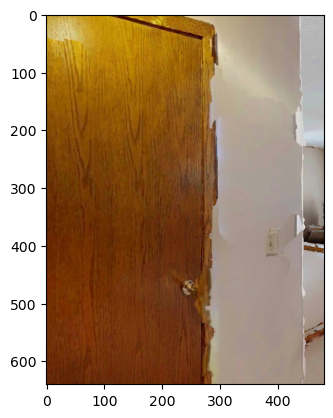

In [22]:
one_env.reset(0)
initial_state = AgentState()
initial_state.position = np.array([3.33,2.06,4.02])
initial_state.rotation = quat_from_angle_axis(0.51, np.array([0, -1, 0]))
root = reset_to_point(one_env, initial_state)
plt.imshow(root['rgb'])

# Sequence dataset

In [42]:
if NUM_ANCHORS % len(SCENES) != 0:
    warnings.warn("The number of anchors specified (%d) is not integer divisible by the number"
                  "of scenes (%d). To maintain dataset balance the number of anchors will"
                  "be reduced to (%d)" % (NUM_ANCHORS, len(SCENES), NUM_ANCHORS // len(SCENES)))
samples_per_scene = NUM_ANCHORS // len(SCENES)
annotations = {
    "data": [],
    "metadata": {
        "actions": ACTIONS,
        "max_steps": NUM_STEPS,
        "rotation_angle": ROT_ANGLE,
        "scenes": SCENES
    }
}

for scene in tqdm.tqdm([0]+eval_episodes):
    print(scene)
    one_env.reset(scene)
    rotations = np.arange(0, 2.0 * np.pi, ROT_ANGLE * 2.0 * np.pi / 360)
    #horizons = [0]
    #standing = [True]
    start_time = time.time()
    for i, point_agentcord in enumerate(np.random.permutation(one_env.sim.pathfinder.build_navmesh_vertices())):
        print(i)
        # try generating data until you have a complete validated tree
        validated_root = False
        # randomize scene
        one_env.reset(scene)
        # find a valid root
        num_valid_objects = 0
        for rotation in np.random.permutation(rotations):
            initial_state = AgentState()
            initial_state.position = np.array(point_agentcord)
            initial_state.rotation = quat_from_angle_axis(rotation, np.array([0, 1, 0]))
            backward_state = reset_to_point(one_env, initial_state)
            initial_state = one_env._sim.get_agent_state()
            instance_ids = sorted(np.unique(backward_state["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            print(instance_cats)
            instance_cats = np.array([obj_name_to_150ids[ii] for ii in instance_cats])
            #p = random.choice(one_env.step(action="GetReachablePositions").metadata["actionReturn"])
            #r = random.choice(rotations)
            #h = random.choice(horizons)
            #s = random.choice(standing)
            #root = teleport_to(one_env, {"pos": p, "rot": r, "hor": h, "stand": s})
            print(instance_cats)
            num_valid_objects = len(np.unique(instance_cats))
            if num_valid_objects > 8:
                break
            
        if num_valid_objects > 8:
            # generate data from this root
            print("Num valid objects", num_valid_objects)
            backward_state_id = pos_to_id(one_env._sim.get_agent_state())
            #seg_mask = np.vectorize(one_env.index_to_title_map.get)(one_env.sem_to_model)
            #seg_mask = np.vectorize(obj_name_to_40ids.get)(seg_mask)
            seg_mask = one_env.sem_to_model
            cats = np.unique(seg_mask)

            print(cats)
            masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
            areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
            instance_ids = sorted(np.unique(backward_state["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            instance_cats = [obj_name_to_150ids[ii] for ii in instance_cats]
            detections = {}
            for index, iid in enumerate(instance_ids):
                seg_value = iid

                segmentation = np.where(backward_state["instance"] == seg_value)

                # Bounding Box
                bbox = 0, 0, 0, 0
                if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                    x_min = int(np.min(segmentation[1]))
                    x_max = int(np.max(segmentation[1]))
                    y_min = int(np.min(segmentation[0]))
                    y_max = int(np.max(segmentation[0]))

                    bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                detections[str(iid)] = {
                    "category_id": instance_cats[index],
                    "bbox": bbox,
                }
            backward_state_state = {
                "pos": one_env._sim.get_agent_state().position,
                "rot": one_env._sim.get_agent_state().rotation,
                "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
                "seg_mask": one_env.sem_to_model,
                #"stand": state["stand"],
                "img": backward_state["rgb"],
                #"depth": root["depth"],
                "state": one_env._sim.get_agent_state(),
                #"objects": objects,
                #"masks": masks,
                #"areas": areas,
                "detections": detections,
                "actions": {}
            }
            root = take_step(one_env, initial_state, 'move_forward_waypoint')
            root_state = one_env._sim.get_agent_state()
            root_id = pos_to_id(one_env._sim.get_agent_state())
            state_table = {root_id: root}
            state_table[root_id]["actions"] = {}
            state_table[root_id]["actions"]['move_backward_waypoint'] = backward_state_id
            state_table[backward_state_id] = backward_state_state
            for action in ACTIONS:
                new_state = take_step(one_env, root_state, action)
                state_table[root_id]["actions"][action] = pos_to_id(new_state["state"])
                if pos_to_id(new_state["state"]) not in state_table:
                    state_table[pos_to_id(new_state["state"])] = new_state
                    state_table[pos_to_id(new_state["state"])]["actions"] = {}
            # check to see that all paths in this tree are at least as long as out max depth
            if len(state_table) == 6:
                validated_root = True
            #validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
        print(time.time() - start_time)
        if validated_root:
            print("Validated root")
            # save data
            scene_name = "{}_{:05d}".format(scene, i)
            os.makedirs("{}/{}".format(IMG_ROOT, scene_name), exist_ok=True)
            os.makedirs("{}_{}/{}".format(IMG_ROOT, "mask", scene_name), exist_ok=True)
            files = glob.glob("{}/{}/*".format(IMG_ROOT, scene_name))
            for f in files:
                os.remove(f)
            files = glob.glob("{}_{}/{}/*".format(IMG_ROOT, "mask", scene_name))
            for f in files:
                os.remove(f)   
            for state, values in state_table.items():
                cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT, scene_name, pos_to_id(values["state"])), values["img"])
                cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
            # reformat state table into dataset format
            light_state_table = {}
            for name, fields in state_table.items():
                light_state_table[name] = {
                    "pos": fields["pos"].tolist(),
                    "rot": quat_to_coeffs(fields["rot"]).tolist(),
                    "hor": quat_to_coeffs(fields["hor"]).tolist(),
                    #"stand": fields["stand"],
                    "detections": fields["detections"],
                    "actions": fields["actions"]
                }
            annotations["data"].append({
                "scene_name": scene_name,
                "state_table": light_state_table,
                "root": root_id
            })
        print(time.time() - start_time)
        if i > (samples_per_scene):
            break
# save annotations
with open(ANN_PATH, 'w') as f:
    json.dump(annotations, f)

  0%|          | 0/145 [00:00<?, ?it/s]

0
0
['unlabeled' 'wall' 'chair' 'chair' 'ceiling']
[255   0  19  19   5]
['unlabeled' 'door' 'wall' 'chair' 'wall' 'door' 'floor' 'rug' 'wall'
 'door' 'wall' 'ceiling' 'stairs' 'wall' 'stairs' 'stairs'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'wall'
 'wall' 'wall' 'wall' 'ceiling' 'floor']
[255  14   0  19   0  14   3  28   0  14   0   5  53   0  53  53  95   0
   0   0   0   0   5   3]
Num valid objects 9
[  0   3   5  14  19  28  53  95 255]
8.508907079696655
Validated root
8.564672946929932
1
['door' 'wall' 'wall']
[14  0  0]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'wall' 'floor' 'ceiling' 'wall' 'ceiling'
 'lamp' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'stairs' 'stairs' 'stairs' 'stairs' 'stairs' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'wall'
 'wall']
[255   0   0   0   3   5   0   5  36   0  95  53  53  53  53  53   0  95
   0   0   0]
['unlabeled' 'wall' 'wall' 'wall' 'window' 'window' 'wall' 'wall' 'floor

  1%|          | 1/145 [07:25<17:50:05, 445.87s/it]

442.0435984134674
Validated root
442.09961223602295
49998
0
['unlabeled' 'wall' 'chest of drawers, chest, bureau, dresser' 'lamp'
 'ceiling' 'fan' 'window' 'curtain' 'curtain' 'curtain' 'bed' 'cushion'
 'floor']
[255   0  44  36   5 139   8  18  18  18   7  39   3]
Num valid objects 11
[  0   3   5   7   8  18  36  39  44 139 255]
6.373422622680664
Validated root
6.435539484024048
1
['unlabeled' 'wall' 'wall' 'ceiling' 'floor' 'wall' 'wall' 'wall'
 'painting, picture' 'ottoman, pouf, pouffe, puff, hassock' 'door' 'door'
 'microwave' 'ceiling' 'floor' 'wall' 'mirror' 'ceiling' 'floor' 'wall'
 'wall' 'wall' 'wall' 'wall']
[255   0   0   5   3   0   0   0  22  97  14  14 124   5   3   0  27   5
   3   0   0   0   0   0]
Num valid objects 9
[  0   3   5  14  22  27  97 124 255]
12.829665422439575
Validated root
12.893776655197144
2
['unlabeled' 'door' 'door']
[255  14  14]
['wall']
[0]
['unlabeled' 'floor' 'door' 'door' 'door' 'wall' 'wall'
 'toilet, can, commode, crapper, pot, potty, stoo

  1%|▏         | 2/145 [13:17<15:30:29, 390.42s/it]

346.09767961502075
346.0980067253113
99996
0
['unlabeled' 'floor' 'ceiling' 'wall' 'door' 'door' 'door' 'wall' 'wall'
 'door' 'ceiling' 'poster, posting, placard, notice, bill, card' 'floor'
 'door' 'wall' 'mirror' 'plaything, toy' 'chair' 'wall' 'floor' 'door'
 'wall' 'ceiling']
[255   3   5   0  14  14  14   0   0  14   5 100   3  14   0  27 108  19
   0   3  14   0   5]
Num valid objects 9
[  0   3   5  14  19  27 100 108 255]
11.265666723251343
Validated root
11.326939821243286
1
['unlabeled' 'floor' 'ceiling' 'wall' 'unlabeled' 'lamp' 'lamp' 'lamp'
 'lamp' 'lamp' 'rock, stone' 'plaything, toy' 'plaything, toy'
 'plaything, toy' 'plaything, toy' 'plaything, toy' 'computer'
 'case, display case, showcase, vitrine' 'shelf' 'box' 'box' 'box' 'box'
 'case, display case, showcase, vitrine'
 'case, display case, showcase, vitrine' 'unlabeled' 'unlabeled'
 'unlabeled' 'book' 'signboard, sign' 'book' 'book' 'book' 'book' 'book'
 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book

  2%|▏         | 3/145 [23:37<19:31:51, 495.15s/it]

606.9708514213562
Validated root
607.0335559844971
149996
0
['unlabeled' 'ceiling' 'wall' 'wall' 'lamp' 'lamp' 'lamp' 'lamp' 'lamp'
 'floor' 'wall' 'door' 'ceiling' 'floor' 'wall' 'wall']
[255   5   0   0  36  36  36  36  36   3   0  14   5   3   0   0]
['unlabeled' 'ceiling' 'wall' 'cabinet' 'ceiling' 'floor' 'wall' 'wall']
[255   5   0  10   5   3   0   0]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'door' 'lamp' 'lamp' 'wall']
[255   5   0   0   0  14  36  36   0]
['unlabeled' 'door' 'ceiling' 'floor' 'wall' 'window' 'wall' 'wall' 'wall'
 'wall' 'wall' 'ceiling' 'lamp' 'lamp' 'lamp' 'table' 'chair' 'chair'
 'basket, handbasket' 'unlabeled']
[255  14   5   3   0   8   0   0   0   0   0   5  36  36  36  15  19  19
 112 255]
Num valid objects 10
[  0   3   5   8  14  15  19  36 112 255]
8.134690999984741
8.134797096252441
1
['unlabeled' 'window' 'wall' 'shelf' 'shelf' 'unlabeled' 'unlabeled'
 'unlabeled' 'unlabeled' 'window']
[255   8   0  24  24 255 255 255 255   8]
['unlabeled' 'ceil

  3%|▎         | 4/145 [30:22<18:00:18, 459.70s/it]

['unlabeled' 'window' 'wall' 'wall']
[255   8   0   0]
390.34664368629456
390.3466558456421
199996
0
['unlabeled' 'wall' 'lamp' 'mirror' 'bed' 'towel' 'plant' 'door' 'curtain'
 'wall' 'ceiling' 'floor' 'wardrobe, closet, press']
[255   0  36  27   7  81  17  14  18   0   5   3  35]
Num valid objects 12
[  0   3   5   7  14  17  18  27  35  36  81 255]
8.48590636253357
Validated root
8.542475938796997
1
['unlabeled' 'ceiling' 'wall' 'ceiling' 'wall' 'cabinet' 'sink' 'sink'
 'wall' 'wall' 'wall' 'mirror' 'wall' 'wall' 'floor']
[255   5   0   5   0  10  47  47   0   0   0  27   0   0   3]
['unlabeled' 'door' 'wall' 'wall' 'wall']
[255  14   0   0   0]
['unlabeled' 'cabinet' 'sink' 'wall' 'wall' 'wall' 'wall' 'mirror' 'wall'
 'ceiling' 'wall' 'door']
[255  10  47   0   0   0   0  27   0   5   0  14]
['unlabeled' 'wall' 'door' 'wall' 'wall' 'wall' 'wall' 'door' 'floor'
 'chair' 'floor' 'door' 'door' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'wall' 'wall' 'wall' 'ceiling' 'floor' 'lamp' 'wa

  3%|▎         | 5/145 [38:44<18:28:14, 474.96s/it]

491.4651381969452
Validated root
491.52443528175354
249994
0
['unlabeled' 'shower']
[255 145]
['shower']
[145]
['shower']
[145]
['unlabeled' 'wall' 'shower']
[255   0 145]
['unlabeled' 'shower' 'wall']
[255 145   0]
['shower']
[145]
['shower']
[145]
['unlabeled' 'floor' 'ceiling' 'mirror' 'mirror' 'shower' 'shower'
 'column, pillar']
[255   3   5  27  27 145 145  42]
['unlabeled' 'seat' 'floor' 'ceiling' 'wall' 'wall' 'mirror' 'mirror'
 'shower' 'column, pillar' 'window']
[255  31   3   5   0   0  27  27 145  42   8]
Num valid objects 9
[  0   3   5   8  27  31  42 145 255]
8.917766809463501
8.917882680892944
1
['unlabeled' 'wall' 'shower']
[255   0 145]
['wall']
[0]
['unlabeled' 'wall' 'shower']
[255   0 145]
['unlabeled' 'floor' 'ceiling' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'wall' 'wall' 'door' 'door' 'door' 'door' 'sofa' 'seat' 'wall' 'door'
 'door' 'door']
[255   3   5   5   0   0   0   0   0   0  14  14  14  14  23  31   0  14
  14  14]
['unlabeled' 'wall' 'door']
[255   0  14]

  4%|▍         | 6/145 [44:57<17:00:01, 440.30s/it]

348.17286920547485
348.1729874610901
299994
0
['unlabeled' 'wall' 'wall' 'blind, screen' 'ceiling' 'ceiling' 'ceiling'
 'ceiling' 'lamp' 'sofa' 'wall' 'ceiling' 'ceiling' 'ceiling' 'ceiling'
 'ceiling' 'clock' 'dishwasher' 'cabinet' 'vase' 'sconce' 'vase' 'plant'
 'wall' 'floor']
[255   0   0  63   5   5   5   5  36  23   0   5   5   5   5   5 148 129
  10 135 134 135  17   0   3]
Num valid objects 13
[  0   3   5  10  17  23  36  63 129 134 135 148 255]
7.487091541290283
7.487210512161255
1
['unlabeled' 'wall' 'wall' 'wall']
[255   0   0   0]
['unlabeled' 'wall' 'wall' 'window']
[255   0   0   8]
['unlabeled' 'wall' 'wall' 'blind, screen' 'window' 'ceiling' 'ceiling'
 'ceiling' 'wall' 'wall' 'wall' 'wall' 'wall' 'lamp' 'coffee table' 'sofa'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'basket, handbasket'
 'plant' 'table' 'chair' 'floor' 'computer']
[255   0   0  63   8   5   5   5   0   0   0   0   0  36  64  23  39  39
  39  39  39 112  17  15  19   3  74]
Num valid objects 15

  5%|▍         | 7/145 [51:55<16:35:57, 433.02s/it]

409.4063696861267
Validated root
409.4624671936035
349994
0
['unlabeled' 'lamp' 'painting, picture' 'wall' 'wall']
[255  36  22   0   0]
['unlabeled' 'painting, picture' 'book' 'book' 'book' 'vase' 'unlabeled'
 'bookcase' 'ceiling' 'wall' 'floor' 'door' 'cabinet' 'cabinet'
 'dishwasher' 'window' 'counter' 'counter' 'kitchen island' 'unlabeled'
 'floor' 'signboard, sign' 'wall' 'wall' 'ceiling']
[255  22  67  67  67 135 255  62   5   0   3  14  10  10 129   8  45  45
  73 255   3  43   0   0   5]
Num valid objects 15
[  0   3   5   8  10  14  22  43  45  62  67  73 129 135 255]
10.067263841629028
Validated root
10.125723600387573
1
['unlabeled' 'poster, posting, placard, notice, bill, card' 'wall']
[255 100   0]
['unlabeled' 'sofa' 'poster, posting, placard, notice, bill, card'
 'window' 'wall' 'mirror']
[255  23 100   8   0  27]
['unlabeled' 'tv' 'wall']
[255  89   0]
['unlabeled' 'refrigerator, icebox' 'lamp' 'plaything, toy'
 'plaything, toy' 'flag' 'armchair' 'sofa' 'window' 'ceilin

  6%|▌         | 8/145 [1:00:39<17:34:37, 461.88s/it]

['unlabeled' 'bottle' 'bottle' 'bottle' 'bottle' 'bottle' 'box' 'box'
 'box' 'washer, automatic washer, washing machine'
 'washer, automatic washer, washing machine' 'shelf' 'wall' 'wall']
[255  98  98  98  98  98  41  41  41 107 107  24   0   0]
510.72627329826355
510.7262861728668
399992
0
['unlabeled' 'wall' 'sofa' 'door' 'floor' 'wall' 'unlabeled' 'shelf'
 'wall' 'wall' 'door' 'wall' 'door' 'wall' 'cabinet' 'book' 'book'
 'unlabeled' 'unlabeled' 'lamp' 'unlabeled' 'wardrobe, closet, press']
[255   0  23  14   3   0 255  24   0   0  14   0  14   0  10  67  67 255
 255  36 255  35]
Num valid objects 10
[  0   3  10  14  23  24  35  36  67 255]
4.879928112030029
4.880282640457153
1
['wall' 'stairs']
[ 0 53]
['unlabeled' 'wall' 'wall' 'wall' 'door' 'door']
[255   0   0   0  14  14]
['unlabeled' 'wall' 'painting, picture' 'wall' 'painting, picture'
 'step, stair' 'floor' 'ceiling' 'wall' 'cabinet' 'painting, picture'
 'painting, picture' 'painting, picture' 'sconce']
[255   0  22   0  2

  6%|▌         | 9/145 [1:05:30<15:26:01, 408.54s/it]

279.1520822048187
279.1521956920624
449990
0
['unlabeled' 'wall' 'wall' 'ceiling' 'table' 'dishwasher']
[255   0   0   5  15 129]
['unlabeled' 'wall' 'wall' 'wall' 'ceiling' 'wall' 'cabinet' 'computer']
[255   0   0   0   5   0  10  74]
['unlabeled' 'floor' 'ceiling' 'ceiling' 'wall' 'wall' 'wall' 'chandelier'
 'sofa' 'cushion' 'cushion' 'table' 'rug' 'computer' 'curtain' 'window'
 'window' 'curtain' 'curtain' 'window' 'window' 'curtain' 'shelf'
 'cabinet' 'computer' 'door']
[255   3   5   5   0   0   0  85  23  39  39  15  28  74  18   8   8  18
  18   8   8  18  24  10  74  14]
Num valid objects 15
[  0   3   5   8  10  14  15  18  23  24  28  39  74  85 255]
8.264816284179688
Validated root
8.324712753295898
1
['unlabeled' 'floor' 'ceiling' 'wall' 'sofa' 'computer' 'dishwasher']
[255   3   5   0  23  74 129]
['unlabeled' 'floor' 'ceiling' 'wall' 'sofa' 'computer' 'box' 'wall'
 'curtain' 'window' 'window' 'wall' 'stairs']
[255   3   5   0  23  74  41   0  18   8   8   0  53]
Num vali

  7%|▋         | 10/145 [1:12:04<15:09:16, 404.12s/it]

387.6619095802307
Validated root
387.7213146686554
499988
0
['unlabeled' 'ceiling' 'window' 'window' 'wall' 'trash can'
 'basket, handbasket' 'wall' 'floor' 'light' 'ceiling' 'wall' 'wall'
 'window' 'window' 'shelf' 'computer' 'wall' 'column, pillar' 'computer'
 'sink' 'sink' 'shelf' 'countertop' 'cabinet' 'cabinet' 'cabinet' 'floor']
[255   5   8   8   0 138 112   0   3  82   5   0   0   8   8  24  74   0
  42  74  47  47  24  70  10  10  10   3]
Num valid objects 14
[  0   3   5   8  10  24  42  47  70  74  82 112 138 255]
6.903709888458252
Validated root
6.963259935379028
1
['unlabeled' 'computer' 'computer' 'light' 'light' 'light' 'light' 'light'
 'ceiling' 'computer' 'shelf' 'wall' 'sink' 'light' 'signboard, sign'
 'signboard, sign' 'signboard, sign' 'clothes' 'clothes'
 'base, pedestal, stand' 'base, pedestal, stand' 'wall' 'shelf' 'computer'
 'sink' 'sink' 'sink' 'sink' 'sink' 'sink' 'towel' 'bottle' 'sink' 'box'
 'column, pillar' 'monitor' 'computer' 'computer' 'sink' 'shelf'
 

  8%|▊         | 11/145 [1:18:17<14:41:18, 394.61s/it]

364.706848859787
364.70696663856506
549988
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'sconce' 'sconce'
 'painting, picture' 'curtain' 'sconce' 'sconce' 'sconce' 'ceiling'
 'clothes' 'floor' 'door' 'wall' 'wall' 'cabinet' 'sculpture' 'cabinet'
 'cabinet' 'cabinet' 'rug' 'floor' 'crt screen' 'crt screen' 'crt screen'
 'crt screen']
[255   0   0   0   0  22  22  22  22  22  22 134 134  22  18 134 134 134
   5  92   3  14   0   0  10 132  10  10  10  28   3 141 141 141 141]
Num valid objects 13
[  0   3   5  10  14  18  22  28  92 132 134 141 255]
5.951726913452148
Validated root
6.011467218399048
1
['unlabeled' 'wall' 'wall' 'painting, picture' 'bulletin board' 'cabinet'
 'cabinet' 'book' 'floor' 'door' 'cabinet' 'wall' 'bar' 'window' 'curtain'
 'curtain' 'cabinet' 'cabinet' 'floor' 'crt screen' 'crt screen'
 'crt screen' 'crt screen' 'crt screen' 'crt screen' 'crt sc

  8%|▊         | 12/145 [1:23:52<13:54:30, 376.47s/it]

326.0767343044281
Validated root
326.13488602638245
599988
0
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'radiator' 'door' 'ceiling'
 'floor' 'door']
[255   3   0   0   0 146  14   5   3  14]
['unlabeled' 'wall' 'wall' 'radiator' 'door' 'ceiling']
[255   0   0 146  14   5]
['unlabeled' 'wall' 'clock' 'stairs' 'ceiling' 'shower' 'door' 'floor'
 'shower']
[255   0 148  53   5 145  14   3 145]
['unlabeled' 'door' 'door' 'door' 'wall' 'stairs' 'stairs' 'wall']
[255  14  14  14   0  53  53   0]
['unlabeled' 'wall' 'wall' 'door' 'stairs' 'ceiling' 'shower' 'shower'
 'shower' 'shower' 'door' 'floor'
 'washer, automatic washer, washing machine'
 'washer, automatic washer, washing machine' 'shower']
[255   0   0  14  53   5 145 145 145 145  14   3 107 107 145]
['unlabeled' 'wall' 'wall' 'ceiling' 'wall' 'cabinet' 'door' 'sculpture'
 'door' 'window' 'wall' 'door']
[255   0   0   5   0  10  14 132  14   8   0  14]
['unlabeled' 'wall' 'wall' 'ceiling' 'wall' 'cabinet' 'door' 'sculpture'
 'door' 'doo

  9%|▉         | 13/145 [1:30:32<14:03:58, 383.63s/it]

392.5432617664337
392.5434286594391
649986
0
['unlabeled' 'wall' 'door' 'door' 'table' 'cabinet' 'floor' 'wall' 'wall'
 'door' 'wall' 'door' 'door' 'door' 'floor' 'door' 'floor' 'wall' 'wall'
 'wall' 'door' 'wall' 'wall' 'ceiling' 'wall' 'wall' 'shelf' 'towel'
 'towel' 'towel' 'towel' 'plant' 'ceiling' 'wall' 'floor']
[255   0  14  14  15  10   3   0   0  14   0  14  14  14   3  14   3   0
   0   0  14   0   0   5   0   0  24  81  81  81  81  17   5   0   3]
Num valid objects 10
[  0   3   5  10  14  15  17  24  81 255]
6.580597162246704
Validated root
6.637405157089233
1
['unlabeled' 'wall' 'window' 'blind, screen' 'blind, screen' 'ceiling']
[255   0   8  63  63   5]
['unlabeled' 'wall' 'table' 'lamp' 'cabinet' 'computer' 'chandelier'
 'chandelier' 'table' 'chair' 'floor' 'door' 'floor' 'wall' 'ceiling'
 'lamp' 'wall' 'shelf' 'clothes' 'cushion' 'clothes' 'towel' 'towel'
 'towel' 'towel' 'plant' 'stool' 'mirror' 'floor' 'ceiling'
 'refrigerator, icebox' 'floor']
[255   0  15  36  10  

 10%|▉         | 14/145 [1:36:35<13:43:31, 377.19s/it]

354.1914792060852
Validated root
354.2515678405762
699984
0
['unlabeled' 'ceiling' 'door' 'door' 'cabinet' 'wall']
[255   5  14  14  10   0]
['unlabeled' 'door' 'bottle' 'bottle' 'bottle' 'unlabeled' 'unlabeled'
 'towel' 'wall' 'cabinet' 'oven' 'counter']
[255  14  98  98  98 255 255  81   0  10 118  45]
['unlabeled' 'window' 'window' 'ceiling' 'painting, picture' 'door'
 'cabinet' 'chandelier' 'wall' 'stairway, staircase' 'door' 'wall' 'table'
 'chair' 'chair' 'chair' 'chair' 'chair' 'floor' 'unlabeled'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'sculpture' 'window' 'desk' 'curtain' 'ceiling'
 'painting, picture' 'painting, picture'
 'poster, posting, placard, notice, bill, card' 'door' 'wall' 'wall'
 'chair' 'chair' 'floor' 'counter']
[255   8   8   5  22  14  10  85   0  59  14   0  15  19  19  19  19  19
   3 255  22  22  22  22 132   8  33  18   5  22  22 100  14   0   0  19
  19   3  45]
Num valid objects 17
[  0   3   5   8  10  14  15  18 

 10%|█         | 15/145 [1:42:28<13:21:44, 370.04s/it]

341.764279127121
341.7644407749176
749982
0
['unlabeled' 'ceiling' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'wall' 'bench' 'wall' 'plant' 'wall' 'column, pillar'
 'window' 'window' 'ceiling' 'wall' 'floor' 'ceiling' 'bottle' 'bottle'
 'bottle' 'plant' 'unlabeled' 'unlabeled' 'unlabeled' 'bottle' 'bottle'
 'bottle' 'bottle' 'bottle' 'bottle' 'bottle' 'bottle' 'oven' 'unlabeled'
 'bottle' 'bottle' 'bottle' 'bottle' 'glass, drinking glass' 'unlabeled'
 'unlabeled' 'clothes' 'clothes' 'sink' 'unlabeled' 'unlabeled' 'computer'
 'shelf' 'countertop' 're

 11%|█         | 16/145 [1:47:34<12:34:13, 350.81s/it]

297.6549355983734
Validated root
297.7133045196533
799982
0
['unlabeled' 'wall' 'shelf' 'shelf' 'cabinet']
[255   0  24  24  10]
['wall' 'cabinet']
[ 0 10]
['wall' 'cabinet']
[ 0 10]
['unlabeled' 'wall' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling' 'clock'
 'window' 'window' 'window'
 'bannister, banister, balustrade, balusters, handrail'
 'hood, exhaust hood' 'countertop' 'oven' 'stove' 'bulletin board' 'sink'
 'dishwasher' 'dishwasher' 'shelf' 'shelf' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'cabinet' 'cabinet']
[255   0   0   0   0  95   5 148   8   8   8  95 133  70 118  71 144  47
 129 129  24  24  10  10  10  10  10  10  10  10  10  10  10  10  10]
Num valid objects 15
[  0   5   8  10  24  47  70  71  95 118 129 133 144 148 255]
10.939472913742065
Validated root
10.99670147895813
1
['unlabeled' 'wall' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, h

 12%|█▏        | 17/145 [1:55:43<13:56:28, 392.10s/it]

480.15994143486023
Validated root
480.2216076850891
849980
0
['unlabeled' 'wall' 'vase' 'door']
[255   0 135  14]
['unlabeled' 'wall' 'ceiling' 'wall' 'door']
[255   0   5   0  14]
['unlabeled' 'wall' 'door' 'floor' 'wall' 'wall' 'wall' 'wall' 'ceiling'
 'lamp' 'wall' 'rug' 'bed' 'desk' 'chair' 'ceiling' 'bookcase' 'wall'
 'door' 'wall' 'stove']
[255   0  14   3   0   0   0   0   5  36   0  28   7  33  19   5  62   0
  14   0  71]
Num valid objects 12
[  0   3   5   7  14  19  28  33  36  62  71 255]
7.071811676025391
Validated root
7.127729892730713
1
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'window' 'curtain' 'shelf'
 'clock' 'trash can' 'shelf']
[255   3   0   0   5   8  18  24 148 138  24]
Num valid objects 9
[  0   3   5   8  18  24 138 148 255]
13.618408679962158
13.618527173995972
2
['wall' 'window']
[0 8]
['unlabeled' 'wall' 'mirror' 'sink' 'mirror']
[255   0  27  47  27]
['unlabeled' 'wall' 'mirror' 'lamp' 'bottle' 'cabinet' 'unlabeled'
 'unlabeled' 'sink' 'sink' 'tank, st

 12%|█▏        | 18/145 [2:02:08<13:45:59, 390.24s/it]

373.912549495697
Validated root
373.9690442085266
899978
0
['unlabeled' 'basket, handbasket' 'wall' 'refrigerator, icebox']
[255 112   0  50]
['unlabeled' 'wall' 'refrigerator, icebox']
[255   0  50]
['unlabeled' 'cabinet' 'cabinet' 'cabinet' 'plant' 'microwave' 'wall'
 'dishwasher' 'stove' 'oven' 'window' 'window' 'window' 'window' 'sink'
 'counter' 'counter' 'cabinet' 'bottle' 'unlabeled']
[255  10  10  10  17 124   0 129  71 118   8   8   8   8  47  45  45  10
  98 255]
Num valid objects 12
[  0   8  10  17  45  47  71  98 118 124 129 255]
4.822147369384766
Validated root
4.88226056098938
1
['unlabeled' 'ceiling' 'painting, picture' 'painting, picture' 'lamp'
 'flower' 'vase' 'cabinet' 'bed' 'wall']
[255   5  22  22  36  66 135  10   7   0]
Num valid objects 9
[  0   5   7  10  22  36  66 135 255]
9.124406576156616
Validated root
9.184641361236572
2
['unlabeled' 'table' 'wall' 'door']
[255  15   0  14]
['unlabeled' 'ceiling' 'lamp' 'rug' 'wall' 'wall' 'lamp' 'computer'
 'table' 'sea

 13%|█▎        | 19/145 [2:06:17<12:10:18, 347.76s/it]

243.4211347103119
Validated root
243.4810688495636
949976
0
['unlabeled' 'wall' 'window' 'armchair' 'window']
[255   0   8  30   8]
['unlabeled' 'wall' 'window' 'window' 'wall' 'stairs' 'floor' 'door'
 'ceiling' 'wall' 'wall' 'wall' 'floor' 'door' 'wall' 'floor' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'ceiling' 'cabinet'
 'computer' 'tv' 'door' 'door' 'unlabeled' 'painting, picture']
[255   0   8   8   0  53   3  14   5   0   0   0   3  14   0   3   0   0
   0   0   0   0   5   5  10  74  89  14  14 255  22]
Num valid objects 11
[  0   3   5   8  10  14  22  53  74  89 255]
5.546985149383545
Validated root
5.602769136428833
1
['unlabeled' 'wall' 'door' 'door']
[255   0  14  14]
['unlabeled' 'wall' 'door' 'wall' 'floor' 'wall' 'ceiling' 'ceiling'
 'window' 'window' 'window' 'window' 'window' 'bed' 'chair' 'door' 'door'
 'lamp']
[255   0  14   0   3   0   5   5   8   8   8   8   8   7  19  14  14  36]
Num valid objects 9
[  0   3   5   7   8  14  19  36 255]
11.0310201644897

 14%|█▍        | 20/145 [2:11:12<11:31:16, 331.81s/it]

285.40634989738464
285.40665888786316
999974
0
['unlabeled' 'wall' 'stairs' 'ceiling' 'wall' 'wall' 'wall' 'window'
 'wardrobe, closet, press' 'ceiling' 'wall' 'painting, picture' 'floor'
 'wardrobe, closet, press' 'bookcase' 'bookcase' 'bookcase' 'bookcase'
 'bookcase' 'bookcase' 'table' 'bookcase' 'bookcase' 'bookcase' 'bookcase'
 'unlabeled' 'book' 'cabinet' 'bookcase' 'bookcase' 'bookcase' 'bookcase'
 'bookcase' 'bookcase' 'bookcase' 'bookcase' 'bookcase' 'bookcase'
 'bookcase' 'bookcase' 'bookcase' 'bookcase' 'bookcase' 'book' 'box' 'box'
 'wall' 'book' 'unlabeled' 'bag' 'book' 'book' 'book' 'book' 'sofa'
 'cushion' 'book' 'book' 'book' 'book' 'door']
[255   0  53   5   0   0   0   8  35   5   0  22   3  35  62  62  62  62
  62  62  15  62  62  62  62 255  67  10  62  62  62  62  62  62  62  62
  62  62  62  62  62  62  62  67  41  41   0  67 255 115  67  67  67  67
  23  39  67  67  67  67  14]
Num valid objects 17
[  0   3   5   8  10  14  15  22  23  35  39  41  53  62  67 115 

 14%|█▍        | 21/145 [2:17:20<11:48:30, 342.83s/it]

359.9860939979553
359.9862337112427
1049974
0
['wall']
[0]
['unlabeled' 'wall' 'trash can' 'unlabeled' 'wall']
[255   0 138 255   0]
['unlabeled' 'floor' 'ceiling' 'wall' 'stairs'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling' 'floor'
 'wall' 'column, pillar' 'column, pillar'
 'washer, automatic washer, washing machine'
 'pool table, billiard table, snooker table' 'radiator' 'radiator'
 'radiator' 'radiator' 'radiator' 'unlabeled' 'unlabeled' 'unlabeled'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'lamp']
[255   3   5   0  53  95   5   3   0  42  42 107  56 146 146 146 146 146
 255 255 255 255 255 255 255 255  36]
Num valid objects 11
[  0   3   5  36  42  53  56  95 107 146 255]
6.544010877609253
Validated root
6.601920127868652
1
['unlabeled' 'door' 'window' 'glass, drinking glass'
 'glass, drinking glass' 'glass, drinking glass']
[255  14   8 147 147 147]
['unlabeled' 'floor' 'wall' 'wall' 'stool' 'chair' 'chair' 'ceiling']
[255   3   0   0 110  1

 15%|█▌        | 22/145 [2:22:50<11:34:37, 338.84s/it]

320.76180696487427
320.7621145248413
1099974
0
['unlabeled' 'wall' 'wall' 'wall' 'window' 'wall' 'lamp']
[255   0   0   0   8   0  36]
['unlabeled' 'wall' 'screen door, screen' 'window' 'window'
 'blind, screen' 'blind, screen' 'wall' 'wall' 'wall' 'ceiling' 'wall'
 'cushion' 'cushion' 'lamp' 'ceiling' 'computer' 'window']
[255   0  58   8   8  63  63   0   0   0   5   0  39  39  36   5  74   8]
Num valid objects 9
[  0   5   8  36  39  58  63  74 255]
5.72479772567749
Validated root
5.7843804359436035
1
['unlabeled' 'kitchen island' 'plant' 'wall' 'ceiling' 'wall' 'wall'
 'cabinet' 'cabinet' 'cabinet' 'countertop' 'computer' 'bottle' 'vase'
 'plate' 'stove' 'oven' 'cabinet' 'cabinet' 'dishwasher' 'floor' 'lamp'
 'ceiling' 'lamp' 'wall' 'wall' 'wall' 'wall' 'door']
[255  73  17   0   5   0   0  10  10  10  70  74  98 135 142  71 118  10
  10 129   3  36   5  36   0   0   0   0  14]
Num valid objects 17
[  0   3   5  10  14  17  36  70  71  73  74  98 118 129 135 142 255]
11.14729356765

 16%|█▌        | 23/145 [2:27:54<11:07:37, 328.34s/it]

295.2366626262665
Validated root
295.29411578178406
1149972
0
['unlabeled' 'wall' 'floor' 'wall' 'wall' 'sconce' 'door' 'lamp']
[255   0   3   0   0 134  14  36]
['unlabeled' 'floor' 'wall' 'door' 'painting, picture' 'window' 'sconce'
 'door']
[255   3   0  14  22   8 134  14]
['unlabeled' 'wall' 'door']
[255   0  14]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'stairs' 'ceiling'
 'door' 'floor' 'wall' 'cabinet' 'mirror' 'door' 'ceiling' 'floor' 'wall'
 'wall' 'bed' 'curtain' 'fan' 'door' 'door' 'ceiling']
[255   0   0   0   0   0   0  53   5  14   3   0  10  27  14   5   3   0
   0   7  18 139  14  14   5]
Num valid objects 11
[  0   3   5   7  10  14  18  27  53 139 255]
5.719423055648804
Validated root
5.778394460678101
1
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'door' 'door' 'computer'
 'ceiling' 'computer' 'wall' 'cabinet' 'sink' 'mirror' 'lamp' 'door'
 'floor' 'wall' 'wall' 'table' 'unlabeled' 'lamp' 'rug' 'bed' 'mirror'
 'unlabeled' 'vase' 'door' 'ceiling' 'cushion']

 17%|█▋        | 24/145 [2:32:40<10:36:42, 315.72s/it]

278.0184655189514
278.018607378006
1199970
0
['wall']
[0]
['unlabeled' 'radiator' 'chandelier' 'blind, screen' 'wall' 'ceiling'
 'ceiling' 'floor' 'tub' 'floor' 'wall' 'wall' 'wall' 'wall' 'door' 'door'
 'radiator' 'door' 'radiator' 'radiator' 'wall' 'ceiling' 'cabinet'
 'cabinet' 'radiator' 'radiator' 'radiator' 'wall' 'wall' 'unlabeled'
 'wall' 'wall' 'wall' 'ceiling' 'bar' 'wall' 'wall' 'ceiling' 'sink'
 'sink']
[255 146  85  63   0   5   5   3  37   3   0   0   0   0  14  14 146  14
 146 146   0   5  10  10 146 146 146   0   0 255   0   0   0   5  77   0
   0   5  47  47]
Num valid objects 12
[  0   3   5  10  14  37  47  63  77  85 146 255]
4.4535605907440186
Validated root
4.5097033977508545
1
['unlabeled' 'floor' 'door' 'wall' 'radiator' 'window' 'window' 'wall'
 'wall' 'ceiling' 'wall']
[255   3  14   0 146   8   8   0   0   5   0]
['wall']
[0]
['unlabeled' 'wall']
[255   0]
['door' 'door' 'wall']
[14 14  0]
['unlabeled' 'door' 'door' 'wall']
[255  14  14   0]
['unlabeled' 'flo

 17%|█▋        | 25/145 [2:37:08<10:02:56, 301.47s/it]

254.61589217185974
254.61600637435913
1249971
0
['unlabeled' 'sofa' 'door' 'wall' 'door' 'table' 'chair' 'chair' 'chair'
 'ceiling' 'wall' 'lamp']
[255  23  14   0  14  15  19  19  19   5   0  36]
['unlabeled' 'wall' 'painting, picture' 'towel' 'towel' 'wall' 'mirror'
 'counter' 'sink']
[255   0  22  81  81   0  27  45  47]
['unlabeled' 'ceiling' 'refrigerator, icebox' 'cabinet' 'kitchen island'
 'bulletin board' 'cabinet' 'cabinet' 'door' 'ceiling' 'lamp' 'floor'
 'door' 'wall' 'painting, picture' 'door' 'table' 'chair' 'chair' 'chair'
 'floor' 'rug' 'ceiling' 'lamp']
[255   5  50  10  73 144  10  10  14   5  36   3  14   0  22  14  15  19
  19  19   3  28   5  36]
Num valid objects 14
[  0   3   5  10  14  15  19  22  28  36  50  73 144 255]
9.81507158279419
Validated root
9.876122236251831
1
['wall']
[0]
['unlabeled' 'window' 'bar' 'wall' 'bed' 'cushion' 'cushion' 'ceiling']
[255   8  77   0   7  39  39   5]
['unlabeled' 'cabinet' 'bottle' 'bottle' 'bottle' 'bottle' 'door' 'door'
 '

 18%|█▊        | 26/145 [2:45:47<12:07:00, 366.56s/it]

505.9154601097107
Validated root
505.97435665130615
1299969
0
['unlabeled' 'wall' 'wall' 'ceiling' 'painting, picture'
 'painting, picture' 'cabinet' 'floor' 'wall' 'wall' 'door' 'ceiling'
 'door' 'floor' 'wall' 'floor']
[255   0   0   5  22  22  10   3   0   0  14   5  14   3   0   3]
['unlabeled' 'wall' 'wall' 'ceiling' 'painting, picture' 'window'
 'blind, screen' 'window' 'window' 'window' 'window' 'window' 'window'
 'plant' 'tv' 'tv' 'vase' 'lamp' 'armchair' 'sofa' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'floor' 'rug']
[255   0   0   5  22   8  63   8   8   8   8   8   8  17  89  89 135  36
  30  23  39  39  39  39  39   3  28]
Num valid objects 15
[  0   3   5   8  17  22  23  28  30  36  39  63  89 135 255]
5.782491683959961
Validated root
5.839699029922485
1
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'cabinet' 'cabinet' 'ceiling'
 'hood, exhaust hood' 'shelf' 'counter' 'counter' 'book' 'counter' 'stove'
 'oven' 'cabinet']
[255   0   0   0   0  10  10   5 133  24  45  4

 19%|█▊        | 27/145 [2:50:59<11:28:44, 350.20s/it]

302.59298300743103
302.5930907726288
1349967
0
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'armchair' 'bar'
 'curtain' 'ceiling' 'wall' 'door' 'wall' 'floor' 'door']
[255   3   0   0   0   0  30  77  18   5   0  14   0   3  14]
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'bed' 'cabinet' 'box'
 'cabinet' 'unlabeled' 'curtain' 'bar' 'unlabeled' 'unlabeled' 'fan'
 'cushion' 'cushion' 'cushion' 'cushion']
[255   3   0   0   5   7  10  41  10 255  18  77 255 255 139  39  39  39
  39]
Num valid objects 11
[  0   3   5   7  10  18  39  41  77 139 255]
5.880555152893066
Validated root
5.939857721328735
1
['unlabeled' 'door' 'door' 'door' 'door']
[255  14  14  14  14]
['wall']
[0]
['unlabeled' 'floor' 'wall' 'cabinet' 'wall' 'wall' 'cabinet' 'cabinet'
 'microwave' 'sink' 'table' 'oven' 'computer' 'wall' 'cabinet' 'ceiling'
 'window' 'ceiling' 'refrigerator, icebox']
[255   3   0  10   0   0  10  10 124  47  15 118  74   0  10   5   8   5
  50]
Num valid objects 12
[  0   3   5   8  10  15

 19%|█▉        | 28/145 [2:56:31<11:12:21, 344.80s/it]

324.0774347782135
Validated root
324.13747096061707
1399967
0
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'ceiling' 'ceiling' 'ceiling'
 'lamp' 'wall' 'ceiling' 'door' 'window' 'painting, picture' 'table'
 'chair' 'chair' 'chair' 'wall' 'ceiling' 'painting, picture' 'chair'
 'rug']
[255   3   0   0   5   5   5   5  36   0   5  14   8  22  15  19  19  19
   0   5  22  19  28]
Num valid objects 11
[  0   3   5   8  14  15  19  22  28  36 255]
6.02411150932312
6.0242204666137695
1
['unlabeled' 'wall' 'wall' 'door' 'wardrobe, closet, press']
[255   0   0  14  35]
['unlabeled' 'rug' 'wall' 'wall' 'wardrobe, closet, press' 'desk'
 'painting, picture' 'monitor']
[255  28   0   0  35  33  22 143]
['unlabeled' 'wall' 'bed' 'window' 'window' 'door']
[255   0   7   8   8  14]
['unlabeled' 'wall' 'wall' 'ceiling' 'bed' 'window' 'window' 'window']
[255   0   0   5   7   8   8   8]
['unlabeled' 'rug' 'wall' 'ceiling' 'desk' 'window' 'window' 'window'
 'door']
[255  28   0   5  33   8   8   8  14]
[

 20%|██        | 29/145 [3:02:31<11:15:44, 349.52s/it]

345.5685749053955
Validated root
345.62754583358765
1449967
0
['unlabeled' 'wall' 'ceiling' 'wall' 'door' 'wall' 'curtain' 'window'
 'window' 'painting, picture' 'painting, picture' 'floor' 'cabinet'
 'chandelier' 'chandelier' 'unlabeled' 'chair' 'chair' 'table']
[255   0   5   0  14   0  18   8   8  22  22   3  10  85  85 255  19  19
  15]
Num valid objects 12
[  0   3   5   8  10  14  15  18  19  22  85 255]
8.013970613479614
8.014097452163696
1
['unlabeled' 'wall' 'door' 'wall' 'door']
[255   0  14   0  14]
['unlabeled' 'ceiling' 'wall' 'painting, picture' 'wall' 'door' 'cabinet'
 'vase' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled']
[255   5   0  22   0  14  10 135 255 255 255 255]
['unlabeled' 'floor' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'box'
 'basket, handbasket' 'door' 'door' 'cabinet' 'unlabeled' 'unlabeled'
 'wall' 'ceiling' 'wall' 'door' 'bar' 'wall' 'painting, picture' 'door'
 'floor' 'unlabeled' 'table' 'floor' 'door']
[255   3   0  65  41 1

 21%|██        | 30/145 [3:10:04<12:09:21, 380.54s/it]

442.6763963699341
Validated root
442.7344419956207
1499965
0
['unlabeled' 'window' 'wall' 'curtain' 'curtain' 'wall'
 'painting, picture' 'chest of drawers, chest, bureau, dresser' 'bookcase'
 'bed' 'ceiling' 'fan' 'floor' 'door']
[255   8   0  18  18   0  22  44  62   7   5 139   3  14]
Num valid objects 12
[  0   3   5   7   8  14  18  22  44  62 139 255]
8.125607013702393
Validated root
8.184756994247437
1
['unlabeled' 'wall' 'window' 'wall' 'curtain' 'curtain' 'radiator' 'bed'
 'cushion' 'cushion' 'chest of drawers, chest, bureau, dresser' 'ceiling'
 'fan' 'floor']
[255   0   8   0  18  18 146   7  39  39  44   5 139   3]
Num valid objects 11
[  0   3   5   7   8  18  39  44 139 146 255]
16.27961015701294
Validated root
16.337380170822144
2
['unlabeled' 'ceiling' 'window' 'curtain' 'wall' 'wall' 'lamp' 'chair'
 'bottle' 'box' 'box' 'box' 'box' 'trash can' 'box' 'trash can' 'clothes'
 'ceiling' 'desk' 'washer, automatic washer, washing machine'
 'painting, picture' 'bag' 'wardrobe, 

 21%|██▏       | 31/145 [3:17:11<12:29:14, 394.34s/it]

416.1704308986664
Validated root
416.23083090782166
1541630
0
['unlabeled' 'ceiling' 'painting, picture' 'painting, picture' 'lamp'
 'sink' 'box' 'mirror' 'sink' 'wall' 'countertop' 'door' 'ceiling' 'wall'
 'pool table, billiard table, snooker table' 'seat' 'seat' 'book'
 'unlabeled' 'coffee table' 'cushion' 'armchair' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'sofa' 'window' 'window' 'window' 'canopy'
 'window' 'window' 'window' 'wall' 'floor' 'lamp' 'lamp' 'ceiling'
 'canopy' 'wall' 'canopy' 'wall' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail' 'column, pillar']
[255   5  22  22  36  47  41  27  47   0  70  14   5   0  56  31  31  67
 255  64  39  30  39  39  39  39  39  23   8   8   8 106   8   8   8   0
   3  36  36   5 106   0 106   0   5  95  42]
Num valid objects 22
[  0   3   5   8  14  22  23  27  30  31  36  39  41  42  47  56  64  67
  70  95 106 255]
6.954063892364502
Validated root
7.0196449756622314
1
['unlabeled' 'ceiling' 'mirror' 'cabinet' '

 22%|██▏       | 32/145 [3:22:55<11:54:08, 379.19s/it]

332.7736120223999
332.7737214565277
1591628
0
['unlabeled' 'wall' 'curtain' 'door']
[255   0  18  14]
['unlabeled' 'washer, automatic washer, washing machine' 'wall' 'wall'
 'bed' 'bench' 'blanket, cover' 'blanket, cover' 'blanket, cover'
 'chest of drawers, chest, bureau, dresser' 'wall' 'vase' 'mirror'
 'painting, picture' 'lamp' 'wall' 'window' 'window' 'window' 'wall'
 'armchair' 'cushion' 'blanket, cover'
 'chest of drawers, chest, bureau, dresser' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling'
 'ceiling' 'radiator' 'ceiling' 'fan' 'floor' 'wall']
[255 107   0   0   7  69 131 131 131  44   0 135  27  22  36   0   8   8
   8   0  30  39 131  44   0  95   5   5 146   5 139   3   0]
Num valid objects 19
[  0   3   5   7   8  22  27  30  36  39  44  69  95 107 131 135 139 146
 255]
5.984958171844482
Validated root
6.0481276512146
1
['unlabeled' 'shower' 'wall' 'wall' 'window' 'stairs' 'ceiling'
 'painting, picture' 'painting, picture' 'floor' 'hood, exhaust h

 23%|██▎       | 33/145 [3:27:48<10:59:37, 353.37s/it]

282.53277492523193
282.53304076194763
1641628
0
['unlabeled' 'ceiling' 'floor' 'wall' 'sconce'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'shower'
 'shower' 'wall' 'door' 'floor' 'ceiling' 'wall' 'wall']
[255   5   3   0 134  65 145 145   0  14   3   5   0   0]
['unlabeled' 'ceiling' 'wall' 'floor' 'table' 'sofa' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'fan'
 'bannister, banister, balustrade, balusters, handrail' 'window' 'wall'
 'ceiling' 'wall' 'wall' 'rug' 'painting, picture' 'lamp' 'curtain' 'wall'
 'wall' 'lamp' 'lamp' 'cabinet' 'table' 'sofa' 'stool' 'stool' 'bench'
 'bed' 'cushion' 'cushion' 'cushion']
[255   5   0   3  15  23  39  39  39  39  39 139  95   8   0   5   0   0
  28  22  36  18   0   0  36  36  10  15  23 110 110  69   7  39  39  39]
Num valid objects 18
[  0   3   5   7   8  10  15  18  22  23  28  36  39  69  95 110 139 255]
5.397578716278076
5.397710561752319
1
['unlabeled' 'ceiling' 'wall' 'floor' 'table' 'sofa' 'cushion' 'cushion'
 '

 23%|██▎       | 34/145 [3:32:11<10:03:24, 326.17s/it]

250.1417751312256
250.14189982414246
1691626
0
['unlabeled' 'ceiling' 'mirror' 'fireplace' 'rug' 'floor' 'cushion'
 'armchair' 'plant' 'glass, drinking glass' 'glass, drinking glass'
 'window' 'sconce' 'sconce' 'wall' 'mirror']
[255   5  27  49  28   3  39  30  17 147 147   8 134 134   0  27]
Num valid objects 13
[  0   3   5   8  17  27  28  30  39  49 134 147 255]
4.629526853561401
Validated root
4.689417123794556
1
['unlabeled' 'wall' 'bed']
[255   0   7]
['unlabeled' 'mirror' 'wall' 'wall' 'door' 'wall' 'bed']
[255  27   0   0  14   0   7]
['unlabeled' 'floor' 'ceiling' 'bar' 'glass, drinking glass'
 'painting, picture' 'shower' 'tub' 'hood, exhaust hood' 'door' 'ceiling'
 'shower' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'washer, automatic washer, washing machine'
 'washer, automatic washer, washing machine' 'wall' 'door' 'door' 'wall']
[255   3   5  77 147  22 145  37 133  14   5 145   3   5   0   0   0   0
 107 107   0  14  14   0]
Num valid objects 12
[  0   3   5  14  22

 24%|██▍       | 35/145 [3:36:48<9:31:07, 311.52s/it] 

269.93404269218445
269.9342129230499
1741626
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'window'
 'bannister, banister, balustrade, balusters, handrail' 'floor' 'curtain'
 'bannister, banister, balustrade, balusters, handrail' 'lamp']
[255   0   0   0   0   0   8  95   3  18  95  36]
['unlabeled' 'wall' 'curtain']
[255   0  18]
['wall']
[0]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'floor' 'door'
 'wall' 'wall' 'wall' 'wall' 'wall' 'floor' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'bed' 'door' 'bed'
 'door' 'floor' 'wall' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'bed']
[255   0   0   0   0   0   0   3  14   0   0   0   0   0   3   5  95  95
   7  14   7  14   3   0   0   0   0  95   7]
['unlabeled' 'wall' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail' 'bed']
[255   0   5  95   7]
['unlabeled' 'wall' 'curtain']
[255   0  

 25%|██▍       | 36/145 [3:43:24<10:11:49, 336.79s/it]

384.8870093822479
384.8871159553528
1791626
0
['unlabeled' 'wall' 'ceiling' 'floor' 'painting, picture' 'tv' 'armchair'
 'rug' 'bed' 'ceiling' 'wall' 'wall' 'door' 'radiator' 'unlabeled' 'floor'
 'tub' 'unlabeled'
 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'conveyer belt, conveyor belt, conveyer, conveyor, transporter' 'lamp']
[255   0   5   3  22  89  30  28   7   5   0   0  14 146 255   3  37 255
  65 105  36]
Num valid objects 15
[  0   3   5   7  14  22  28  30  36  37  65  89 105 146 255]
4.727543592453003
Validated root
4.791779279708862
1
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'wall' 'hood, exhaust hood'
 'hood, exhaust hood' 'hood, exhaust hood' 'lamp' 'painting, picture'
 'wall' 'computer' 'computer' 'cabinet' 'computer' 'sofa' 'cushion'
 'cushion' 'sofa' 'cushion' 'cushion' 'rug' 'unlabeled' 'armchair' 'table'
 'cabinet' 'computer' 'computer' 'ceiling' 'wall' 'floor' 'wall' 'wall'
 'mirror' 'door' 'door' 'lamp']
[255   5   3   0  14   0 133 133 133  36

 26%|██▌       | 37/145 [3:47:33<9:18:43, 310.40s/it] 

239.25787115097046
Validated root
239.31819820404053
1841626
0
['unlabeled' 'ceiling' 'lamp' 'curtain' 'wardrobe, closet, press' 'wall'
 'wall' 'floor' 'shelf' 'shelf' 'wall' 'bed' 'blanket, cover' 'unlabeled'
 'bulletin board' 'lamp' 'painting, picture' 'computer']
[255   5  36  18  35   0   0   3  24  24   0   7 131 255 144  36  22  74]
Num valid objects 13
[  0   3   5   7  18  22  24  35  36  74 131 144 255]
5.55207371711731
5.552186965942383
1
['wall']
[0]
['unlabeled' 'ceiling' 'lamp' 'wardrobe, closet, press' 'floor' 'wall'
 'painting, picture' 'bed' 'blanket, cover' 'ceiling' 'wall' 'floor'
 'sofa' 'wall' 'ceiling' 'ceiling' 'ceiling' 'ceiling' 'ceiling' 'ceiling'
 'ceiling' 'ceiling' 'ceiling' 'ceiling' 'wall' 'ceiling' 'ceiling' 'wall'
 'wall' 'wall' 'cushion' 'cushion' 'chair']
[255   5  36  35   3   0  22   7 131   5   0   3  23   0   5   5   5   5
   5   5   5   5   5   5   0   5   5   0   0   0  39  39  19]
Num valid objects 12
[  0   3   5   7  19  22  23  35  36  39 131

 26%|██▌       | 38/145 [3:53:11<9:28:36, 318.85s/it]

328.8963236808777
Validated root
328.9545302391052
1891624
0
['unlabeled' 'wall' 'ceiling' 'floor' 'coffee table' 'table' 'door' 'wall'
 'wardrobe, closet, press' 'unlabeled' 'wall' 'wall' 'wall' 'sculpture'
 'box' 'shelf' 'wall' 'computer' 'wall'
 'ottoman, pouf, pouffe, puff, hassock' 'armchair' 'book' 'shelf' 'book'
 'box' 'book' 'wall' 'wall' 'wall' 'shelf' 'wall' 'painting, picture'
 'wall' 'unlabeled' 'unlabeled' 'unlabeled' 'wall' 'shelf' 'unlabeled'
 'unlabeled' 'unlabeled' 'wall' 'wall' 'shelf' 'wall' 'painting, picture'
 'wall' 'curtain' 'window' 'window' 'window' 'window' 'window' 'window'
 'chandelier' 'chair' 'chair' 'table' 'chair' 'ceiling' 'floor' 'stool'
 'window']
[255   0   5   3  64  15  14   0  35 255   0   0   0 132  41  24   0  74
   0  97  30  67  24  67  41  67   0   0   0  24   0  22   0 255 255 255
   0  24 255 255 255   0   0  24   0  22   0  18   8   8   8   8   8   8
  85  19  19  15  19   5   3 110   8]
Num valid objects 21
[  0   3   5   8  14  15  18  1

 27%|██▋       | 39/145 [3:59:29<9:54:32, 336.53s/it]

369.764347076416
Validated root
369.818701505661
1941622
0
['unlabeled' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'wall' 'stairs' 'computer' 'computer' 'floor' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'door'
 'door' 'wall' 'painting, picture' 'painting, picture' 'sconce' 'cabinet'
 'wall' 'trash can' 'table' 'table' 'sink' 'sink' 'bottle' 'cabinet'
 'cabinet' 'wall' 'wall' 'window' 'pot' 'pot' 'pot' 'floor' 'ceiling'
 'lamp' 'lamp' 'lamp' 'wall' 'painting, picture' 'wall'
 'bannister, banister, balustrade, balusters, handrail']
[255   0  95   0  53  74  74   3   5  95   0  14  14   0  22  22 134  10
   0 138  15  15  47  47  98  10  10   0   0   8 125 125 125   3   5  36
  36  36   0  22   0  95]
Num valid objects 18
[  0   3   5   8  10  14  15  22  36  47  53  74  95  98 125 134 138 255]
5.742236614227295
Validated root
5.802469968795776
1
['unlabeled' 'wall' 'painting, picture' 'wall' 'door' 'computer' 'ceiling'
 'lamp' 'floor' 'r

 28%|██▊       | 40/145 [4:04:36<9:33:38, 327.80s/it]

298.227685213089
Validated root
298.28788685798645
1991620
0
['unlabeled' 'bannister, banister, balustrade, balusters, handrail'
 'ceiling' 'mirror' 'bed' 'door' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'floor' 'wall'
 'wall' 'door' 'ceiling' 'wall' 'floor']
[255  95   5  27   7  14   0  95   3   0   0  14   5   0   3]
['unlabeled' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'floor' 'bannister, banister, balustrade, balusters, handrail' 'light'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'light'
 'bannister, banister, balustrade, balusters, handrail

 28%|██▊       | 41/145 [4:10:06<9:29:25, 328.51s/it]

321.76105284690857
321.7613651752472
2041620
0
['unlabeled' 'floor' 'bed' 'wall' 'curtain' 'armchair' 'wall' 'window'
 'window' 'blanket, cover']
[255   3   7   0  18  30   0   8   8 131]
['unlabeled' 'floor' 'ceiling' 'bed' 'lamp' 'lamp'
 'chest of drawers, chest, bureau, dresser' 'wall' 'wall' 'curtain'
 'cushion' 'cushion' 'window' 'window' 'blanket, cover'
 'chest of drawers, chest, bureau, dresser' 'mirror' 'stool']
[255   3   5   7  36  36  44   0   0  18  39  39   8   8 131  44  27 110]
Num valid objects 13
[  0   3   5   7   8  18  27  36  39  44 110 131 255]
6.887109041213989
6.887216091156006
1
['unlabeled' 'ceiling' 'wall' 'ceiling' 'wall' 'bed'
 'chest of drawers, chest, bureau, dresser' 'wardrobe, closet, press'
 'wall' 'wall' 'wall' 'ceiling' 'wall' 'door' 'hood, exhaust hood'
 'unlabeled' 'chest of drawers, chest, bureau, dresser' 'cushion'
 'cushion' 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser' 'blanket, cover' 'wall'
 'hood, ex

 29%|██▉       | 42/145 [4:15:56<9:34:56, 334.92s/it]

341.29019117355347
341.29029870033264
2091618
0
['unlabeled' 'door' 'wall' 'wall' 'unlabeled' 'unlabeled' 'unlabeled'
 'towel' 'towel' 'bottle' 'bottle']
[255  14   0   0 255 255 255  81  81  98  98]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'door' 'lamp' 'floor'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling']
[255   3   0   0   0   0  14  36   3  95  95  95   5]
['unlabeled' 'floor'
 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'plaything, toy' 'wall' 'wall' 'wall' 'door' 'window' 'window' 'lamp'
 'floor' 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling' 'lamp']
[255   3  65 108   0   0   0  14   8  

 30%|██▉       | 43/145 [4:24:40<11:05:45, 391.62s/it]

515.929714679718
515.9298250675201
2141618
0
['unlabeled' 'wall' 'door' 'door' 'door' 'wall' 'wall' 'wall' 'wall'
 'door' 'wall' 'bed' 'window' 'blind, screen'
 'ottoman, pouf, pouffe, puff, hassock' 'door' 'ceiling' 'unlabeled'
 'floor' 'plaything, toy' 'wall' 'wall' 'wall' 'ceiling' 'lamp' 'floor'
 'unlabeled' 'unlabeled']
[255   0  14  14  14   0   0   0   0  14   0   7   8  63  97  14   5 255
   3 108   0   0   0   5  36   3 255 255]
Num valid objects 11
[  0   3   5   7   8  14  36  63  97 108 255]
6.0635974407196045
6.063738822937012
1
['unlabeled' 'wall' 'painting, picture' 'ceiling']
[255   0  22   5]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'seat' 'window'
 'window' 'blind, screen' 'blind, screen' 'floor' 'wall']
[255   0   0   0   0   5  31   8   8  63  63   3   0]
['unlabeled' 'wall' 'mirror' 'lamp' 'cabinet' 'countertop' 'sink'
 'radiator' 'radiator' 'bottle'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'door' 'wall'
 'wall' 'ceiling']
[255   0  27 

 30%|███       | 44/145 [4:30:18<10:31:59, 375.44s/it]

328.55879068374634
Validated root
328.61372542381287
2191616
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wardrobe, closet, press' 'wall'
 'wall' 'wall' 'desk' 'curtain' 'curtain']
[255   3   5   0  35   0   0   0  33  18  18]
['unlabeled' 'floor' 'ceiling' 'wall' 'window' 'window' 'bed' 'desk'
 'curtain' 'curtain']
[255   3   5   0   8   8   7  33  18  18]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'wardrobe, closet, press' 'door']
[255   0   0  35  14]
['wall']
[0]
['unlabeled' 'ceiling' 'wall' 'wall' 'bed' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'bookcase' 'curtain' 'curtain' 'book' 'book' 'book']
[255   5   0   0   7  39  39  39  39  39  62  18  18  67  67  67]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'window' 'bed' 'bookcase'
 'curtain' 'curtain' 'book' 'book' 'book']
[255   3   5   0   0   8   7  62  18  18  67  67  67]
Num valid objects 9
[  0   3   5   7   8  18  62  67 255]
5.866405963897705
5.866524696350098
1
['wall']
[0]
['wall']
[0]
['unlabeled' 'ceiling' 'floor' '

 31%|███       | 45/145 [4:34:40<9:29:09, 341.49s/it] 

248.64952898025513
Validated root
248.7138729095459
2241614
0
['unlabeled' 'window' 'window' 'window' 'window' 'blind, screen']
[255   8   8   8   8  63]
['unlabeled' 'floor' 'ceiling' 'lamp' 'lamp' 'lamp' 'computer' 'computer'
 'ceiling' 'floor' 'rug' 'table' 'awning, sunshade, sunblind'
 'awning, sunshade, sunblind' 'vase' 'vase' 'vase'
 'awning, sunshade, sunblind' 'floor' 'unlabeled' 'wall' 'door' 'door'
 'door' 'door' 'curtain' 'window' 'wall' 'wall' 'wall' 'wall' 'wall' 'tv'
 'cabinet' 'vase' 'plant' 'kitchen island' 'sink' 'vase' 'chair' 'chair'
 'wall' 'wall' 'cabinet' 'chair' 'chair' 'table' 'vase' 'plant' 'plate'
 'towel' 'towel' 'towel' 'towel' 'plate']
[255   3   5  36  36  36  74  74   5   3  28  15  86  86 135 135 135  86
   3 255   0  14  14  14  14  18   8   0   0   0   0   0  89  10 135  17
  73  47 135  19  19   0   0  10  19  19  15 135  17 142  81  81  81  81
 142]
Num valid objects 21
[  0   3   5   8  10  14  15  17  18  19  28  36  47  73  74  81  86  89
 135 142

 32%|███▏      | 46/145 [4:41:04<9:44:21, 354.15s/it]

375.38486313819885
Validated root
375.4465322494507
2291614
0
['unlabeled' 'wardrobe, closet, press' 'shelf' 'bar']
[255  35  24  77]
['wall']
[0]
['unlabeled' 'wall' 'wardrobe, closet, press' 'shelf' 'bar' 'computer']
[255   0  35  24  77  74]
['unlabeled' 'wall' 'wall' 'window' 'window' 'curtain' 'curtain'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture' 'bed' 'towel'
 'towel' 'bed' 'towel' 'towel' 'cushion' 'cushion'
 'chest of drawers, chest, bureau, dresser' 'lamp' 'floor' 'ceiling'
 'lamp']
[255   0   0   8   8  18  18  22  22  22  22  22  22   7  81  81   7  81
  81  39  39  44  36   3   5  36]
Num valid objects 12
[  0   3   5   7   8  18  22  36  39  44  81 255]
7.781617641448975
7.781959772109985
1
['unlabeled' 'wall' 'bar' 'lamp'
 'chest of drawers, chest, bureau, dresser' 'bed' 'cushion' 'cushion'
 'bed' 'cushion' 'cushion' 'ceiling' 'lamp']
[255   0  77  36  44   7  39  39   7  39  39   5  36]
['wall'

 32%|███▏      | 47/145 [4:47:09<9:43:46, 357.41s/it]

354.3815631866455
Validated root
354.4390287399292
2341614
0
['unlabeled' 'wall' 'wall']
[255   0   0]
['unlabeled' 'wall' 'door' 'fan' 'door' 'wall' 'ceiling' 'floor' 'wall'
 'shelf' 'lamp']
[255   0  14 139  14   0   5   3   0  24  36]
['unlabeled' 'wall' 'wall' 'wall' 'shower' 'shower' 'shower'
 'bannister, banister, balustrade, balusters, handrail']
[255   0   0   0 145 145 145  95]
['unlabeled' 'floor' 'wall' 'door' 'floor' 'door' 'wall' 'ceiling' 'wall'
 'cabinet' 'wall' 'wall' 'wall' 'wall' 'door' 'door']
[255   3   0  14   3  14   0   5   0  10   0   0   0   0  14  14]
['unlabeled' 'wall' 'door' 'fan' 'door' 'ceiling' 'floor' 'door' 'wall'
 'shelf' 'lamp']
[255   0  14 139  14   5   3  14   0  24  36]
['unlabeled' 'door' 'wall']
[255  14   0]
['unlabeled' 'door']
[255  14]
['unlabeled' 'wall' 'window' 'curtain' 'shower']
[255   0   8  18 145]
['unlabeled' 'door']
[255  14]
['unlabeled' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'towel'
 'window' 'window'

 33%|███▎      | 48/145 [4:52:21<9:15:56, 343.88s/it]

306.94691586494446
306.94708037376404
2391614
0
['unlabeled' 'wall' 'ceiling' 'vase' 'vase' 'bag' 'wall' 'ceiling' 'wall'
 'ceiling' 'floor' 'bed' 'curtain' 'wardrobe, closet, press'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser' 'door' 'door'
 'hood, exhaust hood' 'wall' 'wall' 'wall']
[255   0   5 135 135 115   0   5   0   5   3   7  18  35  44  44  14  14
 133   0   0   0]
Num valid objects 12
[  0   3   5   7  14  18  35  44 115 133 135 255]
6.841454982757568
Validated root
6.901124715805054
1
['unlabeled' 'wall' 'wall' 'ceiling' 'door' 'mirror' 'cabinet' 'sink'
 'box' 'towel' 'towel' 'shelf' 'unlabeled' 'hood, exhaust hood' 'box'
 'door' 'door' 'vase' 'wall' 'wall' 'wall']
[255   0   0   5  14  27  10  47  41  81  81  24 255 133  41  14  14 135
   0   0   0]
Num valid objects 12
[  0   5  10  14  24  27  41  47  81 133 135 255]
13.574921131134033
13.57507061958313
2
['unlabeled' 'wall' 'ceiling' 'curtain' 'bar' 'wall' 'wall' 'wall']
[255   

 34%|███▍      | 49/145 [4:58:24<9:19:30, 349.69s/it]

355.8921318054199
Validated root
355.9578733444214
2441612
0
['unlabeled' 'wall' 'door' 'unlabeled' 'base, pedestal, stand']
[255   0  14 255  40]
['unlabeled' 'ceiling' 'stairs' 'wall' 'wall' 'plant' 'table' 'stairs'
 'wall' 'wall' 'wall' 'stairs' 'painting, picture' 'floor' 'wall' 'door'
 'wall' 'door' 'chest of drawers, chest, bureau, dresser']
[255   5  53   0   0  17  15  53   0   0   0  53  22   3   0  14   0  14
  44]
Num valid objects 10
[  0   3   5  14  15  17  22  44  53 255]
9.726230144500732
Validated root
9.788336277008057
1
['unlabeled' 'screen door, screen' 'ceiling' 'lamp' 'ceiling'
 'painting, picture' 'cushion' 'cushion' 'cushion' 'sofa' 'table' 'door'
 'chest of drawers, chest, bureau, dresser' 'plant' 'chandelier'
 'chandelier' 'tv' 'lamp' 'floor' 'wall' 'wall' 'wall' 'table' 'fireplace']
[255  58   5  36   5  22  39  39  39  23  15  14  44  17  85  85  89  36
   3   0   0   0  15  49]
Num valid objects 16
[  0   3   5  14  15  17  22  23  36  39  44  49  58  85  8

 34%|███▍      | 50/145 [5:07:00<10:32:27, 399.45s/it]

505.91029477119446
Validated root
505.9665231704712
2491610
0
['unlabeled' 'wall' 'ceiling' 'wall' 'wall' 'window' 'lamp' 'unlabeled'
 'ceiling' 'floor' 'wall' 'box' 'sofa' 'cushion' 'cushion' 'cushion'
 'cabinet' 'rug' 'wall' 'wall' 'wall' 'floor' 'wall' 'table' 'wall' 'wall'
 'pot' 'computer' 'ceiling' 'wall' 'wardrobe, closet, press'
 'wardrobe, closet, press' 'painting, picture' 'painting, picture'
 'painting, picture' 'bar' 'bar' 'bar' 'clock' 'door' 'door' 'door' 'door'
 'lamp' 'wall' 'door' 'wall' 'ceiling' 'wall' 'mirror' 'cabinet' 'lamp']
[255   0   5   0   0   8  36 255   5   3   0  41  23  39  39  39  10  28
   0   0   0   3   0  15   0   0 125  74   5   0  35  35  22  22  22  77
  77  77 148  14  14  14  14  36   0  14   0   5   0  27  10  36]
Num valid objects 20
[  0   3   5   8  10  14  15  22  23  27  28  35  36  39  41  74  77 125
 148 255]
11.144997835159302
Validated root
11.207982778549194
1
['wall']
[0]
['unlabeled' 'wall' 'window' 'ceiling' 'table' 'tray' 'rug' 's

 35%|███▌      | 51/145 [5:17:16<12:07:31, 464.37s/it]

604.2828269004822
604.2831456661224
2541608
0
['unlabeled' 'wall' 'wall' 'window' 'window']
[255   0   0   8   8]
['unlabeled' 'wall' 'wall' 'window' 'window' 'window' 'wall'
 'painting, picture']
[255   0   0   8   8   8   0  22]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'door' 'wall' 'floor'
 'ceiling' 'wall' 'door' 'door' 'wall' 'table' 'unlabeled' 'unlabeled'
 'table']
[255   3   5   0   0   0  14   0   3   5   0  14  14   0  15 255 255  15]
['unlabeled' 'wall' 'window' 'window']
[255   0   8   8]
['unlabeled' 'floor' 'ceiling' 'wall' 'painting, picture' 'lamp' 'wall'
 'wall' 'wall' 'door' 'door' 'wall' 'wall' 'door' 'door' 'floor' 'ceiling'
 'wall' 'door' 'door' 'wall' 'table' 'unlabeled' 'unlabeled' 'table']
[255   3   5   0  22  36   0   0   0  14  14   0   0  14  14   3   5   0
  14  14   0  15 255 255  15]
['unlabeled' 'door']
[255  14]
['unlabeled' 'wall' 'wall']
[255   0   0]
['wall']
[0]
['unlabeled' 'wall' 'window' 'ceiling' 'wall' 'wall' 'bed'
 'painting, pictur

 36%|███▌      | 52/145 [5:23:04<11:05:40, 429.46s/it]

340.00645995140076
Validated root
340.0653533935547
2591606
0
['unlabeled' 'door' 'floor' 'ceiling' 'mirror' 'cabinet' 'sink' 'towel'
 'ceiling' 'wall' 'shower']
[255  14   3   5  27  10  47  81   5   0 145]
Num valid objects 10
[  0   3   5  10  14  27  47  81 145 255]
4.876576662063599
Validated root
4.928072452545166
1
['unlabeled' 'wall' 'wall' 'door' 'clothes' 'bag' 'bag' 'shelf' 'shelf'
 'bag' 'blanket, cover' 'box' 'clothes' 'clothes' 'ceiling' 'wall' 'wall'
 'door' 'door' 'rug' 'washer, automatic washer, washing machine' 'ceiling'
 'lamp' 'stove' 'floor' 'wall' 'wall' 'floor' 'wall' 'tv' 'sconce' 'door'
 'pot']
[255   0   0  14  92 115 115  24  24 115 131  41  92  92   5   0   0  14
  14  28 107   5  36  71   3   0   0   3   0  89 134  14 125]
Num valid objects 17
[  0   3   5  14  24  28  36  41  71  89  92 107 115 125 131 134 255]
10.055739164352417
Validated root
10.116678714752197
2
['unlabeled' 'wall' 'floor' 'ceiling' 'wall' 'wall' 'lamp' 'lamp' 'lamp'
 'door' 'door' 'sco

 37%|███▋      | 53/145 [5:27:45<9:50:10, 384.90s/it] 

267.26144647598267
Validated root
267.315642118454
2641604
0
['unlabeled' 'ceiling' 'lamp' 'painting, picture' 'chandelier'
 'chandelier' 'cabinet' 'door' 'wall' 'floor' 'rug' 'wall' 'wall']
[255   5  36  22  85  85  10  14   0   3  28   0   0]
Num valid objects 10
[  0   3   5  10  14  22  28  36  85 255]
10.9011549949646
10.90131139755249
1
['unlabeled' 'ceiling' 'wall' 'hood, exhaust hood' 'door' 'door' 'floor'
 'door' 'door' 'wall' 'floor']
[255   5   0 133  14  14   3  14  14   0   3]
['unlabeled' 'ceiling' 'sconce' 'plant' 'painting, picture' 'table' 'door'
 'wall']
[255   5 134  17  22  15  14   0]
['door' 'wall']
[14  0]
['unlabeled' 'ceiling' 'bed' 'sconce' 'plant' 'painting, picture' 'table'
 'wall' 'wall' 'wall' 'floor' 'bar' 'wall' 'curtain' 'window' 'window']
[255   5   7 134  17  22  15   0   0   0   3  77   0  18   8   8]
Num valid objects 12
[  0   3   5   7   8  15  17  18  22  77 134 255]
23.726359605789185
23.726497650146484
2
['unlabeled' 'painting, picture' 'armcha

 37%|███▋      | 54/145 [5:37:54<11:25:55, 452.25s/it]

596.1616306304932
Validated root
596.2163581848145
2691604
0
['unlabeled' 'ceiling' 'floor' 'wall' 'ceiling' 'refrigerator, icebox'
 'oven' 'microwave' 'wall' 'wall' 'cabinet' 'cabinet' 'ceiling' 'wall'
 'ceiling']
[255   5   3   0   5  50 118 124   0   0  10  10   5   0   5]
['wall']
[0]
['unlabeled' 'ceiling' 'radiator' 'wall' 'wall' 'wall' 'sofa' 'floor'
 'wall' 'wall' 'chair' 'chair' 'chair' 'table' 'glass, drinking glass'
 'glass, drinking glass' 'window' 'window' 'blind, screen' 'blind, screen'
 'ceiling' 'wall' 'wall' 'curtain' 'window']
[255   5 146   0   0   0  23   3   0   0  19  19  19  15 147 147   8   8
  63  63   5   0   0  18   8]
Num valid objects 12
[  0   3   5   8  15  18  19  23  63 146 147 255]
4.872097730636597
4.872210264205933
1
['unlabeled' 'floor' 'door' 'wall' 'flower' 'wall' 'cabinet' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'floor' 'lamp'
 'ceiling' 'ceiling' 'curtain' 'wall' 'wall' 'wall' 'unlabeled' 'clothes'
 'clothes' 'clothes' 'cl

 38%|███▊      | 55/145 [5:42:15<9:52:09, 394.77s/it] 

253.93193793296814
Validated root
253.98841547966003
2741602
0
['unlabeled' 'floor' 'wall' 'radiator' 'table' 'window' 'sofa' 'sconce'
 'sconce' 'sconce' 'ceiling' 'window' 'cushion' 'cushion']
[255   3   0 146  15   8  23 134 134 134   5   8  39  39]
Num valid objects 10
[  0   3   5   8  15  23  39 134 146 255]
6.8933024406433105
Validated root
6.955127716064453
1
['unlabeled' 'floor' 'wall' 'wall' 'sink'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'wall' 'wall'
 'ceiling' 'door' 'shelf' 'door']
[255   3   0   0  47  65   0   0   5  14  24  14]
['unlabeled' 'wall' 'curtain' 'ceiling' 'tv' 'shelf' 'sconce' 'sconce'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled'
 'unlabeled' 'unlabeled']
[255   0  18   5  89  24 134 134 255 255 255 255 255 255 255 255 255 255
 255 255 255 255]
['wall']
[0]
['unlabeled' 'wall' 'curtain' 'wall' 'window' 'window' 'ceiling' 'tv'
 'shelf' 'curt

 39%|███▊      | 56/145 [5:48:30<9:36:58, 388.98s/it]

365.318904876709
365.31901121139526
2791600
0
['unlabeled' 'floor' 'lamp' 'painting, picture' 'painting, picture'
 'table' 'door' 'wall']
[255   3  36  22  22  15  14   0]
['wall']
[0]
['unlabeled' 'chandelier' 'ceiling' 'ceiling' 'ceiling' 'ceiling'
 'ceiling' 'ceiling' 'floor' 'lamp' 'curtain' 'curtain' 'curtain' 'window'
 'window' 'window' 'window' 'window' 'table' 'door' 'wall' 'wall' 'wall'
 'table' 'chair' 'chair' 'chair']
[255  85   5   5   5   5   5   5   3  36  18  18  18   8   8   8   8   8
  15  14   0   0   0  15  19  19  19]
Num valid objects 11
[  0   3   5   8  14  15  18  19  36  85 255]
6.8684728145599365
6.868584871292114
1
['unlabeled' 'ceiling' 'wall' 'computer' 'sink' 'bottle' 'cabinet'
 'cabinet' 'counter' 'wall']
[255   5   0  74  47  98  10  10  45   0]
['unlabeled' 'ceiling' 'tub' 'floor' 'computer' 'bottle' 'cabinet'
 'cabinet' 'door' 'signboard, sign' 'wall' 'wall']
[255   5  37   3  74  98  10  10  14  43   0   0]
Num valid objects 10
[  0   3   5  10  14  3

 39%|███▉      | 57/145 [5:54:14<9:10:36, 375.41s/it]

332.39224195480347
332.39235949516296
2841598
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'floor'
 'trash can' 'refrigerator, icebox' 'cabinet' 'sconce' 'painting, picture'
 'painting, picture' 'sconce' 'ceiling' 'cabinet']
[255   0   0   0   0   5  95  95  95   3 138  50  10 134  22  22 134   5
  10]
Num valid objects 10
[  0   3   5  10  22  50  95 134 138 255]
6.431479454040527
6.431797504425049
1
['unlabeled' 'wall' 'lamp' 'sofa' 'wall' 'wall' 'ceiling' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'floor' 'cabinet'
 'vase' 'sconce' 'sconce' 'bottle' 'bottle' 'vase' 'vase' 'table' 'chair'
 'chair' 'chair']
[255   0  36  23   0   0   5   5  95  95   3  10 135 134 134  98  98 135
 135  15  19  19  19]
Num valid objects 13
[  0   3   5 

 40%|████      | 58/145 [6:00:02<8:52:24, 367.18s/it]

341.9450681209564
341.94522285461426
2891596
0
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'stool'
 'cabinet' 'cabinet' 'counter' 'shelf' 'wall' 'wall' 'counter'
 'dishwasher' 'wall' 'ceiling' 'floor' 'wall' 'glass, drinking glass'
 'glass, drinking glass' 'glass, drinking glass' 'window' 'window'
 'window' 'wall' 'wall' 'wall' 'painting, picture' 'vase'
 'food, solid food' 'food, solid food' 'food, solid food'
 'food, solid food' 'chair' 'chair' 'chair' 'chair' 'plate' 'plate'
 'plate' 'table' 'wall']
[255   5   0   0   0   0   0   0 110  10  10  45  24   0   0  45 129   0
   5   3   0 147 147 147   8   8   8   0   0   0  22 135 120 120 120 120
  19  19  19  19 142 142 142  15   0]
Num valid objects 17
[  0   3   5   8  10  15  19  22  24  45 110 120 129 135 142 147 255]
5.6863179206848145
5.68646240234375
1
['unlabeled' 'bannister, banister, balustrade, balusters, handrail' 'door'
 'wall' 'ceiling' 'lamp' 'lamp' 'lamp' 'lamp' 'floor' 'wall' 'wall' 'wall'
 'wall' 

 41%|████      | 59/145 [6:05:52<8:38:52, 362.01s/it]

339.71980452537537
Validated root
339.7766966819763
2941596
0
['unlabeled' 'wall' 'fireplace' 'vase' 'vase' 'mirror']
[255   0  49 135 135  27]
['unlabeled' 'armchair' 'wall' 'cabinet' 'plant' 'vase' 'vase' 'vase'
 'wall' 'fireplace' 'vase' 'mirror' 'floor' 'ceiling']
[255  30   0  10  17 135 135 135   0  49 135  27   3   5]
Num valid objects 10
[  0   3   5  10  17  27  30  49 135 255]
5.933484315872192
Validated root
5.997275352478027
1
['unlabeled' 'wall' 'bar' 'painting, picture' 'wall' 'mirror' 'door'
 'door' 'chest of drawers, chest, bureau, dresser' 'bed'
 'painting, picture' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion'
 'chest of drawers, chest, bureau, dresser' 'lamp' 'ceiling' 'floor']
[255   0  77  22   0  27  14  14  44   7  22  39  39  39  39  39  44  36
   5   3]
Num valid objects 12
[  0   3   5   7  14  22  27  36  39  44  77 255]
12.277074813842773
Validated root
12.351804971694946
2
['unlabeled' 'wall' 'clock' 'window' 'window' 'wall' 'ceiling' 'wall'
 'cabinet' 

 41%|████▏     | 60/145 [6:11:26<8:20:58, 353.63s/it]

325.59983110427856
325.5999538898468
2991594
0
['unlabeled' 'wall' 'wall']
[255   0   0]
['unlabeled' 'wall' 'wall']
[255   0   0]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall']
[255   0   0   0   0   0]
['unlabeled' 'wall' 'ceiling' 'wall' 'wall' 'wall' 'blind, screen'
 'window' 'wall' 'painting, picture'
 'chest of drawers, chest, bureau, dresser' 'lamp' 'bed' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'wall' 'wall'
 'wall' 'wall' 'window' 'floor' 'tv' 'window']
[255   0   5   0   0   0  63   8   0  22  44  36   7  39  39  39  39  39
  39  39   0   0   0   0   8   3  89   8]
Num valid objects 12
[  0   3   5   7   8  22  36  39  44  63  89 255]
6.267288446426392
Validated root
6.326531171798706
1
['unlabeled' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'sink' 'towel' 'box' 'glass, drinking glass' 'shower' 'wall' 'wall' 'box'
 'door']
[255  65  47  81  41 147 145   0   0  41  14]
Num valid objects 9
[  0  14  41  47  65  81 145 147 255]
11

 42%|████▏     | 61/145 [6:16:18<7:49:13, 335.16s/it]

286.58622550964355
Validated root
286.6486794948578
3041594
0
['unlabeled' 'ceiling' 'painting, picture' 'bed' 'window' 'cabinet' 'wall'
 'floor' 'wall' 'vase' 'ceiling' 'wall' 'fence' 'lamp' 'door']
[255   5  22   7   8  10   0   3   0 135   5   0  32  36  14]
Num valid objects 12
[  0   3   5   7   8  10  14  22  32  36 135 255]
5.398250579833984
5.398365497589111
1
['unlabeled' 'wall' 'painting, picture' 'door']
[255   0  22  14]
['unlabeled' 'ceiling' 'wall' 'painting, picture' 'wall' 'bed' 'window']
[255   5   0  22   0   7   8]
['unlabeled' 'ceiling' 'wall' 'floor' 'wall' 'painting, picture' 'bed'
 'lamp' 'ceiling' 'floor' 'wall' 'wall' 'mirror' 'painting, picture' 'bed'
 'computer' 'door' 'floor' 'door']
[255   5   0   3   0  22   7  36   5   3   0   0  27  22   7  74  14   3
  14]
Num valid objects 10
[  0   3   5   7  14  22  27  36  74 255]
11.521274089813232
11.521384239196777
2
['unlabeled' 'wall' 'floor' 'mirror' 'wall' 'wall' 'door' 'cabinet'
 'ceiling' 'floor' 'lamp' 'wa

 43%|████▎     | 62/145 [6:21:26<7:32:06, 326.82s/it]

301.3851583003998
301.3852849006653
3091592
0
['unlabeled' 'floor']
[255   3]
['unlabeled' 'chair' 'floor']
[255  19   3]
['unlabeled' 'bar' 'stove' 'ceiling' 'rug' 'floor' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'sofa' 'curtain' 'curtain' 'window'
 'window' 'wall' 'wall' 'curtain' 'door' 'door' 'wall' 'bar' 'vase' 'pot'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'table' 'chair'
 'cushion' 'chair' 'ceiling' 'step, stair' 'rug' 'unlabeled' 'unlabeled'
 'wall' 'wall' 'wall' 'wall' 'floor']
[255  77  71   5  28   3  39  39  39  39  39  23  18  18   8   8   0   0
  18  14  14   0  77 135 125   0   0   0   0   0   0   0  15  19  39  19
   5 121  28 255 255   0   0   0   0   3]
Num valid objects 17
[  0   3   5   8  14  15  18  19  23  28  39  71  77 121 125 135 255]
6.133303165435791
6.1334145069122314
1
['unlabeled']
[255]
['unlabeled' 'plant' 'pot' 'wall' 'wall' 'chair' 'ceiling' 'floor']
[255  17 125   0   0  19   5   3]
['unlabeled' 'floor']
[255   3]
['unlabeled' 'bli

 43%|████▎     | 63/145 [6:26:40<7:21:32, 323.08s/it]

307.40295815467834
Validated root
307.4589629173279
3141590
0
['unlabeled' 'floor' 'door' 'wall' 'ceiling' 'lamp' 'door' 'door' 'sofa'
 'floor' 'wall' 'wall' 'ceiling' 'painting, picture' 'table' 'chair'
 'chair']
[255   3  14   0   5  36  14  14  23   3   0   0   5  22  15  19  19]
Num valid objects 10
[  0   3   5  14  15  19  22  23  36 255]
7.507673978805542
Validated root
7.56535267829895
1
['unlabeled' 'door' 'wall' 'towel' 'wall' 'shower' 'clothes' 'clothes'
 'clothes' 'clothes']
[255  14   0  81   0 145  92  92  92  92]
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'lamp' 'bed' 'cabinet'
 'cabinet' 'lamp' 'lamp' 'curtain' 'cushion' 'cushion' 'door']
[255   3   0   0   5  36   7  10  10  36  36  18  39  39  14]
Num valid objects 10
[  0   3   5   7  10  14  18  36  39 255]
15.840538263320923
15.840687036514282
2
['unlabeled' 'wall' 'wall' 'ceiling' 'bed' 'cabinet' 'cabinet' 'lamp'
 'lamp' 'cushion']
[255   0   0   5   7  10  10  36  36  39]
['wall']
[0]
['unlabeled' 'wall' 'door'

 44%|████▍     | 64/145 [6:34:04<8:05:02, 359.29s/it]

435.15463161468506
Validated root
435.2084560394287
3191588
0
['unlabeled' 'bed' 'cushion' 'cushion' 'wall' 'wall' 'tv' 'shelf' 'wall'
 'ceiling' 'floor' 'box' 'box' 'unlabeled' 'curtain' 'window']
[255   7  39  39   0   0  89  24   0   5   3  41  41 255  18   8]
Num valid objects 11
[  0   3   5   7   8  18  24  39  41  89 255]
4.346384763717651
Validated root
4.407456636428833
1
['unlabeled' 'wall' 'curtain' 'window' 'wall' 'wall' 'cabinet' 'tv'
 'chair' 'floor' 'wall']
[255   0  18   8   0   0  10  89  19   3   0]
['unlabeled' 'wall' 'wall' 'curtain' 'window' 'wall' 'bed' 'cushion']
[255   0   0  18   8   0   7  39]
['unlabeled' 'wall' 'painting, picture' 'bed' 'floor' 'wall' 'lamp' 'lamp'
 'unlabeled' 'mirror' 'wall' 'door' 'door' 'wall' 'wall' 'ceiling'
 'chest of drawers, chest, bureau, dresser' 'cabinet' 'cabinet'
 'countertop' 'unlabeled' 'sink' 'painting, picture' 'floor' 'wall' 'wall'
 'wall']
[255   0  22   7   3   0  36  36 255  27   0  14  14   0   0   5  44  10
  10  70 2

 45%|████▍     | 65/145 [6:38:35<7:24:01, 333.02s/it]

257.72894191741943
Validated root
257.78654885292053
3241586
0
['unlabeled' 'door' 'door' 'wall' 'wall' 'door' 'bar' 'bar' 'bar' 'bar'
 'ceiling' 'bulletin board' 'bulletin board' 'computer'
 'basket, handbasket' 'unlabeled' 'wall' 'cabinet' 'wall' 'wall' 'wall'
 'wall' 'cabinet' 'sink' 'sink' 'wall' 'counter' 'window' 'window' 'bar'
 'bar' 'bar' 'unlabeled' 'ceiling' 'painting, picture' 'painting, picture'
 'sofa' 'unlabeled' 'table' 'stove' 'wall' 'window' 'window' 'chair'
 'chair' 'chair' 'chair' 'chair' 'cushion' 'chair' 'table' 'rug' 'floor'
 'clothes' 'wall' 'trash can' 'lamp' 'wall' 'cushion' 'cushion' 'bed'
 'floor']
[255  14  14   0   0  14  77  77  77  77   5 144 144  74 112 255   0  10
   0   0   0   0  10  47  47   0  45   8   8  77  77  77 255   5  22  22
  23 255  15  71   0   8   8  19  19  19  19  19  39  19  15  28   3  92
   0 138  36   0  39  39   7   3]
Num valid objects 24
[  0   3   5   7   8  10  14  15  19  22  23  28  36  39  45  47  71  74
  77  92 112 138 144

 46%|████▌     | 66/145 [6:45:12<7:43:29, 352.01s/it]

389.2648935317993
389.2650225162506
3291586
0
['door']
[14]
['door']
[14]
['unlabeled' 'wall' 'window' 'plaything, toy' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'bar'
 'floor' 'door' 'wall' 'door' 'wall' 'ceiling' 'mirror' 'mirror' 'vase'
 'chest of drawers, chest, bureau, dresser' 'lamp' 'chair' 'chair' 'chair'
 'chair' 'chair' 'chair' 'chair' 'chair' 'table' 'chandelier' 'vase'
 'floor' 'rug' 'wall' 'wall' 'door' 'door' 'door' 'door' 'door' 'door']
[255   0   8 108   0  95   0  77   3  14   0  14   0   5  27  27 135  44
  36  19  19  19  19  19  19  19  19  15  85 135   3  28   0   0  14  14
  14  14  14  14]
Num valid objects 17
[  0   3   5   8  14  15  19  27  28  36  44  77  85  95 108 135 255]
11.856019258499146
Validated root
11.916392087936401
1
['wall']
[0]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'stairs' 'floor']
[255   0   0   0   0   0   5  53   3]
['door']
[14]
['unlabeled' 'wall' 'door' 'wall' 'wall' 'window' 'window'
 'toil

 46%|████▌     | 67/145 [6:55:05<9:11:46, 424.44s/it]

576.7028262615204
Validated root
576.7630181312561
3341584
0
['unlabeled' 'ceiling' 'floor' 'wall' 'tub' 'wall' 'towel' 'towel' 'wall'
 'wall' 'mirror' 'cabinet' 'sink' 'sink' 'mirror' 'tray'
 'wardrobe, closet, press' 'wardrobe, closet, press'
 'wardrobe, closet, press' 'wardrobe, closet, press' 'wall' 'window'
 'window' 'radiator' 'ceiling' 'fan' 'wall']
[255   5   3   0  37   0  81  81   0   0  27  10  47  47  27 137  35  35
  35  35   0   8   8 146   5 139   0]
Num valid objects 14
[  0   3   5   8  10  27  35  37  47  81 137 139 146 255]
6.67034387588501
Validated root
6.728566408157349
1
['unlabeled' 'floor' 'ceiling' 'wall' 'window' 'wall' 'sconce' 'curtain'
 'door' 'door' 'window' 'window' 'sofa' 'cushion' 'window' 'floor' 'plant'
 'ceiling' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'wall' 'sofa' 'cushion' 'blanket, cover' 'lamp']
[255   3   5   0   8   0 134  18  14  14   8   8  23  39   8   3  17   5
   0  95   0  23  39 131  36]
Num valid objects 14
[  0

 47%|████▋     | 68/145 [7:01:28<8:48:48, 412.05s/it]

368.2231800556183
Validated root
368.2845506668091
3391582
0
['wall' 'tv']
[ 0 89]
['unlabeled' 'door' 'window' 'window' 'window' 'wall' 'wall' 'fireplace'
 'sconce' 'clothes' 'wall' 'cabinet' 'mirror' 'plant' 'sofa' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion'
 'coffee table' 'table' 'plant' 'chair' 'chair' 'chair' 'chair' 'lamp'
 'floor' 'ceiling' 'lamp' 'door' 'window' 'window' 'window']
[255  14   8   8   8   0   0  49 134  92   0  10  27  17  23  39  39  39
  39  39  39  39  39  64  15  17  19  19  19  19  36   3   5  36  14   8
   8   8]
Num valid objects 18
[  0   3   5   8  10  14  15  17  19  23  27  36  39  49  64  92 134 255]
8.13559889793396
Validated root
8.195460081100464
1
['unlabeled' 'wall' 'painting, picture' 'chair' 'cushion' 'door' 'door'
 'wall' 'window' 'shelf' 'towel' 'towel' 'box' 'wardrobe, closet, press'
 'floor' 'window']
[255   0  22  19  39  14  14   0   8  24  81  81  41  35   3   8]
Num valid objects 12
[  0   3   8  14

 48%|████▊     | 69/145 [7:08:33<8:46:49, 415.91s/it]

412.1337134838104
Validated root
412.1884744167328
3441580
0
['unlabeled' 'floor' 'chair' 'chair' 'chair' 'table' 'plant'
 'blind, screen' 'window' 'window' 'radiator' 'wall' 'ceiling' 'pot']
[255   3  19  19  19  15  17  63   8   8 146   0   5 125]
Num valid objects 11
[  0   3   5   8  15  17  19  63 125 146 255]
11.689536094665527
Validated root
11.749726295471191
1
['unlabeled' 'floor' 'table' 'computer' 'monitor' 'stool' 'stool' 'table'
 'window' 'wall' 'wall' 'door' 'lamp' 'wall' 'wall' 'ceiling' 'floor'
 'clock' 'door' 'book' 'ceiling' 'wall']
[255   3  15  74 143 110 110  15   8   0   0  14  36   0   0   5   3 148
  14  67   5   0]
Num valid objects 13
[  0   3   5   8  14  15  36  67  74 110 143 148 255]
23.696200847625732
Validated root
23.760851860046387
2
['wall' 'wall']
[0 0]
['unlabeled' 'floor' 'table' 'chair' 'chair' 'chair' 'lamp' 'lamp' 'lamp'
 'lamp' 'wall' 'wall' 'wall' 'wall' 'window' 'ceiling' 'chair' 'table'
 'plant' 'cushion' 'chair' 'window' 'radiator' 'wall' '

 48%|████▊     | 70/145 [7:19:09<10:02:27, 481.96s/it]

618.426840543747
618.4269745349884
3491580
0
['unlabeled' 'wall' 'sofa' 'box' 'lamp']
[255   0  23  41  36]
['unlabeled' 'wall' 'painting, picture' 'sofa' 'cushion' 'cushion']
[255   0  22  23  39  39]
['unlabeled' 'wall' 'wall' 'stairway, staircase' 'door' 'door' 'wall'
 'wall' 'radiator' 'ceiling' 'floor']
[255   0   0  59  14  14   0   0 146   5   3]
['unlabeled' 'wall' 'bar' 'tv' 'tv' 'computer' 'arcade machine'
 'arcade machine' 'ceiling' 'floor']
[255   0  77  89  89  74  78  78   5   3]
['unlabeled' 'wall' 'wardrobe, closet, press' 'door' 'wall' 'wall'
 'stairway, staircase']
[255   0  35  14   0   0  59]
['unlabeled' 'wall' 'sofa' 'cushion'
 'chest of drawers, chest, bureau, dresser' 'lamp' 'computer' 'unlabeled'
 'wall' 'awning, sunshade, sunblind' 'awning, sunshade, sunblind' 'window'
 'armchair' 'ceiling' 'floor']
[255   0  23  39  44  36  74 255   0  86  86   8  30   5   3]
Num valid objects 12
[  0   3   5   8  23  30  36  39  44  74  86 255]
11.600825786590576
Validated r

 49%|████▉     | 71/145 [7:27:40<10:04:55, 490.48s/it]

['unlabeled' 'wall' 'wall' 'shelf' 'book' 'shelf' 'shelf' 'book' 'book']
[255   0   0  24  67  24  24  67  67]
498.8916778564453
498.89169096946716
3533245
0
['window']
[8]
['unlabeled' 'ceiling' 'window' 'base, pedestal, stand' 'wall' 'oven'
 'cabinet' 'cabinet' 'cabinet' 'floor']
[255   5   8  40   0 118  10  10  10   3]
['unlabeled' 'ceiling' 'window' 'base, pedestal, stand' 'window' 'table'
 'painting, picture' 'painting, picture' 'pot' 'wall' 'unlabeled'
 'cabinet' 'cushion' 'blanket, cover' 'sofa' 'cabinet' 'wall' 'floor']
[255   5   8  40   8  15  22  22 125   0 255  10  39 131  23  10   0   3]
Num valid objects 13
[  0   3   5   8  10  15  22  23  39  40 125 131 255]
8.187439203262329
8.187552452087402
1
['unlabeled' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'stairs' 'ceiling'
 'sconce' 'bag' 'bag' 'bench' 'floor' 'door' 'wall' 'wall' 'wall' 'door'
 'floor']
[255   0  95  95  53   5 134 115 115  69   3 

 50%|████▉     | 72/145 [7:34:43<9:32:06, 470.23s/it] 

413.5896725654602
413.58978939056396
3583243
0
['unlabeled' 'wall' 'door' 'door' 'curtain']
[255   0  14  14  18]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'mirror'
 'wall' 'cabinet' 'sink' 'sink' 'towel' 'towel' 'sink' 'sink' 'shower'
 'clothes' 'clothes' 'window' 'window' 'blind, screen']
[255   3   0   0   0   0   0   5  27   0  10  47  47  81  81  47  47 145
  92  92   8   8  63]
Num valid objects 12
[  0   3   5   8  10  27  47  63  81  92 145 255]
5.439639568328857
Validated root
5.503419637680054
1
['unlabeled' 'wall' 'wall' 'desk' 'tv' 'wall' 'wall' 'mirror' 'wall'
 'shower']
[255   0   0  33  89   0   0  27   0 145]
['unlabeled' 'door' 'cabinet' 'refrigerator, icebox' 'wall']
[255  14  10  50   0]
['unlabeled' 'wall' 'door' 'door' 'door' 'cabinet' 'wall' 'stove']
[255   0  14  14  14  10   0  71]
['unlabeled' 'door' 'floor' 'ceiling' 'bed' 'curtain' 'window' 'window'
 'window' 'window' 'vase' 'sconce' 'chair' 'blanket, cover' 'wall' 'wall'
 'window' 'wi

 50%|█████     | 73/145 [7:39:51<8:26:02, 421.71s/it]

302.5857038497925
Validated root
302.6445679664612
3633241
0
['unlabeled' 'wall' 'wall' 'buffet, counter, sideboard' 'column, pillar'
 'ceiling' 'floor' 'wall' 'wall' 'lamp' 'painting, picture' 'door'
 'buffet, counter, sideboard' 'buffet, counter, sideboard' 'cabinet'
 'floor' 'wall' 'wall' 'cabinet' 'cabinet' 'countertop' 'ceiling']
[255   0   0  99  42   5   3   0   0  36  22  14  99  99  10   3   0   0
  10  10  70   5]
Num valid objects 11
[  0   3   5  10  14  22  36  42  70  99 255]
6.964725494384766
Validated root
7.0243964195251465
1
['unlabeled' 'floor' 'wall' 'door' 'ceiling' 'wall' 'wall' 'rug'
 'chest of drawers, chest, bureau, dresser' 'trash can'
 'painting, picture' 'painting, picture' 'dishwasher' 'wall' 'wall' 'door']
[255   3   0  14   5   0   0  28  44 138  22  22 129   0   0  14]
Num valid objects 10
[  0   3   5  14  22  28  44 129 138 255]
14.140327215194702
Validated root
14.196808576583862
2
['unlabeled' 'ceiling' 'rug' 'wall' 'wall' 'sofa' 'table'
 'painting, 

 51%|█████     | 74/145 [7:46:16<8:05:52, 410.59s/it]

366.6305935382843
Validated root
366.69318079948425
3683239
0
['unlabeled' 'window' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall'
 'window' 'ceiling' 'painting, picture' 'painting, picture' 'wall'
 'ceiling' 'lamp' 'pot' 'shelf' 'book' 'book' 'book' 'book' 'book' 'book'
 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book'
 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book'
 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book'
 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book' 'book'
 'book' 'book' 'book' 'book' 'vase' 'earth, ground' 'cabinet' 'box' 'wall']
[255   8   5   3   0   0   0   0   8   5  22  22   0   5  36 125  24  67
  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67
  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67  67
  67  67  67  67  67  67  67  67  67  67  67  67  67 135  13  10  41   0]
Num valid objects 14
[  0   3   5   8  10  13  22  24  36  41  67 125 135 25

 52%|█████▏    | 75/145 [7:50:52<7:12:08, 370.41s/it]

270.5637595653534
Validated root
270.627347946167
3733237
0
['unlabeled' 'bannister, banister, balustrade, balusters, handrail' 'wall'
 'wall' 'floor' 'arcade machine' 'box' 'box' 'box' 'box' 'box'
 'case, display case, showcase, vitrine' 'basket, handbasket' 'bag'
 'window' 'stairs' 'door']
[255  95   0   0   3  78  41  41  41  41  41  55 112 115   8  53  14]
Num valid objects 12
[  0   3   8  14  41  53  55  78  95 112 115 255]
9.25615382194519
9.256284475326538
1
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'floor' 'door' 'tree' 'wall'
 'wall' 'floor']
[255   5   0   0   0   3  14   4   0   0   3]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'floor' 'door' 'tree' 'wall'
 'door' 'wall' 'wall' 'wall']
[255   5   0   0   0   3  14   4   0  14   0   0   0]
['unlabeled' 'ceiling' 'wall' 'wall' 'floor'
 'washer, automatic washer, washing machine' 'painting, picture'
 'basket, handbasket' 'wall']
[255   5   0   0   3 107  22 112   0]
['unlabeled' 'wall' 'door' 'wall']
[255   0  14   0]
['unl

 52%|█████▏    | 76/145 [7:59:23<7:54:14, 412.38s/it]

497.4332323074341
Validated root
497.4940655231476
3783237
0
['unlabeled' 'wardrobe, closet, press' 'wall' 'stool' 'unlabeled'
 'tank, storage tank' 'tank, storage tank' 'tank, storage tank'
 'tank, storage tank' 'tank, storage tank']
[255  35   0 110 255 122 122 122 122 122]
['unlabeled' 'wardrobe, closet, press']
[255  35]
['unlabeled' 'stairs' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'wall'
 'chandelier' 'floor' 'bed' 'basket, handbasket' 'table' 'wall' 'wall'
 'painting, picture' 'painting, picture' 'door' 'wall' 'door' 'ceiling'
 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall']
[255  53   0   0  95   0  85   3   7 112  15   0   0  22  22  14   0  14
   5   3   0   0   0   0   0   0   0   0]
Num valid objects 12
[  0   3   5   7  14  15  22  53  85  95 112 255]
9.118264198303223
Validated root
9.176073551177979
1
['unlabeled' 'washer, automatic washer, washing machine' 'wall'
 'painting, picture' 'painting, picture' 'cushion' 'sofa' 'cus

 53%|█████▎    | 77/145 [8:06:17<7:48:03, 413.00s/it]

405.5673038959503
405.56758069992065
3833235
0
['unlabeled' 'wall' 'wall' 'wall' 'ceiling' 'rug' 'ceiling' 'bed'
 'cushion' 'cushion' 'floor' 'fan' 'lamp' 'computer' 'door']
[255   0   0   0   5  28   5   7  39  39   3 139  36  74  14]
Num valid objects 11
[  0   3   5   7  14  28  36  39  74 139 255]
7.778538703918457
7.778652191162109
1
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'lamp' 'stove'
 'wall' 'wall' 'stove' 'wall' 'wall' 'cabinet' 'unlabeled' 'unlabeled'
 'unlabeled' 'unlabeled']
[255   3   5   0   0   0   0  95  36  71   0   0  71   0   0  10 255 255
 255 255]
['unlabeled' 'wall' 'floor' 'sofa' 'cushion' 'cushion' 'cushion' 'cushion'
 'cushion' 'table' 'window' 'window' 'wall' 'painting, picture'
 'painting, picture' 'wall' 'wall' 'painting, picture' 'wall' 'tv'
 'armchair' 'table' 'rug' 'table' 'sofa' 'blanket, cover' 'wall' 'door'
 'door' 'rug' 'wall' 'ceiling' 'table' 'chair' 'chair' 'chair' 'chair'


 54%|█████▍    | 78/145 [8:13:41<7:51:32, 422.28s/it]

431.2443542480469
431.2444837093353
3883235
0
['unlabeled' 'ceiling' 'wall' 'floor' 'wall' 'cabinet' 'wall' 'shelf'
 'ceiling' 'chair' 'chair' 'wall' 'stove' 'door' 'window' 'door' 'window'
 'window' 'door' 'floor' 'wall' 'floor' 'ceiling' 'door' 'lamp' 'chair'
 'chair' 'chair' 'tv' 'window' 'window' 'door']
[255   5   0   3   0  10   0  24   5  19  19   0  71  14   8  14   8   8
  14   3   0   3   5  14  36  19  19  19  89   8   8  14]
Num valid objects 12
[  0   3   5   8  10  14  19  24  36  71  89 255]
8.272936344146729
8.273051500320435
1
['unlabeled' 'tv' 'wall' 'wall' 'table']
[255  89   0   0  15]
['unlabeled' 'ceiling' 'lamp' 'wall' 'wall' 'painting, picture' 'floor'
 'chair' 'table' 'chair' 'chair']
[255   5  36   0   0  22   3  19  15  19  19]
['wall' 'wall']
[0 0]
['wall']
[0]
['unlabeled' 'floor' 'ceiling' 'wall' 'ceiling' 'wall' 'wall' 'door'
 'floor' 'chair' 'chair' 'floor' 'door']
[255   3   5   0   5   0   0  14   3  19  19   3  14]
['tv' 'wall']
[89  0]
['unlabeled' '

 54%|█████▍    | 79/145 [8:21:42<8:03:52, 439.88s/it]

470.4435429573059
Validated root
470.4970157146454
3933236
0
['unlabeled' 'ceiling' 'ceiling' 'floor' 'fan' 'tv' 'shelf' 'fireplace'
 'vase' 'rug' 'coffee table' 'cushion' 'cushion' 'sofa' 'window' 'window'
 'window' 'window' 'plant' 'cushion' 'blanket, cover' 'painting, picture'
 'painting, picture' 'painting, picture' 'box' 'sconce' 'lamp' 'lamp'
 'lamp' 'lamp' 'lamp' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'shelf'
 'shelf' 'shelf' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'lamp'
 'lamp' 'ceiling']
[255   5   5   3 139  89  24  49 135  28  64  39  39  23   8   8   8   8
  17  39 131  22  22  22  41 134  36  36  36  36  36  10  10  10  10  24
  24  24   0   0   0   0   0   0   0  36  36   5]
Num valid objects 21
[  0   3   5   8  10  17  22  23  24  28  36  39  41  49  64  89 131 134
 135 139 255]
5.701730251312256
5.701862335205078
1
['unlabeled' 'ceiling' 'door' 'door' 'door' 'wall' 'wall' 'wall' 'ceiling'
 'floor' 'door' 'door' 'door' 'door' 'cushion' 'bed' 'cushion' 'cushio

 55%|█████▌    | 80/145 [8:27:00<7:17:03, 403.44s/it]

310.3282792568207
Validated root
310.3916347026825
3983234
0
['unlabeled' 'clothes' 'wardrobe, closet, press' 'vase' 'vase' 'vase'
 'unlabeled' 'wall' 'mirror' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'desk' 'bag' 'bag' 'chair' 'wall'
 'floor' 'ceiling']
[255  92  35 135 135 135 255   0  27  22  22  22  22  33 115 115  19   0
   3   5]
Num valid objects 12
[  0   3   5  19  22  27  33  35  92 115 135 255]
9.920653343200684
Validated root
9.983306169509888
1
['unlabeled' 'ceiling'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'painting, picture' 'painting, picture' 'chair' 'book' 'plaything, toy'
 'bag' 'chair' 'unlabeled' 'table' 'vase' 'clothes' 'computer' 'vase'
 'vase' 'vase' 'cushion' 'cushion' 'cushion' 'cushion' 'sofa' 'book'
 'book' 'shelf' 'wall' 'wall']
[255   5  95  95  22  22  19  67 108 115  19 255  15 135  92  74 135 135
 135  39  39  39  39  23  67  67  24   0   0]
N

 56%|█████▌    | 81/145 [8:36:03<7:54:41, 445.03s/it]

530.3970899581909
530.3972189426422
4033232
0
['unlabeled' 'wall' 'wall' 'painting, picture' 'chair']
[255   0   0  22  19]
['unlabeled' 'floor' 'wall' 'floor' 'door' 'wall' 'wall' 'lamp' 'wall'
 'wall' 'stairs' 'door' 'wall' 'wall' 'sconce' 'shelf' 'towel' 'towel'
 'towel' 'towel' 'towel' 'floor' 'ceiling' 'wall' 'door' 'door' 'rug'
 'wall' 'wall' 'sofa' 'table' 'chair' 'chair' 'chair' 'chair' 'cabinet'
 'ceiling' 'wall' 'wall' 'wall' 'wall' 'cabinet' 'countertop' 'computer'
 'lamp' 'ceiling' 'sconce' 'sconce' 'window' 'window' 'window' 'lamp']
[255   3   0   3  14   0   0  36   0   0  53  14   0   0 134  24  81  81
  81  81  81   3   5   0  14  14  28   0   0  23  15  19  19  19  19  10
   5   0   0   0   0  10  70  74  36   5 134 134   8   8   8  36]
Num valid objects 18
[  0   3   5   8  10  14  15  19  23  24  28  36  53  70  74  81 134 255]
4.760426759719849
Validated root
4.820144414901733
1
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'door' 'door' 'door' 'door'
 'door' 'door' 

 57%|█████▋    | 82/145 [8:40:10<6:45:05, 385.80s/it]

235.80217814445496
Validated root
235.86404824256897
4083232
0
['unlabeled' 'door' 'ceiling' 'floor' 'door' 'unlabeled' 'counter'
 'basket, handbasket' 'basket, handbasket' 'bulletin board' 'cabinet'
 'dishwasher' 'oven' 'wall' 'wall' 'cabinet' 'ceiling' 'wall' 'door'
 'wall' 'lamp' 'door' 'floor' 'chest of drawers, chest, bureau, dresser'
 'door' 'stairs' 'door']
[255  14   5   3  14 255  45 112 112 144  10 129 118   0   0  10   5   0
  14   0  36  14   3  44  14  53  14]
Num valid objects 14
[  0   3   5  10  14  36  44  45  53 112 118 129 144 255]
16.531749725341797
Validated root
16.59154462814331
1
['unlabeled' 'ceiling' 'door' 'floor' 'wall' 'basket, handbasket'
 'computer' 'door' 'wall']
[255   5  14   3   0 112  74  14   0]
['unlabeled' 'ceiling' 'door' 'floor' 'wall' 'basket, handbasket'
 'computer' 'unlabeled' 'door' 'door']
[255   5  14   3   0 112  74 255  14  14]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'stairs' 'stairs']
[255   0   0  53  53]
['unlabeled' 'ceiling' 'floor'

 57%|█████▋    | 83/145 [8:55:03<9:15:47, 537.87s/it]

878.0275123119354
Validated root
878.0902512073517
4133232
0
['unlabeled' 'floor' 'ceiling' 'seat' 'wall' 'ceiling' 'wall' 'wall'
 'sconce' 'wall' 'table' 'fountain' 'floor' 'wall' 'seat' 'wall' 'ceiling'
 'wall' 'wall' 'wall' 'wall' 'lamp' 'wall' 'wall' 'wall' 'stairs' 'wall'
 'floor' 'ceiling' 'wall' 'radiator' 'bench' 'wall' 'wall' 'wall' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'lamp' 'lamp' 'table' 'wall' 'wall' 'wall' 'window' 'mirror' 'wall'
 'lamp']
[255   3   5  31   0   5   0   0 134   0  15 104   3   0  31   0   5   0
   0   0   0  36   0   0   0  53   0   3   5   0 146  69   0   0   0   0
   0   0   0   0   0   0   0   0   0   0  36  36  15   0   0   0   8  27
   0  36]
Num valid objects 14
[  0   3   5   8  15  27  31  36  53  69 104 134 146 255]
5.084418773651123
Validated root
5.145758152008057
1
['unlabeled' 'wall' 'window' 'wall' 'wall' 'window' 'floor' 'wall'
 'monitor' 'desk' 'box' 'unlabeled' 'computer' 'computer'
 'wardrobe, cl

 58%|█████▊    | 84/145 [9:00:12<7:57:06, 469.28s/it]

294.7804112434387
294.78053998947144
4183232
0
['unlabeled' 'wall' 'door' 'wall' 'wall' 'wall' 'door' 'door'
 'ottoman, pouf, pouffe, puff, hassock' 'lamp' 'plant' 'ceiling' 'floor'
 'rug' 'wall' 'wall' 'ceiling' 'door' 'door']
[255   0  14   0   0   0  14  14  97  36  17   5   3  28   0   0   5  14
  14]
Num valid objects 9
[  0   3   5  14  17  28  36  97 255]
7.962573289871216
Validated root
8.020606756210327
1
['unlabeled' 'wall' 'screen door, screen' 'wall' 'wall' 'ceiling']
[255   0  58   0   0   5]
['unlabeled' 'wall' 'wall' 'painting, picture' 'sofa' 'cushion' 'cushion'
 'cushion' 'cushion' 'wall' 'unlabeled' 'door' 'wall']
[255   0   0  22  23  39  39  39  39   0 255  14   0]
['wall' 'door']
[ 0 14]
['screen door, screen' 'wall']
[58  0]
['screen door, screen' 'wall']
[58  0]
['wall' 'door']
[ 0 14]
['unlabeled' 'wall' 'painting, picture' 'wall' 'wall' 'wall' 'door' 'door'
 'wall' 'buffet, counter, sideboard' 'chair' 'chair' 'tray' 'unlabeled'
 'unlabeled' 'ceiling' 'floor' 'w

 59%|█████▊    | 85/145 [9:08:02<7:49:21, 469.35s/it]

462.5110785961151
462.5111906528473
4233230
0
['unlabeled' 'mirror' 'wardrobe, closet, press' 'wall' 'box']
[255  27  35   0  41]
['unlabeled' 'wardrobe, closet, press' 'wall' 'box' 'box' 'box']
[255  35   0  41  41  41]
['mirror']
[27]
['unlabeled' 'bench' 'wall' 'curtain' 'curtain' 'ceiling' 'bar' 'wall'
 'bed' 'armchair' 'floor' 'rug' 'door' 'door' 'floor' 'wall' 'wall'
 'floor' 'mirror' 'ceiling' 'lamp' 'lamp']
[255  69   0  18  18   5  77   0   7  30   3  28  14  14   3   0   0   3
  27   5  36  36]
Num valid objects 13
[  0   3   5   7  14  18  27  28  30  36  69  77 255]
5.167999029159546
Validated root
5.223332166671753
1
['unlabeled' 'wall' 'wall' 'table' 'ceiling']
[255   0   0  15   5]
['unlabeled' 'wall' 'door' 'armchair' 'floor' 'ceiling' 'wall' 'ceiling']
[255   0  14  30   3   5   0   5]
['unlabeled' 'wall' 'painting, picture' 'wardrobe, closet, press' 'sofa'
 'ceiling' 'wall']
[255   0  22  35  23   5   0]
['unlabeled' 'wall' 'wardrobe, closet, press' 'sofa' 'floor' 'ce

 59%|█████▉    | 86/145 [9:12:27<6:41:25, 408.23s/it]

257.10133814811707
Validated root
257.15609526634216
4283228
0
['unlabeled' 'wall' 'wall' 'wall' 'towel' 'wall' 'shower' 'towel' 'shower'
 'ceiling']
[255   0   0   0  81   0 145  81 145   5]
['unlabeled' 'wall' 'door' 'towel' 'towel' 'wall']
[255   0  14  81  81   0]
['unlabeled' 'wall' 'door' 'door']
[255   0  14  14]
['unlabeled' 'shelf' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'towel'
 'towel' 'tub' 'tub' 'box' 'shower' 'ceiling']
[255  24   0   0   0   0   0   0  81  81  37  37  41 145   5]
['unlabeled' 'door' 'wall' 'wall' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'box']
[255  14   0   0   0  65  41]
['unlabeled' 'shelf' 'wall' 'wall' 'wall' 'tub' 'shower' 'towel' 'shower'
 'ceiling']
[255  24   0   0   0  37 145  81 145   5]
['unlabeled' 'floor' 'wall' 'mirror' 'lamp' 'wall' 'wall' 'wall' 'wall'
 'wall' 'trash can' 'wall' 'wall' 'wall' 'towel' 'towel' 'bag' 'ceiling'
 'lamp' 'door']
[255   3   0  27  36   0   0   0   0   0 138   0   0   0  81  81 115   

 60%|██████    | 87/145 [9:17:18<6:00:41, 373.13s/it]

285.8226354122162
Validated root
285.87217450141907
4333228
0
['unlabeled' 'bed' 'floor' 'ceiling' 'wall' 'wall' 'cabinet' 'cabinet'
 'sink' 'computer' 'microwave' 'bottle' 'refrigerator, icebox' 'door'
 'door' 'sconce' 'computer' 'door' 'door' 'bridge, span' 'kitchen island'
 'chair' 'chair' 'lamp' 'lamp' 'lamp' 'lamp' 'lamp' 'lamp' 'lamp' 'lamp'
 'table' 'chair' 'chair' 'chair' 'chair' 'lamp' 'floor' 'wall' 'window'
 'window' 'wall' 'door' 'door' 'sofa' 'cushion']
[255   7   3   5   0   0  10  10  47  74 124  98  50  14  14 134  74  14
  14  61  73  19  19  36  36  36  36  36  36  36  36  15  19  19  19  19
  36   3   0   8   8   0  14  14  23  39]
Num valid objects 21
[  0   3   5   7   8  10  14  15  19  23  36  39  47  50  61  73  74  98
 124 134 255]
6.406568288803101
6.406709909439087
1
['unlabeled' 'floor' 'window' 'floor' 'ceiling' 'wall' 'sofa'
 'coffee table' 'door' 'door' 'floor' 'wall' 'ceiling' 'wall' 'ceiling'
 'wall' 'wall' 'wall' 'ceiling' 'ceiling' 'wall' 'cabinet' 'c

 61%|██████    | 88/145 [9:23:08<5:47:53, 366.19s/it]

335.517382144928
Validated root
335.57636523246765
4383226
0
['unlabeled' 'wall' 'window' 'window' 'wall' 'chair' 'chair' 'plant'
 'wall' 'cabinet' 'wall' 'cabinet' 'oven' 'wall' 'stairs' 'wall' 'wall'
 'wall' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'door'
 'poster, posting, placard, notice, bill, card' 'door' 'armchair' 'desk'
 'computer' 'monitor' 'radiator' 'hood, exhaust hood' 'hood, exhaust hood'
 'unlabeled' 'radiator' 'hood, exhaust hood' 'radiator' 'wall' 'floor'
 'wall' 'floor' 'wall' 'ceiling'
 'washer, automatic washer, washing machine'
 'washer, automatic washer, washing machine' 'wall' 'shelf' 'pot' 'ship'
 'ship' 'wall' 'radiator' 'radiator' 'stove']
[255   0   8   8   0  19  19  17   0  10   0  10 118   0  53   0   0   0
   3   5   0   0   0   0  14 100  14  30  33  74 143 146 133 133 255 146
 133 146   0   3   0   3   0   5 107 107   0  24 125 103 103   0 146 146
  71]
Num valid objects 23
[  0   3   5   8  10  14  17  19  24  30  33  53  71  74 100 103 107 118
 1

 61%|██████▏   | 89/145 [9:28:55<5:36:20, 360.37s/it]

339.9324686527252
339.9325866699219
4433224
0
['unlabeled' 'wall']
[255   0]
['unlabeled']
[255]
['unlabeled' 'wall' 'sofa']
[255   0  23]
['unlabeled' 'wall' 'stove']
[255   0  71]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'lamp' 'sofa' 'cushion']
[255   0   0  36  23  39]
['unlabeled' 'floor' 'wall' 'ceiling' 'lamp' 'painting, picture' 'chair'
 'table' 'pot' 'door' 'door' 'stairs' 'stairs' 'door' 'door']
[255   3   0   5  36  22  19  15 125  14  14  53  53  14  14]
Num valid objects 11
[  0   3   5  14  15  19  22  36  53 125 255]
5.988625526428223
Validated root
6.049647331237793
1
['unlabeled' 'floor' 'wall' 'ceiling' 'lamp' 'wall' 'wall' 'wall' 'chair'
 'painting, picture' 'escalator, moving staircase, moving stairway'
 'mirror' 'door' 'bannister, banister, balustrade, balusters, handrail'
 'wall' 'wall']
[255   3   0   5  36   0   0   0  19  22  96  27  14  95   0   0]
Num valid objects 11
[  0   3   5  14  19  22  27  36  95  96 255]
10.543498754501343
Validated root
10.6023030281

 62%|██████▏   | 90/145 [9:33:10<5:01:21, 328.76s/it]

249.30862975120544
Validated root
249.36922526359558
4483222
0
['unlabeled' 'ceiling' 'radiator' 'box' 'shelf' 'towel' 'trash can'
 'food, solid food' 'unlabeled' 'box' 'bag' 'bag' 'bag' 'bag' 'bag' 'bag'
 'unlabeled' 'trash can' 'shelf' 'wall' 'wall']
[255   5 146  41  24  81 138 120 255  41 115 115 115 115 115 115 255 138
  24   0   0]
Num valid objects 10
[  0   5  24  41  81 115 120 138 146 255]
11.86743450164795
11.867760181427002
1
['wall' 'door' 'wall']
[ 0 14  0]
['unlabeled' 'ceiling' 'unlabeled' 'trash can' 'cabinet' 'door' 'wall'
 'wall' 'wall' 'wall' 'floor' 'door' 'lamp' 'mirror' 'wall' 'floor' 'rug'
 'unlabeled' 'sink' 'cabinet' 'cabinet' 'cabinet']
[255   5 255 138  10  14   0   0   0   0   3  14  36  27   0   3  28 255
  47  10  10  10]
Num valid objects 11
[  0   3   5  10  14  27  28  36  47 138 255]
24.137601852416992
Validated root
24.194037437438965
2
['unlabeled' 'ceiling' 'radiator' 'towel' 'box' 'box'
 'case, display case, showcase, vitrine' 'box' 'box' 'box' 'b

 63%|██████▎   | 91/145 [9:44:07<6:24:22, 427.08s/it]

639.8449621200562
639.8452725410461
4533220
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'floor' 'ceiling'
 'ceiling' 'refrigerator, icebox' 'sofa' 'lamp' 'lamp' 'tv' 'shelf'
 'computer' 'computer' 'computer' 'column, pillar' 'clock' 'window']
[255   0   0   0   0   0   0   3   5   5  50  23  36  36  89  24  74  74
  74  42 148   8]
Num valid objects 13
[  0   3   5   8  23  24  36  42  50  74  89 148 255]
5.524702072143555
Validated root
5.582611322402954
1
['unlabeled' 'wardrobe, closet, press']
[255  35]
['unlabeled' 'wall' 'lamp' 'bed']
[255   0  36   7]
['unlabeled' 'wardrobe, closet, press']
[255  35]
['wall' 'wardrobe, closet, press']
[ 0 35]
['unlabeled' 'wall' 'wall' 'window' 'ceiling' 'fan' 'bed' 'cushion'
 'shelf' 'vase' 'wall' 'mirror' 'cabinet' 'door' 'window']
[255   0   0   8   5 139   7  39  24 135   0  27  10  14   8]
Num valid objects 12
[  0   5   7   8  10  14  24  27  39 135 139 255]
12.333137035369873
Validated root
12.391997814178467
2
['unlabeled' 'w

 63%|██████▎   | 92/145 [9:49:27<5:49:03, 395.16s/it]

307.9678945541382
Validated root
308.03099751472473
4583218
0
['unlabeled' 'wall' 'canopy']
[255   0 106]
['unlabeled' 'window' 'window' 'wall' 'wall' 'wall' 'tree' 'wall' 'floor'
 'cushion' 'cushion' 'chair' 'chair' 'plant' 'ceiling' 'canopy' 'floor']
[255   8   8   0   0   0   4   0   3  39  39  19  19  17   5 106   3]
Num valid objects 10
[  0   3   4   5   8  17  19  39 106 255]
5.186738729476929
Validated root
5.24630331993103
1
['unlabeled' 'ceiling' 'lamp' 'ceiling' 'ceiling' 'curtain'
 'bannister, banister, balustrade, balusters, handrail' 'stool' 'window'
 'window' 'chest of drawers, chest, bureau, dresser' 'bed' 'lamp' 'lamp'
 'unlabeled' 'unlabeled' 'cabinet' 'awning, sunshade, sunblind' 'window'
 'wall' 'wall' 'door' 'lamp' 'wall' 'floor' 'floor' 'wall' 'door' 'wall'
 'wall' 'door' 'wall' 'wall' 'wall' 'cabinet' 'wall' 'wall']
[255   5  36   5   5  18  95 110   8   8  44   7  36  36 255 255  10  86
   8   0   0  14  36   0   3   3   0  14   0   0  14   0   0   0  10   0
   

 64%|██████▍   | 93/145 [9:54:21<5:16:01, 364.64s/it]

282.09653997421265
Validated root
282.1588366031647
4633216
0
['unlabeled' 'wall' 'wall' 'window' 'door'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling']
[255   0   0   8  14  95   5]
['unlabeled' 'wall' 'wall' 'wall' 'shelf' 'wall' 'wall' 'wall' 'ceiling']
[255   0   0   0  24   0   0   0   5]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'shelf' 'wall' 'wall' 'window'
 'ceiling']
[255   0   0   0   0  24   0   0   8   5]
['unlabeled' 'wall' 'wall' 'door'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling']
[255   0   0  14  95   5]
['unlabeled' 'wall' 'door'
 'bannister, banister, balustrade, balusters, handrail' 'ceiling']
[255   0  14  95   5]
['unlabeled' 'wall' 'window' 'window' 'ceiling']
[255   0   8   8   5]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'door'
 'bannister, banister, balustrade, balusters, handrail' 'sofa' 'ceiling'
 'ceiling']
[255   0   0   0   0   0  14  95  23   5   5]
['unlabeled' 'wall' 'wall' 'wall' 'sink' 'cabinet' 'towel' '

 65%|██████▍   | 94/145 [10:01:33<5:27:03, 384.78s/it]

424.6622622013092
Validated root
424.7221336364746
4683216
0
['unlabeled' 'wall' 'ceiling' 'wall' 'lamp' 'box' 'wall' 'wall' 'floor'
 'ceiling' 'ceiling' 'wall' 'cushion' 'cushion' 'cushion' 'cushion' 'sofa'
 'computer' 'table' 'sofa' 'desk']
[255   0   5   0  36  41   0   0   3   5   5   0  39  39  39  39  23  74
  15  23  33]
Num valid objects 11
[  0   3   5  15  23  33  36  39  41  74 255]
9.825880289077759
Validated root
9.886390447616577
1
['unlabeled' 'fan' 'monitor' 'computer' 'computer'
 'case, display case, showcase, vitrine' 'box' 'shelf' 'computer' 'chair'
 'desk' 'floor' 'poster, posting, placard, notice, bill, card' 'book'
 'unlabeled' 'ceiling' 'plaything, toy' 'sconce' 'sconce' 'sconce'
 'plaything, toy' 'clothes' 'clothes' 'clothes' 'wall' 'stairs' 'shelf'
 'wall' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'floor' 'bannister, banister, balustrade, balusters, handrail']
[255 139 143  74  74  55  41  24  74  19  33   3 100  67 255   5 108 134
 134 134

 66%|██████▌   | 95/145 [10:10:59<6:06:09, 439.39s/it]

554.9926431179047
Validated root
555.0535159111023
4733214
0
['wardrobe, closet, press']
[35]
['unlabeled' 'wall' 'wardrobe, closet, press' 'wall' 'shelf']
[255   0  35   0  24]
['unlabeled' 'wall' 'shelf' 'towel' 'mirror']
[255   0  24  81  27]
['unlabeled' 'floor' 'ceiling' 'wall' 'curtain' 'cabinet' 'door' 'wall']
[255   3   5   0  18  10  14   0]
['unlabeled' 'wall' 'wall' 'wardrobe, closet, press']
[255   0   0  35]
['wardrobe, closet, press']
[35]
['unlabeled' 'wall' 'ceiling' 'shelf' 'towel' 'shower' 'cabinet' 'sink'
 'sink' 'mirror' 'fan' 'wall']
[255   0   5  24  81 145  10  47  47  27 139   0]
Num valid objects 10
[  0   5  10  24  27  47  81 139 145 255]
5.712613344192505
5.712721824645996
1
['unlabeled' 'window' 'window' 'ceiling' 'chair']
[255   8   8   5  19]
['unlabeled' 'ceiling' 'wall' 'painting, picture' 'door' 'door' 'floor'
 'ceiling' 'wall' 'cabinet' 'cabinet' 'wall' 'lamp' 'wall' 'wall'
 'cabinet' 'wall' 'hood, exhaust hood' 'cabinet' 'stove' 'cabinet' 'stove'
 's

 66%|██████▌   | 96/145 [10:14:49<5:07:23, 376.39s/it]

217.53261065483093
Validated root
217.59014892578125
4783212
0
['wall']
[0]
['unlabeled' 'wall' 'wall']
[255   0   0]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'clothes'
 'washer, automatic washer, washing machine']
[255   0   0  92 107]
['unlabeled' 'table' 'chair' 'chair' 'wall' 'door' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'stairs' 'door']
[255  15  19  19   0  14   0   0  95  53  14]
['unlabeled' 'wall' 'door']
[255   0  14]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'window' 'bar']
[255   0   0   8  77]
['unlabeled' 'wall' 'door' 'washer, automatic washer, washing machine']
[255   0  14 107]
['wall' 'clothes']
[ 0 92]
['unlabeled' 'wall' 'table' 'chair' 'chair' 'ceiling' 'wall' 'door' 'wall'
 'wall' 'bannister, banister, balustrade, balusters, handrail' 'stairs'
 'wall' 'wall' 'wall' 'bar' 'plaything, toy']
[255   0  15  19  19   5   0  14   0   0  95  53   0   0   0  77 108]
Num valid objects 10
[  0   5  14  15  19  53  77  95 108 255]
9.218286514282227

 67%|██████▋   | 97/145 [10:19:56<4:44:31, 355.65s/it]

['unlabeled' 'wall' 'towel' 'towel' 'towel']
[255   0  81  81  81]
300.6434783935547
300.64349126815796
4823212
0
['unlabeled' 'door' 'wall' 'wall']
[255  14   0   0]
['unlabeled' 'wall' 'wall' 'lamp' 'cabinet' 'mirror' 'sink' 'towel'
 'plant' 'box' 'cabinet' 'cabinet' 'ceiling' 'sink']
[255   0   0  36  10  27  47  81  17  41  10  10   5  47]
Num valid objects 10
[  0   5  10  17  27  36  41  47  81 255]
5.711198091506958
5.7113072872161865
1
['unlabeled' 'wall' 'wall' 'window' 'desk' 'wall' 'wall' 'cabinet' 'bed']
[255   0   0   8  33   0   0  10   7]
['unlabeled' 'wall' 'lamp' 'mirror' 'lamp' 'cabinet' 'bed' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'ceiling']
[255   0  36  27  36  10   7  39  39  39  39  39  39   5]
['unlabeled' 'wall' 'mirror' 'plant'
 'chest of drawers, chest, bureau, dresser']
[255   0  27  17  44]
['unlabeled' 'door' 'floor' 'wall' 'wall' 'floor' 'wall' 'wall' 'stove'
 'stove' 'counter' 'ceiling' 'lamp' 'computer' 'cabinet' 'cabinet'
 'microw

 68%|██████▊   | 98/145 [10:24:59<4:26:07, 339.73s/it]

297.0669891834259
Validated root
297.1230504512787
4873210
0
['unlabeled' 'wall' 'wall' 'ceiling' 'ceiling' 'ceiling' 'ceiling' 'sofa'
 'cushion' 'cushion' 'cushion' 'blanket, cover' 'cushion' 'rug'
 'coffee table' 'lamp' 'curtain' 'window' 'curtain' 'curtain' 'window'
 'curtain' 'floor']
[255   0   0   5   5   5   5  23  39  39  39 131  39  28  64  36  18   8
  18  18   8  18   3]
Num valid objects 12
[  0   3   5   8  18  23  28  36  39  64 131 255]
5.087180137634277
Validated root
5.148460865020752
1
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'sconce' 'lamp'
 'unlabeled' 'sink' 'washer, automatic washer, washing machine' 'shelf'
 'basket, handbasket' 'sink' 'mirror' 'towel' 'sink' 'sink'
 'wardrobe, closet, press' 'cabinet' 'box']
[255   0   0   0   0   0   0 134  36 255  47 107  24 112  47  27  81  47
  47  35  10  41]
Num valid objects 13
[  0  10  24  27  35  36  41  47  81 107 112 134 255]
10.726648569107056
10.726765394210815
2
['unlabeled' 'wall' 'ceiling' 'sofa' '

 68%|██████▊   | 99/145 [10:30:03<4:12:22, 329.19s/it]

294.3915801048279
Validated root
294.4528784751892
4923208
0
['unlabeled' 'ceiling' 'ceiling' 'wall' 'wall' 'tub' 'tub'
 'hood, exhaust hood' 'wall' 'tub' 'wall' 'sink' 'cabinet' 'wall'
 'countertop' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'door']
[255   5   5   0   0  37  37 133   0  37   0  47  10   0  70  65  14]
Num valid objects 10
[  0   5  10  14  37  47  65  70 133 255]
5.496036529541016
5.4961464405059814
1
['unlabeled' 'wall' 'wardrobe, closet, press']
[255   0  35]
['unlabeled' 'wall' 'ceiling' 'painting, picture'
 'chest of drawers, chest, bureau, dresser' 'floor' 'bed' 'wall' 'chair'
 'curtain' 'curtain']
[255   0   5  22  44   3   7   0  19  18  18]
Num valid objects 9
[  0   3   5   7  18  19  22  44 255]
11.28337836265564
11.283685207366943
2
['unlabeled' 'wall' 'wardrobe, closet, press']
[255   0  35]
['unlabeled' 'wall' 'door' 'floor' 'rug' 'unlabeled' 'wall' 'floor' 'wall'
 'ceiling' 'ceiling' 'rug' 'floor' 'wall' 'door' 'door' 'wall' 'wall'
 'sto

 69%|██████▉   | 100/145 [10:34:46<3:56:21, 315.14s/it]

276.3665118217468
276.366672039032
4973206
0
['unlabeled' 'door' 'wall' 'window']
[255  14   0   8]
['unlabeled' 'floor' 'wall' 'wall' 'cabinet' 'vase' 'book' 'book' 'plant'
 'clock' 'table' 'chair' 'ceiling' 'ceiling' 'lamp']
[255   3   0   0  10 135  67  67  17 148  15  19   5   5  36]
Num valid objects 12
[  0   3   5  10  15  17  19  36  67 135 148 255]
5.774338006973267
Validated root
5.8349995613098145
1
['unlabeled' 'ceiling' 'wall' 'window' 'sofa' 'lamp' 'wall' 'window']
[255   5   0   8  23  36   0   8]
['unlabeled' 'wall' 'floor' 'chair' 'cabinet' 'basket, handbasket' 'vase'
 'book' 'box' 'box' 'wall' 'wall' 'ceiling' 'lamp' 'wall' 'door' 'wall'
 'wall' 'door' 'door' 'door' 'wall' 'floor' 'cabinet' 'chandelier'
 'chandelier' 'chandelier' 'painting, picture' 'computer' 'sconce'
 'ceiling' 'ceiling' 'lamp' 'hood, exhaust hood' 'computer' 'wall' 'bed'
 'wall' 'door' 'wall' 'ceiling' 'ceiling']
[255   0   3  19  10 112 135  67  41  41   0   0   5  36   0  14   0   0
  14  14  14 

 70%|██████▉   | 101/145 [10:40:12<3:53:41, 318.66s/it]

315.9292993545532
Validated root
315.99683713912964
5023204
0
['unlabeled' 'wall' 'door' 'door']
[255   0  14  14]
['unlabeled' 'computer' 'computer' 'vase' 'kitchen island' 'cabinet'
 'cabinet' 'cabinet' 'counter' 'wall' 'cabinet' 'cabinet' 'window' 'wall']
[255  74  74 135  73  10  10  10  45   0  10  10   8   0]
['unlabeled' 'ceiling' 'pot' 'plant' 'vase' 'painting, picture'
 'unlabeled' 'pot' 'plant' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled'
 'cabinet' 'wall' 'mirror' 'table' 'chair' 'chair' 'chair' 'wall' 'window'
 'window']
[255   5 125  17 135  22 255 125  17 255 255 255 255  10   0  27  15  19
  19  19   0   8   8]
Num valid objects 12
[  0   5   8  10  15  17  19  22  27 125 135 255]
7.588505029678345
7.58865213394165
1
['unlabeled' 'armchair' 'wall' 'window' 'window' 'floor']
[255  30   0   8   8   3]
['unlabeled' 'armchair' 'wall' 'window' 'window']
[255  30   0   8   8]
['unlabeled' 'ceiling' 'ceiling' 'lamp' 'wall' 'sofa' 'floor' 'ceiling'
 'wall' 'wall' 'wall' 'refr

 70%|███████   | 102/145 [10:46:35<4:02:06, 337.82s/it]

366.42560148239136
Validated root
366.4837625026703
5073202
0
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'wall' 'arcade machine'
 'unlabeled' 'ceiling' 'wall' 'wall' 'door' 'wall' 'door' 'wall' 'ceiling'
 'wall' 'ceiling' 'door' 'door' 'computer' 'ceiling' 'mirror']
[255   5   3   0  14   0  78 255   5   0   0  14   0  14   0   5   0   5
  14  14  74   5  27]
['unlabeled' 'wall' 'wall' 'door' 'door' 'door']
[255   0   0  14  14  14]
['unlabeled' 'door' 'door' 'wall' 'door' 'door']
[255  14  14   0  14  14]
['unlabeled' 'floor' 'ceiling' 'ceiling' 'wall' 'door' 'wall' 'ceiling'
 'wall' 'door' 'wall' 'wall' 'mirror' 'ceiling' 'door' 'door' 'lamp']
[255   3   5   5   0  14   0   5   0  14   0   0  27   5  14  14  36]
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'wall' 'wall'
 'arcade machine' 'unlabeled' 'door' 'ceiling' 'wall' 'wall' 'door' 'wall'
 'door' 'wall' 'wall' 'door' 'door' 'computer' 'ceiling' 'mirror' 'door']
[255   5   3   0  14   0   0  78 255  14   5   0   0  14   0  14  

 71%|███████   | 103/145 [10:52:05<3:54:50, 335.49s/it]

317.4735083580017
Validated root
317.52988028526306
5123203
0
['unlabeled' 'wall' 'window']
[255   0   8]
['unlabeled' 'wall' 'wall']
[255   0   0]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'chair'
 'painting, picture' 'chest of drawers, chest, bureau, dresser' 'bed'
 'cushion' 'cushion' 'lamp']
[255   0   0   0   0   0   5  19  22  44   7  39  39  36]
Num valid objects 9
[  0   5   7  19  22  36  39  44 255]
6.869685649871826
6.869811773300171
1
['unlabeled' 'wall' 'painting, picture' 'bed']
[255   0  22   7]
['unlabeled' 'wall' 'chest of drawers, chest, bureau, dresser' 'sculpture']
[255   0  44 132]
['unlabeled' 'wall' 'door' 'door'
 'chest of drawers, chest, bureau, dresser' 'floor' 'wall' 'door' 'door'
 'floor' 'wall' 'ceiling']
[255   0  14  14  44   3   0  14  14   3   0   5]
['unlabeled' 'wall' 'ceiling' 'painting, picture' 'painting, picture'
 'bed' 'book']
[255   0   5  22  22   7  67]
['unlabeled' 'wall' 'wall' 'ceiling' 'door' 'door' 'ceiling' 'floor'
 'wall

 72%|███████▏  | 104/145 [10:58:00<3:53:14, 341.34s/it]

347.46130537986755
Validated root
347.5248281955719
5163203
0
['unlabeled' 'ceiling' 'floor' 'painting, picture' 'door' 'radiator'
 'wall' 'wall' 'wall' 'wall' 'unlabeled' 'cabinet' 'chair' 'door' 'door'
 'tv' 'ceiling' 'floor' 'wall' 'painting, picture' 'wall'
 'chest of drawers, chest, bureau, dresser' 'wall' 'clothes' 'clothes'
 'clothes' 'door' 'wall' 'wall' 'wall' 'ceiling' 'wall']
[255   5   3  22  14 146   0   0   0   0 255  10  19  14  14  89   5   3
   0  22   0  44   0  92  92  92  14   0   0   0   5   0]
Num valid objects 12
[  0   3   5  10  14  19  22  44  89  92 146 255]
10.230394124984741
10.230509519577026
1
['unlabeled' 'ceiling' 'floor' 'bag' 'palm, palm tree' 'curtain'
 'blind, screen' 'blind, screen' 'blind, screen' 'blind, screen' 'curtain'
 'wall' 'painting, picture' 'window' 'window' 'window' 'window' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'curtain' 'wall' 'door']
[255   5   3 115  72  18  63  63  63  63  18   0  22   8   8   8   8   0
   0   0 

 72%|███████▏  | 105/145 [11:07:32<4:33:45, 410.63s/it]

561.7210178375244
Validated root
561.7779655456543
5213201
0
['wall']
[0]
['wall']
[0]
['wall']
[0]
['unlabeled' 'wall' 'lamp']
[255   0  36]
['unlabeled' 'floor' 'ceiling' 'door' 'wall' 'wall' 'wall' 'lamp'
 'armchair' 'unlabeled' 'wall' 'fireplace' 'wall' 'lamp' 'sconce' 'wall'
 'wall' 'wall' 'stove' 'chest of drawers, chest, bureau, dresser']
[255   3   5  14   0   0   0  36  30 255   0  49   0  36 134   0   0   0
  71  44]
Num valid objects 11
[  0   3   5  14  30  36  44  49  71 134 255]
9.504329204559326
Validated root
9.57087779045105
1
['unlabeled' 'wall' 'plaything, toy' 'sconce' 'curtain' 'wall' 'window'
 'wall' 'wall' 'table']
[255   0 108 134  18   0   8   0   0  15]
['unlabeled' 'wall' 'door' 'window' 'wall' 'wall' 'table']
[255   0  14   8   0   0  15]
['unlabeled' 'door' 'window' 'wall' 'wall' 'table']
[255  14   8   0   0  15]
['unlabeled' 'wall' 'floor' 'wall' 'door' 'floor' 'door' 'ceiling' 'door'
 'wall' 'cabinet' 'painting, picture' 'bag' 'bag' 'bag' 'floor' 'ceilin

 73%|███████▎  | 106/145 [11:14:45<4:31:08, 417.13s/it]

420.68167757987976
Validated root
420.7408983707428
5263199
0
['unlabeled' 'wall' 'ceiling' 'unlabeled' 'door' 'door' 'wall' 'floor'
 'wall']
[255   0   5 255  14  14   0   3   0]
['unlabeled' 'door' 'ceiling' 'wall' 'bulletin board' 'wall' 'countertop'
 'countertop' 'counter' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'mirror'
 'wall' 'wall' 'ceiling' 'flower' 'vase' 'door' 'door' 'wall' 'floor']
[255  14   5   0 144   0  70  70  45  10  10  10  10  27   0   0   5  66
 135  14  14   0   3]
Num valid objects 12
[  0   3   5  10  14  27  45  66  70 135 144 255]
4.783066272735596
Validated root
4.845270872116089
1
['unlabeled' 'wall' 'radiator' 'cabinet' 'unlabeled' 'wall' 'shelf'
 'mirror' 'cabinet' 'towel' 'tray' 'plate' 'radiator']
[255   0 146  10 255   0  24  27  10  81 137 142 146]
Num valid objects 9
[  0  10  24  27  81 137 142 146 255]
9.484652757644653
9.484788179397583
2
['unlabeled' 'door' 'wall' 'wall' 'glass, drinking glass' 'window' 'wall'
 'floor' 'wall' 'stairs' 'basket, ha

 74%|███████▍  | 107/145 [11:19:09<3:55:03, 371.16s/it]

256.9925820827484
Validated root
257.0507667064667
5313197
0
['unlabeled' 'lamp' 'ceiling' 'ceiling' 'painting, picture' 'unlabeled'
 'painting, picture' 'mirror' 'mirror' 'fireplace' 'clock' 'vase' 'flower'
 'door' 'wall' 'wall' 'floor' 'painting, picture' 'rug' 'floor' 'ceiling'
 'wall' 'wall' 'wall' 'door' 'vase' 'cabinet' 'unlabeled' 'unlabeled' 'tv'
 'cabinet' 'shelf' 'fireplace' 'fireplace' 'fireplace' 'floor']
[255  36   5   5  22 255  22  27  27  49 148 135  66  14   0   0   3  22
  28   3   5   0   0   0  14 135  10 255 255  89  10  24  49  49  49   3]
Num valid objects 16
[  0   3   5  10  14  22  24  27  28  36  49  66  89 135 148 255]
5.084820032119751
5.084936141967773
1
['door' 'door' 'door' 'door']
[14 14 14 14]
['unlabeled' 'painting, picture' 'glass, drinking glass'
 'painting, picture' 'painting, picture' 'painting, picture' 'plate'
 'plate' 'chest of drawers, chest, bureau, dresser' 'cushion' 'armchair'
 'rug' 'rug' 'floor' 'ceiling' 'ceiling' 'ceiling' 'ceiling' 'do

 74%|███████▍  | 108/145 [11:24:03<3:34:38, 348.08s/it]

286.7876670360565
286.7878448963165
5363197
0
['unlabeled' 'wall' 'wall' 'floor'
 'washer, automatic washer, washing machine' 'door' 'door' 'door' 'floor'
 'wall' 'door' 'door' 'door' 'chest of drawers, chest, bureau, dresser'
 'wall' 'wall' 'fan' 'ceiling' 'door' 'bed'
 'chest of drawers, chest, bureau, dresser']
[255   0   0   3 107  14  14  14   3   0  14  14  14  44   0   0 139   5
  14   7  44]
Num valid objects 9
[  0   3   5   7  14  44 107 139 255]
5.501724004745483
Validated root
5.561084985733032
1
['refrigerator, icebox' 'cabinet']
[50 10]
['unlabeled' 'refrigerator, icebox']
[255  50]
['unlabeled' 'fireplace' 'pot' 'pot' 'window' 'window' 'wall' 'wall'
 'wall' 'window' 'door' 'computer' 'ceiling' 'fan' 'floor' 'light' 'lamp'
 'chair' 'floor' 'chair' 'chair' 'chair' 'table' 'ceiling' 'fan']
[255  49 125 125   8   8   0   0   0   8  14  74   5 139   3  82  36  19
   3  19  19  19  15   5 139]
Num valid objects 14
[  0   3   5   8  14  15  19  36  49  74  82 125 139 255]
11.12

 75%|███████▌  | 109/145 [11:29:11<3:21:39, 336.10s/it]

301.7880938053131
301.788250207901
5413197
0
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'person'
 'chest of drawers, chest, bureau, dresser' 'ceiling' 'painting, picture'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser' 'table' 'unlabeled'
 'unlabeled' 'unlabeled' 'bag' 'bag'
 'chest of drawers, chest, bureau, dresser']
[255   3   0   0   5  12  44   5  22  44  44  44  44  15 255 255 255 115
 115  44]
Num valid objects 9
[  0   3   5  12  15  22  44 115 255]
7.54547381401062
Validated root
7.611405372619629
1
['unlabeled' 'wall' 'wall' 'table' 'cabinet' 'book' 'unlabeled'
 'unlabeled' 'unlabeled' 'plaything, toy' 'unlabeled' 'unlabeled'
 'cabinet' 'cabinet']
[255   0   0  15  10  67 255 255 255 108 255 255  10  10]
['unlabeled' 'wall' 'cabinet'
 'conveyer belt, conveyor belt, conveyer, conveyor, transporter' 'curtain']
[255   0  10 105  18]
['unlabeled' 'ceil

 76%|███████▌  | 110/145 [11:35:44<3:26:03, 353.24s/it]

385.287481546402
Validated root
385.351393699646
5463197
0
['wall' 'poster, posting, placard, notice, bill, card']
[  0 100]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'floor' 'sconce' 'door'
 'cabinet' 'cabinet' 'cabinet' 'oven' 'microwave' 'stove' 'counter'
 'kitchen island' 'dishwasher' 'kitchen island' 'floor' 'wall' 'wall'
 'wall' 'wall' 'door' 'door' 'door' 'chair' 'curtain' 'table' 'shelf'
 'chair' 'wall' 'wall' 'wall' 'wall' 'floor']
[255   5   0   0   0   0   3 134  14  10  10  10 118 124  71  45  73 129
  73   3   0   0   0   0  14  14  14  19  18  15  24  19   0   0   0   0
   3]
Num valid objects 17
[  0   3   5  10  14  15  18  19  24  45  71  73 118 124 129 134 255]
8.675787448883057
Validated root
8.736131429672241
1
['unlabeled' 'wall' 'door' 'door' 'door' 'wall' 'door' 'door' 'door'
 'clothes' 'wall' 'floor' 'table' 'plaything, toy' 'bag']
[255   0  14  14  14   0  14  14  14  92   0   3  15 108 115]
['wall' 'wall']
[0 0]
['unlabeled' 'stairs' 'wall' 'ceiling' 

 77%|███████▋  | 111/145 [11:43:26<3:38:39, 385.86s/it]

453.03290581703186
Validated root
453.091677904129
5513195
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'window' 'cabinet'
 'wall' 'wall' 'rug']
[255   3   5   0   0   0   8  10   0   0  28]
['unlabeled' 'wall']
[255   0]
['unlabeled' 'floor' 'wall' 'wall' 'bulletin board' 'floor' 'door' 'wall'
 'plant' 'wall' 'cabinet' 'box' 'box' 'wall' 'ceiling' 'wall' 'lamp'
 'unlabeled' 'floor' 'cabinet' 'unlabeled'
 'poster, posting, placard, notice, bill, card' 'wall' 'desk' 'chair'
 'bulletin board' 'book' 'book' 'shelf' 'computer' 'lamp' 'lamp']
[255   3   0   0 144   3  14   0  17   0  10  41  41   0   5   0  36 255
   3  10 255 100   0  33  19 144  67  67  24  74  36  36]
Num valid objects 16
[  0   3   5  10  14  17  19  24  33  36  41  67  74 100 144 255]
6.4004106521606445
6.400537729263306
1
['unlabeled' 'floor' 'wall' 'ceiling' 'floor' 'wall' 'wall' 'towel'
 'cabinet' 'cabinet' 'dishwasher' 'bottle' 'sink' 'refrigerator, icebox'
 'wall' 'basket, handbasket' 'basket, handbasket'

 77%|███████▋  | 112/145 [11:48:34<3:19:20, 362.45s/it]

299.2809565067291
299.28106927871704
5563195
0
['unlabeled' 'wall' 'wall' 'wall' 'unlabeled']
[255   0   0   0 255]
['unlabeled' 'wall' 'wall' 'wall' 'window' 'window' 'window'
 'blind, screen'
 'toilet, can, commode, crapper, pot, potty, stool, throne']
[255   0   0   0   8   8   8  63  65]
['unlabeled' 'ceiling' 'door' 'wall' 'mirror' 'bed' 'wall' 'wall' 'stove']
[255   5  14   0  27   7   0   0  71]
['unlabeled' 'wall' 'wall' 'window' 'window' 'window' 'window'
 'blind, screen'
 'toilet, can, commode, crapper, pot, potty, stool, throne']
[255   0   0   8   8   8   8  63  65]
['unlabeled' 'ceiling' 'lamp' 'floor' 'wall' 'door' 'cabinet' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'window' 'ceiling' 'unlabeled'
 'wall']
[255   5  36   3   0  14  10   0   0   0   0   0   0   0   8   5 255   0]
['unlabeled' 'ceiling' 'wall' 'mirror' 'bed' 'wall' 'stove']
[255   5   0  27   7   0  71]
['unlabeled' 'wall' 'mirror' 'mirror']
[255   0  27  27]
['unlabeled' 'ceiling' 'floor' 'wall' 'do

 78%|███████▊  | 113/145 [11:52:47<2:55:49, 329.67s/it]

['unlabeled' 'door' 'wall' 'window' 'window' 'blind, screen' 'window'
 'floor' 'stairs']
[255  14   0   8   8  63   8   3  53]
244.4234688282013
244.4235029220581
5613195
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'chair' 'pot' 'rug' 'lamp' 'cabinet' 'counter' 'counter' 'stool'
 'computer' 'floor' 'wall' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'vase' 'bannister, banister, balustrade, balusters, handrail'
 'mirror' 'door' 'door' 'cabinet' 'lamp' 'book' 'chandelier' 'sconce'
 'wall' 'wall' 'wall' 'door' 'wall' 'wall' 'wall' 'door' 'door' 'wall'
 'door' 'wall' 'dishwasher' 'wall' 'door' 'wall']
[255   3   5   0   0   0   0   0   0  19 125  28  36  10  45  45 110  74
   3   0   5   0   0   0   0   0   5 135  95  27  14  14  10  36  67  85
 134   0   0   0  14   0   0   0  14  14   0  14   0 129   0  14   0]
Num valid objects 20
[  0   3   5  10  14  19  27  28  36  45  67  74  85  95 110 125 129 134
 135 255]
5.2194719314575195
5.21958374977

 79%|███████▊  | 114/145 [11:57:26<2:42:29, 314.49s/it]

270.95418095588684
270.95429515838623
5663193
0
['unlabeled' 'wall' 'door' 'wall']
[255   0  14   0]
['unlabeled' 'floor' 'wall' 'ceiling' 'floor' 'wall' 'ceiling' 'lamp'
 'painting, picture' 'door' 'door' 'wall' 'wall' 'wall' 'wall'
 'hood, exhaust hood' 'door' 'door' 'door' 'door' 'floor' 'wall' 'door'
 'wall' 'door']
[255   3   0   5   3   0   5  36  22  14  14   0   0   0   0 133  14  14
  14  14   3   0  14   0  14]
['unlabeled' 'wall' 'floor' 'wall' 'ceiling'
 'chest of drawers, chest, bureau, dresser' 'lamp' 'bed' 'bed' 'bed'
 'cushion' 'cushion' 'cushion' 'cushion' 'door']
[255   0   3   0   5  44  36   7   7   7  39  39  39  39  14]
Num valid objects 9
[  0   3   5   7  14  36  39  44 255]
7.502291679382324
7.502405881881714
1
['unlabeled' 'floor' 'floor' 'wall' 'wall' 'stairs' 'fireplace' 'wall'
 'wall' 'wall' 'floor' 'ceiling' 'tv'
 'chest of drawers, chest, bureau, dresser' 'computer'
 'chest of drawers, chest, bureau, dresser' 'unlabeled'
 'painting, picture' 'rug' 'hood, 

 79%|███████▉  | 115/145 [12:03:43<2:46:34, 333.15s/it]

366.60487604141235
Validated root
366.66366314888
5713191
0
['wall']
[0]
['unlabeled' 'wall' 'door' 'shower']
[255   0  14 145]
['unlabeled' 'wall' 'wall']
[255   0   0]
['unlabeled' 'ceiling' 'cabinet' 'lamp' 'book' 'wall' 'wall' 'mirror'
 'cabinet' 'sink' 'cabinet' 'cabinet' 'bottle']
[255   5  10  36  67   0   0  27  10  47  10  10  98]
Num valid objects 9
[  0   5  10  27  36  47  67  98 255]
9.180567979812622
9.180715084075928
1
['unlabeled' 'wall' 'wall' 'painting, picture']
[255   0   0  22]
['unlabeled' 'wall' 'wall' 'door' 'painting, picture']
[255   0   0  14  22]
['unlabeled' 'ceiling' 'fan' 'wall' 'painting, picture' 'bed' 'cushion'
 'chest of drawers, chest, bureau, dresser' 'radiator' 'door' 'window'
 'curtain' 'chest of drawers, chest, bureau, dresser' 'clock'
 'painting, picture' 'curtain' 'case, display case, showcase, vitrine']
[255   5 139   0  22   7  39  44 146  14   8  18  44 148  22  18  55]
Num valid objects 14
[  0   5   7   8  14  18  22  39  44  55 139 146 14

 80%|████████  | 116/145 [12:11:32<3:00:41, 373.86s/it]

454.0703401565552
454.07046270370483
5763189
0
['stairs' 'wall']
[53  0]
['unlabeled' 'wall' 'stairs' 'wall' 'ceiling' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail']
[255   0  53   0   5   0   0  95]
['unlabeled' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'lamp' 'door' 'door' 'ceiling' 'wall' 'wall' 'shower' 'door' 'wall']
[255  65  36  14  14   5   0   0 145  14   0]
['unlabeled' 'door' 'stairs' 'wall' 'wall']
[255  14  53   0   0]
['unlabeled' 'lamp' 'ceiling' 'door' 'bed' 'wardrobe, closet, press'
 'wall' 'wall' 'ceiling'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'cabinet'
 'basket, handbasket' 'shelf' 'lamp' 'door' 'door' 'wall' 'ceiling' 'wall'
 'wall' 'shower' 'stairs' 'ceiling' 'wall' 'wall']
[255  36   5  14   7  35   0   0   5  65  10 112  24  36  14  14   0   5
   0   0 145  53   5   0   0]
Num valid objects 13
[  0   5   7  10  14  24  35  36  53  65 112 145 255]
8.134889602661133
8.135011434555054
1
['wall']
[0]
['u

 81%|████████  | 117/145 [12:17:38<2:53:25, 371.62s/it]

359.99974751472473
Validated root
360.05692625045776
5813189
0
['unlabeled' 'wall' 'armchair' 'blanket, cover' 'wall' 'curtain']
[255   0  30 131   0  18]
['unlabeled' 'armchair' 'blanket, cover' 'wall' 'window' 'curtain']
[255  30 131   0   8  18]
['unlabeled' 'wall' 'window' 'curtain' 'curtain']
[255   0   8  18  18]
['unlabeled' 'wall' 'wall' 'door' 'bed' 'ceiling' 'stove' 'floor']
[255   0   0  14   7   5  71   3]
['unlabeled' 'wall' 'bed' 'plaything, toy' 'ceiling']
[255   0   7 108   5]
['unlabeled' 'wall' 'table' 'plaything, toy' 'book' 'bed' 'plaything, toy']
[255   0  15 108  67   7 108]
['unlabeled' 'wall' 'wall' 'window' 'curtain' 'table' 'plaything, toy'
 'book' 'bed']
[255   0   0   8  18  15 108  67   7]
['unlabeled' 'wall' 'armchair' 'blanket, cover' 'table' 'cushion']
[255   0  30 131  15  39]
['unlabeled' 'wall' 'door' 'door' 'wall' 'table' 'blanket, cover'
 'ceiling' 'wall' 'door' 'wall' 'painting, picture' 'floor' 'door' 'door'
 'wall' 'floor']
[255   0  14  14   0  

 81%|████████▏ | 118/145 [12:27:05<3:13:32, 430.11s/it]

558.8433356285095
Validated root
558.9016873836517
5863187
0
['unlabeled' 'ceiling' 'lamp' 'floor' 'wall' 'window']
[255   5  36   3   0   8]
['unlabeled' 'door' 'ceiling' 'lamp' 'floor' 'chair' 'step, stair' 'tub'
 'wall' 'unlabeled' 'floor' 'chair'
 'bannister, banister, balustrade, balusters, handrail']
[255  14   5  36   3  19 121  37   0 255   3  19  95]
Num valid objects 10
[  0   3   5  14  19  36  37  95 121 255]
7.411082983016968
7.411205053329468
1
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'floor' 'painting, picture'
 'mirror' 'bar' 'wall' 'sofa' 'cushion' 'blanket, cover' 'curtain' 'door'
 'door' 'door' 'wall' 'floor' 'floor']
[255   5   0   0   0   3  22  27  77   0  23  39 131  18  14  14  14   0
   3   3]
Num valid objects 12
[  0   3   5  14  18  22  23  27  39  77 131 255]
13.964323043823242
13.964443683624268
2
['unlabeled' 'ceiling' 'wall' 'window' 'window' 'floor' 'chair' 'wall'
 'door']
[255   5   0   8   8   3  19   0  14]
['unlabeled' 'ceiling' 'lamp' 'floor' 'c

 82%|████████▏ | 119/145 [12:33:09<2:57:46, 410.26s/it]

352.13001704216003
Validated root
352.19032168388367
5913185
0
['wall']
[0]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'ceiling'
 'lamp']
[255   3   0   0   0   0   5   5  36]
['wall']
[0]
['wall']
[0]
['unlabeled' 'wall' 'floor' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'wall'
 'lamp' 'lamp' 'wall' 'wall' 'ceiling' 'ceiling' 'door' 'lamp' 'clock'
 'floor' 'wall' 'wall' 'wall' 'ceiling' 'door' 'wall' 'stairs']
[255   0   3   0   0   0   0   5   0  36  36   0   0   5   5  14  36 148
   3   0   0   0   5  14   0  53]
['unlabeled' 'wall' 'floor' 'wall' 'wall' 'ceiling' 'wall' 'wall' 'lamp'
 'lamp' 'wall' 'wall' 'ceiling' 'ceiling' 'ceiling' 'wall' 'wall' 'wall'
 'wall' 'wall' 'door' 'door' 'door' 'rock, stone' 'lamp' 'lamp' 'clock'
 'floor' 'wall' 'wall' 'wall' 'ceiling' 'door' 'wall' 'stairs']
[255   0   3   0   0   5   0   0  36  36   0   0   5   5   5   0   0   0
   0   0  14  14  14  34  36  36 148   3   0   0   0   5  14   0  53]
Num valid objects 9
[  0   3   5  14  34  

 83%|████████▎ | 120/145 [12:39:13<2:45:12, 396.49s/it]

352.4834713935852
Validated root
352.5429422855377
5963185
0
['unlabeled' 'wall' 'tv' 'clock' 'cabinet']
[255   0  89 148  10]
['unlabeled' 'wall' 'tv' 'clock' 'cabinet']
[255   0  89 148  10]
['unlabeled' 'fireplace' 'door' 'ceiling' 'ceiling' 'ceiling' 'floor'
 'wall' 'wall' 'lamp' 'lamp' 'ceiling' 'wall' 'painting, picture' 'wall'
 'table' 'armchair' 'stool' 'sofa' 'cushion' 'cushion' 'cushion' 'cabinet'
 'food, solid food' 'food, solid food' 'food, solid food'
 'food, solid food' 'food, solid food' 'food, solid food'
 'food, solid food' 'food, solid food' 'table' 'lamp']
[255  49  14   5   5   5   3   0   0  36  36   5   0  22   0  15  30 110
  23  39  39  39  10 120 120 120 120 120 120 120 120  15  36]
Num valid objects 15
[  0   3   5  10  14  15  22  23  30  36  39  49 110 120 255]
10.336405277252197
10.336517810821533
1
['unlabeled' 'ceiling' 'ceiling' 'floor' 'rug' 'wall' 'wall' 'table'
 'sofa']
[255   5   5   3  28   0   0  15  23]
['unlabeled' 'ceiling' 'ceiling' 'ceiling' '

 83%|████████▎ | 121/145 [12:47:53<2:53:22, 433.43s/it]

503.4991686344147
Validated root
503.55715131759644
6013183
0
['unlabeled' 'wall' 'painting, picture'
 'bannister, banister, balustrade, balusters, handrail' 'stairs'
 'bannister, banister, balustrade, balusters, handrail'
 'basket, handbasket' 'wall' 'wall' 'vase' 'clothes' 'clothes' 'clothes'
 'clothes' 'clothes' 'clothes' 'shelf' 'shelf' 'box' 'cabinet' 'cabinet'
 'floor' 'rug' 'clothes' 'ceiling' 'ceiling' 'ceiling']
[255   0  22  95  53  95 112   0   0 135  92  92  92  92  92  92  24  24
  41  10  10   3  28  92   5   5   5]
Num valid objects 14
[  0   3   5  10  22  24  28  41  53  92  95 112 135 255]
5.197975158691406
Validated root
5.259690284729004
1
['unlabeled' 'wall' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'vase' 'door'
 'window' 'stairs' 'bannister, banister, balustrade, balusters, handrail'
 'floor' 'wall' 'cabinet' 'bag' 'door' 'bag' 'wardrobe, closet, press'
 'wall' 'window' 'floor' 'ceiling']
[255   0   0   0   0  95 135  14   8  53

 84%|████████▍ | 122/145 [12:52:36<2:28:53, 388.41s/it]

274.3833510875702
Validated root
274.43966364860535
6063181
0
['unlabeled' 'wall']
[255   0]
['unlabeled' 'wall' 'ceiling' 'lamp' 'flower' 'door' 'lamp' 'window'
 'wall' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'sofa'
 'ceiling' 'wall' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'door' 'door'
 'shower']
[255   0   5  36  66  14  36   8   0  39  39  39  39  39  39  23   5   0
   5   0   0   0   0  14  14 145]
Num valid objects 10
[  0   5   8  14  23  36  39  66 145 255]
8.754823446273804
Validated root
8.813756942749023
1
['unlabeled' 'mirror' 'vase' 'vase' 'cabinet' 'door' 'wall' 'door' 'wall'
 'ceiling' 'wall' 'mirror' 'wall' 'sink' 'sink' 'shelf' 'shelf' 'lamp'
 'floor' 'cabinet' 'wall' 'ceiling' 'wall']
[255  27 135 135  10  14   0  14   0   5   0  27   0  47  47  24  24  36
   3  10   0   5   0]
Num valid objects 11
[  0   3   5  10  14  24  27  36  47 135 255]
16.87459659576416
Validated root
16.93222165107727
2
['unlabeled' 'ceiling' 'sconce' 'towel' 'box' 'wall' 'w

 85%|████████▍ | 123/145 [13:00:14<2:30:05, 409.36s/it]

449.11144757270813
Validated root
449.1718225479126
6113179
0
['unlabeled' 'door' 'wall' 'wall' 'ceiling' 'stove' 'door' 'door' 'bed'
 'cabinet' 'lamp' 'rug' 'cushion']
[255  14   0   0   5  71  14  14   7  10  36  28  39]
Num valid objects 10
[  0   5   7  10  14  28  36  39  71 255]
4.3055596351623535
Validated root
4.359570026397705
1
['unlabeled' 'ceiling' 'wall' 'wall' 'floor' 'window' 'curtain' 'curtain'
 'painting, picture' 'painting, picture' 'chandelier' 'painting, picture'
 'sofa' 'table' 'pot' 'table' 'pot' 'cushion' 'table' 'chair' 'chair'
 'vase' 'shelf' 'plate' 'plate' 'plate' 'plate' 'window' 'rug' 'vase'
 'vase' 'vase' 'vase']
[255   5   0   0   3   8  18  18  22  22  85  22  23  15 125  15 125  39
  15  19  19 135  24 142 142 142 142   8  28 135 135 135 135]
Num valid objects 17
[  0   3   5   8  15  18  19  22  23  24  28  39  85 125 135 142 255]
8.873420000076294
8.873535394668579
2
['unlabeled' 'wall' 'floor' 'door' 'door' 'ceiling' 'wall' 'wall' 'wall'
 'wall' 'rug

 86%|████████▌ | 124/145 [13:04:31<2:07:16, 363.64s/it]

251.0746476650238
Validated root
251.13561010360718
6163177
0
['unlabeled' 'wall' 'wall' 'bottle' 'sink' 'cabinet' 'cabinet' 'wall'
 'bottle' 'wall' 'wall' 'floor']
[255   0   0  98  47  10  10   0  98   0   0   3]
['unlabeled' 'wall']
[255   0]
['unlabeled' 'wall' 'vase' 'clock' 'wall'
 'toilet, can, commode, crapper, pot, potty, stool, throne' 'vase' 'sink'
 'window' 'window' 'cabinet' 'cabinet' 'wall' 'wall' 'wall' 'floor']
[255   0 135 148   0  65 135  47   8   8  10  10   0   0   0   3]
Num valid objects 9
[  0   3   8  10  47  65 135 148 255]
6.844006061553955
6.844121932983398
1
['wall']
[0]
['unlabeled' 'wall' 'wall' 'door' 'ceiling' 'floor' 'wall' 'wall' 'door'
 'door' 'wall' 'bridge, span' 'door']
[255   0   0  14   5   3   0   0  14  14   0  61  14]
['unlabeled' 'door']
[255  14]
['unlabeled' 'wall' 'door']
[255   0  14]
['unlabeled' 'ceiling' 'wall' 'wall' 'clock' 'mirror' 'lamp' 'cabinet'
 'painting, picture' 'plaything, toy'
 'poster, posting, placard, notice, bill, card'

 86%|████████▌ | 125/145 [13:10:05<1:58:14, 354.70s/it]

325.8828647136688
Validated root
325.9420278072357
6213175
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'door'
 'radiator' 'radiator' 'curtain' 'curtain' 'curtain' 'window' 'window'
 'window' 'window' 'window' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'armchair' 'lamp' 'wall' 'lamp' 'glass, drinking glass'
 'glass, drinking glass' 'glass, drinking glass' 'glass, drinking glass'
 'glass, drinking glass' 'glass, drinking glass' 'ceiling']
[255   3   5   0   0   0   0  14 146 146  18  18  18   8   8   8   8   8
   3   5   0   0   0   0  30  36   0  36 147 147 147 147 147 147   5]
Num valid objects 11
[  0   3   5   8  14  18  30  36 146 147 255]
6.537867546081543
Validated root
6.592087984085083
1
['unlabeled' 'ceiling' 'wall' 'table' 'plant' 'wall' 'chair' 'chair'
 'shelf' 'shelf' 'shelf' 'shelf']
[255   5   0  15  17   0  19  19  24  24  24  24]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'curtain'
 'floor' 'ceiling' 'wall' 'wall' 'wall' 'table' 'chai

 87%|████████▋ | 126/145 [13:16:04<1:52:43, 355.96s/it]

351.3801724910736
Validated root
351.43638825416565
6263173
0
['unlabeled' 'floor' 'poster, posting, placard, notice, bill, card' 'bed'
 'table' 'poster, posting, placard, notice, bill, card' 'sconce' 'sconce'
 'sconce' 'sconce' 'sconce' 'sconce' 'cabinet' 'sconce' 'sconce' 'wall'
 'poster, posting, placard, notice, bill, card' 'sconce'
 'poster, posting, placard, notice, bill, card' 'ceiling' 'lamp']
[255   3 100   7  15 100 134 134 134 134 134 134  10 134 134   0 100 134
 100   5  36]
Num valid objects 10
[  0   3   5   7  10  15  36 100 134 255]
7.400151491165161
Validated root
7.457977294921875
1
['unlabeled' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'stairs' 'wall' 'floor' 'rug' 'painting, picture' 'plant'
 'wardrobe, closet, press' 'clothes' 'door' 'door' 'floor' 'wall'
 'cabinet' 'lamp' 'unlabeled' 'glass, drinking glass'
 'glass, drinking glass' 'bottle' 'unlabeled' 'unlabeled' 'sconce'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'cabinet' 'bottle'
 'u

 88%|████████▊ | 127/145 [13:22:57<1:51:53, 372.99s/it]

396.94919753074646
Validated root
397.0130457878113
6313171
0
['unlabeled' 'door' 'door' 'wall' 'wall' 'wall' 'floor' 'wall']
[255  14  14   0   0   0   3   0]
['unlabeled' 'ceiling' 'painting, picture' 'door' 'window' 'curtain'
 'curtain' 'wall' 'wall' 'bed' 'bed' 'floor']
[255   5  22  14   8  18  18   0   0   7   7   3]
Num valid objects 9
[  0   3   5   7   8  14  18  22 255]
7.513362884521484
7.5135109424591064
1
['unlabeled' 'curtain' 'curtain' 'window' 'painting, picture' 'sofa'
 'buffet, counter, sideboard' 'curtain' 'plant' 'curtain' 'curtain' 'door'
 'wall' 'wall' 'wall' 'wall' 'ceiling' 'floor' 'window' 'cushion']
[255  18  18   8  22  23  99  18  17  18  18  14   0   0   0   0   5   3
   8  39]
Num valid objects 12
[  0   3   5   8  14  17  18  22  23  39  99 255]
14.443462371826172
14.443587064743042
2
['wall']
[0]
['unlabeled' 'door' 'shower' 'wall' 'towel' 'wall' 'wall' 'cabinet']
[255  14 145   0  81   0   0  10]
['wall' 'wall']
[0 0]
['wall' 'wall']
[0 0]
['unlabeled' 

 88%|████████▊ | 128/145 [13:29:40<1:48:17, 382.19s/it]

395.0937113761902
Validated root
395.15257835388184
6363169
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'bookcase']
[255   0   0   0   0  62]
['unlabeled' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'stairs'
 'painting, picture' 'mirror' 'cabinet' 'cabinet' 'coffee table' 'chair'
 'chair' 'fan' 'wall' 'floor' 'rug' 'stairway, staircase'
 'stairway, staircase' 'stairs' 'wall' 'ceiling' 'wall' 'wall' 'wall'
 'wall' 'painting, picture' 'painting, picture' 'painting, picture'
 'table' 'stool' 'table' 'sofa' 'cushion' 'cushion' 'bookcase' 'ceiling'
 'lamp' 'floor' 'rug' 'door' 'door' 'ceiling' 'door' 'door' 'wall' 'wall'
 'ceiling' 'ceiling' 'ceiling' 'floor' 'rug'
 'bannister, banister, balustrade, balusters, handrail' 'wall'
 'bannister, banister, balustrade, balusters, handrail' 'shelf' 'shelf'
 'box' 'box' 'box' 'box' 'bag' 'door']
[255   0   0  95  53  22  27  10  10  64  19  19 139   0   3  28  59  59
  53   0   5   0   0   0   0  22  22  22  15 110  15  23  3

 89%|████████▉ | 129/145 [13:37:51<1:50:33, 414.61s/it]

478.9687509536743
478.96891713142395
6413124
0
['unlabeled' 'wall' 'floor' 'door' 'tv' 'tv' 'cabinet' 'cabinet' 'door'
 'wall' 'mirror']
[255   0   3  14  89  89  10  10  14   0  27]
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'painting, picture'
 'clothes' 'door' 'bed' 'ceiling' 'floor' 'wall' 'door' 'wall'
 'wardrobe, closet, press' 'door' 'rug' 'ceiling' 'wall' 'wall']
[255   5   3   0   0   0  22  92  14   7   5   3   0  14   0  35  14  28
   5   0   0]
Num valid objects 10
[  0   3   5   7  14  22  28  35  92 255]
7.333636522293091
Validated root
7.420802593231201
1
['unlabeled' 'floor' 'ceiling' 'refrigerator, icebox' 'cabinet' 'cabinet'
 'oven' 'wall' 'wall']
[255   3   5  50  10  10 118   0   0]
['unlabeled' 'ceiling' 'wall' 'floor' 'painting, picture' 'wall' 'window'
 'table' 'cabinet' 'oven' 'chair']
[255   5   0   3  22   0   8  15  10 118  19]
Num valid objects 10
[  0   3   5   8  10  15  19  22 118 255]
14.748702049255371
14.748817682266235
2
['unlabeled' 'wall' '

 90%|████████▉ | 130/145 [13:44:19<1:41:40, 406.70s/it]

381.39018869400024
Validated root
381.45004868507385
6463122
0
['unlabeled' 'window' 'wall' 'wall' 'oven' 'oven' 'vase' 'wall'
 'sculpture' 'shelf']
[255   8   0   0 118 118 135   0 132  24]
['unlabeled' 'wall' 'unlabeled' 'window' 'shelf' 'wall' 'wall' 'shelf'
 'wall' 'ceiling' 'wall' 'shelf']
[255   0 255   8  24   0   0  24   0   5   0  24]
['unlabeled' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'towel' 'unlabeled' 'wall' 'shelf' 'refrigerator, icebox' 'wall' 'wall'
 'shelf' 'chair' 'door' 'vase' 'wall' 'ceiling' 'ceiling' 'shelf']
[255  65  81 255   0  24  50   0   0  24  19  14 135   0   5   5  24]
Num valid objects 10
[  0   5  14  19  24  50  65  81 135 255]
5.211639404296875
Validated root
5.273703098297119
1
['unlabeled' 'armchair' 'door' 'ceiling' 'wall' 'wall' 'window' 'window'
 'sofa' 'cushion' 'cushion' 'cushion' 'cushion' 'ceiling' 'wall' 'wall'
 'floor' 'table' 'wall' 'cabinet' 'sculpture' 'door' 'wall' 'wall' 'floor'
 'wall' 'window' 'microwave' 'shelf'

 90%|█████████ | 131/145 [13:48:24<1:23:33, 358.14s/it]

234.48087334632874
234.4812409877777
6513122
0
['unlabeled' 'wall' 'painting, picture' 'barrel, cask' 'ceiling' 'table'
 'chair' 'chair']
[255   0  22 111   5  15  19  19]
['unlabeled' 'floor' 'ceiling' 'lamp' 'wall' 'door' 'clock' 'trash can'
 'door' 'wall' 'bannister, banister, balustrade, balusters, handrail'
 'door' 'door' 'wall' 'wall' 'floor' 'stairs'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'clock'
 'painting, picture' 'radiator' 'floor' 'rug' 'hood, exhaust hood'
 'ceiling']
[255   3   5  36   0  14 148 138  14   0  95  14  14   0   0   3  53  95
   0 148  22 146   3  28 133   5]
Num valid objects 14
[  0   3   5  14  22  28  36  53  95 133 138 146 148 255]
7.574946403503418
Validated root
7.6367082595825195
1
['unlabeled' 'wall' 'painting, picture' 'painting, picture' 'wall'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'
 'painting, picture' 'painting, picture' 'painting, picture'


 91%|█████████ | 132/145 [13:54:39<1:18:41, 363.22s/it]

365.63939213752747
Validated root
365.7038905620575
6563120
0
['unlabeled' 'wall' 'painting, picture']
[255   0  22]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall'
 'chest of drawers, chest, bureau, dresser' 'bed' 'armchair' 'armchair'
 'coffee table' 'door' 'window' 'window' 'blind, screen' 'window'
 'blind, screen' 'window' 'window' 'table' 'lamp' 'wall' 'wall' 'wall'
 'window' 'wall' 'wall' 'wall' 'window']
[255   3   5   0   0  44   7  30  30  64  14   8   8  63   8  63   8   8
  15  36   0   0   0   8   0   0   0   8]
Num valid objects 13
[  0   3   5   7   8  14  15  30  36  44  63  64 255]
10.124070405960083
Validated root
10.182485818862915
1
['unlabeled' 'door' 'door']
[255  14  14]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'window' 'window' 'mirror'
 'wall' 'cabinet' 'sink' 'countertop' 'ceiling' 'wall' 'wall' 'wall'
 'door' 'lamp' 'wall' 'wall' 'lamp' 'countertop' 'countertop' 'countertop'
 'countertop' 'wall']
[255   3   5   0   0   8   8  27   0  10  47  70   5   0   0   

 92%|█████████▏| 133/145 [14:03:53<1:24:07, 420.65s/it]

545.2792077064514
Validated root
545.3378179073334
6604785
0
['unlabeled' 'door']
[255  14]
['wall']
[0]
['wall']
[0]
['unlabeled' 'wall' 'wall' 'door']
[255   0   0  14]
['unlabeled' 'wall' 'wall' 'wall' 'ceiling' 'floor' 'painting, picture'
 'bed' 'window' 'cushion' 'cushion' 'cushion' 'window']
[255   0   0   0   5   3  22   7   8  39  39  39   8]
['unlabeled' 'wall' 'wall' 'ceiling' 'lamp' 'floor' 'bed' 'window'
 'window' 'window' 'cushion' 'cushion' 'cushion' 'window']
[255   0   0   5  36   3   7   8   8   8  39  39  39   8]
['unlabeled' 'wall' 'ceiling' 'floor' 'bed' 'cabinet' 'door' 'pot' 'pot']
[255   0   5   3   7  10  14 125 125]
['unlabeled' 'wall' 'wall' 'painting, picture' 'wall' 'wall'
 'painting, picture']
[255   0   0  22   0   0  22]
['door']
[14]
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'painting, picture' 'wall'
 'unlabeled' 'plant' 'wall' 'wall' 'wall']
[255   3   0   0   5  22   0 255  17   0   0   0]
['unlabeled' 'floor' 'wall' 'ceiling' 'wall' 'unlabeled' 'p

 92%|█████████▏| 134/145 [14:12:57<1:23:51, 457.41s/it]

533.0042471885681
533.0043685436249
6654783
0
['unlabeled' 'ceiling' 'painting, picture' 'door' 'wall' 'blind, screen'
 'window' 'wall' 'floor' 'ceiling' 'wall' 'wall' 'floor' 'wall']
[255   5  22  14   0  63   8   0   3   5   0   0   3   0]
['unlabeled' 'door' 'door' 'wall' 'wall' 'door' 'wall' 'wall' 'wall']
[255  14  14   0   0  14   0   0   0]
['unlabeled' 'door' 'painting, picture' 'wall']
[255  14  22   0]
['unlabeled' 'ceiling' 'blind, screen' 'window' 'wall' 'floor' 'bed']
[255   5  63   8   0   3   7]
['unlabeled' 'blanket, cover' 'floor' 'ceiling' 'lamp' 'lamp' 'plant'
 'painting, picture' 'lamp' 'chest of drawers, chest, bureau, dresser'
 'wall' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'bed']
[255 131   3   5  36  36  17  22  36  44   0  39  39  39  39  39  39  39
  39  39   7]
Num valid objects 11
[  0   3   5   7  17  22  36  39  44 131 255]
8.489071607589722
8.489191055297852
1
['wall']
[0]
['unlabeled' 'door' 'wall' 'wall

 93%|█████████▎| 135/145 [14:19:32<1:13:08, 438.84s/it]

385.812935590744
385.81305289268494
6704781
0
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'door' 'door' 'lamp' 'lamp'
 'ceiling' 'wall' 'wall' 'floor' 'wall' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'stairs']
[255   3   0   0   5  14  14  36  36   5   0   0   3   0   0   0   0  95
  95  95  53]
['wall']
[0]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'ceiling' 'fan' 'door' 'door'
 'lamp' 'ceiling' 'wall' 'wall' 'floor' 'wall' 'wall' 'wall'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail'
 'bannister, banister, balustrade, balusters, handrail' 'chandelier'
 'stairs']
[255   3   0   0   0   5 139  14  14  36   5   0   0   3   0   0   0  95
  95  95  85  53]
Num valid objects 10
[  0   3   5  14  36  53  85  95 139 255]
7.341420412063599
Validated root
7.399749517440796
1
['unlabele

 94%|█████████▍| 136/145 [14:25:35<1:02:23, 415.99s/it]

348.49478030204773
Validated root
348.55025577545166
6754781
0
['unlabeled' 'wall' 'mirror' 'door' 'door' 'wall' 'wall' 'wall' 'book'
 'basket, handbasket' 'wall' 'armchair' 'table' 'sconce'
 'painting, picture' 'ceiling' 'door' 'floor']
[255   0  27  14  14   0   0   0  67 112   0  30  15 134  22   5  14   3]
Num valid objects 12
[  0   3   5  14  15  22  27  30  67 112 134 255]
6.896961212158203
6.897219657897949
1
['unlabeled' 'wall' 'door' 'wall' 'mirror' 'towel' 'box' 'sink' 'wall'
 'shelf' 'box' 'ceiling']
[255   0  14   0  27  81  41  47   0  24  41   5]
Num valid objects 9
[  0   5  14  24  27  41  47  81 255]
13.734105825424194
13.734224319458008
2
['unlabeled' 'wall' 'wall' 'painting, picture' 'wall' 'sofa' 'bed' 'wall'
 'cabinet' 'refrigerator, icebox' 'cabinet' 'wall' 'wall' 'ceiling' 'wall'
 'wall' 'ceiling' 'floor' 'window' 'window' 'wall' 'box' 'box' 'box' 'bag'
 'box' 'box' 'box' 'hood, exhaust hood' 'radiator' 'basket, handbasket'
 'arcade machine' 'radiator' 'bicycle'

 94%|█████████▍| 137/145 [14:32:14<54:48, 411.09s/it]  

389.89027547836304
Validated root
389.9500811100006
6804779
0
['unlabeled' 'wall' 'wall' 'chair']
[255   0   0  19]
['unlabeled' 'ceiling' 'wall' 'wall' 'bed' 'cushion' 'cushion' 'cabinet'
 'chest of drawers, chest, bureau, dresser' 'mirror' 'lamp' 'chandelier']
[255   5   0   0   7  39  39  10  44  27  36  85]
Num valid objects 10
[  0   5   7  10  27  36  39  44  85 255]
9.076483488082886
Validated root
9.136937618255615
1
['unlabeled' 'rug' 'wall' 'wall' 'shower' 'shower' 'painting, picture'
 'towel' 'towel']
[255  28   0   0 145 145  22  81  81]
['wall']
[0]
['unlabeled' 'ceiling' 'wall' 'wall' 'ceiling' 'wall' 'rug' 'door'
 'chest of drawers, chest, bureau, dresser' 'mirror' 'ceiling' 'wall'
 'wall' 'wall' 'wall' 'door' 'door' 'floor' 'shower' 'painting, picture'
 'towel' 'towel']
[255   5   0   0   5   0  28  14  44  27   5   0   0   0   0  14  14   3
 145  22  81  81]
Num valid objects 11
[  0   3   5  14  22  27  28  44  81 145 255]
18.47818350791931
18.478307962417603
2
['unla

 95%|█████████▌| 138/145 [14:41:11<52:21, 448.81s/it]

523.4425241947174
Validated root
523.5022351741791
6854777
0
['unlabeled' 'ceiling' 'wall' 'floor' 'wall' 'door' 'wall' 'door' 'door'
 'door' 'ceiling' 'unlabeled' 'bed' 'floor' 'wall' 'wall' 'ceiling' 'door'
 'floor' 'wall' 'wall' 'ceiling' 'ceiling' 'wardrobe, closet, press'
 'door' 'wall' 'wall']
[255   5   0   3   0  14   0  14  14  14   5 255   7   3   0   0   5  14
   3   0   0   5   5  35  14   0   0]
['unlabeled' 'ceiling' 'painting, picture' 'computer' 'table' 'wall']
[255   5  22  74  15   0]
['unlabeled' 'wardrobe, closet, press' 'window' 'bicycle' 'wall' 'wall']
[255  35   8 127   0   0]
['unlabeled' 'ceiling' 'lamp' 'wall' 'floor' 'wall' 'door' 'wall' 'door'
 'door' 'door' 'ceiling' 'unlabeled' 'bed' 'floor' 'wall' 'wall' 'ceiling'
 'door' 'floor' 'wall' 'wall' 'ceiling' 'ceiling' 'door' 'floor' 'wall'
 'wall']
[255   5  36   0   3   0  14   0  14  14  14   5 255   7   3   0   0   5
  14   3   0   0   5   5  14   3   0   0]
['unlabeled' 'glass, drinking glass' 'window']
[2

 96%|█████████▌| 139/145 [14:50:19<47:50, 478.39s/it]

541.0440194606781
541.0442945957184
6896442
0
['unlabeled' 'wall' 'wall' 'washer, automatic washer, washing machine'
 'cabinet' 'kitchen island' 'cabinet' 'counter' 'oven' 'countertop'
 'cabinet']
[255   0   0 107  10  73  10  45 118  70  10]
['unlabeled' 'glass, drinking glass' 'blind, screen' 'chair' 'window']
[255 147  63  19   8]
['unlabeled' 'sink' 'floor' 'ceiling' 'wall' 'stool' 'wall' 'wall' 'wall'
 'chandelier' 'chair' 'chair' 'table' 'floor' 'rug' 'door' 'door' 'door'
 'wall' 'wall' 'wall' 'ceiling' 'wall' 'painting, picture'
 'painting, picture' 'painting, picture' 'lamp' 'table' 'fireplace' 'wall'
 'ceiling' 'painting, picture' 'computer' 'floor' 'wall' 'wall' 'wall'
 'ceiling' 'fan' 'ceiling' 'ceiling' 'wall' 'blind, screen'
 'blind, screen' 'door' 'bed' 'door' 'window' 'cushion']
[255  47   3   5   0 110   0   0   0  85  19  19  15   3  28  14  14  14
   0   0   0   5   0  22  22  22  36  15  49   0   5  22  74   3   0   0
   0   5 139   5   5   0  63  63  14   7  14   8 

 97%|█████████▋| 140/145 [14:56:52<37:44, 452.98s/it]

382.061829328537
Validated root
382.1201777458191
6946440
0
['unlabeled' 'lamp' 'stove' 'clothes' 'cabinet' 'cabinet' 'tv' 'wall'
 'wall' 'ceiling' 'wall']
[255  36  71  92  10  10  89   0   0   5   0]
['unlabeled' 'stove' 'clothes' 'cabinet' 'wall' 'ceiling' 'wall']
[255  71  92  10   0   5   0]
['unlabeled' 'clothes' 'clothes' 'door' 'door' 'wall' 'wall' 'window'
 'ceiling']
[255  92  92  14  14   0   0   8   5]
['unlabeled' 'glass, drinking glass' 'glass, drinking glass'
 'glass, drinking glass' 'curtain' 'window' 'window' 'wall' 'wall'
 'ceiling']
[255 147 147 147  18   8   8   0   0   5]
['unlabeled' 'painting, picture' 'wall']
[255  22   0]
['unlabeled' 'painting, picture' 'wall']
[255  22   0]
['unlabeled' 'lamp' 'clothes' 'cabinet' 'cabinet' 'tv' 'wall' 'ceiling']
[255  36  92  10  10  89   0   5]
['unlabeled' 'glass, drinking glass' 'glass, drinking glass'
 'glass, drinking glass' 'glass, drinking glass' 'glass, drinking glass'
 'curtain' 'window' 'window' 'window' 'window' 'w

 97%|█████████▋| 141/145 [15:07:14<33:34, 503.68s/it]

613.1318717002869
613.1321666240692
6996438
0
['mirror']
[27]
['unlabeled' 'floor' 'rug' 'wall' 'shower' 'floor' 'floor' 'shower'
 'mirror' 'sink' 'sink' 'bottle' 'bottle' 'bottle' 'bottle' 'tray'
 'cabinet' 'toilet, can, commode, crapper, pot, potty, stool, throne'
 'wardrobe, closet, press' 'wardrobe, closet, press' 'shelf' 'wall' 'wall'
 'door' 'door' 'wall' 'wall' 'wall' 'ceiling' 'ceiling' 'floor' 'mirror'
 'wall' 'wardrobe, closet, press' 'wardrobe, closet, press' 'wall' 'wall'
 'window']
[255   3  28   0 145   3   3 145  27  47  47  98  98  98  98 137  10  65
  35  35  24   0   0  14  14   0   0   0   5   5   3  27   0  35  35   0
   0   8]
Num valid objects 16
[  0   3   5   8  10  14  24  27  28  35  47  65  98 137 145 255]
6.341601133346558
Validated root
6.399625539779663
1
['unlabeled' 'ceiling' 'wall' 'floor' 'armchair' 'ceiling' 'floor' 'lamp'
 'wall' 'shelf' 'sconce' 'sconce' 'sconce' 'sconce' 'sconce' 'sconce'
 'sconce' 'wall' 'wall' 'chair' 'chair' 'chair' 'chair' 'cha

 98%|█████████▊| 142/145 [15:12:45<22:34, 451.63s/it]

322.4123818874359
Validated root
322.49144172668457
7046438
0
['unlabeled' 'wall' 'wall' 'window' 'computer' 'painting, picture' 'wall'
 'wall' 'wall' 'cabinet' 'pot' 'sink' 'mirror' 'mirror']
[255   0   0   8  74  22   0   0   0  10 125  47  27  27]
Num valid objects 9
[  0   8  10  22  27  47  74 125 255]
4.539977788925171
Validated root
4.599502801895142
1
['unlabeled' 'stairs' 'stairs' 'step, stair' 'floor' 'wall' 'wall' 'wall'
 'wall' 'floor' 'wall' 'wall' 'wall' 'door' 'floor' 'wall' 'ceiling' 'rug'
 'wall' 'door' 'door']
[255  53  53 121   3   0   0   0   0   3   0   0   0  14   3   0   5  28
   0  14  14]
['unlabeled' 'floor' 'rug' 'ceiling' 'wall' 'wall' 'window' 'mirror'
 'cabinet' 'ottoman, pouf, pouffe, puff, hassock' 'sofa' 'cushion'
 'cushion' 'cushion' 'cushion' 'ceiling' 'fan'
 'bannister, banister, balustrade, balusters, handrail' 'column, pillar'
 'window']
[255   3  28   5   0   0   8  27  10  97  23  39  39  39  39   5 139  95
  42   8]
Num valid objects 14
[  0   3

 99%|█████████▊| 143/145 [15:17:21<13:18, 399.19s/it]

263.0687882900238
263.0689470767975
7096438
0
['unlabeled' 'wall' 'window'
 'bannister, banister, balustrade, balusters, handrail' 'wall' 'wall'
 'wall' 'wall' 'countertop' 'sink' 'wall' 'wall' 'cabinet' 'cabinet'
 'dishwasher' 'wall' 'wall' 'wall' 'cabinet' 'wall' 'cabinet'
 'basket, handbasket' 'plate' 'unlabeled' 'lamp' 'towel' 'countertop'
 'cabinet' 'refrigerator, icebox' 'floor' 'ceiling' 'door' 'door' 'wall'
 'painting, picture' 'wall' 'wall' 'painting, picture' 'painting, picture'
 'painting, picture' 'plant' 'chair' 'cushion' 'wall' 'door' 'wall' 'door'
 'ceiling' 'lamp' 'stove' 'wall' 'floor' 'stairs']
[255   0   8  95   0   0   0   0  70  47   0   0  10  10 129   0   0   0
  10   0  10 112 142 255  36  81  70  10  50   3   5  14  14   0  22   0
   0  22  22  22  17  19  39   0  14   0  14   5  36  71   0   3  53]
Num valid objects 22
[  0   3   5   8  10  14  17  19  22  36  39  47  50  53  70  71  81  95
 112 129 142 255]
7.445432901382446
7.445566892623901
1
['unlabeled' '

 99%|█████████▉| 144/145 [15:23:32<06:30, 390.56s/it]

360.8824806213379
Validated root
360.9400508403778
7146436
0
['unlabeled' 'shelf' 'wall' 'wall' 'cabinet'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser' 'cabinet' 'cabinet'
 'chest of drawers, chest, bureau, dresser'
 'chest of drawers, chest, bureau, dresser' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'counter' 'microwave' 'painting, picture' 'sink' 'stove'
 'computer' 'towel' 'countertop' 'countertop' 'kitchen island'
 'chest of drawers, chest, bureau, dresser' 'book' 'tray' 'plant' 'sconce'
 'ceiling']
[255  24   0   0  10  44  44  10  10  44  44  10  10  10  10  45 124  22
  47  71  74  81  70  70  73  44  67 137  17 134   5]
Num valid objects 19
[  0   5  10  17  22  24  44  45  47  67  70  71  73  74  81 124 134 137
 255]
7.284682512283325
Validated root
7.3493263721466064
1
['unlabeled' 'wall']
[255   0]
['unlabeled' 'wall' 'chair' 'barrel, cask' 'wall' 'wall' 'wall' 'sofa'
 'painting, picture' 'painting, picture' 'tv' 'door' 'door' 'door'


100%|██████████| 145/145 [15:30:12<00:00, 384.91s/it]

393.56723141670227
393.56750869750977


In [24]:
np.unique(one_env.sem_to_model)

array(['bed', 'blanket, cover', 'ceiling', 'curtain', 'floor', 'mirror',
       'sofa', 'unlabeled', 'wall', 'window'], dtype='<U14')

In [43]:
from PIL import Image
np.unique(np.array(Image.open("/data/interactron_sequence_dataset/val/0_00000/pos=[-1.23,0.05,-3.79]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00].jpg")))

array([ 3,  7, 14, 15, 17, 20, 22, 23, 26, 31, 32, 34, 38, 39, 40],
      dtype=uint8)

In [45]:
print(np.unique([38, 39, 39, 39, 39,  3 ,14, 14, 14, 40, 40, 26, 32, 32, 17, 39, 39, 40, 40, 17, 17,  7, 39, 39,
 40, 40, 39, 31, 34, 22, 14, 14, 14, 14, 14, 14, 14, 14, 14, 23, 23, 23, 23, 20, 20, 20,  7, 40,
 40, 39, 15, 23]))

[ 3  7 14 15 17 20 22 23 26 31 32 34 38 39 40]


# Tree dataset

In [ ]:
mp3d_names = list(np.unique(one_env.category_mapping.values))
mp3d_names.sort()
obj_name_to_40ids = {i:ii for ii,i in enumerate(mp3d_names)}
obj_name_to_40ids['unknown'] = 38

In [63]:
if NUM_ANCHORS % len(SCENES) != 0:
    warnings.warn("The number of anchors specified (%d) is not integer divisible by the number"
                  "of scenes (%d). To maintain dataset balance the number of anchors will"
                  "be reduced to (%d)" % (NUM_ANCHORS, len(SCENES), NUM_ANCHORS // len(SCENES)))
samples_per_scene = NUM_ANCHORS // len(SCENES)
annotations = {
    "data": [],
    "metadata": {
        "actions": ACTIONS,
        "max_steps": NUM_STEPS,
        "rotation_angle": ROT_ANGLE,
        "scenes": SCENES
    }
}

for scene in tqdm.tqdm([0]+eval_episodes):
    print(scene)
    one_env.reset(scene)
    rotations = np.arange(0, 2.0 * np.pi, ROT_ANGLE * 2.0 * np.pi / 360)
    #horizons = [0]
    #standing = [True]
    start_time = time.time()
    for i, point_agentcord in enumerate(np.random.permutation(one_env.sim.pathfinder.build_navmesh_vertices())):
        print(i)
        # try generating data until you have a complete validated tree
        validated_root = False
        # randomize scene
        one_env.reset(scene)
        # find a valid root
        num_valid_objects = 0
        for rotation in np.random.permutation(rotations):
            initial_state = AgentState()
            initial_state.position = np.array(point_agentcord)
            initial_state.rotation = quat_from_angle_axis(rotation, np.array([0, 1, 0]))
            obs = reset_to_point(one_env, initial_state)
            initial_state = one_env._sim.get_agent_state()
            instance_ids = sorted(np.unique(obs["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            print(instance_cats)
            instance_cats = np.array([obj_name_to_40ids[ii] for ii in instance_cats])
            #p = random.choice(one_env.step(action="GetReachablePositions").metadata["actionReturn"])
            #r = random.choice(rotations)
            #h = random.choice(horizons)
            #s = random.choice(standing)
            #root = teleport_to(one_env, {"pos": p, "rot": r, "hor": h, "stand": s})
            print(instance_cats)
            num_valid_objects = len(np.unique(instance_cats[np.isin(instance_cats, thing_categories)]))
            if num_valid_objects > 4:
                break
            
        if num_valid_objects > 4:
            # generate data from this root
            print("Num valid objects", num_valid_objects)
            obs_id = pos_to_id(one_env._sim.get_agent_state())
            print(obs_id)
            root = take_step(one_env, root_state, 'move_forward_waypoint')
            steps[action] = pos_to_id(new_state["state"])
            #seg_mask = np.vectorize(one_env.index_to_title_map.get)(one_env.sem_to_model)
            #seg_mask = np.vectorize(obj_name_to_40ids.get)(seg_mask)
            seg_mask = one_env.sem_to_model
            cats = np.unique(seg_mask)
            masks = {meta_categories[cat]: (seg_mask == cat).astype(float) for cat in cats}
            areas = {meta_categories[cat]: np.count_nonzero((seg_mask == cat)) for cat in cats}
            instance_ids = sorted(np.unique(root["instance"]))
            instance_cats = np.array([one_env.instance_id_to_label_id[ii] for ii in instance_ids])
            instance_cats = np.array([one_env.index_to_title_map[ii] for ii in instance_cats])
            instance_cats = [obj_name_to_40ids[ii] for ii in instance_cats]
            detections = {}
            for index, iid in enumerate(instance_ids):
                seg_value = iid

                segmentation = np.where(root["instance"] == seg_value)

                # Bounding Box
                bbox = 0, 0, 0, 0
                if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                    x_min = int(np.min(segmentation[1]))
                    x_max = int(np.max(segmentation[1]))
                    y_min = int(np.min(segmentation[0]))
                    y_max = int(np.max(segmentation[0]))

                    bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                detections[str(iid)] = {
                    "category_id": instance_cats[index],
                    "bbox": bbox,
                }
            root_state = {
                "pos": one_env._sim.get_agent_state().position,
                "rot": one_env._sim.get_agent_state().rotation,
                "hor": one_env._sim.get_agent_state().sensor_states['rgb'].rotation,
                "seg_mask": one_env.sem_to_model,
                #"stand": state["stand"],
                "img": root["rgb"],
                #"depth": root["depth"],
                "state": one_env._sim.get_agent_state(),
                #"objects": objects,
                #"masks": masks,
                #"areas": areas,
                "detections": detections
            }
            state_table = {root_id: root_state}
            state_table[root_id]["actions"] = {}
            state_table[root_id]["actions"] = rollout_rec(initial_state, state_table)
            # check to see that all paths in this tree are at least as long as out max depth
            validated_root = find_shortes_terminal_path(root_id, state_table, max_depth=NUM_STEPS) >= NUM_STEPS
        print(time.time() - start_time)
        if validated_root:
            print("Validated root")
            # save data
            scene_name = "{}_{:05d}".format(scene, i)
            os.makedirs("{}/{}".format(IMG_ROOT, scene_name), exist_ok=True)
            os.makedirs("{}_{}/{}".format(IMG_ROOT, "mask", scene_name), exist_ok=True)
            files = glob.glob("{}/{}/*".format(IMG_ROOT, scene_name))
            for f in files:
                os.remove(f)
            files = glob.glob("{}_{}/{}/*".format(IMG_ROOT, "mask", scene_name))
            for f in files:
                os.remove(f)   
            for state, values in state_table.items():
                cv2.imwrite("{}/{}/{}.jpg".format(IMG_ROOT, scene_name, pos_to_id(values["state"])), values["img"])
                cv2.imwrite("{}_{}/{}/{}.png".format(IMG_ROOT,  "mask", scene_name, pos_to_id(values["state"])), values["seg_mask"])
            # reformat state table into dataset format
            light_state_table = {}
            for name, fields in state_table.items():
                light_state_table[name] = {
                    "pos": fields["pos"].tolist(),
                    "rot": quat_to_coeffs(fields["rot"]).tolist(),
                    "hor": quat_to_coeffs(fields["hor"]).tolist(),
                    #"stand": fields["stand"],
                    "detections": fields["detections"],
                    "actions": fields["actions"]
                }
            annotations["data"].append({
                "scene_name": scene_name,
                "state_table": light_state_table,
                "root": root_id
            })
        print(time.time() - start_time)
        if i > (samples_per_scene-1):
            break

# save annotations
with open(ANN_PATH, 'w') as f:
    json.dump(annotations, f)

  0%|          | 0/145 [00:00<?, ?it/s]

0
0
['unlabeled' 'wall' 'wall' 'objects' 'objects' 'objects' 'beam' 'sink'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'misc' 'misc' 'door' 'ceiling' 'floor']
[38 39 39 23 23 23  2 30 23 23 23 23 23 23 23 23 22 22 15  7 17]
Num valid objects 5
pos=[9.88,-2.84,-6.34]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
63.24075174331665
Validated root
63.49543523788452
1
['unlabeled' 'wall' 'wall' 'misc' 'misc' 'wall' 'objects' 'wall' 'door'
 'table' 'cabinet' 'appliances' 'appliances' 'cabinet' 'cabinet' 'cabinet'
 'counter' 'objects' 'cabinet' 'objects' 'cabinet' 'ceiling' 'lighting'
 'lighting' 'floor' 'floor' 'wall' 'window' 'plant' 'wall' 'wall' 'wall'
 'ceiling']
[38 39 39 22 22 39 23 39 15 34  6  0  0  6  6  6 12 23  6 23  6  7 20 20
 17 17 39 40 25 39 39 39  7]
Num valid objects 10
pos=[3.63,-2.84,1.16]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
128.54998111724854
Validated root
128.80081152915955
2
['wall' 'picture' 

  1%|          | 1/145 [07:42<18:29:31, 462.30s/it]

452.9894962310791
49998
0
['unlabeled' 'wall' 'wall' 'picture' 'chest_of_drawers' 'lighting'
 'picture' 'cushion' 'cushion' 'cushion' 'ceiling' 'objects']
[38 39 39 24  9 20 24 14 14 14  7 23]
Num valid objects 5
pos=[6.47,0.04,-5.39]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
60.2365140914917
Validated root
60.46796751022339
1
['unlabeled' 'wall' 'wall' 'wall' 'chest_of_drawers' 'unlabeled' 'bed']
[38 39 39 39  9 38  3]
['unlabeled' 'wall' 'chest_of_drawers' 'mirror' 'objects' 'picture'
 'lighting' 'door' 'chair' 'ceiling' 'floor' 'wall' 'cabinet' 'cabinet'
 'cabinet' 'appliances' 'wall' 'wall' 'shelving' 'counter' 'objects'
 'sink' 'wall' 'wall' 'ceiling' 'furniture' 'chair' 'wall']
[38 39  9 21 23 24 20 15  8  7 17 39  6  6  6  0 39 39 28 12 23 30 39 39
  7 18  8 39]
Num valid objects 13
pos=[5.32,0.04,-5.59]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
122.64723825454712
Validated root
122.89791870117188
2
['unlabeled' 'wall' 'wall' 'door' 'chest_of_

  1%|▏         | 2/145 [14:59<17:46:56, 447.67s/it]

432.4448139667511
99996
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'unlabeled' 'lighting'
 'lighting' 'misc' 'lighting' 'lighting' 'lighting' 'lighting' 'objects'
 'objects' 'objects' 'objects' 'objects' 'shelving' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'unlabeled' 'unlabeled'
 'unlabeled' 'objects' 'misc' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'shelving'
 'cabinet' 'objects' 'misc' 'objects' 'misc' 'tv_monitor' 'unlabeled'
 'cabinet' 'objects' 'objects' 'shelving' 'misc' 'misc' 'misc' 'shelving'
 'misc' 'clothes' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'shelving' 'misc' 'misc' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'shelving'
 'misc' 'objects' 'objects' 'wall']
[38 17  7 39 39 38 20 20 22 20 20 20 20 23 23 23 23 23 28 23 23 23 23 23
 23 38 38 38 23 22 23 23

  2%|▏         | 3/145 [24:38<20:00:40, 507.32s/it]

565.3046984672546
149996
0
['unlabeled' 'wall' 'wall' 'table']
[38 39 39 34]
['wall']
[39]
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'table' 'chair' 'chair'
 'chair' 'lighting' 'ceiling' 'wall' 'door']
[38  7 17 39 15 34  8  8  8 20  7 39 15]
['wall' 'table']
[39 34]
['wall']
[39]
['unlabeled' 'ceiling' 'wall' 'wall' 'tv_monitor' 'cabinet' 'table'
 'chair' 'chair' 'lighting' 'lighting' 'ceiling' 'wall' 'door' 'lighting'
 'wall']
[38  7 39 39 37  6 34  8  8 20 20  7 39 15 20 39]
Num valid objects 6
pos=[-3.52,0.02,-7.64]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
54.525534868240356
Validated root
54.76639723777771
1
['unlabeled' 'ceiling' 'floor' 'wall' 'floor' 'wall' 'wall' 'door'
 'ceiling' 'floor' 'wall' 'wall' 'door' 'table']
[38  7 17 39 17 39 39 15  7 17 39 39 15 34]
['wall']
[39]
['unlabeled' 'ceiling' 'wall' 'tv_monitor' 'cabinet' 'table' 'chair']
[38  7 39 37  6 34  8]
['wall']
[39]
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'table' 'chair' 'chair'
 'chair

  3%|▎         | 4/145 [30:29<17:27:56, 445.93s/it]

335.50736927986145
199996
0
['unlabeled' 'cabinet' 'appliances' 'wall']
[38  6  0 39]
['unlabeled' 'counter' 'sink' 'appliances' 'appliances' 'objects'
 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'wall' 'wall' 'cabinet' 'counter'
 'cabinet' 'ceiling' 'floor']
[38 12 30  0  0 23  6  6  6  6 39 39  6 12  6  7 17]
Num valid objects 5
pos=[1.97,0.01,-0.08]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
68.38743448257446
Validated root
68.62622666358948
1
['wall']
[39]
['wall']
[39]
['unlabeled' 'cabinet' 'ceiling']
[38  6  7]
['unlabeled' 'wall' 'picture' 'picture' 'chest_of_drawers' 'ceiling'
 'chest_of_drawers' 'objects' 'bed' 'cushion' 'cushion']
[38 39 24 24  9  7  9 23  3 14 14]
Num valid objects 5
pos=[5.07,-2.79,1.22]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
141.81106424331665
Validated root
142.0363254547119
2
['unlabeled' 'wall' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'misc' 'wall'
 'door' 'wall' 'misc' 'wall']
[38 39  7 17 39 39 39 22 39 15 39 22 39]
[

  3%|▎         | 5/145 [38:01<17:24:54, 447.81s/it]

['unlabeled' 'wall' 'cabinet' 'ceiling' 'window' 'wall' 'wall' 'wall']
[38 39  6  7 40 39 39 39]
441.1203808784485
441.12040305137634
249994
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'wall' 'floor' 'ceiling' 'misc' 'railing' 'window' 'curtain' 'fireplace'
 'lighting' 'chair' 'chair' 'chair' 'chair' 'chair' 'objects' 'misc'
 'objects' 'objects' 'misc' 'counter']
[38 39 39 39 39 39 39 39 39 39 17  7 22 26 40 13 16 20  8  8  8  8  8 23
 22 23 23 22 12]
Num valid objects 9
pos=[-0.79,0.14,4.52]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
49.24893856048584
Validated root
49.51247310638428
1
['wall' 'door']
[39 15]
['unlabeled' 'wall' 'wall' 'objects' 'cabinet' 'table' 'objects']
[38 39 39 23  6 34 23]
['wall']
[39]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'misc' 'cabinet' 'sink'
 'mirror' 'objects' 'objects' 'objects' 'objects' 'objects' 'shelving']
[38  7 39 39 39 22  6 30 21 23 23 23 23 23 28]
Num valid objects 6
pos=[-4.34,-2.76,3.92]_rot=

  4%|▍         | 6/145 [44:13<16:18:25, 422.34s/it]

347.5936920642853
299994
0
['unlabeled' 'wall' 'wall' 'wall' 'appliances']
[38 39 39 39  0]
['unlabeled' 'wall' 'wall' 'wall' 'objects']
[38 39 39 39 23]
['unlabeled' 'wall' 'wall']
[38 39 39]
['unlabeled' 'wall' 'misc' 'mirror' 'door' 'wall' 'wall']
[38 39 22 21 15 39 39]
['unlabeled' 'wall' 'door' 'door' 'appliances' 'appliances']
[38 39 15 15  0  0]
['unlabeled' 'wall' 'door' 'door' 'wall' 'ceiling' 'appliances' 'objects'
 'appliances' 'objects' 'objects' 'floor']
[38 39 15 15 39  7  0 23  0 23 23 17]
['unlabeled' 'wall' 'objects' 'door' 'door' 'objects']
[38 39 23 15 15 23]
['unlabeled' 'wall' 'wall' 'door' 'door' 'ceiling' 'objects' 'objects'
 'shelving' 'objects' 'objects' 'appliances' 'floor']
[38 39 39 15 15  7 23 23 28 23 23  0 17]
['unlabeled' 'bed' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'ceiling'
 'ceiling' 'ceiling' 'ceiling' 'lighting' 'objects' 'lighting' 'mirror'
 'appliances' 'cabinet' 'objects' 'objects' 'objects' 'objects' 'wall'
 'wall' 'wall' 'wall' 'wall' 'blinds' '

  5%|▍         | 7/145 [51:42<16:31:15, 430.98s/it]

440.1493797302246
349994
0
['unlabeled' 'railing' 'railing' 'window' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'floor']
[38 26 26 40 39 39 39 39  7 17]
['unlabeled' 'door' 'door' 'wall']
[38 15 15 39]
['unlabeled' 'door' 'wall' 'floor' 'door' 'door' 'door' 'wall' 'wall'
 'ceiling' 'floor']
[38 15 39 17 15 15 15 39 39  7 17]
['door']
[15]
['unlabeled' 'door' 'chest_of_drawers' 'floor' 'objects' 'curtain'
 'window' 'curtain' 'lighting' 'cushion' 'chair' 'objects' 'bed' 'door'
 'door' 'objects' 'ceiling' 'ceiling' 'wall' 'wall' 'door' 'floor'
 'objects' 'ceiling' 'wall' 'door' 'wall' 'wall' 'wall' 'ceiling' 'door'
 'door' 'wall' 'wall']
[38 15  9 17 23 13 40 13 20 14  8 23  3 15 15 23  7  7 39 39 15 17 23  7
 39 15 39 39 39  7 15 15 39 39]
Num valid objects 9
pos=[6.47,0.01,-2.45]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
67.06915855407715
Validated root
67.3094129562378
1
['unlabeled' 'door' 'wall' 'unlabeled' 'wall' 'wall' 'mirror']
[38 15 39 38 39 39 21]
['unlabeled' 'cu

  6%|▌         | 8/145 [58:38<16:13:06, 426.18s/it]

403.45840215682983
399992
0
['unlabeled' 'wall' 'door' 'window' 'window' 'misc' 'window' 'misc']
[38 39 15 40 40 22 40 22]
['unlabeled' 'wall' 'misc' 'wall' 'misc']
[38 39 22 39 22]
['unlabeled' 'ceiling' 'lighting' 'lighting' 'floor' 'wall' 'door'
 'window' 'window' 'window' 'window' 'plant' 'wall' 'objects' 'window'
 'window' 'window' 'window' 'window' 'table' 'table']
[38  7 20 20 17 39 15 40 40 40 40 25 39 23 40 40 40 40 40 34 34]
Num valid objects 6
pos=[-1.74,-2.16,0.48]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
48.384159088134766
Validated root
48.636133909225464
1
['unlabeled' 'ceiling' 'objects' 'wall' 'objects' 'wall' 'ceiling' 'wall'
 'floor' 'ceiling' 'ceiling' 'wall' 'door' 'wall' 'wall' 'door' 'cabinet'
 'wall' 'wall' 'cabinet' 'towel' 'mirror' 'objects' 'ceiling' 'wall'
 'floor' 'door']
[38  7 23 39 23 39  7 39 17  7  7 39 15 39 39 15  6 39 39  6 36 21 23  7
 39 17 15]
Num valid objects 5
pos=[-7.14,-2.31,11.43]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axi

  6%|▌         | 9/145 [1:04:31<15:14:02, 403.25s/it]

340.68951082229614
449990
0
['unlabeled' 'wall' 'wall' 'ceiling' 'floor' 'window' 'curtain' 'bed'
 'misc' 'cushion' 'cushion' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'lighting' 'lighting' 'lighting'
 'window' 'objects']
[38 39 39  7 17 40 13  3 22 14 14 23 23 23 23 23 23 23 23 20 20 20 40 23]
Num valid objects 7
pos=[-7.19,2.61,-0.17]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
67.459401845932
Validated root
67.71049189567566
1
['unlabeled' 'wall' 'wall' 'misc' 'wall' 'ceiling' 'ceiling' 'wall' 'wall'
 'wall' 'door' 'floor' 'wall' 'wall' 'ceiling' 'ceiling' 'wall' 'chair'
 'window' 'window' 'curtain' 'door']
[38 39 39 22 39  7  7 39 39 39 15 17 39 39  7  7 39  8 40 40 13 15]
Num valid objects 5
pos=[-4.74,2.61,0.03]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
135.48148345947266
Validated root
135.73070645332336
2
['unlabeled' 'wall' 'wall' 'curtain' 'tv_monitor' 'chest_of_drawers'
 'cabinet']
[38 39 39 13 37  9  6

  7%|▋         | 10/145 [1:12:29<15:59:04, 426.26s/it]

471.6210227012634
499988
0
['unlabeled' 'lighting' 'lighting' 'lighting' 'ceiling' 'window' 'window'
 'window' 'window' 'window' 'wall' 'misc' 'misc' 'misc' 'misc' 'misc'
 'misc' 'misc' 'misc' 'objects' 'objects' 'objects' 'objects' 'counter'
 'table' 'table' 'wall' 'floor']
[38 20 20 20  7 40 40 40 40 40 39 22 22 22 22 22 22 22 22 23 23 23 23 12
 34 34 39 17]
Num valid objects 6
pos=[5.38,-0.00,-2.68]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
62.42314577102661
Validated root
62.69233465194702
1
['unlabeled' 'lighting' 'lighting' 'lighting' 'lighting' 'lighting'
 'lighting' 'lighting' 'lighting' 'lighting' 'lighting' 'ceiling'
 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'lighting' 'shelving' 'column' 'floor' 'misc' 'misc' 'misc'
 'misc' 'tv_monitor' 'tv_monitor' 'unlabeled' 'unlabeled' 'sink' 'objects'
 'misc' 'misc' 'misc' 'shelving' 'counter' 'counter' 'misc'

  8%|▊         | 11/145 [1:20:05<16:12:48, 435.58s/it]

448.1496479511261
549988
0
['unlabeled' 'wall' 'door' 'picture' 'picture' 'shelving' 'shelving'
 'unlabeled' 'objects' 'objects' 'objects' 'misc' 'misc' 'misc' 'misc'
 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'door' 'door' 'door'
 'table' 'misc' 'objects' 'ceiling' 'objects' 'floor' 'door']
[38 39 15 24 24 28 28 38 23 23 23 22 22 22 22 22 22 22 22 22 22 22 15 15
 15 34 22 23  7 23 17 15]
Num valid objects 6
pos=[0.89,0.02,-0.41]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
53.417768239974976
Validated root
53.658947467803955
1
['unlabeled' 'wall' 'picture' 'chair' 'wall' 'cabinet']
[38 39 24  8 39  6]
['unlabeled' 'wall' 'picture' 'picture' 'picture' 'picture' 'picture'
 'picture' 'picture' 'picture' 'picture' 'picture' 'picture' 'picture'
 'picture' 'picture' 'misc' 'table' 'chair' 'chair' 'wall' 'picture'
 'door' 'door' 'floor' 'wall' 'picture' 'picture' 'picture' 'wall'
 'cabinet' 'picture' 'misc' 'curtain' 'curtain' 'objects' 'window'
 'objects' 'table' 'obje

  8%|▊         | 12/145 [1:26:41<15:38:36, 423.43s/it]

385.9594883918762
599988
0
['unlabeled' 'wall' 'furniture']
[38 39 18]
['furniture']
[18]
['unlabeled' 'wall' 'ceiling' 'wall' 'wall' 'door' 'window' 'window'
 'wall' 'wall' 'unlabeled' 'door' 'shelving' 'bed' 'cushion' 'ceiling'
 'door']
[38 39  7 39 39 15 40 40 39 39 38 15 28  3 14  7 15]
Num valid objects 5
pos=[-4.46,2.87,-2.24]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
59.308043003082275
Validated root
59.54170346260071
1
['unlabeled' 'wall' 'curtain' 'misc' 'wall' 'wall' 'wall' 'objects' 'wall'
 'table' 'window' 'window' 'window' 'window' 'wall' 'wall' 'shelving'
 'ceiling' 'ceiling' 'ceiling' 'misc' 'chair' 'chair' 'chair' 'chair'
 'chair' 'objects' 'table' 'objects']
[38 39 13 22 39 39 39 23 39 34 40 40 40 40 39 39 28  7  7  7 22  8  8  8
  8  8 23 34 23]
Num valid objects 7
pos=[-3.16,0.02,-3.49]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
119.81945204734802
Validated root
120.08043837547302
2
['unlabeled' 'floor' 'wall' 'door' 'door' 'wall' '

  9%|▉         | 13/145 [1:33:01<15:02:28, 410.22s/it]

372.80035161972046
649986
0
['unlabeled' 'wall' 'door' 'blinds' 'picture' 'door' 'window' 'table'
 'sofa' 'misc' 'objects' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion'
 'cushion' 'floor' 'ceiling']
[38 39 15  4 24 15 40 34 31 22 23 14 14 14 14 14 14 17  7]
Num valid objects 9
pos=[0.44,0.03,4.89]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
55.63557171821594
Validated root
55.88232755661011
1
['unlabeled' 'wall' 'door' 'door' 'door' 'wall' 'door' 'wall' 'shelving'
 'objects' 'objects' 'objects' 'objects' 'appliances' 'shelving'
 'appliances' 'objects' 'appliances' 'chest_of_drawers' 'objects'
 'objects' 'objects' 'cabinet' 'cabinet' 'cabinet' 'appliances' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'shelving' 'objects' 'objects'
 'objects' 'unlabeled' 'wall' 'wall' 'misc' 'misc' 'objects' 'objects'
 'objects' 'appliances' 'counter' 'appliances' 'cabinet' 'cabinet'
 'cabinet' 'towel' 'cabinet' 'wall' 'counter' 'appliances' 'table' 'sofa'
 'seating' 'objects' 'm

 10%|▉         | 14/145 [1:39:52<14:56:24, 410.57s/it]

403.7912335395813
699984
0
['unlabeled' 'ceiling' 'bed' 'picture' 'picture' 'picture' 'picture'
 'picture' 'picture' 'objects' 'misc' 'clothes' 'objects' 'unlabeled'
 'picture' 'unlabeled' 'unlabeled' 'chest_of_drawers' 'wall' 'misc'
 'curtain' 'curtain' 'wall' 'floor']
[38  7  3 24 24 24 24 24 24 23 22 10 23 38 24 38 38  9 39 22 13 13 39 17]
Num valid objects 7
pos=[2.31,-2.79,-1.21]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
52.654625415802
Validated root
52.91479253768921
1
['unlabeled' 'clothes' 'misc' 'picture' 'door' 'door' 'wall' 'lighting'
 'ceiling' 'lighting' 'door' 'sofa' 'picture' 'picture' 'plant'
 'unlabeled' 'unlabeled' 'table' 'plant' 'table' 'chair' 'cushion' 'sofa'
 'wall' 'objects' 'table' 'floor' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'picture' 'picture' 'picture'
 'tv_monitor' 'objects' 'objects' 'objects' 'objects' 'picture' 'picture'
 'objects' 'objects' 'objects' 'shelving' 'wall' 'wall']
[38 10 22 24 15

 10%|█         | 15/145 [1:46:18<14:33:21, 403.09s/it]

373.5444359779358
749982
0
['unlabeled' 'ceiling' 'objects' 'objects' 'objects' 'objects' 'unlabeled'
 'objects' 'unlabeled' 'objects' 'mirror' 'board_panel' 'plant' 'chair'
 'cabinet' 'shelving' 'shelving' 'lighting' 'shelving' 'wall' 'wall'
 'wall' 'floor' 'window' 'window' 'door' 'door' 'window' 'window' 'floor'
 'lighting' 'objects' 'ceiling' 'objects' 'objects' 'objects' 'chair'
 'chair' 'table' 'chair' 'chair' 'chair' 'table' 'stool' 'stool' 'stool'
 'stool' 'stool' 'stool' 'stool' 'table' 'chair' 'objects' 'seating'
 'seating' 'table' 'table' 'seating' 'seating' 'floor' 'shelving'
 'shelving' 'shelving' 'column' 'window' 'window']
[38  7 23 23 23 23 38 23 38 23 21  5 25  8  6 28 28 20 28 39 39 39 17 40
 40 15 15 40 40 17 20 23  7 23 23 23  8  8 34  8  8  8 34 33 33 33 33 33
 33 33 34  8 23 27 27 34 34 27 27 17 28 28 28 11 40 40]
Num valid objects 14
pos=[1.99,0.01,-7.17]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
54.988773345947266
Validated root
55.251494407653

 11%|█         | 16/145 [1:52:41<14:13:44, 397.09s/it]

375.82155776023865
799982
0
['unlabeled' 'wall' 'objects' 'cabinet' 'curtain']
[38 39 23  6 13]
['window' 'window' 'window']
[40 40 40]
['unlabeled' 'wall' 'ceiling' 'door' 'objects' 'objects' 'cabinet'
 'curtain']
[38 39  7 15 23 23  6 13]
['unlabeled' 'wall' 'wall' 'ceiling' 'door' 'door' 'objects' 'objects'
 'table' 'objects' 'floor' 'wall' 'ceiling' 'floor']
[38 39 39  7 15 15 23 23 34 23 17 39  7 17]
['unlabeled' 'wall' 'wall' 'wall' 'curtain' 'misc' 'window']
[38 39 39 39 13 22 40]
['unlabeled' 'wall' 'ceiling' 'table' 'objects' 'lighting' 'bed' 'cushion'
 'floor']
[38 39  7 34 23 20  3 14 17]
Num valid objects 5
pos=[0.66,2.68,2.42]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
77.69246530532837
Validated root
77.93498945236206
1
['unlabeled' 'wall' 'door' 'door' 'misc' 'wall' 'wall' 'ceiling' 'window'
 'misc' 'door' 'door']
[38 39 15 15 22 39 39  7 40 22 15 15]
['wall' 'wall' 'misc' 'picture']
[39 39 22 24]
['unlabeled' 'wall' 'stairs']
[38 39 32]
['unlabeled' 'wa

 12%|█▏        | 17/145 [2:01:47<15:42:17, 441.70s/it]

538.0622158050537
849980
0
['unlabeled' 'wall' 'wall' 'misc' 'misc' 'misc' 'misc' 'wall' 'wall'
 'ceiling' 'ceiling' 'floor' 'window' 'window' 'table' 'unlabeled'
 'appliances' 'appliances' 'wall' 'door' 'misc' 'cabinet' 'lighting'
 'lighting' 'door']
[38 39 39 22 22 22 22 39 39  7  7 17 40 40 34 38  0  0 39 15 22  6 20 20
 15]
Num valid objects 7
pos=[2.35,0.05,5.66]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
53.63081908226013
Validated root
53.88561153411865
1
['unlabeled' 'wall' 'misc']
[38 39 22]
['unlabeled' 'misc']
[38 22]
['unlabeled' 'wall' 'ceiling' 'mirror' 'misc' 'wall' 'misc']
[38 39  7 21 22 39 22]
['unlabeled' 'misc']
[38 22]
['unlabeled' 'wall' 'wall' 'objects' 'misc']
[38 39 39 23 22]
['unlabeled' 'door' 'misc']
[38 15 22]
['unlabeled' 'wall' 'objects' 'towel']
[38 39 23 36]
['unlabeled' 'misc']
[38 22]
['unlabeled' 'misc']
[38 22]
['unlabeled' 'wall' 'objects' 'towel']
[38 39 23 36]
['unlabeled' 'misc']
[38 22]
['unlabeled' 'door' 'wall' 'wall' 'object

 12%|█▏        | 18/145 [2:07:28<14:30:55, 411.46s/it]

329.47525691986084
899978
0
['unlabeled' 'ceiling' 'wall' 'misc']
[38  7 39 22]
['unlabeled' 'ceiling' 'wall' 'wall' 'objects' 'window' 'curtain'
 'curtain' 'curtain' 'cushion' 'bed' 'wall' 'wall' 'wall' 'wall' 'wall'
 'wall']
[38  7 39 39 23 40 13 13 13 14  3 39 39 39 39 39 39]
Num valid objects 5
pos=[8.46,0.71,-1.67]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
49.53505182266235
Validated root
49.77539682388306
1
['unlabeled' 'ceiling' 'wall' 'wall' 'mirror' 'door' 'floor' 'floor'
 'wall' 'tv_monitor' 'unlabeled' 'unlabeled' 'cabinet' 'lighting' 'table'
 'ceiling' 'floor' 'floor' 'misc' 'towel' 'wall' 'wall' 'shelving'
 'shelving' 'objects' 'shelving' 'shelving' 'objects' 'bathtub' 'curtain'
 'misc' 'unlabeled' 'unlabeled' 'objects' 'shelving' 'misc' 'wall'
 'mirror' 'misc' 'cabinet']
[38  7 39 39 21 15 17 17 39 37 38 38  6 20 34  7 17 17 22 36 39 39 28 28
 23 28 28 23  1 13 22 38 38 23 28 22 39 21 22  6]
Num valid objects 12
pos=[7.56,0.01,-2.77]_rot=[5.24rad]_rgb_an

 13%|█▎        | 19/145 [2:13:24<13:49:00, 394.76s/it]

349.96296882629395
949976
0
['unlabeled' 'wall' 'wall' 'objects' 'ceiling' 'bed' 'shelving' 'lighting']
[38 39 39 23  7  3 28 20]
['unlabeled' 'wall' 'objects' 'window' 'window' 'ceiling' 'bed']
[38 39 23 40 40  7  3]
['unlabeled' 'wall' 'ceiling' 'bed' 'cabinet' 'shelving' 'objects']
[38 39  7  3  6 28 23]
['wall' 'furniture' 'wall']
[39 18 39]
['unlabeled' 'wall' 'wall' 'ceiling' 'cabinet' 'misc' 'misc']
[38 39 39  7  6 22 22]
['unlabeled' 'stairs' 'misc' 'wall' 'wall' 'floor' 'sofa' 'wall' 'wall'
 'wall' 'ceiling' 'floor' 'shelving' 'shelving' 'wall' 'furniture' 'door'
 'wall' 'wall' 'wall' 'table' 'cabinet' 'shelving' 'objects' 'unlabeled'
 'floor' 'ceiling' 'door' 'door' 'wall' 'floor' 'floor' 'wall' 'wall'
 'door' 'door' 'door']
[38 32 22 39 39 17 31 39 39 39  7 17 28 28 39 18 15 39 39 39 34  6 28 23
 38 17  7 15 15 39 17 17 39 39 15 15 15]
Num valid objects 9
pos=[-8.86,0.02,4.80]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
47.600438356399536
Validated root
47.81

 14%|█▍        | 20/145 [2:18:22<12:42:01, 365.77s/it]

['unlabeled' 'wall' 'wall' 'bed']
[38 39 39  3]
289.28965950012207
289.2896888256073
999974
0
['unlabeled' 'wall' 'floor' 'picture' 'misc' 'unlabeled' 'unlabeled'
 'chest_of_drawers' 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled'
 'cabinet' 'appliances' 'ceiling' 'railing' 'unlabeled' 'table']
[38 39 17 24 22 38 38  9 38 38 38 38  6  0  7 26 38 34]
Num valid objects 7
pos=[0.11,0.03,-2.20]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
56.23379850387573
Validated root
56.480488777160645
1
['unlabeled' 'ceiling' 'wall' 'misc' 'ceiling' 'wall' 'wall' 'furniture'
 'ceiling' 'wall' 'picture' 'floor' 'furniture' 'misc' 'misc' 'misc'
 'misc' 'misc' 'misc' 'table' 'unlabeled' 'misc' 'misc' 'sofa' 'cushion'
 'objects' 'objects' 'misc' 'misc' 'window']
[38  7 39 22  7 39 39 18  7 39 24 17 18 22 22 22 22 22 22 34 38 22 22 31
 14 23 23 22 22 40]
Num valid objects 8
pos=[2.71,2.38,0.75]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
113.78264331817627
Validated root
114.

 14%|█▍        | 21/145 [2:25:05<12:59:16, 377.07s/it]

396.440541267395
1049974
0
['wall']
[39]
['unlabeled' 'floor' 'ceiling' 'door' 'objects' 'floor' 'wall'
 'gym_equipment' 'wall' 'wall' 'unlabeled']
[38 17  7 15 23 17 39 19 39 39 38]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'gym_equipment' 'objects'
 'blinds' 'blinds' 'window']
[38 39 39 39 39 19 23  4  4 40]
['unlabeled' 'floor' 'ceiling' 'gym_equipment' 'mirror' 'wall' 'wall'
 'wall' 'mirror']
[38 17  7 19 21 39 39 39 21]
['wall']
[39]
['wall']
[39]
['unlabeled' 'floor' 'ceiling' 'gym_equipment' 'objects' 'objects'
 'mirror' 'wall' 'wall' 'wall' 'wall' 'shelving' 'cushion' 'cushion'
 'unlabeled' 'unlabeled' 'objects' 'gym_equipment' 'objects' 'unlabeled'
 'gym_equipment' 'gym_equipment' 'gym_equipment' 'gym_equipment'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'objects' 'towel'
 'gym_equipment' 'gym_equipment' 'gym_equipment' 'gym_equipment'
 'gym_equipment' 'gym_equipment' 'gym_equipment' 'gym_equipment'
 'gym_equipment' 'blinds' 'blinds' 'window']
[38 17  7 19 23 23 21 39 39 

 15%|█▌        | 22/145 [2:30:55<12:36:07, 368.84s/it]

341.7407913208008
1099974
0
['unlabeled' 'wall' 'door' 'door' 'furniture']
[38 39 15 15 18]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'mirror' 'counter'
 'objects' 'sink' 'objects' 'cabinet' 'wall' 'mirror' 'wall' 'bathtub'
 'wall' 'clothes' 'clothes' 'clothes' 'unlabeled' 'objects' 'ceiling'
 'misc' 'lighting' 'wall' 'window' 'window' 'blinds' 'wall' 'wall' 'wall'
 'ceiling' 'wall' 'picture' 'chest_of_drawers' 'chest_of_drawers' 'bed'
 'lighting' 'objects' 'objects' 'lighting' 'cushion' 'cushion' 'ceiling'
 'objects' 'objects' 'window']
[38 39 39 39 39 39 39 21 12 23 30 23  6 39 21 39  1 39 10 10 10 38 23  7
 22 20 39 40 40  4 39 39 39  7 39 24  9  9  3 20 23 23 20 14 14  7 23 23
 40]
Num valid objects 15
pos=[10.05,-0.34,2.67]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
49.10756754875183
Validated root
49.35042119026184
1
['unlabeled' 'wall' 'cabinet' 'cabinet' 'counter' 'objects' 'misc']
[38 39  6  6 12 23 22]
['unlabeled' 'wall' 'ceiling' 'wall' 'cabine

 16%|█▌        | 23/145 [2:36:43<12:17:32, 362.73s/it]

339.71929907798767
1149972
0
['unlabeled' 'floor' 'wall' 'wall' 'door' 'door' 'ceiling' 'misc' 'floor'
 'wall' 'wall' 'door']
[38 17 39 39 15 15  7 22 17 39 39 15]
['unlabeled' 'wall' 'objects' 'ceiling' 'floor' 'door' 'door']
[38 39 23  7 17 15 15]
['unlabeled' 'wall' 'door' 'floor' 'wall' 'wall' 'wall' 'wall' 'misc'
 'misc' 'table' 'sofa' 'cushion' 'objects' 'door' 'ceiling' 'lighting']
[38 39 15 17 39 39 39 39 22 22 34 31 14 23 15  7 20]
Num valid objects 7
pos=[0.01,0.00,-2.13]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
46.98486328125
Validated root
47.2298150062561
1
['unlabeled' 'floor' 'wall' 'chair' 'objects' 'objects' 'table' 'objects'
 'unlabeled' 'objects' 'unlabeled' 'unlabeled' 'unlabeled' 'floor'
 'objects' 'unlabeled' 'ceiling' 'misc' 'unlabeled' 'unlabeled']
[38 17 39  8 23 23 34 23 38 23 38 38 38 17 23 38  7 22 38 38]
['unlabeled' 'wall' 'chair' 'unlabeled' 'unlabeled' 'unlabeled'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'objects' 'objects'
 'u

 17%|█▋        | 24/145 [2:41:40<11:31:45, 343.02s/it]

288.39470410346985
1199970
0
['unlabeled' 'floor' 'cabinet' 'cabinet' 'bed' 'bed' 'objects' 'objects'
 'objects' 'objects' 'window' 'window' 'window' 'window' 'window' 'window'
 'window' 'wall' 'wall' 'ceiling']
[38 17  6  6  3  3 23 23 23 23 40 40 40 40 40 40 40 39 39  7]
['unlabeled' 'floor' 'door' 'door' 'wall' 'wall']
[38 17 15 15 39 39]
['unlabeled' 'cabinet' 'bed' 'objects' 'objects' 'window' 'window'
 'window' 'wall']
[38  6  3 23 23 40 40 40 39]
['window' 'wall' 'wall']
[40 39 39]
['wall' 'wall']
[39 39]
['unlabeled' 'cabinet' 'floor' 'door' 'door' 'cabinet' 'misc' 'cabinet'
 'cabinet' 'cabinet' 'cabinet' 'misc' 'misc' 'misc' 'misc' 'chair' 'table'
 'wall' 'wall' 'wall' 'ceiling']
[38  6 17 15 15  6 22  6  6  6  6 22 22 22 22  8 34 39 39 39  7]
Num valid objects 5
pos=[4.19,-0.01,-13.05]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
44.28683829307556
Validated root
44.51564931869507
1
['unlabeled' 'door' 'window' 'window' 'wall' 'board_panel']
[38 15 40 40 39  5]


 17%|█▋        | 25/145 [2:47:01<11:12:46, 336.39s/it]

306.947500705719
1249971
0
['unlabeled' 'counter' 'objects' 'objects' 'cabinet' 'misc' 'objects'
 'wall' 'cabinet' 'cabinet' 'objects' 'cabinet' 'cabinet' 'window'
 'cabinet' 'wall' 'counter' 'sink' 'misc' 'cabinet' 'cabinet' 'cabinet'
 'appliances' 'appliances' 'objects' 'door' 'ceiling' 'door' 'wall'
 'window' 'curtain' 'curtain' 'wall' 'wall' 'plant' 'table' 'objects'
 'lighting' 'window' 'objects' 'floor' 'ceiling' 'wall']
[38 12 23 23  6 22 23 39  6  6 23  6  6 40  6 39 12 30 22  6  6  6  0  0
 23 15  7 15 39 40 13 13 39 39 25 34 23 20 40 23 17  7 39]
Num valid objects 12
pos=[-5.97,0.04,-1.89]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
60.540087938308716
Validated root
60.781219482421875
1
['unlabeled' 'door' 'wall' 'chest_of_drawers' 'chair' 'chair' 'floor'
 'door' 'wall' 'objects' 'wall' 'wall' 'picture' 'sofa' 'floor' 'ceiling'
 'shelving' 'table' 'objects' 'objects' 'objects' 'objects' 'door' 'wall'
 'wall' 'objects' 'clothes' 'clothes' 'misc' 'ceiling']
[38 

 18%|█▊        | 26/145 [2:54:28<12:13:05, 369.63s/it]

434.47256445884705
1299969
0
['unlabeled' 'wall' 'wall' 'ceiling' 'door' 'door' 'door' 'floor' 'door'
 'wall' 'wall' 'wall' 'wall' 'ceiling' 'objects' 'objects' 'counter'
 'chair' 'chair' 'chair' 'sink' 'table' 'chair' 'chair' 'chair' 'objects'
 'objects' 'cabinet' 'floor' 'wall' 'wall' 'door']
[38 39 39  7 15 15 15 17 15 39 39 39 39  7 23 23 12  8  8  8 30 34  8  8
  8 23 23  6 17 39 39 15]
Num valid objects 7
pos=[5.76,0.05,-4.89]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
44.04013991355896
Validated root
44.27619528770447
1
['unlabeled' 'wall' 'wall' 'ceiling' 'window' 'window' 'blinds' 'blinds'
 'window' 'window' 'window' 'window' 'window' 'misc' 'lighting' 'sofa'
 'cushion' 'cushion' 'cushion' 'objects' 'cushion' 'cushion' 'cushion'
 'table' 'floor' 'floor']
[38 39 39  7 40 40  4  4 40 40 40 40 40 22 20 31 14 14 14 23 14 14 14 34
 17 17]
Num valid objects 8
pos=[14.36,0.05,-1.89]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
88.66832089424133
Validat

 19%|█▊        | 27/145 [2:59:17<11:19:02, 345.28s/it]

278.86459159851074
1349967
0
['unlabeled' 'cabinet' 'wall' 'wall' 'wall' 'toilet' 'towel' 'towel'
 'floor' 'ceiling' 'door' 'misc' 'curtain' 'lighting' 'shower']
[38  6 39 39 39 35 36 36 17  7 15 22 13 20 29]
Num valid objects 8
pos=[7.33,0.08,3.19]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
48.58162498474121
Validated root
48.81358289718628
1
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'chair' 'objects' 'ceiling'
 'wall' 'floor' 'misc' 'misc']
[38 17 39 39 39  8 23  7 39 17 22 22]
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'furniture' 'mirror'
 'unlabeled' 'misc' 'curtain' 'door']
[38 17 39 39  7 18 21 38 22 13 15]
Num valid objects 5
pos=[7.53,0.08,0.44]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
98.37580919265747
Validated root
98.62110543251038
2
['unlabeled' 'sink' 'table' 'appliances' 'wall' 'cabinet' 'window']
[38 30 34  0 39  6 40]
Num valid objects 5
pos=[9.43,0.03,-4.16]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
146.00039601

 19%|█▉        | 28/145 [3:05:05<11:15:10, 346.24s/it]

341.0666480064392
1399967
0
['wall']
[39]
['furniture']
[18]
['wall' 'furniture']
[39 18]
['wall' 'wall' 'door']
[39 39 15]
['door']
[15]
['unlabeled' 'floor' 'wall' 'ceiling' 'door' 'bed' 'cushion' 'misc'
 'chair']
[38 17 39  7 15  3 14 22  8]
Num valid objects 5
pos=[-7.61,0.03,-1.03]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
45.23601746559143
Validated root
45.460522413253784
1
['unlabeled' 'wall' 'wall' 'curtain' 'curtain']
[38 39 39 13 13]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'door' 'bed'
 'chest_of_drawers' 'chest_of_drawers' 'lighting' 'lighting' 'lighting'
 'misc' 'cushion' 'floor' 'wall']
[38 17  7 39 39 39 15  3  9  9 20 20 20 22 14 17 39]
Num valid objects 6
pos=[-10.86,3.18,11.82]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
94.54705858230591
Validated root
94.79778170585632
2
['unlabeled' 'door' 'door']
[38 15 15]
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'chest_of_drawers' 'picture'
 'window' 'chair' 'table' 'wall' 'tv_mo

 20%|██        | 29/145 [3:10:57<11:12:27, 347.83s/it]

336.0786683559418
1449967
0
['unlabeled' 'ceiling' 'door' 'wall' 'curtain' 'window' 'window' 'table'
 'objects' 'objects' 'window']
[38  7 15 39 13 40 40 34 23 23 40]
Num valid objects 5
pos=[1.46,2.73,4.06]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
61.23126435279846
Validated root
61.47646641731262
1
['unlabeled' 'wall' 'wall' 'curtain' 'window' 'window' 'unlabeled' 'chair'
 'mirror']
[38 39 39 13 40 40 38  8 21]
['unlabeled' 'railing' 'wall' 'door' 'ceiling' 'floor' 'floor' 'sofa'
 'cushion' 'cushion' 'cushion' 'cushion' 'wall' 'door' 'wall' 'wall'
 'objects' 'objects' 'misc' 'chest_of_drawers' 'lighting' 'chair' 'misc'
 'wall' 'misc' 'misc' 'lighting' 'objects' 'bed' 'curtain' 'blinds'
 'window' 'unlabeled' 'wall' 'curtain' 'blinds' 'chair' 'chair' 'wall'
 'plant' 'chest_of_drawers' 'objects' 'picture' 'unlabeled' 'plant'
 'objects' 'table' 'chair' 'tv_monitor' 'lighting' 'objects' 'objects'
 'unlabeled']
[38 26 39 15  7 17 17 31 14 14 14 14 39 15 39 39 23 23 22  9

 21%|██        | 30/145 [3:18:35<12:09:51, 380.79s/it]

448.60514283180237
1499965
0
['unlabeled' 'wall' 'wall' 'window' 'chair' 'misc' 'misc']
[38 39 39 40  8 22 22]
['unlabeled' 'wall' 'window' 'curtain' 'cabinet' 'picture']
[38 39 40 13  6 24]
['unlabeled' 'window' 'curtain' 'curtain' 'cabinet' 'plant' 'plant']
[38 40 13 13  6 25 25]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'door' 'table' 'chair' 'chair'
 'cabinet' 'ceiling' 'window' 'door' 'wall' 'cabinet' 'counter' 'floor']
[38 39 39 39 39 15 34  8  8  6  7 40 15 39  6 12 17]
Num valid objects 6
pos=[-8.35,0.01,-2.88]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
57.36827826499939
Validated root
57.62938976287842
1
['unlabeled' 'wall' 'window' 'window' 'wall' 'window' 'window' 'misc'
 'unlabeled']
[38 39 40 40 39 40 40 22 38]
['unlabeled' 'wall' 'window' 'window' 'wall' 'window' 'window' 'picture'
 'picture' 'picture' 'picture' 'picture' 'picture' 'picture' 'wall' 'wall'
 'wall' 'window' 'table' 'chair' 'shelving' 'misc' 'picture' 'objects'
 'objects' 'sofa' 'cushion' 'cu

 21%|██▏       | 31/145 [3:25:32<12:24:13, 391.70s/it]

406.32686376571655
1541630
0
['unlabeled' 'beam' 'column' 'cushion' 'cushion' 'sofa' 'floor']
[38  2 11 14 14 31 17]
['unlabeled' 'picture' 'lighting' 'cushion' 'cushion' 'bed' 'wall'
 'ceiling' 'wall' 'floor' 'ceiling' 'plant' 'objects' 'cabinet' 'objects'
 'objects' 'seating' 'chair' 'chair' 'chair' 'chair' 'table' 'floor'
 'floor' 'wall' 'objects' 'objects' 'window' 'window' 'wall' 'objects'
 'window' 'ceiling' 'objects' 'wall' 'window' 'window' 'cushion' 'chair'
 'floor' 'floor' 'wall']
[38 24 20 14 14  3 39  7 39 17  7 25 23  6 23 23 27  8  8  8  8 34 17 17
 39 23 23 40 40 39 23 40  7 23 39 40 40 14  8 17 17 39]
Num valid objects 11
pos=[11.99,-0.13,2.78]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
49.460814476013184
Validated root
49.69050168991089
1
['unlabeled' 'wall' 'wall' 'door' 'door' 'lighting' 'picture' 'unlabeled'
 'table' 'blinds' 'window' 'wall' 'wall' 'ceiling' 'wall' 'wall' 'railing'
 'floor' 'objects' 'objects' 'wall' 'wall' 'wall' 'lighting' 'lighti

 22%|██▏       | 32/145 [3:31:25<11:55:45, 380.05s/it]

342.3645188808441
1591628
0
['unlabeled' 'wall' 'mirror']
[38 39 21]
['unlabeled' 'fireplace' 'misc' 'shelving' 'shelving' 'misc' 'objects'
 'shelving' 'misc' 'window' 'window' 'window' 'sink' 'towel' 'bathtub'
 'towel' 'wall' 'window' 'window' 'window' 'window' 'window' 'window'
 'window' 'towel' 'misc' 'cabinet' 'counter' 'objects' 'wall' 'ceiling'
 'misc' 'misc' 'floor' 'floor']
[38 16 22 28 28 22 23 28 22 40 40 40 30 36  1 36 39 40 40 40 40 40 40 40
 36 22  6 12 23 39  7 22 22 17 17]
Num valid objects 10
pos=[6.95,0.01,-4.11]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
46.9854371547699
Validated root
47.22008442878723
1
['unlabeled' 'wall' 'window' 'wall' 'window' 'window' 'window' 'window'
 'window' 'cushion' 'cushion' 'seating' 'misc' 'wall']
[38 39 40 39 40 40 40 40 40 14 14 27 22 39]
['unlabeled' 'wall' 'objects' 'window' 'objects' 'objects' 'window'
 'curtain' 'curtain' 'curtain' 'cabinet' 'ceiling' 'wall' 'wall' 'objects'
 'objects' 'chest_of_drawers' 'clothes

 23%|██▎       | 33/145 [3:37:05<11:27:00, 368.04s/it]

330.0158874988556
1641628
0
['unlabeled' 'wall' 'wall' 'door']
[38 39 39 15]
['unlabeled' 'wall' 'door' 'counter']
[38 39 15 12]
['door']
[15]
['unlabeled' 'ceiling' 'cabinet' 'floor' 'ceiling' 'wall' 'door' 'door'
 'table' 'objects' 'objects']
[38  7  6 17  7 39 15 15 34 23 23]
['unlabeled' 'floor' 'ceiling' 'furniture' 'counter' 'objects' 'ceiling'
 'floor' 'sofa' 'sofa' 'table' 'stool' 'chair' 'chair' 'chair' 'cushion'
 'cushion' 'objects' 'door' 'door' 'floor' 'wall' 'ceiling' 'sofa' 'table'
 'objects' 'objects' 'objects' 'objects' 'cushion' 'cushion']
[38 17  7 18 12 23  7 17 31 31 34 33  8  8  8 14 14 23 15 15 17 39  7 31
 34 23 23 23 23 14 14]
Num valid objects 9
pos=[0.73,0.03,0.10]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
43.16043281555176
Validated root
43.400123596191406
1
['unlabeled' 'wall' 'cabinet' 'objects' 'objects' 'appliances' 'wall']
[38 39  6 23 23  0 39]
['unlabeled' 'ceiling' 'wall' 'door' 'cabinet' 'objects' 'objects' 'floor'
 'ceiling' 'wall'

 23%|██▎       | 34/145 [3:42:20<10:51:35, 352.21s/it]

304.8539950847626
1691626
0
['unlabeled' 'ceiling' 'door' 'door' 'wall' 'door' 'wall' 'lighting'
 'objects' 'objects' 'objects' 'table' 'wall' 'objects']
[38  7 15 15 39 15 39 20 23 23 23 34 39 23]
['door']
[15]
['unlabeled' 'floor' 'ceiling' 'ceiling' 'wall' 'shower' 'shower'
 'bathtub' 'wall' 'towel' 'door' 'wall' 'wall' 'door' 'ceiling' 'door'
 'door' 'wall' 'wall']
[38 17  7  7 39 29 29  1 39 36 15 39 39 15  7 15 15 39 39]
['unlabeled' 'floor' 'ceiling' 'objects' 'objects' 'window' 'door' 'door'
 'wall' 'wall' 'lighting' 'objects' 'objects' 'objects' 'chair' 'table'
 'floor' 'wall' 'wall' 'objects' 'objects' 'lighting']
[38 17  7 23 23 40 15 15 39 39 20 23 23 23  8 34 17 39 39 23 23 20]
Num valid objects 6
pos=[8.97,0.03,-4.20]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
45.50831198692322
Validated root
45.744903564453125
1
['unlabeled' 'wall' 'wall' 'lighting']
[38 39 39 20]
['unlabeled' 'floor' 'objects' 'window' 'door' 'door' 'toilet' 'wall'
 'wall' 'mirror' 'cei

 24%|██▍       | 35/145 [3:47:58<10:38:13, 348.12s/it]

332.2570848464966
1741626
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'floor' 'misc' 'door']
[38 39 39 39 39 17 22 15]
['unlabeled' 'wall' 'wall' 'wall' 'ceiling' 'floor' 'wall' 'wall' 'window'
 'misc' 'misc' 'wall' 'wall' 'wall' 'wall' 'door' 'objects' 'sofa'
 'ceiling' 'beam' 'beam' 'floor' 'wall' 'wall' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'towel']
[38 39 39 39  7 17 39 39 40 22 22 39 39 39 39 15 23 31  7  2  2 17 39 39
 14 14 14 14 14 36]
Num valid objects 8
pos=[5.36,-2.92,5.96]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
49.36893343925476
Validated root
49.619789838790894
1
['wall']
[39]
['wall']
[39]
['unlabeled' 'wall' 'cabinet' 'misc' 'sink' 'misc']
[38 39  6 22 30 22]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'door' 'objects' 'sofa'
 'ceiling' 'beam' 'beam' 'floor' 'cabinet' 'appliances' 'misc' 'misc'
 'misc' 'objects' 'wall' 'wall' 'wall' 'floor' 'misc' 'misc' 'door'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'towel']
[38 39 39 39 3

 25%|██▍       | 36/145 [3:54:21<10:50:57, 358.32s/it]

370.9723074436188
1791626
0
['unlabeled' 'door' 'ceiling' 'floor' 'wall' 'cabinet' 'tv_monitor'
 'objects' 'objects' 'picture' 'mirror' 'mirror' 'column' 'cabinet'
 'chair' 'chair' 'unlabeled' 'unlabeled' 'unlabeled' 'table' 'chair'
 'chair' 'chair' 'chair' 'chair' 'objects']
[38 15  7 17 39  6 37 23 23 24 21 21 11  6  8  8 38 38 38 34  8  8  8  8
  8 23]
Num valid objects 9
pos=[11.25,0.02,1.26]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
44.72684168815613
Validated root
44.982043743133545
1
['unlabeled' 'curtain' 'wall' 'chair' 'cushion' 'objects' 'column'
 'curtain']
[38 13 39  8 14 23 11 13]
Num valid objects 5
pos=[-6.70,0.02,9.41]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
88.02375793457031
Validated root
88.28724265098572
2
['unlabeled' 'ceiling' 'ceiling' 'ceiling' 'wall' 'floor' 'wall'
 'tv_monitor' 'table' 'chair' 'chair' 'chair' 'cabinet' 'cabinet' 'table'
 'cabinet' 'appliances' 'appliances' 'appliances' 'appliances'
 'appliances' 'lighting'

 26%|██▌       | 37/145 [3:59:31<10:19:17, 344.05s/it]

302.1765048503876
1841626
0
['door']
[15]
['unlabeled' 'ceiling' 'sofa' 'wall' 'door' 'misc' 'cabinet' 'misc'
 'counter' 'towel' 'wall' 'door' 'cabinet' 'counter' 'chair' 'chair'
 'chair' 'chair' 'cabinet' 'appliances' 'misc' 'objects' 'lighting'
 'lighting']
[38  7 31 39 15 22  6 22 12 36 39 15  6 12  8  8  8  8  6  0 22 23 20 20]
Num valid objects 10
pos=[0.88,0.01,-2.33]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
48.54141855239868
Validated root
48.78350853919983
1
['wall']
[39]
['unlabeled' 'wall' 'door']
[38 39 15]
['unlabeled' 'wall' 'wall' 'cabinet' 'appliances']
[38 39 39  6  0]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'cabinet' 'sofa' 'wall'
 'floor' 'wall' 'objects' 'door' 'misc' 'cabinet' 'misc' 'counter'
 'counter' 'misc' 'chair' 'chair' 'tv_monitor' 'objects' 'misc' 'objects'
 'objects' 'objects' 'unlabeled' 'objects' 'objects' 'objects' 'misc'
 'objects' 'objects' 'objects' 'picture' 'picture' 'misc' 'unlabeled'
 'objects' 'objects' 'floor' 'wall' 'wal

 26%|██▌       | 38/145 [4:05:34<10:23:45, 349.77s/it]

354.06188106536865
1891624
0
['unlabeled' 'ceiling' 'floor' 'door' 'wall' 'misc' 'shelving' 'wall'
 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc'
 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'ceiling' 'floor'
 'chair' 'chair' 'door' 'wall' 'furniture' 'wall' 'shelving' 'wall'
 'shelving' 'picture' 'wall' 'stool' 'chair' 'shelving' 'objects'
 'objects' 'objects' 'wall' 'wall' 'wall' 'shelving' 'wall' 'misc' 'wall'
 'unlabeled' 'unlabeled' 'unlabeled' 'wall' 'shelving' 'unlabeled'
 'unlabeled' 'picture' 'wall' 'curtain' 'window' 'window' 'window'
 'window' 'window' 'window' 'window' 'window' 'window' 'curtain' 'objects'
 'lighting' 'cushion' 'cushion' 'sofa' 'objects' 'chair' 'table' 'chair'
 'chair' 'chair' 'chair' 'objects' 'lighting' 'lighting' 'lighting'
 'ceiling' 'floor' 'window' 'window' 'window' 'window']
[38  7 17 15 39 22 28 39 22 22 22 22 22 22 22 22 22 22 22 22 22 22 22 22
 22 22  7 17  8  8 15 39 18 39 28 39 28 24 39 33  8 28 23 23 23 39 3

 27%|██▋       | 39/145 [4:12:15<10:44:51, 365.02s/it]

392.22661232948303
1941622
0
['unlabeled' 'wall' 'wall' 'window' 'objects' 'table' 'objects']
[38 39 39 40 23 34 23]
['unlabeled' 'wall' 'cabinet' 'cabinet' 'cabinet' 'wall' 'door' 'door'
 'misc' 'floor' 'wall' 'objects' 'floor' 'chest_of_drawers' 'door' 'bed'
 'wall' 'picture' 'wall' 'window' 'wall' 'window' 'wall' 'window' 'misc'
 'picture' 'objects' 'wall' 'furniture' 'misc' 'floor' 'wall' 'wall'
 'ceiling' 'wall' 'blinds' 'wall' 'window' 'wall' 'door' 'cabinet'
 'picture' 'picture' 'objects' 'cabinet' 'cabinet' 'cabinet' 'wall'
 'table' 'table' 'objects' 'sink' 'objects' 'objects' 'towel' 'appliances'
 'table' 'appliances' 'towel' 'cabinet' 'appliances' 'lighting' 'chair'
 'chair' 'wall' 'wall' 'window' 'objects' 'objects' 'objects' 'ceiling'
 'lighting' 'lighting' 'lighting' 'lighting' 'wall' 'lighting' 'bed'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion'
 'picture' 'wall' 'furniture' 'objects' 'ceiling' 'beam']
[38 39  6  6  6 39 15 15 22 17 39 23 17  9 15

 28%|██▊       | 40/145 [4:18:21<10:39:05, 365.19s/it]

354.89112734794617
1991620
0
['unlabeled' 'picture' 'picture' 'picture' 'picture' 'picture' 'picture'
 'picture' 'picture' 'lighting' 'objects' 'objects' 'lighting' 'beam'
 'ceiling' 'window' 'blinds' 'wall' 'cushion' 'bed' 'chest_of_drawers'
 'chest_of_drawers']
[38 24 24 24 24 24 24 24 24 20 23 23 20  2  7 40  4 39 14  3  9  9]
Num valid objects 9
pos=[0.95,0.04,5.76]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
54.03384757041931
Validated root
54.27628540992737
1
['unlabeled' 'ceiling' 'picture' 'picture' 'picture' 'beam' 'lighting'
 'clothes' 'appliances' 'unlabeled' 'unlabeled' 'objects' 'objects'
 'objects' 'unlabeled' 'unlabeled' 'table' 'wall']
[38  7 24 24 24  2 20 10  0 38 38 23 23 23 38 38 34 39]
Num valid objects 7
pos=[3.25,0.04,2.66]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
110.83625650405884
Validated root
111.07595443725586
2
['unlabeled' 'ceiling' 'wall' 'plant' 'table' 'window' 'window' 'wall'
 'objects' 'wall']
[38  7 39 25 34 40 40 

 28%|██▊       | 41/145 [4:25:00<10:50:40, 375.39s/it]

392.08638095855713
2041620
0
['unlabeled' 'ceiling' 'bed' 'chest_of_drawers' 'lighting' 'wall' 'wall'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'mirror'
 'mirror']
[38  7  3  9 20 39 39 14 14 14 14 14 14 21 21]
Num valid objects 5
pos=[13.48,0.04,2.12]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
54.342551708221436
Validated root
54.59722399711609
1
['unlabeled' 'wall' 'ceiling' 'ceiling' 'wall' 'wall' 'misc' 'mirror'
 'curtain' 'curtain' 'curtain' 'wall' 'wall' 'wall' 'wall' 'objects'
 'unlabeled']
[38 39  7  7 39 39 22 21 13 13 13 39 39 39 39 23 38]
['unlabeled' 'chair' 'objects' 'wall' 'wall' 'furniture' 'wall' 'objects'
 'door']
[38  8 23 39 39 18 39 23 15]
['unlabeled' 'ceiling' 'floor' 'ceiling' 'wall' 'bed' 'table' 'chair'
 'objects' 'curtain' 'wall' 'lighting' 'floor' 'furniture' 'wall'
 'objects' 'objects' 'objects' 'unlabeled' 'lighting' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'wall' 'wall' 'door' 'objects']
[38  7 17  7 39  3 34  

 29%|██▉       | 42/145 [4:31:30<10:51:57, 379.78s/it]

381.9569401741028
2091618
0
['unlabeled' 'wall' 'ceiling' 'beam' 'beam']
[38 39  7  2  2]
['unlabeled' 'floor' 'wall' 'window' 'window' 'blinds' 'window' 'window'
 'wall' 'ceiling' 'beam' 'beam' 'chair' 'clothes' 'cushion' 'beam' 'beam'
 'beam']
[38 17 39 40 40  4 40 40 39  7  2  2  8 10 14  2  2  2]
Num valid objects 6
pos=[-6.90,0.51,1.43]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
75.69657468795776
Validated root
75.942697763443
1
['unlabeled' 'wall' 'wall' 'misc' 'misc' 'mirror' 'ceiling']
[38 39 39 22 22 21  7]
['blinds' 'window']
[ 4 40]
['unlabeled' 'wall' 'wall' 'mirror']
[38 39 39 21]
['unlabeled' 'floor' 'wall' 'blinds' 'window' 'window' 'window' 'wall'
 'blinds' 'window' 'window' 'ceiling' 'ceiling' 'ceiling' 'beam' 'beam'
 'beam' 'chair' 'clothes' 'cushion' 'bed' 'misc' 'beam' 'beam' 'beam'
 'beam']
[38 17 39  4 40 40 40 39  4 40 40  7  7  7  2  2  2  8 10 14  3 22  2  2
  2  2]
Num valid objects 8
pos=[-9.15,0.01,-0.87]_rot=[3.14rad]_rgb_angle=[3.14rad]_rg

 30%|██▉       | 43/145 [4:40:37<12:11:07, 430.07s/it]

539.8841922283173
2141618
0
['unlabeled' 'wall' 'wall' 'wall' 'picture' 'window' 'sofa' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'floor' 'lighting' 'unlabeled' 'floor']
[38 39 39 39 24 40 31 14 14 14 14 14 39 39 39 39  7 17 20 38 17]
Num valid objects 5
pos=[1.62,-0.01,-3.73]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
55.90303659439087
Validated root
56.16461372375488
1
['unlabeled' 'wall' 'wall' 'chest_of_drawers' 'door' 'door' 'door'
 'ceiling' 'tv_monitor' 'door' 'floor' 'wall' 'wall' 'wall' 'door' 'bed'
 'cushion' 'cushion' 'cushion' 'door' 'ceiling' 'floor' 'window' 'blinds'
 'wall' 'floor' 'wall' 'picture']
[38 39 39  9 15 15 15  7 37 15 17 39 39 39 15  3 14 14 14 15  7 17 40  4
 39 17 39 24]
Num valid objects 8
pos=[-2.21,2.74,-3.85]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
110.01013016700745
Validated root
110.24744415283203
2
['unlabeled' 'wall' 'mirror' 'wall' 'mirror' 'ceiling' 'wall' 'cabin

 30%|███       | 44/145 [4:47:01<11:40:24, 416.09s/it]

374.3576145172119
2191616
0
['unlabeled' 'ceiling' 'wall' 'wall' 'shower' 'bathtub' 'misc' 'door'
 'cabinet' 'wall' 'wall']
[38  7 39 39 29  1 22 15  6 39 39]
Num valid objects 5
pos=[3.92,0.06,13.86]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
41.13592529296875
Validated root
41.36166310310364
1
['unlabeled' 'floor' 'ceiling' 'lighting' 'lighting' 'misc' 'wall'
 'cabinet' 'counter' 'appliances' 'appliances' 'appliances' 'appliances'
 'misc' 'cabinet' 'counter' 'misc' 'sink' 'chair' 'chair' 'chair' 'chair'
 'sofa' 'floor' 'curtain' 'door' 'wall']
[38 17  7 20 20 22 39  6 12  0  0  0  0 22  6 12 22 30  8  8  8  8 31 17
 13 15 39]
Num valid objects 10
pos=[7.52,-0.04,24.06]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
84.5859432220459
Validated root
84.81790709495544
2
['unlabeled' 'wall' 'door' 'clothes']
[38 39 15 10]
['unlabeled' 'ceiling' 'floor' 'wall' 'door' 'misc' 'lighting' 'objects'
 'misc']
[38  7 17 39 15 22 20 23 22]
['unlabeled' 'ceiling' 'floo

 31%|███       | 45/145 [4:52:19<10:44:48, 386.89s/it]

304.7433204650879
2241614
0
['unlabeled' 'ceiling' 'wall' 'objects' 'wall' 'bed' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'table'
 'plant' 'lighting']
[38  7 39 23 39  3 14 14 14 14 14 14 14 14 34 25 20]
Num valid objects 6
pos=[-1.73,0.05,-5.33]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
56.088741302490234
Validated root
56.33183526992798
1
['unlabeled' 'floor' 'ceiling' 'objects' 'wall' 'objects' 'wall' 'wall'
 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'misc'
 'cabinet' 'objects' 'objects' 'unlabeled' 'objects' 'plant']
[38 17  7 23 39 23 39 39  7 17 39 39 39 39 39 39 22  6 23 23 38 23 25]
['unlabeled' 'sofa' 'cushion' 'cushion' 'lighting' 'wall' 'door' 'curtain'
 'wall' 'objects']
[38 31 14 14 20 39 15 13 39 23]
Num valid objects 6
pos=[-3.18,0.05,0.77]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
114.63261699676514
Validated root
114.86627507209778
2
['unlabeled' 'floor' 'wall' 'ceiling' 'wall

 32%|███▏      | 46/145 [4:59:08<10:49:15, 393.49s/it]

400.8286464214325
2291614
0
['unlabeled' 'wall' 'wall' 'picture' 'picture' 'cabinet' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'plant' 'lighting' 'door' 'floor' 'wall' 'window' 'picture' 'picture'
 'plant' 'counter' 'cabinet' 'cabinet' 'table' 'objects' 'plant' 'table'
 'objects' 'objects' 'objects' 'sink' 'shelving' 'misc' 'objects'
 'objects' 'ceiling' 'floor']
[38 39 39 24 24  6 23 23 23 23 23 23 23 23 25 20 15 17 39 40 24 24 25 12
  6  6 34 23 25 34 23 23 23 30 28 22 23 23  7 17]
Num valid objects 12
pos=[1.05,0.01,-3.39]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
56.98835873603821
Validated root
57.23949384689331
1
['unlabeled' 'wall' 'wall' 'shelving' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'picture' 'objects'
 'objects' 'objects' 'objects' 'objects' 'clothes' 'door' 'objects' 'wall'
 'wall' 'door']
[38 39 39 28 23 23 23 23 23 23 23 23 24 23 23 23 23 23 10 15 23 39 39 15]
Num valid o

 32%|███▏      | 47/145 [5:05:41<10:42:25, 393.32s/it]

382.1322593688965
2341614
0
['unlabeled' 'wall' 'cabinet' 'cabinet' 'appliances' 'appliances' 'wall'
 'wall' 'ceiling']
[38 39  6  6  0  0 39 39  7]
['unlabeled' 'wall' 'picture' 'floor' 'wall' 'ceiling' 'ceiling' 'objects'
 'chair' 'table' 'lighting' 'sofa' 'cushion' 'cushion' 'chair' 'chair'
 'table' 'objects' 'objects' 'objects' 'objects' 'lighting' 'ceiling'
 'wall' 'cabinet' 'wall' 'wall' 'wall' 'wall' 'appliances' 'wall' 'floor'
 'misc' 'objects']
[38 39 24 17 39  7  7 23  8 34 20 31 14 14  8  8 34 23 23 23 23 20  7 39
  6 39 39 39 39  0 39 17 22 23]
Num valid objects 10
pos=[-2.34,0.04,1.49]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
52.94633340835571
Validated root
53.19137620925903
1
['unlabeled' 'wall' 'wall' 'shelving']
[38 39 39 28]
['unlabeled' 'door' 'misc' 'wall' 'shelving']
[38 15 22 39 28]
['unlabeled' 'wall' 'wall' 'shelving']
[38 39 39 28]
['unlabeled' 'wall' 'shelving']
[38 39 28]
['unlabeled' 'wall' 'wall' 'shelving' 'shelving']
[38 39 39 28 28]
['

 33%|███▎      | 48/145 [5:12:03<10:30:17, 389.87s/it]

376.85273575782776
2391614
0
['unlabeled' 'wall' 'objects' 'objects' 'objects' 'objects' 'sofa'
 'cushion' 'cushion' 'wall' 'wall']
[38 39 23 23 23 23 31 14 14 39 39]
['unlabeled' 'wall' 'objects' 'objects' 'sofa' 'cushion' 'wall']
[38 39 23 23 31 14 39]
['unlabeled' 'wall' 'ceiling' 'floor' 'misc' 'misc' 'misc' 'sofa'
 'cushion' 'cushion' 'tv_monitor' 'shelving' 'unlabeled' 'objects' 'door'
 'door' 'door' 'wall' 'floor' 'ceiling' 'door' 'door' 'shelving' 'floor'
 'wall' 'ceiling' 'stairs' 'door' 'door' 'objects' 'misc' 'objects'
 'objects' 'objects' 'objects' 'mirror' 'objects' 'objects' 'objects'
 'objects' 'objects' 'floor' 'lighting' 'lighting' 'wall' 'wall' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall']
[38 39  7 17 22 22 22 31 14 14 37 28 38 23 15 15 15 39 17  7 15 15 28 17
 39  7 32 15 15 23 22 23 23 23 23 21 23 23 23 23 23 17 20 20 39 39 39 39
 39 39 39 39 39 39]
Num valid objects 10
pos=[0.59,-2.85,-3.49]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
6

 34%|███▍      | 49/145 [5:19:38<10:55:04, 409.42s/it]

448.75506806373596
2441612
0
['unlabeled' 'ceiling' 'misc' 'picture' 'table' 'chest_of_drawers' 'misc'
 'objects' 'objects' 'misc' 'floor' 'wall' 'wall' 'fireplace' 'floor']
[38  7 22 24 34  9 22 23 23 22 17 39 39 16 17]
Num valid objects 6
pos=[-1.92,0.03,-1.03]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
70.64220666885376
Validated root
70.89346075057983
1
['unlabeled' 'window' 'misc' 'table']
[38 40 22 34]
['unlabeled' 'ceiling' 'wall' 'window' 'wall' 'table' 'ceiling' 'lighting'
 'mirror' 'towel' 'objects' 'misc' 'misc' 'cabinet' 'wall' 'wall' 'door'
 'door' 'floor']
[38  7 39 40 39 34  7 20 21 36 23 22 22  6 39 39 15 15 17]
Num valid objects 9
pos=[1.98,3.03,-0.68]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
145.87601494789124
Validated root
146.12732458114624
2
['unlabeled' 'misc' 'objects' 'misc' 'ceiling' 'lighting' 'wall' 'wall'
 'door' 'floor' 'cushion' 'cushion' 'misc' 'bed' 'wall' 'objects'
 'objects' 'toilet' 'cabinet' 'wall' 'cabinet' 'wall

 34%|███▍      | 50/145 [5:28:36<11:49:21, 448.01s/it]

528.788468837738
2491610
0
['unlabeled' 'ceiling' 'wall' 'wall' 'floor' 'chair' 'cushion' 'unlabeled'
 'sofa' 'cushion' 'cushion' 'cushion' 'cushion']
[38  7 39 39 17  8 14 38 31 14 14 14 14]
['unlabeled' 'wall' 'ceiling' 'wall' 'window' 'lighting' 'unlabeled'
 'ceiling' 'floor' 'wall' 'shelving' 'window' 'sofa' 'cushion' 'objects'
 'cabinet' 'lighting']
[38 39  7 39 40 20 38  7 17 39 28 40 31 14 23  6 20]
Num valid objects 7
pos=[11.35,0.04,-2.72]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
79.77763295173645
Validated root
80.03281474113464
1
['unlabeled' 'wall' 'wall' 'curtain' 'window']
[38 39 39 13 40]
['unlabeled' 'wall' 'curtain' 'bed']
[38 39 13  3]
['unlabeled' 'ceiling' 'wall' 'wall' 'lighting' 'bed' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion']
[38  7 39 39 20  3 14 14 14 14 14]
['unlabeled' 'wall' 'window' 'mirror']
[38 39 40 21]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'picture' 'door' 'door' 'door'
 'table' 'bed' 'wall' 'lighting' 'lighting' 'mirro

 35%|███▌      | 51/145 [5:38:14<12:42:44, 486.85s/it]

565.9072349071503
2541608
0
['unlabeled' 'ceiling' 'floor' 'sofa' 'chair' 'chair' 'counter' 'wall'
 'cabinet' 'wall' 'objects' 'objects' 'window' 'window' 'chair' 'chair'
 'chair' 'chair' 'table' 'objects' 'objects' 'objects' 'misc' 'lighting'
 'sink' 'objects' 'objects' 'objects' 'objects' 'objects' 'wall' 'shower']
[38  7 17 31  8  8 12 39  6 39 23 23 40 40  8  8  8  8 34 23 23 23 22 20
 30 23 23 23 23 23 39 29]
Num valid objects 11
pos=[0.91,0.06,10.62]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
52.7119677066803
Validated root
52.93783259391785
1
['unlabeled' 'floor' 'ceiling' 'wall' 'wall']
[38 17  7 39 39]
['wall']
[39]
['unlabeled' 'wall' 'picture']
[38 39 24]
['unlabeled' 'wall' 'floor' 'door' 'door' 'misc' 'misc' 'wall' 'door'
 'door' 'wall']
[38 39 17 15 15 22 22 39 15 15 39]
['wall']
[39]
['wall']
[39]
['unlabeled' 'wall']
[38 39]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'door' 'door' 'misc' 'misc'
 'cabinet' 'wall' 'door' 'misc' 'objects']
[38 17  7 39 3

 36%|███▌      | 52/145 [5:43:50<11:24:46, 441.79s/it]

328.4228518009186
2591606
0
['unlabeled' 'wall' 'door' 'ceiling' 'mirror' 'towel' 'cabinet' 'sink'
 'towel' 'misc' 'ceiling' 'wall' 'shelving' 'clothes' 'misc' 'objects'
 'misc' 'misc']
[38 39 15  7 21 36  6 30 36 22  7 39 28 10 22 23 22 22]
Num valid objects 9
pos=[-8.08,0.06,-2.55]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
46.57330536842346
Validated root
46.838857889175415
1
['unlabeled' 'wall' 'tv_monitor' 'table' 'objects' 'objects' 'objects']
[38 39 37 34 23 23 23]
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'tv_monitor' 'table' 'window'
 'window' 'gym_equipment' 'objects' 'objects' 'objects' 'objects'
 'objects' 'misc' 'wall' 'tv_monitor']
[38 17 39 39  7 37 34 40 40 19 23 23 23 23 23 22 39 37]
Num valid objects 6
pos=[10.27,0.01,4.80]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
91.59144067764282
Validated root
91.8397467136383
2
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'objects' 'chest_of_drawers'
 'shelving' 'shelving' 'wall' 'door' 'clot

 37%|███▋      | 53/145 [5:49:28<10:29:41, 410.67s/it]

325.0826048851013
2641604
0
['objects' 'wall']
[23 39]
['unlabeled' 'objects' 'wall' 'shower' 'misc' 'shower' 'shower']
[38 23 39 29 22 29 29]
['unlabeled' 'ceiling' 'door' 'cushion' 'objects' 'bed' 'lighting'
 'objects' 'objects' 'table' 'wall' 'floor' 'wall' 'curtain' 'curtain'
 'window' 'window' 'misc' 'wall' 'wall' 'door' 'wall']
[38  7 15 14 23  3 20 23 23 34 39 17 39 13 13 40 40 22 39 39 15 39]
Num valid objects 9
pos=[6.73,0.04,-1.32]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
78.23758292198181
Validated root
78.48929452896118
1
['unlabeled' 'ceiling' 'lighting' 'picture' 'objects' 'objects' 'cabinet'
 'door' 'door' 'cushion' 'cushion' 'sofa' 'wall' 'cushion' 'objects'
 'objects' 'table' 'wall' 'wall' 'chair' 'wall' 'objects' 'objects'
 'objects' 'objects' 'table' 'objects' 'lighting' 'table' 'wall' 'floor'
 'floor' 'objects' 'wall' 'window' 'window' 'curtain' 'curtain' 'wall'
 'ceiling']
[38  7 20 24 23 23  6 15 15 14 14 31 39 14 23 23 34 39 39  8 39 23 23 23
 

 37%|███▋      | 54/145 [5:58:35<11:24:30, 451.32s/it]

534.4949405193329
2691604
0
['unlabeled' 'wall' 'objects' 'objects' 'objects' 'objects' 'board_panel'
 'misc' 'bed' 'bed' 'table' 'misc' 'objects']
[38 39 23 23 23 23  5 22  3  3 34 22 23]
Num valid objects 5
pos=[6.95,0.04,-0.42]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
50.45746922492981
Validated root
50.705061197280884
1
['wall' 'picture']
[39 24]
['unlabeled' 'ceiling' 'lighting' 'objects' 'wall' 'wall' 'wall' 'wall'
 'sofa' 'objects' 'floor' 'wall' 'wall' 'table' 'misc' 'wall' 'curtain']
[38  7 20 23 39 39 39 39 31 23 17 39 39 34 22 39 13]
Num valid objects 6
pos=[9.75,-0.01,-0.37]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
102.23205423355103
Validated root
102.48407316207886
2
['unlabeled' 'wall' 'shelving']
[38 39 28]
['unlabeled' 'cushion' 'cushion' 'cushion' 'cushion' 'cushion' 'bed'
 'wall' 'objects' 'chest_of_drawers' 'wall' 'wall' 'wall' 'wall' 'objects'
 'chest_of_drawers' 'wall' 'unlabeled' 'wall' 'misc' 'towel' 'cabinet'
 'shelving' 'l

 38%|███▊      | 55/145 [6:04:20<10:29:07, 419.42s/it]

338.8464639186859
2741602
0
['unlabeled' 'curtain']
[38 13]
['unlabeled' 'wall' 'wall' 'window']
[38 39 39 40]
['unlabeled' 'wall' 'curtain']
[38 39 13]
['unlabeled' 'floor' 'wall' 'shelving' 'wall' 'window' 'ceiling' 'window']
[38 17 39 28 39 40  7 40]
['unlabeled' 'floor' 'wall' 'objects' 'window' 'wall' 'wall' 'wall' 'wall'
 'wall' 'misc' 'objects' 'window' 'sofa' 'objects' 'objects' 'objects'
 'objects' 'table' 'chair' 'chair' 'objects' 'lighting' 'curtain' 'misc'
 'ceiling' 'window' 'wall' 'wall' 'wall' 'wall' 'stairs' 'curtain' 'beam'
 'wall' 'curtain' 'wall' 'misc' 'misc' 'misc' 'floor' 'cushion' 'cushion']
[38 17 39 23 40 39 39 39 39 39 22 23 40 31 23 23 23 23 34  8  8 23 20 13
 22  7 40 39 39 39 39 32 13  2 39 13 39 22 22 22 17 14 14]
Num valid objects 11
pos=[-7.69,-0.27,-2.09]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
54.69426202774048
Validated root
54.938199520111084
1
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'objects' 'door'
 'door' 'table

 39%|███▊      | 56/145 [6:10:57<10:12:14, 412.75s/it]

386.83673429489136
2791600
0
['unlabeled' 'cushion' 'sofa' 'wall' 'counter' 'wall' 'curtain' 'curtain'
 'curtain' 'fireplace' 'objects' 'objects' 'plant' 'objects' 'window'
 'chest_of_drawers' 'wall' 'wall']
[38 14 31 39 12 39 13 13 13 16 23 23 25 23 40  9 39 39]
Num valid objects 9
pos=[11.97,-3.54,0.36]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
53.78432631492615
Validated root
54.043168783187866
1
['unlabeled' 'wall' 'ceiling' 'floor' 'door' 'door' 'misc' 'misc'
 'picture' 'picture' 'cushion' 'bed' 'unlabeled' 'shelving' 'wall' 'wall'
 'ceiling' 'floor' 'plant' 'wall' 'wall' 'wall' 'stairs' 'misc' 'misc'
 'ceiling' 'wall' 'wall' 'unlabeled']
[38 39  7 17 15 15 22 22 24 24 14  3 38 28 39 39  7 17 25 39 39 39 32 22
 22  7 39 39 38]
Num valid objects 8
pos=[7.67,0.06,-5.49]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
104.63381576538086
Validated root
104.87743401527405
2
['unlabeled' 'ceiling' 'floor' 'chair' 'chair' 'cushion' 'cushion' 'sofa'
 'counter

 39%|███▉      | 57/145 [6:17:26<9:55:01, 405.70s/it] 

377.38955521583557
2841598
0
['unlabeled' 'wall' 'door' 'toilet' 'objects' 'wall' 'wall']
[38 39 15 35 23 39 39]
['unlabeled' 'wall' 'wall' 'door' 'shelving' 'shelving' 'towel' 'towel']
[38 39 39 15 28 28 36 36]
['unlabeled' 'wall' 'ceiling' 'objects' 'objects' 'bed' 'cushion'
 'cushion' 'cabinet' 'cabinet' 'misc']
[38 39  7 23 23  3 14 14  6  6 22]
Num valid objects 5
pos=[-7.17,2.57,2.57]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
57.23741436004639
Validated root
57.49331450462341
1
['unlabeled' 'door']
[38 15]
['unlabeled' 'wall' 'ceiling' 'wall' 'misc' 'door' 'wall' 'wall' 'ceiling'
 'objects' 'door' 'mirror']
[38 39  7 39 22 15 39 39  7 23 15 21]
['unlabeled' 'window' 'window' 'window' 'wall' 'misc' 'ceiling' 'wall'
 'wall' 'wall' 'wall' 'wall' 'floor' 'objects' 'bed' 'misc' 'floor'
 'table' 'objects' 'window' 'objects' 'objects' 'objects' 'objects' 'door'
 'mirror' 'objects' 'objects']
[38 40 40 40 39 22  7 39 39 39 39 39 17 23  3 22 17 34 23 40 23 23 23 23
 15 2

 40%|████      | 58/145 [6:24:28<9:55:14, 410.52s/it]

415.928062915802
2891596
0
['unlabeled' 'ceiling' 'floor' 'misc' 'wall' 'wall' 'ceiling' 'objects'
 'window' 'floor' 'wall']
[38  7 17 22 39 39  7 23 40 17 39]
['unlabeled' 'objects' 'misc' 'window' 'window' 'wall' 'floor' 'wall'
 'misc' 'misc' 'door' 'door' 'door' 'wall' 'wall' 'wall' 'wall' 'wall'
 'door']
[38 23 22 40 40 39 17 39 22 22 15 15 15 39 39 39 39 39 15]
['wall']
[39]
['unlabeled' 'door' 'door' 'door' 'wall' 'wall']
[38 15 15 15 39 39]
['unlabeled' 'objects' 'objects' 'misc' 'misc' 'wall' 'floor' 'door'
 'misc']
[38 23 23 22 22 39 17 15 22]
['unlabeled' 'ceiling' 'floor' 'misc' 'wall' 'wall' 'ceiling' 'objects'
 'window' 'floor' 'wall' 'wall']
[38  7 17 22 39 39  7 23 40 17 39 39]
['unlabeled' 'window' 'window' 'wall']
[38 40 40 39]
['unlabeled' 'door' 'wall']
[38 15 39]
['unlabeled' 'ceiling' 'floor' 'window' 'window' 'wall' 'wall']
[38  7 17 40 40 39 39]
['unlabeled' 'floor' 'door' 'wall' 'misc' 'misc' 'door' 'door' 'door'
 'door' 'wall' 'wall' 'wall']
[38 17 15 39 22 22 

 41%|████      | 59/145 [6:30:03<9:16:13, 388.06s/it]

324.99971318244934
2941596
0
['unlabeled' 'wall' 'picture' 'cabinet' 'objects' 'door' 'ceiling' 'floor'
 'wall' 'plant' 'lighting' 'wall' 'misc' 'sofa' 'cushion' 'cushion'
 'ceiling']
[38 39 24  6 23 15  7 17 39 25 20 39 22 31 14 14  7]
Num valid objects 9
pos=[10.82,-0.09,5.45]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
53.33822178840637
Validated root
53.5874559879303
1
['unlabeled' 'wall' 'wall' 'door' 'table' 'chair' 'chair' 'ceiling'
 'floor' 'wall' 'plant' 'lighting' 'wall' 'misc' 'wall' 'wall' 'wall'
 'window' 'window' 'window' 'window' 'cabinet' 'objects' 'objects' 'plant'
 'plant' 'sofa' 'cushion' 'sofa' 'cushion' 'cushion' 'floor' 'floor'
 'ceiling']
[38 39 39 15 34  8  8  7 17 39 25 20 39 22 39 39 39 40 40 40 40  6 23 23
 25 25 31 14 31 14 14 17 17  7]
Num valid objects 11
pos=[11.27,0.01,0.95]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
104.67275595664978
Validated root
104.91812205314636
2
['unlabeled' 'wall' 'picture' 'door' 'cabinet' 'obj

 41%|████▏     | 60/145 [6:36:31<9:09:21, 387.78s/it]

377.06937766075134
2991594
0
['unlabeled' 'wall' 'wall' 'wall' 'floor' 'misc' 'objects' 'objects'
 'wall' 'unlabeled' 'floor' 'wall' 'wall' 'misc' 'bed' 'objects' 'objects'
 'misc' 'blinds' 'wall' 'floor' 'wall' 'wall' 'wall' 'floor' 'door' 'door'
 'door' 'door']
[38 39 39 39 17 22 23 23 39 38 17 39 39 22  3 23 23 22  4 39 17 39 39 39
 17 15 15 15 15]
Num valid objects 5
pos=[3.04,0.03,10.26]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
51.85500717163086
Validated root
52.099510192871094
1
['unlabeled' 'wall' 'wall' 'floor' 'wall' 'wall' 'railing' 'wall' 'wall'
 'wall' 'wall' 'wall' 'window' 'window' 'wall' 'ceiling' 'floor' 'chair'
 'lighting' 'objects' 'chair' 'sofa' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'objects' 'misc' 'door' 'door']
[38 39 39 17 39 39 26 39 39 39 39 39 40 40 39  7 17  8 20 23  8 31 14 14
 14 14 14 23 22 15 15]
Num valid objects 9
pos=[1.09,0.03,4.16]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
103.55011010169983
Validate

 42%|████▏     | 61/145 [6:41:54<8:35:58, 368.55s/it]

['unlabeled' 'misc' 'misc' 'shower' 'shower']
[38 22 22 29 29]
318.03071999549866
318.0307333469391
3041594
0
['unlabeled' 'wall' 'wall' 'appliances' 'cabinet' 'cabinet' 'floor'
 'ceiling' 'appliances' 'cabinet' 'wall' 'counter' 'unlabeled' 'wall'
 'window' 'window' 'window' 'wall' 'objects' 'chest_of_drawers' 'objects'
 'objects' 'table' 'chair' 'chair' 'chair' 'chair' 'chair' 'chair' 'floor'
 'lighting' 'floor' 'ceiling' 'wall' 'wall' 'sofa' 'railing' 'objects'
 'window' 'chest_of_drawers' 'tv_monitor' 'objects' 'wall' 'wall' 'wall'
 'chair' 'chair' 'chair' 'objects' 'lighting']
[38 39 39  0  6  6 17  7  0  6 39 12 38 39 40 40 40 39 23  9 23 23 34  8
  8  8  8  8  8 17 20 17  7 39 39 31 26 23 40  9 37 23 39 39 39  8  8  8
 23 20]
Num valid objects 12
pos=[2.07,-0.27,-2.79]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
53.86284804344177
Validated root
54.100624084472656
1
['unlabeled' 'wall' 'floor' 'ceiling' 'cabinet' 'wall' 'counter' 'objects'
 'unlabeled' 'wall' 'wind

 43%|████▎     | 62/145 [6:48:38<8:44:15, 378.98s/it]

397.1398112773895
3091592
0
['unlabeled' 'wall' 'wall' 'objects' 'appliances' 'shelving' 'wall' 'wall'
 'counter']
[38 39 39 23  0 28 39 39 12]
['wall' 'wall']
[39 39]
['unlabeled' 'door' 'wall' 'wall' 'curtain' 'floor' 'ceiling' 'lighting'
 'lighting' 'objects' 'shelving' 'appliances' 'misc' 'appliances' 'wall'
 'floor' 'objects' 'misc' 'cabinet' 'cabinet' 'cabinet' 'sink' 'wall'
 'wall']
[38 15 39 39 13 17  7 20 20 23 28  0 22  0 39 17 23 22  6  6  6 30 39 39]
Num valid objects 9
pos=[-1.38,0.03,-0.14]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
54.50464487075806
Validated root
54.755014419555664
1
['unlabeled' 'door' 'wall' 'wall']
[38 15 39 39]
['unlabeled' 'ceiling' 'picture' 'lighting' 'misc' 'cushion' 'cushion'
 'bed' 'wall' 'floor' 'objects' 'misc' 'curtain' 'window' 'window' 'wall'
 'floor']
[38  7 24 20 22 14 14  3 39 17 23 22 13 40 40 39 17]
Num valid objects 8
pos=[6.47,0.03,4.81]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
105.3601143360138


 43%|████▎     | 63/145 [6:54:54<8:36:42, 378.08s/it]

368.92173647880554
3141590
0
['unlabeled' 'floor' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'curtain' 'curtain' 'misc' 'chair' 'objects' 'bed' 'bed' 'bed' 'cushion'
 'cushion']
[38 17 17  7 39 39 39 39 13 13 22  8 23  3  3  3 14 14]
Num valid objects 6
pos=[3.78,0.04,2.99]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
67.36579155921936
Validated root
67.59612798690796
1
['unlabeled' 'floor' 'wall' 'door' 'door' 'sofa' 'floor' 'floor' 'wall'
 'wall' 'wall' 'wall' 'wall' 'ceiling' 'sofa' 'sofa' 'cushion' 'table'
 'stool' 'stool' 'stool' 'stool' 'lighting' 'lighting' 'lighting'
 'objects' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'counter' 'counter'
 'sink' 'objects' 'board_panel' 'wall' 'wall' 'wall' 'misc' 'board_panel'
 'misc' 'misc' 'appliances' 'objects' 'appliances' 'appliances'
 'appliances' 'appliances' 'appliances' 'objects' 'appliances'
 'appliances' 'misc' 'misc' 'objects' 'misc' 'shelving' 

 44%|████▍     | 64/145 [7:02:57<9:12:57, 409.60s/it]

475.8330376148224
3191588
0
['unlabeled' 'objects']
[38 23]
['unlabeled' 'objects' 'misc' 'objects']
[38 23 22 23]
['unlabeled' 'objects' 'clothes' 'wall' 'objects' 'clothes' 'clothes'
 'clothes']
[38 23 10 39 23 10 10 10]
['unlabeled' 'objects']
[38 23]
['unlabeled' 'wall' 'wall' 'objects' 'clothes' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'clothes'
 'misc' 'clothes' 'clothes' 'cabinet']
[38 39 39 23 10 23 23 23 23 23 23 23 23 10 22 10 10  6]
['unlabeled' 'objects' 'misc' 'wall' 'objects' 'clothes']
[38 23 22 39 23 10]
['unlabeled' 'wall' 'picture' 'floor' 'wall' 'wall' 'objects' 'door'
 'objects' 'wall' 'floor']
[38 39 24 17 39 39 23 15 23 39 17]
['unlabeled' 'wall' 'objects' 'wall' 'objects' 'clothes' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'clothes'
 'clothes' 'ceiling' 'cabinet']
[38 39 23 39 23 10 23 23 23 23 23 23 23 10 10  7  6]
['unlabeled' 'wall' 'objects' 'clothes' 'objects' 'objects' 'unlabeled'
 'unlabe

 45%|████▍     | 65/145 [7:08:39<8:39:08, 389.35s/it]

326.95804381370544
3241586
0
['unlabeled' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'unlabeled' 'ceiling' 'floor' 'picture' 'picture' 'chair' 'chair' 'chair'
 'table' 'floor' 'door' 'door' 'door' 'door' 'objects' 'unlabeled' 'wall'
 'cabinet' 'objects' 'objects' 'objects' 'misc' 'misc' 'misc' 'misc'
 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'objects' 'objects'
 'objects' 'wall' 'chair' 'floor' 'wall' 'door' 'door' 'curtain' 'curtain'
 'misc' 'door']
[38 23 23 23 23 23 23 38  7 17 24 24  8  8  8 34 17 15 15 15 15 23 38 39
  6 23 23 23 22 22 22 22 22 22 22 22 22 22 22 23 23 23 39  8 17 39 15 15
 13 13 22 15]
Num valid objects 8
pos=[-1.22,0.04,0.40]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
73.87613296508789
Validated root
74.15584373474121
1
['unlabeled' 'lighting' 'ceiling' 'floor' 'floor' 'misc' 'floor' 'door'
 'door' 'wall' 'window' 'window' 'appliances' 'appliances' 'objects'
 'objects' 'appliances' 'appliances' 'table' 'wall' 'wall' 'wal

 46%|████▌     | 66/145 [7:17:18<9:24:01, 428.37s/it]

512.7409017086029
3291586
0
['unlabeled' 'wall' 'clothes' 'clothes' 'clothes' 'clothes' 'wall'
 'objects' 'misc' 'ceiling' 'floor']
[38 39 10 10 10 10 39 23 22  7 17]
['wall']
[39]
['unlabeled' 'wall' 'objects' 'objects' 'objects' 'misc' 'ceiling']
[38 39 23 23 23 22  7]
['unlabeled' 'wall' 'wall' 'stairs' 'wall' 'clothes' 'clothes' 'misc'
 'door' 'misc' 'misc' 'wall' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'cushion' 'cushion' 'objects' 'misc' 'floor' 'unlabeled']
[38 39 39 32 39 10 10 22 15 22 22 39  7 39 39 39 39 14 14 23 22 17 38]
Num valid objects 6
pos=[-9.19,-4.20,7.21]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
65.51062965393066
Validated root
65.75724411010742
1
['unlabeled' 'ceiling' 'objects' 'floor' 'wall' 'wall' 'wall' 'ceiling'
 'wall' 'wall' 'wall']
[38  7 23 17 39 39 39  7 39 39 39]
['unlabeled' 'ceiling' 'ceiling' 'beam' 'beam' 'beam' 'beam' 'beam' 'beam'
 'beam' 'misc' 'wall' 'window' 'window' 'objects' 'objects' 'objects'
 'objects' 'misc' 'objects' 'o

 46%|████▌     | 67/145 [7:24:20<9:14:14, 426.33s/it]

404.64141941070557
3341584
0
['unlabeled' 'ceiling' 'wall' 'table' 'shelving' 'objects' 'objects'
 'picture' 'picture' 'curtain' 'curtain' 'curtain' 'window' 'window'
 'wall' 'picture' 'picture' 'objects']
[38  7 39 34 28 23 23 24 24 13 13 13 40 40 39 24 24 23]
Num valid objects 6
pos=[-8.89,0.70,4.90]_rot=[2.09rad]_rgb_angle=[2.09rad]_rgb_axis=[0.00,1.00,0.00]
52.50729441642761
Validated root
52.752185583114624
1
['unlabeled' 'floor' 'wall' 'misc' 'wall' 'picture' 'bed' 'lighting'
 'objects' 'wall' 'door' 'misc' 'wall' 'door' 'wall' 'floor' 'door' 'door'
 'misc' 'picture' 'picture' 'picture' 'picture' 'ceiling' 'lighting'
 'lighting' 'misc' 'floor' 'door' 'floor' 'wall' 'wall' 'cabinet' 'wall'
 'window' 'window' 'objects']
[38 17 39 22 39 24  3 20 23 39 15 22 39 15 39 17 15 15 22 24 24 24 24  7
 20 20 22 17 15 17 39 39  6 39 40 40 23]
Num valid objects 8
pos=[-6.29,2.95,8.50]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
103.65153908729553
Validated root
103.890951156616

 47%|████▋     | 68/145 [7:30:54<8:54:50, 416.76s/it]

379.87403631210327
3391582
0
['unlabeled' 'door' 'wall' 'mirror' 'door' 'floor' 'wall' 'wall' 'door'
 'door' 'shelving' 'objects' 'misc' 'bed' 'cushion' 'cushion' 'cushion'
 'floor' 'floor' 'objects' 'ceiling' 'objects' 'objects' 'door']
[38 15 39 21 15 17 39 39 15 15 28 23 22  3 14 14 14 17 17 23  7 23 23 15]
Num valid objects 7
pos=[-1.66,0.08,31.39]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
56.87133169174194
Validated root
57.120391845703125
1
['unlabeled' 'wall' 'picture' 'shelving' 'objects' 'objects' 'misc' 'door'
 'door']
[38 39 24 28 23 23 22 15 15]
Num valid objects 5
pos=[-3.66,1.08,1.94]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
112.03255462646484
Validated root
112.2666985988617
2
['unlabeled']
[38]
['unlabeled' 'wall' 'window' 'misc' 'wall' 'wall' 'misc' 'window']
[38 39 40 22 39 39 22 40]
['unlabeled' 'wall' 'mirror' 'chest_of_drawers' 'unlabeled' 'floor' 'door'
 'door' 'door' 'objects' 'wall' 'wall' 'shelving' 'objects' 'wall' 'sink'
 

 48%|████▊     | 69/145 [7:37:49<8:47:08, 416.17s/it]

401.0613172054291
3441580
0
['unlabeled' 'plant' 'objects' 'window' 'window' 'window' 'table' 'wall'
 'wall' 'ceiling' 'objects']
[38 25 23 40 40 40 34 39 39  7 23]
['unlabeled' 'door' 'wall' 'floor' 'table' 'table' 'window' 'chair'
 'chair' 'chair' 'table' 'wall' 'wall' 'ceiling' 'wall']
[38 15 39 17 34 34 40  8  8  8 34 39 39  7 39]
['unlabeled' 'floor' 'table' 'objects' 'misc' 'misc' 'chair' 'chair'
 'table' 'wall' 'wall']
[38 17 34 23 22 22  8  8 34 39 39]
['board_panel']
[5]
['board_panel' 'wall']
[ 5 39]
['unlabeled' 'misc' 'ceiling' 'floor' 'objects' 'plant' 'misc' 'wall'
 'floor' 'tv_monitor' 'stool' 'table' 'lighting' 'lighting' 'wall' 'floor'
 'objects' 'door' 'objects' 'door' 'window' 'table' 'wall' 'wall' 'misc'
 'ceiling' 'wall']
[38 22  7 17 23 25 22 39 17 37 33 34 20 20 39 17 23 15 23 15 40 34 39 39
 22  7 39]
Num valid objects 9
pos=[-0.62,0.02,-10.87]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
73.72558259963989
Validated root
73.95083022117615
1
['unla

 48%|████▊     | 70/145 [7:46:21<9:16:11, 444.95s/it]

493.56981897354126
3491580
0
['unlabeled' 'wall' 'unlabeled' 'unlabeled' 'board_panel' 'misc' 'misc'
 'misc' 'misc' 'objects' 'clothes' 'clothes' 'clothes' 'clothes' 'clothes'
 'clothes' 'beam' 'beam' 'beam' 'beam' 'beam' 'beam' 'ceiling' 'beam'
 'beam' 'beam' 'beam' 'beam' 'beam' 'ceiling' 'ceiling' 'ceiling' 'wall']
[38 39 38 38  5 22 22 22 22 23 10 10 10 10 10 10  2  2  2  2  2  2  7  2
  2  2  2  2  2  7  7  7 39]
Num valid objects 5
pos=[-6.76,-2.60,-0.81]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
69.43694877624512
Validated root
69.68916153907776
1
['unlabeled' 'wall' 'cabinet' 'wall' 'shelving' 'misc' 'appliances'
 'towel' 'chest_of_drawers' 'counter' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'misc' 'appliances' 'misc' 'objects' 'plant' 'counter'
 'board_panel' 'table' 'chair' 'chair' 'misc' 'objects' 'objects'
 'unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'ceiling' 'objects' 'floor'
 'ceiling']
[38 39  6 39 28 22  0 36  9 12  6  6  6  6 22  0 22 23 25 12  5 34  8

 49%|████▉     | 71/145 [7:54:00<9:14:04, 449.25s/it]

447.71743297576904
3533245
0
['unlabeled' 'wall' 'railing' 'lighting' 'railing' 'railing' 'stairs'
 'ceiling' 'objects' 'objects' 'seating' 'floor' 'wall' 'objects' 'door'
 'wall' 'ceiling' 'shelving' 'objects' 'objects' 'objects' 'appliances'
 'objects' 'table' 'cabinet' 'cabinet' 'objects' 'picture' 'picture'
 'cabinet' 'wall' 'cabinet' 'misc' 'floor' 'floor' 'floor' 'objects'
 'objects']
[38 39 26 20 26 26 32  7 23 23 27 17 39 23 15 39  7 28 23 23 23  0 23 34
  6  6 23 24 24  6 39  6 22 17 17 17 23 23]
Num valid objects 12
pos=[-8.01,-2.80,0.99]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
62.82503342628479
Validated root
63.067782402038574
1
['unlabeled' 'lighting' 'lighting' 'lighting' 'objects' 'ceiling' 'window'
 'window' 'table' 'misc' 'picture' 'picture' 'picture' 'objects' 'objects'
 'wall' 'unlabeled' 'unlabeled' 'cabinet' 'cushion' 'sofa' 'appliances'
 'cabinet' 'cabinet' 'cabinet' 'table' 'cabinet' 'cabinet' 'floor' 'chair'
 'chair' 'chair' 'chair' 'chair' '

 50%|████▉     | 72/145 [8:01:27<9:05:29, 448.35s/it]

436.69505167007446
3583243
0
['unlabeled' 'floor' 'wall' 'ceiling' 'wall' 'cabinet' 'objects' 'objects'
 'misc' 'misc' 'objects' 'objects' 'wall' 'wall']
[38 17 39  7 39  6 23 23 22 22 23 23 39 39]
['unlabeled' 'chair' 'curtain' 'window']
[38  8 13 40]
['unlabeled' 'floor' 'bed' 'wall' 'wall' 'wall' 'misc' 'ceiling' 'sofa'
 'cushion' 'curtain' 'wall' 'window' 'window' 'window' 'wall' 'window'
 'window']
[38 17  3 39 39 39 22  7 31 14 13 39 40 40 40 39 40 40]
Num valid objects 6
pos=[2.01,3.26,-0.10]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
50.84602212905884
Validated root
51.10667848587036
1
['unlabeled' 'wall' 'mirror' 'wall' 'cabinet' 'sink' 'objects' 'objects']
[38 39 21 39  6 30 23 23]
['unlabeled' 'door' 'door' 'cabinet']
[38 15 15  6]
['unlabeled' 'floor' 'floor' 'wall' 'ceiling' 'bed' 'wall' 'lighting'
 'curtain' 'chair' 'objects' 'table' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'cabinet' 'appliances' 'appliances'
 'objects' 'appliances']
[

 50%|█████     | 73/145 [8:07:52<8:35:29, 429.58s/it]

379.855272769928
3633241
0
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'door' 'picture' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects']
[38  7 17 39 39 15 24 23 23 23 23 23 23 23 23 23 23 23 23 23 23]
['unlabeled' 'ceiling' 'floor' 'wall' 'window' 'window' 'objects' 'chair']
[38  7 17 39 40 40 23  8]
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'door' 'picture' 'objects'
 'objects' 'table' 'lighting' 'objects' 'objects' 'wall' 'wall' 'door'
 'door' 'door' 'wall' 'door' 'ceiling' 'floor' 'plant' 'table' 'chair'
 'picture' 'curtain' 'objects' 'objects' 'objects' 'objects' 'picture'
 'lighting' 'railing' 'wall' 'door' 'cabinet' 'mirror' 'picture' 'cabinet'
 'floor' 'wall' 'wall' 'ceiling']
[38  7 17 39 39 15 24 23 23 34 20 23 23 39 39 15 15 15 39 15  7 17 25 34
  8 24 13 23 23 23 23 24 20 26 39 15  6 21 24  6 17 39 39  7]
Num valid objects 11
pos=[13.39,3.04,-2.39]_rot=[1.57rad]_rgb_angle=[1.57

 51%|█████     | 74/145 [8:14:08<8:09:09, 413.38s/it]

359.410356760025
3683239
0
['unlabeled' 'window' 'wall' 'wall' 'wall' 'furniture' 'misc' 'picture'
 'picture' 'cabinet' 'tv_monitor' 'misc' 'ceiling']
[38 40 39 39 39 18 22 24 24  6 37 22  7]
Num valid objects 6
pos=[5.66,-0.00,3.64]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
52.06735825538635
Validated root
52.32091784477234
1
['unlabeled' 'window' 'wall' 'picture' 'ceiling' 'floor' 'wall' 'wall'
 'wall' 'wall' 'window' 'ceiling' 'picture' 'picture' 'wall' 'ceiling'
 'lighting' 'objects' 'shelving' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'misc' 'cabinet'
 'objects' 'wal

 52%|█████▏    | 75/145 [8:20:22<7:48:22, 401.46s/it]

368.14474749565125
3733237
0
['unlabeled' 'wall' 'misc' 'misc' 'ceiling' 'wall']
[38 39 22 22  7 39]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'door' 'wall' 'wall'
 'objects']
[38 17 39 39 39 39 15 39 39 23]
['unlabeled' 'misc' 'floor' 'wall' 'wall' 'window' 'lighting' 'wall'
 'misc' 'misc' 'ceiling' 'ceiling']
[38 22 17 39 39 40 20 39 22 22  7  7]
['wall' 'wall']
[39 39]
['wall']
[39]
['unlabeled' 'wall' 'objects']
[38 39 23]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'floor' 'objects' 'bed'
 'objects' 'objects' 'objects' 'clothes' 'ceiling' 'wall' 'wall' 'floor'
 'chest_of_drawers' 'mirror' 'door' 'lighting' 'objects' 'wall' 'floor'
 'ceiling' 'wall' 'wall' 'cushion' 'cushion']
[38  7 39 39 39 39 17 23  3 23 23 23 10  7 39 39 17  9 21 15 20 23 39 17
  7 39 39 14 14]
Num valid objects 8
pos=[1.67,3.11,-5.52]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
63.70372438430786
Validated root
63.93213486671448
1
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'objec

 52%|█████▏    | 76/145 [8:27:52<7:58:33, 416.14s/it]

437.2568414211273
3783237
0
['unlabeled' 'wall' 'wall' 'wall' 'misc' 'door' 'misc' 'door' 'misc'
 'door' 'misc' 'wall' 'misc' 'stairs' 'ceiling' 'floor' 'door' 'door'
 'floor' 'objects' 'wall']
[38 39 39 39 22 15 22 15 22 15 22 39 22 32  7 17 15 15 17 23 39]
['unlabeled' 'wall' 'blinds' 'window' 'wall' 'window']
[38 39  4 40 39 40]
['unlabeled' 'clothes' 'door']
[38 10 15]
['unlabeled' 'misc' 'objects' 'stool' 'stairs' 'wall' 'wall' 'objects'
 'unlabeled' 'misc' 'shelving' 'picture' 'lighting' 'misc' 'mirror'
 'ceiling' 'floor' 'door' 'counter' 'stool' 'counter' 'stool' 'objects'
 'wall' 'wall' 'ceiling' 'floor' 'misc' 'blinds' 'misc' 'window' 'blinds'
 'door' 'wall' 'wall' 'wall' 'table' 'chair' 'chair' 'ceiling' 'floor'
 'wall']
[38 22 23 33 32 39 39 23 38 22 28 24 20 22 21  7 17 15 12 33 12 33 23 39
 39  7 17 22  4 22 40  4 15 39 39 39 34  8  8  7 17 39]
Num valid objects 14
pos=[-1.43,-0.00,0.37]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
63.25874876976013
Validate

 53%|█████▎    | 77/145 [8:35:34<8:07:05, 429.78s/it]

453.078204870224
3833235
0
['unlabeled' 'wall']
[38 39]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'door' 'door' 'wall' 'cabinet'
 'cabinet' 'sofa' 'ceiling' 'wall' 'chair' 'table' 'ceiling' 'wall'
 'cabinet' 'cabinet' 'cabinet' 'table' 'sink' 'wall' 'wall' 'door' 'floor'
 'cushion' 'cushion']
[38 17 39 39 39 15 15 39  6  6 31  7 39  8 34  7 39  6  6  6 34 30 39 39
 15 17 14 14]
Num valid objects 7
pos=[3.36,-0.48,8.28]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
57.35590887069702
Validated root
57.590564489364624
1
['unlabeled' 'floor' 'wall' 'door' 'floor' 'wall' 'wall' 'cabinet'
 'objects' 'unlabeled' 'objects' 'mirror' 'lighting' 'misc' 'wall' 'wall'
 'wall' 'door' 'door' 'ceiling' 'floor' 'ceiling' 'bed' 'floor' 'objects'
 'chair' 'chair' 'door' 'floor']
[38 17 39 15 17 39 39  6 23 38 23 21 20 22 39 39 39 15 15  7 17  7  3 17
 23  8  8 15 17]
Num valid objects 8
pos=[8.16,-0.48,7.03]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
112.13446140289307
Vali

 54%|█████▍    | 78/145 [8:42:23<7:53:12, 423.77s/it]

396.440988779068
3883235
0
['unlabeled' 'wall' 'cabinet' 'tv_monitor' 'table']
[38 39  6 37 34]
['unlabeled' 'wall' 'wall' 'cabinet' 'tv_monitor' 'table']
[38 39 39  6 37 34]
['unlabeled' 'ceiling' 'lighting' 'wall' 'objects' 'door' 'window' 'door'
 'floor' 'wall' 'picture' 'wall' 'ceiling' 'lighting' 'table' 'chair'
 'objects' 'window' 'door' 'floor' 'unlabeled' 'ceiling' 'lighting' 'misc'
 'misc' 'wall' 'floor' 'wall' 'wall' 'cabinet' 'cabinet' 'cabinet'
 'objects' 'misc' 'objects' 'objects' 'lighting' 'objects' 'cabinet'
 'chair' 'chair' 'table' 'objects' 'objects' 'objects' 'misc' 'objects'
 'chair' 'table']
[38  7 20 39 23 15 40 15 17 39 24 39  7 20 34  8 23 40 15 17 38  7 20 22
 22 39 17 39 39  6  6  6 23 22 23 23 20 23  6  8  8 34 23 23 23 22 23  8
 34]
Num valid objects 9
pos=[5.47,0.03,1.02]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
61.78723478317261
Validated root
62.0197389125824
1
['unlabeled' 'ceiling']
[38  7]
['unlabeled' 'floor' 'ceiling']
[38 17  7]
[

 54%|█████▍    | 79/145 [8:49:07<7:39:21, 417.59s/it]

391.48404479026794
3933236
0
['unlabeled' 'door' 'door' 'door' 'door' 'door' 'door' 'picture' 'ceiling'
 'floor' 'objects' 'objects' 'objects' 'objects' 'counter' 'objects'
 'seating' 'wall' 'wall' 'wall']
[38 15 15 15 15 15 15 24  7 17 23 23 23 23 12 23 27 39 39 39]
Num valid objects 5
pos=[-9.06,0.01,4.20]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
53.47052001953125
Validated root
53.70952010154724
1
['unlabeled' 'ceiling' 'lighting' 'appliances' 'misc' 'appliances'
 'objects' 'objects' 'objects' 'appliances' 'appliances' 'appliances'
 'wall' 'objects' 'unlabeled' 'objects' 'unlabeled' 'objects' 'objects'
 'appliances' 'objects' 'objects' 'objects' 'objects' 'shelving'
 'shelving' 'curtain' 'wall' 'sink' 'cabinet' 'cabinet' 'cabinet' 'sink'
 'counter' 'counter' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'cabinet'
 'cabinet' 'cabinet' 'counter' 'counter' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'floor' 

 55%|█████▌    | 80/145 [8:55:20<7:17:57, 404.28s/it]

364.84633898735046
3983234
0
['unlabeled' 'wall' 'floor' 'ceiling' 'beam' 'beam' 'picture' 'door'
 'door' 'door' 'curtain' 'wall']
[38 39 17  7  2  2 24 15 15 15 13 39]
['unlabeled' 'ceiling' 'beam' 'beam' 'beam' 'door' 'door' 'clothes'
 'clothes' 'clothes' 'furniture' 'clothes' 'wall' 'clothes' 'chair' 'wall'
 'floor']
[38  7  2  2  2 15 15 10 10 10 18 10 39 10  8 39 17]
Num valid objects 5
pos=[11.52,-2.40,1.02]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
75.9433524608612
Validated root
76.21694302558899
1
['unlabeled' 'towel' 'floor' 'door' 'cabinet' 'mirror' 'picture' 'picture'
 'picture' 'objects' 'shelving' 'objects' 'objects' 'objects' 'unlabeled'
 'sink' 'sink' 'cabinet' 'window' 'floor' 'ceiling' 'wall' 'wall'
 'picture' 'wall' 'door']
[38 36 17 15  6 21 24 24 24 23 28 23 23 23 38 30 30  6 40 17  7 39 39 24
 39 15]
Num valid objects 9
pos=[2.92,0.55,-1.28]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
152.83288311958313
Validated root
153.09230542

 56%|█████▌    | 81/145 [9:04:39<8:00:43, 450.68s/it]

548.1641993522644
4033232
0
['wall']
[39]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'floor' 'railing' 'railing'
 'ceiling' 'ceiling' 'door' 'floor' 'wall' 'door' 'door' 'ceiling' 'floor'
 'floor' 'wall' 'wall' 'beam' 'lighting' 'objects' 'misc' 'door' 'door'
 'floor' 'wall' 'door' 'window' 'ceiling' 'wall' 'door' 'objects' 'table'
 'chair']
[38 39 39 39 39 17 26 26  7  7 15 17 39 15 15  7 17 17 39 39  2 20 23 22
 15 15 17 39 15 40  7 39 15 23 34  8]
Num valid objects 9
pos=[18.07,2.87,-1.99]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
50.48967409133911
Validated root
50.7582790851593
1
['unlabeled' 'floor' 'wall' 'floor' 'stairs' 'wall' 'stairs' 'misc'
 'lighting' 'floor']
[38 17 39 17 32 39 32 22 20 17]
['unlabeled' 'wall' 'wall' 'stairs' 'misc']
[38 39 39 32 22]
['wall']
[39]
['wall' 'misc']
[39 22]
['unlabeled' 'wall' 'floor' 'door' 'wall' 'stairs' 'misc']
[38 39 17 15 39 32 22]
['unlabeled' 'floor' 'wall' 'ceiling' 'beam' 'beam' 'beam' 'misc' 'floor'
 'door' 'wall' '

 57%|█████▋    | 82/145 [9:10:22<7:19:25, 418.50s/it]

330.07607674598694
4083232
0
['unlabeled' 'ceiling' 'wall' 'ceiling' 'appliances' 'cabinet' 'wall'
 'appliances' 'appliances' 'cabinet' 'appliances']
[38  7 39  7  0  6 39  0  0  6  0]
['unlabeled' 'objects' 'objects' 'wall' 'cabinet' 'appliances']
[38 23 23 39  6  0]
['unlabeled' 'floor' 'table' 'sofa' 'ceiling' 'misc' 'wall' 'misc'
 'objects' 'plant' 'plant' 'plant' 'misc' 'cabinet' 'wall' 'lighting'
 'shelving' 'objects' 'ceiling' 'table' 'objects' 'chair' 'chair' 'chair'
 'appliances' 'cabinet' 'wall' 'appliances' 'appliances' 'appliances'
 'cabinet' 'table' 'misc' 'appliances']
[38 17 34 31  7 22 39 22 23 25 25 25 22  6 39 20 28 23  7 34 23  8  8  8
  0  6 39  0  0  0  6 34 22  0]
Num valid objects 10
pos=[-8.84,-2.91,3.46]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
107.06207513809204
Validated root
107.3089714050293
1
['unlabeled' 'floor' 'ceiling' 'wall' 'ceiling' 'floor' 'table' 'chair'
 'chair' 'chair' 'shelving' 'wall' 'objects' 'picture' 'picture' 'picture'


 57%|█████▋    | 83/145 [9:22:57<8:56:39, 519.34s/it]

740.3004531860352
4133232
0
['unlabeled' 'floor' 'ceiling' 'misc' 'wall' 'wall' 'wall' 'objects'
 'wall' 'wall']
[38 17  7 22 39 39 39 23 39 39]
['unlabeled' 'wall' 'wall' 'wall' 'floor' 'ceiling' 'objects' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'wall' 'wall' 'wall' 'table' 'wall' 'wall' 'wall' 'mirror' 'wall'
 'lighting']
[38 39 39 39 17  7 23 39 39 39 39 39 39 39 39 39 39 39 39 39 39 34 39 39
 39 21 39 20]
['wall']
[39]
['wall' 'wall']
[39 39]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'objects' 'wall' 'wall'
 'window' 'wall' 'seating' 'bed' 'bed' 'table' 'objects' 'seating' 'wall'
 'objects' 'table' 'misc' 'ceiling' 'lighting' 'misc' 'lighting' 'wall'
 'wall' 'wall' 'window' 'wall' 'bed' 'bed' 'table' 'seating' 'wall']
[38 17  7 39 39 23 39 39 40 39 27  3  3 34 23 27 39 23 34 22  7 20 22 20
 39 39 39 40 39  3  3 34 27 39]
Num valid objects 7
pos=[-9.45,-0.00,-13.45]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
51.9406876564025

 58%|█████▊    | 84/145 [9:29:05<8:01:57, 474.05s/it]

354.8399941921234
4183232
0
['unlabeled' 'door' 'wall' 'door' 'wall' 'wall' 'ceiling'
 'chest_of_drawers' 'chair' 'door' 'floor' 'wall' 'ceiling']
[38 15 39 15 39 39  7  9  8 15 17 39  7]
['unlabeled' 'wall' 'objects' 'wall' 'chest_of_drawers' 'lighting' 'wall'
 'door' 'mirror' 'ceiling' 'bed' 'cushion' 'cushion' 'floor']
[38 39 23 39  9 20 39 15 21  7  3 14 14 17]
Num valid objects 7
pos=[-3.33,2.76,-2.22]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
71.12386894226074
Validated root
71.37263298034668
1
['unlabeled' 'wall' 'picture' 'window' 'curtain' 'wall' 'wall' 'wall'
 'chest_of_drawers']
[38 39 24 40 13 39 39 39  9]
['unlabeled' 'wall' 'wall' 'chair' 'chest_of_drawers' 'curtain' 'misc']
[38 39 39  8  9 13 22]
['wall']
[39]
['unlabeled' 'wall' 'wall' 'picture' 'window' 'window' 'window' 'curtain'
 'wall' 'wall' 'wall' 'chest_of_drawers']
[38 39 39 24 40 40 40 13 39 39 39  9]
['unlabeled' 'wall' 'wall' 'chest_of_drawers']
[38 39 39  9]
['unlabeled' 'wall' 'wall' 'ches

 59%|█████▊    | 85/145 [9:37:47<8:08:23, 488.39s/it]

515.073676109314
4233230
0
['unlabeled' 'wall' 'tv_monitor' 'seating' 'wall' 'wall' 'wall' 'curtain'
 'ceiling' 'misc' 'chair' 'floor' 'floor' 'door' 'wall' 'wall' 'wall'
 'wall' 'door' 'floor' 'wall' 'wall' 'ceiling' 'lighting']
[38 39 37 27 39 39 39 13  7 22  8 17 17 15 39 39 39 39 15 17 39 39  7 20]
Num valid objects 7
pos=[9.91,0.03,-3.25]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
45.932934045791626
Validated root
46.17134380340576
1
['unlabeled' 'door' 'door' 'wall']
[38 15 15 39]
['unlabeled' 'floor' 'wall' 'mirror' 'ceiling']
[38 17 39 21  7]
['unlabeled' 'door' 'bathtub' 'wall' 'mirror' 'wall' 'cabinet' 'sink'
 'ceiling' 'lighting']
[38 15  1 39 21 39  6 30  7 20]
Num valid objects 6
pos=[9.71,0.03,-6.35]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
90.66132307052612
Validated root
90.89541864395142
2
['unlabeled' 'misc' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling']
[38 22 39 39 39 39 39 39  7]
['unlabeled' 'cabinet' 'cabinet' 'wall' 'cou

 59%|█████▉    | 86/145 [9:42:35<7:01:12, 428.35s/it]

279.0962424278259
4283228
0
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'cabinet' 'misc' 'misc'
 'misc' 'misc' 'misc' 'misc' 'curtain' 'unlabeled' 'wall' 'lighting'
 'wall' 'wall' 'wall' 'lighting' 'chair' 'chair' 'chair' 'table' 'ceiling']
[38 17 39 39 39 39  6 22 22 22 22 22 22 13 38 39 20 39 39 39 20  8  8  8
 34  7]
Num valid objects 6
pos=[7.28,0.02,1.35]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
56.02053093910217
Validated root
56.27617859840393
1
['unlabeled' 'wall' 'objects' 'objects' 'misc' 'curtain' 'window']
[38 39 23 23 22 13 40]
['unlabeled' 'floor' 'wall' 'wall' 'misc' 'misc' 'cabinet' 'lighting'
 'curtain' 'window' 'wall' 'wall' 'door' 'door' 'ceiling' 'ceiling' 'misc'
 'misc']
[38 17 39 39 22 22  6 20 13 40 39 39 15 15  7  7 22 22]
Num valid objects 6
pos=[11.63,0.02,-0.90]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
112.4537582397461
Validated root
112.73595118522644
2
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'

 60%|██████    | 87/145 [9:49:20<6:47:15, 421.30s/it]

400.0904133319855
4333228
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'window' 'window']
[38 17  7 39 39 40 40]
['unlabeled' 'cabinet' 'floor' 'ceiling' 'wall' 'cabinet' 'cabinet'
 'appliances' 'appliances' 'misc' 'cabinet' 'counter' 'lighting'
 'lighting' 'lighting' 'wall' 'misc' 'ceiling' 'wall' 'picture' 'cabinet'
 'cabinet']
[38  6 17  7 39  6  6  0  0 22  6 12 20 20 20 39 22  7 39 24  6  6]
Num valid objects 6
pos=[-3.44,0.06,-9.48]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
53.94343948364258
Validated root
54.19446587562561
1
['unlabeled' 'wall' 'cabinet' 'cabinet' 'sink' 'objects' 'objects']
[38 39  6  6 30 23 23]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'door' 'door' 'cabinet'
 'table' 'chair' 'unlabeled' 'misc' 'counter' 'chair' 'chair' 'lighting'
 'lighting' 'lighting' 'lighting' 'table' 'chair' 'chair' 'chair' 'chair'
 'lighting' 'wall' 'ceiling' 'window' 'window' 'chair']
[38 17  7 39 39 15 15  6 34  8 38 22 12  8  8 20 20 20 20 34  8  8  8  8
 20 39

 61%|██████    | 88/145 [9:55:34<6:26:49, 407.18s/it]

359.9977352619171
4383226
0
['unlabeled' 'wall' 'floor' 'wall' 'stairs' 'wall' 'wall']
[38 39 17 39 32 39 39]
['unlabeled' 'wall' 'table']
[38 39 34]
['unlabeled' 'wall' 'door' 'door']
[38 39 15 15]
['unlabeled' 'ceiling' 'wall' 'wall' 'door' 'lighting' 'floor' 'door'
 'door' 'misc' 'wall' 'door' 'door' 'misc' 'door']
[38  7 39 39 15 20 17 15 15 22 39 15 15 22 15]
['unlabeled' 'floor' 'ceiling' 'floor' 'table' 'wall' 'curtain' 'curtain'
 'window' 'window' 'wall' 'wall' 'wall' 'curtain' 'curtain' 'window'
 'window' 'cabinet' 'wall' 'objects' 'objects' 'wall' 'chair' 'wall'
 'cabinet' 'cabinet' 'misc' 'sink' 'objects' 'appliances' 'wall' 'cabinet'
 'objects' 'cabinet' 'appliances' 'wall' 'wall']
[38 17  7 17 34 39 13 13 40 40 39 39 39 13 13 40 40  6 39 23 23 39  8 39
  6  6 22 30 23  0 39  6 23  6  0 39 39]
Num valid objects 9
pos=[-1.37,-0.00,0.95]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
64.62012887001038
Validated root
64.86349296569824
1
['unlabeled' 'wall' 'door' 

 61%|██████▏   | 89/145 [10:02:58<6:30:20, 418.22s/it]

436.772274017334
4433224
0
['unlabeled' 'wall' 'wall' 'bed' 'lighting' 'cushion' 'cushion' 'cushion'
 'cushion' 'curtain']
[38 39 39  3 20 14 14 14 14 13]
['unlabeled' 'floor' 'wall' 'cabinet' 'wall' 'ceiling' 'curtain' 'picture'
 'table' 'chair' 'appliances' 'objects' 'objects' 'objects' 'objects'
 'lighting']
[38 17 39  6 39  7 13 24 34  8  0 23 23 23 23 20]
Num valid objects 8
pos=[3.87,0.04,-4.37]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
46.29382061958313
Validated root
46.55004405975342
1
['unlabeled' 'cabinet']
[38  6]
['unlabeled' 'floor' 'wall' 'lighting' 'wall' 'door' 'door' 'bed'
 'cushion' 'cushion' 'table']
[38 17 39 20 39 15 15  3 14 14 34]
Num valid objects 5
pos=[2.07,0.04,-10.52]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
92.4627161026001
Validated root
92.70386600494385
2
['unlabeled' 'wall' 'curtain' 'floor' 'wall' 'wall' 'ceiling' 'table'
 'cabinet' 'picture' 'curtain']
[38 39 13 17 39 39  7 34  6 24 13]
['unlabeled' 'wall' 'wall' 

 62%|██████▏   | 90/145 [10:07:51<5:48:55, 380.65s/it]

287.37475752830505
4483222
0
['unlabeled' 'ceiling' 'lighting' 'objects' 'cushion' 'cushion' 'chair'
 'cushion' 'cushion' 'cushion' 'sofa' 'plant' 'curtain' 'unlabeled'
 'objects' 'objects' 'plant' 'curtain' 'wall' 'floor' 'wall']
[38  7 20 23 14 14  8 14 14 14 31 25 13 38 23 23 25 13 39 17 39]
Num valid objects 7
pos=[4.86,-0.41,0.33]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
80.50282835960388
Validated root
80.75227618217468
1
['unlabeled' 'objects' 'plant' 'objects' 'window' 'door' 'door' 'door'
 'floor' 'wall' 'ceiling' 'picture' 'tv_monitor' 'plant' 'plant' 'misc'
 'misc' 'furniture' 'curtain' 'curtain' 'door' 'wall' 'wall' 'wall' 'wall'
 'picture' 'picture' 'picture' 'unlabeled' 'unlabeled' 'unlabeled' 'misc'
 'cushion' 'objects' 'fireplace' 'floor' 'misc' 'misc']
[38 23 25 23 40 15 15 15 17 39  7 24 37 25 25 22 22 18 13 13 15 39 39 39
 39 24 24 24 38 38 38 22 14 23 16 17 22 22]
Num valid objects 11
pos=[3.21,-0.41,-0.42]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_ax

 63%|██████▎   | 91/145 [10:17:46<6:40:19, 444.81s/it]

579.2828438282013
4533220
0
['unlabeled' 'wall' 'wall' 'window' 'shelving' 'table' 'shelving' 'sink'
 'objects' 'shelving' 'objects' 'unlabeled' 'ceiling']
[38 39 39 40 28 34 28 30 23 28 23 38  7]
Num valid objects 5
pos=[-8.69,0.06,5.42]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
47.65934371948242
Validated root
47.897301197052
1
['unlabeled' 'floor' 'wall' 'window' 'window' 'ceiling' 'ceiling' 'wall'
 'wall' 'ceiling' 'appliances' 'floor' 'objects' 'objects' 'unlabeled'
 'objects' 'misc' 'misc' 'misc' 'misc']
[38 17 39 40 40  7  7 39 39  7  0 17 23 23 38 23 22 22 22 22]
['unlabeled' 'wall' 'wall' 'wall']
[38 39 39 39]
['unlabeled' 'ceiling' 'wall' 'window' 'wall' 'misc' 'misc' 'misc' 'misc'
 'misc' 'misc' 'misc' 'misc' 'lighting' 'misc' 'unlabeled' 'misc'
 'objects' 'objects' 'unlabeled' 'shelving' 'misc' 'misc' 'misc' 'misc'
 'misc' 'misc' 'cushion' 'floor' 'chair' 'objects']
[38  7 39 40 39 22 22 22 22 22 22 22 22 20 22 38 22 23 23 38 28 22 22 22
 22 22 22 14 17  8

 63%|██████▎   | 92/145 [10:23:47<6:10:51, 419.84s/it]

349.5963339805603
4583218
0
['unlabeled' 'ceiling' 'objects' 'wall' 'wall' 'floor' 'lighting'
 'lighting' 'lighting' 'lighting' 'lighting' 'wall' 'ceiling' 'floor'
 'floor' 'ceiling' 'objects' 'misc' 'lighting' 'lighting' 'picture'
 'picture' 'picture' 'objects' 'floor' 'wall' 'cabinet' 'wall' 'wall']
[38  7 23 39 39 17 20 20 20 20 20 39  7 17 17  7 23 22 20 20 24 24 24 23
 17 39  6 39 39]
Num valid objects 5
pos=[-8.26,0.03,0.18]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
44.734678983688354
Validated root
44.97235822677612
1
['unlabeled']
[38]
['unlabeled']
[38]
['unlabeled' 'floor' 'plant' 'floor' 'floor']
[38 17 25 17 17]
['unlabeled' 'ceiling' 'lighting' 'curtain' 'curtain' 'window' 'window'
 'wall' 'wall' 'lighting' 'ceiling' 'furniture' 'curtain' 'window'
 'window' 'bed' 'unlabeled' 'cabinet' 'blinds' 'window' 'wall' 'door'
 'floor' 'wall' 'wall' 'cushion' 'cushion' 'cushion' 'chair' 'table'
 'seating' 'plant' 'ceiling' 'misc' 'floor' 'wall']
[38  7 20 13 13 40 4

 64%|██████▍   | 93/145 [10:29:30<5:43:53, 396.80s/it]

330.1280858516693
4633216
0
['unlabeled' 'mirror' 'curtain' 'wall' 'wall' 'door' 'ceiling' 'counter'
 'appliances' 'shelving' 'appliances' 'counter' 'cabinet' 'cabinet'
 'cabinet' 'objects']
[38 21 13 39 39 15  7 12  0 28  0 12  6  6  6 23]
Num valid objects 8
pos=[4.31,0.02,3.89]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
64.69371581077576
Validated root
64.9572684764862
1
['unlabeled' 'lighting' 'wall' 'ceiling' 'floor' 'window' 'door' 'bed'
 'misc' 'wall' 'wall' 'wall' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall'
 'wall' 'door' 'misc' 'door' 'wall']
[38 20 39  7 17 40 15  3 22 39 39 39  7 17 39 39 39 39 39 15 22 15 39]
Num valid objects 5
pos=[1.11,0.02,5.59]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
128.97788977622986
Validated root
129.23278760910034
2
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'floor' 'ceiling' 'ceiling'
 'toilet' 'cabinet' 'objects' 'wall' 'wall' 'wall' 'misc' 'objects' 'wall'
 'wall' 'floor' 'ceiling' 'door' 'railing']
[38 39 3

 65%|██████▍   | 94/145 [10:37:25<5:57:09, 420.19s/it]

466.86397099494934
4683216
0
['unlabeled' 'misc' 'misc' 'misc' 'misc' 'misc' 'lighting' 'lighting'
 'misc' 'misc' 'misc' 'misc' 'column' 'column' 'beam' 'ceiling' 'chair'
 'cushion' 'chair' 'chair' 'chair' 'objects' 'objects' 'objects' 'objects'
 'tv_monitor' 'misc' 'misc' 'unlabeled' 'clothes' 'appliances' 'misc'
 'misc' 'appliances' 'misc' 'appliances' 'misc' 'objects' 'objects'
 'clothes' 'objects' 'objects' 'table' 'objects' 'objects' 'objects'
 'clothes' 'objects' 'appliances' 'objects' 'objects' 'objects'
 'chest_of_drawers' 'objects' 'objects' 'objects' 'objects' 'objects'
 'unlabeled' 'objects' 'board_panel' 'table' 'objects' 'objects' 'objects'
 'objects' 'objects' 'misc' 'misc' 'misc' 'objects' 'objects' 'objects'
 'misc' 'misc' 'objects' 'objects' 'objects' 'unlabeled' 'misc'
 'unlabeled' 'objects' 'objects' 'objects' 'objects' 'objects' 'misc'
 'unlabeled' 'shelving' 'column' 'wall' 'wall' 'stairs' 'column' 'wall'
 'floor' 'floor' 'misc']
[38 22 22 22 22 22 20 20 22 22 22 2

 66%|██████▌   | 95/145 [10:45:20<6:03:47, 436.55s/it]

463.4207639694214
4733214
0
['unlabeled' 'ceiling' 'board_panel' 'window' 'window' 'curtain' 'misc'
 'wall' 'wall' 'door' 'wall' 'wall' 'door' 'ceiling' 'toilet' 'wall'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'objects' 'wall' 'wall'
 'wall' 'wall' 'mirror' 'misc' 'door' 'ceiling']
[38  7  5 40 40 13 22 39 39 15 39 39 15  7 35 39 39 39 39 39 39 39 39 23
 39 39 39 39 21 22 15  7]
Num valid objects 8
pos=[3.82,0.05,-0.65]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
41.143757343292236
Validated root
41.397905588150024
1
['unlabeled' 'floor' 'door' 'door' 'misc' 'wall' 'wall' 'cabinet'
 'ceiling' 'wall' 'lighting' 'door' 'door' 'mirror' 'window' 'mirror']
[38 17 15 15 22 39 39  6  7 39 20 15 15 21 40 21]
Num valid objects 6
pos=[-13.13,0.05,-4.55]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
84.8132266998291
Validated root
85.04110836982727
2
['unlabeled' 'floor' 'wall' 'wall' 'fireplace' 'objects' 'ceiling' 'wall'
 'wall' 'wall' 'cabinet' 'lighting'

 66%|██████▌   | 96/145 [10:50:34<5:26:37, 399.95s/it]

301.7470576763153
4783212
0
['unlabeled' 'wall' 'wall' 'wall' 'door' 'door' 'bed' 'door' 'wall'
 'window' 'blinds' 'door' 'wall' 'ceiling' 'window']
[38 39 39 39 15 15  3 15 39 40  4 15 39  7 40]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'objects' 'wall' 'mirror'
 'cabinet' 'sink']
[38  7 39 39 39 23 39 21  6 30]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling']
[38 39 39 39 39 39 39  7]
['unlabeled' 'door' 'door' 'wall' 'objects' 'towel' 'objects' 'ceiling']
[38 15 15 39 23 36 23  7]
['unlabeled' 'wall' 'wall' 'railing' 'railing' 'lighting' 'ceiling' 'wall']
[38 39 39 26 26 20  7 39]
['unlabeled' 'wall' 'door' 'wall' 'bed' 'door' 'wall' 'window' 'blinds'
 'door' 'wall' 'ceiling' 'window' 'wall']
[38 39 15 39  3 15 39 40  4 15 39  7 40 39]
['unlabeled' 'wall' 'railing' 'wall' 'door' 'wall']
[38 39 26 39 15 39]
['unlabeled' 'wall' 'wall' 'door' 'door']
[38 39 39 15 15]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'lighting' 'ceiling']
[38 39 39

 67%|██████▋   | 97/145 [10:56:13<5:05:08, 381.44s/it]

332.067321062088
4823212
0
['unlabeled' 'wall' 'wall' 'wall' 'shelving' 'objects' 'wall' 'appliances'
 'appliances' 'wall' 'ceiling' 'door' 'floor' 'wall']
[38 39 39 39 28 23 39  0  0 39  7 15 17 39]
['unlabeled' 'floor' 'appliances' 'wall' 'wall' 'wall' 'wall' 'door'
 'ceiling' 'lighting' 'cabinet' 'cabinet' 'cabinet' 'cabinet' 'counter'
 'cabinet' 'wall' 'counter' 'sink' 'wall' 'wall' 'ceiling' 'wall' 'plant'
 'cabinet']
[38 17  0 39 39 39 39 15  7 20  6  6  6  6 12  6 39 12 30 39 39  7 39 25
  6]
Num valid objects 7
pos=[0.64,0.01,0.80]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
58.15997934341431
Validated root
58.40627193450928
1
['unlabeled' 'wall' 'wall' 'ceiling' 'appliances' 'cabinet' 'cabinet'
 'wall' 'counter' 'sink' 'objects' 'chair' 'lighting' 'wall' 'wall'
 'ceiling' 'objects' 'wall' 'chair' 'chair' 'chair' 'chair' 'table'
 'plant' 'objects' 'objects' 'objects' 'plant' 'lighting' 'table' 'table'
 'door' 'wall' 'wall' 'wall' 'wall' 'door' 'floor' 'ceiling' 

 68%|██████▊   | 98/145 [11:03:03<5:05:35, 390.11s/it]

404.51827597618103
4873210
0
['unlabeled' 'wall' 'objects' 'wall' 'wall' 'objects' 'appliances'
 'objects' 'cabinet' 'cabinet' 'ceiling' 'counter' 'cabinet' 'cabinet'
 'cabinet' 'floor' 'lighting' 'wall' 'wall' 'wall' 'door']
[38 39 23 39 39 23  0 23  6  6  7 12  6  6  6 17 20 39 39 39 15]
Num valid objects 6
pos=[-3.17,0.01,-4.12]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
52.90862035751343
Validated root
53.163392066955566
1
['unlabeled' 'wall' 'wall' 'wall' 'ceiling' 'cabinet' 'chest_of_drawers'
 'picture' 'picture' 'chair' 'chair' 'chair' 'chair' 'table' 'floor'
 'floor' 'lighting' 'wall']
[38 39 39 39  7  6  9 24 24  8  8  8  8 34 17 17 20 39]
Num valid objects 6
pos=[-4.92,0.01,-4.32]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
105.62053036689758
Validated root
105.86686682701111
2
['unlabeled' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'misc' 'misc' 'objects' 'window' 'window' 'wall'
 'wall' 'wall' 'wall' 'wa

 68%|██████▊   | 99/145 [11:09:35<4:59:35, 390.76s/it]

381.8207223415375
4923208
0
['unlabeled' 'wall' 'chair' 'curtain']
[38 39  8 13]
['unlabeled' 'curtain']
[38 13]
['unlabeled' 'bed' 'wall' 'curtain']
[38  3 39 13]
['unlabeled' 'curtain']
[38 13]
['unlabeled' 'ceiling' 'misc' 'misc' 'wall' 'bed' 'door' 'objects' 'plant'
 'sink' 'cabinet' 'counter' 'unlabeled' 'unlabeled' 'unlabeled' 'mirror'
 'wall' 'floor' 'wall' 'wall' 'objects' 'door']
[38  7 22 22 39  3 15 23 25 30  6 12 38 38 38 21 39 17 39 39 23 15]
Num valid objects 9
pos=[-7.02,0.05,9.51]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
56.233235120773315
Validated root
56.482070446014404
1
['unlabeled' 'wall' 'cabinet' 'mirror']
[38 39  6 21]
['wall']
[39]
['unlabeled' 'ceiling' 'misc' 'objects' 'ceiling' 'misc' 'wall' 'wall'
 'wall' 'wall' 'door' 'floor' 'unlabeled' 'cabinet' 'mirror']
[38  7 22 23  7 22 39 39 39 39 15 17 38  6 21]
Num valid objects 5
pos=[3.23,0.05,5.21]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
109.71343421936035
Validated root


 69%|██████▉   | 100/145 [11:15:55<4:50:32, 387.40s/it]

372.77111172676086
4973206
0
['wall']
[39]
['unlabeled' 'wall' 'wall' 'cabinet' 'objects' 'objects']
[38 39 39  6 23 23]
['unlabeled' 'wall' 'cabinet' 'objects' 'objects' 'cabinet' 'objects'
 'objects' 'objects' 'table' 'wall' 'ceiling']
[38 39  6 23 23  6 23 23 23 34 39  7]
['wall']
[39]
['wall']
[39]
['unlabeled' 'cabinet' 'floor' 'floor' 'ceiling' 'lighting' 'wall' 'door'
 'door' 'floor' 'wall' 'wall' 'unlabeled' 'objects' 'objects' 'objects'
 'objects' 'ceiling' 'misc']
[38  6 17 17  7 20 39 15 15 17 39 39 38 23 23 23 23  7 22]
Num valid objects 5
pos=[-2.21,-3.19,4.49]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
50.21206259727478
Validated root
50.43299984931946
1
['unlabeled' 'ceiling' 'wall' 'window' 'curtain' 'bed' 'wall' 'lighting'
 'curtain' 'misc']
[38  7 39 40 13  3 39 20 13 22]
Num valid objects 5
pos=[-2.51,0.06,4.94]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
95.56897115707397
Validated root
95.79873847961426
2
['unlabeled' 'wall']
[38 39

 70%|██████▉   | 101/145 [11:21:55<4:38:08, 379.29s/it]

348.481564283371
5023204
0
['wall' 'mirror']
[39 21]
['unlabeled' 'floor' 'objects' 'picture' 'unlabeled' 'objects' 'plant'
 'unlabeled' 'unlabeled' 'unlabeled' 'unlabeled' 'cabinet' 'wall' 'mirror'
 'chair' 'chair' 'wall' 'window']
[38 17 23 24 38 23 25 38 38 38 38  6 39 21  8  8 39 40]
Num valid objects 7
pos=[-17.39,0.04,-0.17]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
52.629308223724365
Validated root
52.8738853931427
1
['unlabeled' 'window' 'window' 'wall' 'picture']
[38 40 40 39 24]
['unlabeled' 'wall' 'chair' 'lighting' 'picture' 'unlabeled' 'misc'
 'cabinet' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'misc' 'objects'
 'objects' 'chair' 'wall' 'misc']
[38 39  8 20 24 38 22  6 22 22 22 22 22 22 22 23 23  8 39 22]
Num valid objects 6
pos=[1.71,0.04,0.88]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
106.15563535690308
Validated root
106.39104580879211
2
['unlabeled' 'ceiling' 'door' 'door' 'wall' 'wall' 'floor' 'wall' 'wall'
 'wall' 'misc' 'misc' 'st

 70%|███████   | 102/145 [11:28:21<4:33:17, 381.33s/it]

371.76863384246826
5073202
0
['wall' 'door' 'door' 'picture']
[39 15 15 24]
['unlabeled' 'wall' 'floor' 'ceiling' 'ceiling' 'objects' 'beam' 'wall'
 'mirror' 'mirror' 'mirror' 'objects' 'objects' 'objects' 'cabinet' 'sink'
 'sink' 'sink' 'sink' 'objects' 'objects' 'objects' 'objects' 'wall'
 'wall' 'door' 'misc' 'floor' 'wall' 'floor' 'door' 'misc' 'sofa' 'mirror']
[38 39 17  7  7 23  2 39 21 21 21 23 23 23  6 30 30 30 30 23 23 23 23 39
 39 15 22 17 39 17 15 22 31 21]
Num valid objects 8
pos=[12.88,2.86,-3.88]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
47.089155197143555
Validated root
47.32658934593201
1
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'objects' 'chair' 'chair' 'chair' 'chair' 'misc' 'cabinet' 'table'
 'table' 'table' 'objects' 'ceiling' 'objects' 'objects' 'misc' 'misc'
 'objects' 'objects']
[38  7 17 39 39 39 39 39 39 23  8  8  8  8 22  6 34 34 34 23  7 23 23 22
 22 23 23]
Num valid objects 5
pos=[18.93,0.01,-9.58]_rot=[3.67

 71%|███████   | 103/145 [11:34:30<4:24:14, 377.49s/it]

356.6166920661926
5123203
0
['unlabeled' 'wall' 'floor' 'door' 'floor' 'floor' 'floor' 'ceiling'
 'lighting' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'sofa' 'cushion'
 'table' 'objects' 'objects' 'objects' 'objects' 'stairs' 'door' 'misc'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'misc' 'objects' 'table' 'chair' 'chair' 'chair' 'lighting' 'cabinet'
 'window' 'window' 'window' 'window' 'window' 'window' 'window' 'window'
 'window' 'window' 'wall' 'floor' 'ceiling' 'lighting']
[38 39 17 15 17 17 17  7 20 39 39 39 39 39 39 31 14 34 23 23 23 23 32 15
 22 23 23 23 23 23 23 23 23 23 23 23 23 23 23 22 23 34  8  8  8 20  6 40
 40 40 40 40 40 40 40 40 40 39 17  7 20]
Num valid objects 11
pos=[-5.45,3.14,-4.06]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
62.32189083099365
Validated root
62.576910972595215
1
['unlabeled' 'wall' 'door' 'picture' 'floor' 'floor' 'ceiling' 'wall'
 'w

 72%|███████▏  | 104/145 [11:41:17<4:23:58, 386.30s/it]

399.3918421268463
5163203
0
['unlabeled' 'wall' 'ceiling' 'window' 'ceiling']
[38 39  7 40  7]
['unlabeled' 'door' 'clothes' 'door']
[38 15 10 15]
['unlabeled' 'floor' 'ceiling' 'lighting' 'misc' 'bed' 'objects' 'curtain'
 'curtain' 'objects' 'objects' 'window' 'wall' 'wall' 'wall' 'wall' 'door'
 'towel']
[38 17  7 20 22  3 23 13 13 23 23 40 39 39 39 39 15 36]
Num valid objects 8
pos=[1.82,2.81,-1.46]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
84.38914775848389
Validated root
84.63642859458923
1
['unlabeled' 'ceiling' 'floor' 'picture' 'mirror' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'sofa' 'wall' 'wall' 'wall' 'wall'
 'lighting' 'picture' 'picture' 'picture' 'objects' 'unlabeled'
 'chest_of_drawers' 'wall' 'fireplace' 'fireplace' 'unlabeled' 'wall'
 'door']
[38  7 17 24 21 14 14 14 14 14 31 39 39 39 39 20 24 24 24 23 38  9 39 16
 16 38 39 15]
Num valid objects 9
pos=[2.32,-2.89,-1.16]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
170.629484415

 72%|███████▏  | 105/145 [11:51:25<5:02:00, 453.02s/it]

598.725072145462
5213201
0
['unlabeled' 'railing' 'floor' 'ceiling' 'wall' 'objects' 'wall' 'wall'
 'objects' 'sofa' 'misc' 'lighting' 'objects' 'misc' 'table' 'unlabeled'
 'wall' 'lighting' 'door' 'door' 'misc' 'wall' 'window' 'window' 'objects'
 'lighting' 'misc' 'door' 'door']
[38 26 17  7 39 23 39 39 23 31 22 20 23 22 34 38 39 20 15 15 22 39 40 40
 23 20 22 15 15]
Num valid objects 8
pos=[5.42,0.01,-1.79]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
57.90618348121643
Validated root
58.143983364105225
1
['unlabeled' 'floor' 'wall' 'door' 'cabinet' 'clothes' 'wall' 'wall'
 'door' 'wall' 'ceiling' 'wall' 'floor' 'wall' 'wall' 'wall' 'misc' 'wall'
 'door' 'door']
[38 17 39 15  6 10 39 39 15 39  7 39 17 39 39 39 22 39 15 15]
['unlabeled' 'wall' 'objects' 'ceiling' 'wall' 'picture' 'toilet'
 'picture' 'unlabeled']
[38 39 23  7 39 24 35 24 38]
['unlabeled' 'wall' 'furniture' 'wall' 'wall' 'wall' 'mirror' 'objects'
 'shelving' 'objects' 'objects' 'objects' 'sink' 'objects' '

 73%|███████▎  | 106/145 [11:58:25<4:47:54, 442.93s/it]

407.7475793361664
5263199
0
['unlabeled' 'ceiling' 'misc' 'objects' 'objects' 'cabinet' 'furniture'
 'wall' 'wall' 'objects' 'wall' 'floor']
[38  7 22 23 23  6 18 39 39 23 39 17]
['unlabeled' 'door' 'wall']
[38 15 39]
['unlabeled' 'ceiling' 'wall' 'wall' 'objects' 'window' 'lighting'
 'clothes' 'floor' 'objects' 'misc' 'cabinet' 'towel' 'stool' 'toilet'
 'clothes' 'clothes' 'cabinet' 'wall' 'door']
[38  7 39 39 23 40 20 10 17 23 22  6 36 33 35 10 10  6 39 15]
Num valid objects 10
pos=[-4.28,0.02,-4.51]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
48.117929458618164
Validated root
48.35915780067444
1
['unlabeled' 'door' 'door' 'door' 'wall' 'floor']
[38 15 15 15 39 17]
['unlabeled' 'door' 'cabinet' 'wall' 'wall' 'door' 'ceiling' 'floor'
 'wall' 'door' 'chair' 'chair' 'table' 'window']
[38 15  6 39 39 15  7 17 39 15  8  8 34 40]
Num valid objects 5
pos=[1.97,0.02,-2.06]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
100.21649599075317
Validated root
100.468158

 74%|███████▍  | 107/145 [12:04:37<4:27:05, 421.71s/it]

364.54307413101196
5313197
0
['unlabeled' 'door' 'objects' 'unlabeled' 'picture' 'picture' 'table'
 'wall']
[38 15 23 38 24 24 34 39]
['unlabeled' 'floor' 'floor' 'door' 'ceiling' 'ceiling' 'misc' 'misc'
 'wall' 'wall' 'wall' 'door' 'picture' 'cabinet' 'door' 'door' 'door']
[38 17 17 15  7  7 22 22 39 39 39 15 24  6 15 15 15]
['unlabeled' 'objects' 'window' 'curtain' 'curtain' 'lighting'
 'chest_of_drawers' 'cushion' 'cushion' 'cushion' 'table' 'lighting'
 'floor' 'bed' 'door' 'door' 'ceiling' 'misc' 'wall' 'wall']
[38 23 40 13 13 20  9 14 14 14 34 20 17  3 15 15  7 22 39 39]
Num valid objects 10
pos=[4.79,0.01,0.91]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
52.723145484924316
Validated root
52.96860456466675
1
['unlabeled' 'cushion' 'cushion' 'objects' 'objects' 'cushion' 'cushion'
 'cushion' 'cushion' 'objects' 'chest_of_drawers' 'misc' 'wall' 'misc']
[38 14 14 23 23 14 14 14 14 23  9 22 39 22]
['unlabeled' 'cushion' 'cushion' 'ceiling' 'misc' 'objects' 'cushion'
 '

 74%|███████▍  | 108/145 [12:10:42<4:09:38, 404.82s/it]

358.31223940849304
5363197
0
['unlabeled' 'window' 'wall']
[38 40 39]
['unlabeled' 'wall' 'window' 'ceiling' 'door' 'floor' 'floor' 'ceiling'
 'curtain' 'wall']
[38 39 40  7 15 17 17  7 13 39]
['unlabeled' 'wall' 'door' 'door' 'objects']
[38 39 15 15 23]
['unlabeled' 'fireplace' 'objects' 'window' 'wall' 'wall' 'ceiling'
 'floor' 'picture' 'bed']
[38 16 23 40 39 39  7 17 24  3]
Num valid objects 5
pos=[-10.23,0.01,-3.92]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
50.68647241592407
Validated root
50.931113719940186
1
['unlabeled' 'appliances' 'appliances' 'wall']
[38  0  0 39]
['unlabeled' 'door' 'appliances' 'window' 'wall' 'door' 'door']
[38 15  0 40 39 15 15]
['unlabeled' 'window' 'ceiling' 'wall' 'unlabeled']
[38 40  7 39 38]
['unlabeled' 'window' 'curtain' 'mirror' 'unlabeled']
[38 40 13 21 38]
['unlabeled' 'floor' 'wall' 'ceiling' 'curtain' 'curtain' 'appliances'
 'wall' 'window' 'window' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall'
 'door']
[38 17 39  7 13 13  0

 75%|███████▌  | 109/145 [12:16:00<3:47:08, 378.56s/it]

['unlabeled' 'wall' 'mirror' 'cabinet' 'objects' 'unlabeled']
[38 39 21  6 23 38]
310.79440999031067
310.79442405700684
5413197
0
['unlabeled' 'ceiling' 'wall' 'wall' 'cabinet' 'misc' 'misc' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects']
[38  7 39 39  6 22 22 23 23 23 23 23 23 23]
['unlabeled' 'ceiling' 'wall' 'objects' 'cabinet' 'misc' 'table' 'objects'
 'curtain' 'misc' 'door' 'wall' 'shelving' 'cabinet' 'cabinet' 'objects'
 'misc' 'objects' 'unlabeled' 'objects' 'towel' 'towel' 'objects'
 'objects' 'objects' 'misc' 'objects' 'unlabeled' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects']
[38  7 39 23  6 22 34 23 13 22 15 39 28  6  6 23 22 23 38 23 36 36 23 23
 23 22 23 38 23 23 23 23 23 23 23 23]
Num valid objects 8
pos=[4.39,0.04,4.16]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
67.41899275779724
Validated root
67.68061947822571
1
['unlabeled' 'door' 'door' 'floor' 'wall' 'wall' 'door' 'shelving' 'door'
 'door' 

 76%|███████▌  | 110/145 [12:23:52<3:57:13, 406.68s/it]

463.9313328266144
5463197
0
['unlabeled' 'shelving' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'chair'
 'curtain' 'picture' 'picture' 'picture']
[38 28  7 39 39 39 39  8 13 24 24 24]
['wall' 'window' 'window' 'chair' 'curtain' 'curtain' 'picture']
[39 40 40  8 13 13 24]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'sofa' 'sofa' 'table'
 'shelving' 'window' 'window' 'curtain' 'door' 'curtain' 'ceiling' 'floor'
 'wall' 'wall' 'wall' 'curtain' 'chair' 'window' 'misc']
[38 17  7 39 39 31 31 34 28 40 40 13 15 13  7 17 39 39 39 13  8 40 22]
Num valid objects 8
pos=[-0.04,0.02,4.40]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
68.61327409744263
Validated root
68.88022541999817
1
['unlabeled' 'wall' 'door' 'door']
[38 39 15 15]
['unlabeled' 'wall' 'door' 'wall' 'wall' 'ceiling' 'bed']
[38 39 15 39 39  7  3]
['unlabeled' 'door' 'wall' 'wall' 'ceiling' 'lighting' 'lighting'
 'chest_of_drawers']
[38 15 39 39  7 20 20  9]
['unlabeled' 'wall' 'door' 'ceiling' 'wall' 'wall' 'floor' 'door' 

 77%|███████▋  | 111/145 [12:32:01<4:04:25, 431.35s/it]

480.48828315734863
5513195
0
['unlabeled' 'wall' 'lighting' 'wall' 'objects']
[38 39 20 39 23]
['unlabeled' 'floor' 'door' 'wall' 'wall' 'cabinet' 'objects' 'objects'
 'wall' 'wall' 'ceiling' 'floor' 'wall' 'lighting']
[38 17 15 39 39  6 23 23 39 39  7 17 39 20]
['unlabeled' 'wall' 'wall' 'chair' 'table' 'tv_monitor']
[38 39 39  8 34 37]
['unlabeled' 'wall' 'lighting' 'wall' 'table' 'objects']
[38 39 20 39 34 23]
['wall' 'objects']
[39 23]
['unlabeled' 'floor' 'door' 'wall' 'wall' 'ceiling' 'wall' 'table' 'floor'
 'lighting']
[38 17 15 39 39  7 39 34 17 20]
['unlabeled' 'wall' 'wall' 'objects']
[38 39 39 23]
['unlabeled' 'wall']
[38 39]
['unlabeled' 'floor' 'wall' 'ceiling' 'wall' 'wall' 'chair' 'wall' 'wall'
 'wall' 'wall' 'wall' 'wall' 'misc' 'chair' 'table' 'tv_monitor'
 'lighting' 'lighting' 'lighting' 'lighting' 'wall' 'unlabeled']
[38 17 39  7 39 39  8 39 39 39 39 39 39 22  8 34 37 20 20 20 20 39 38]
Num valid objects 5
pos=[-11.35,0.02,8.09]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb

 77%|███████▋  | 112/145 [12:38:04<3:45:53, 410.72s/it]

353.0811653137207
5563195
0
['unlabeled' 'wall' 'lighting' 'picture' 'objects']
[38 39 20 24 23]
['unlabeled' 'wall' 'chair' 'clothes' 'clothes' 'clothes' 'unlabeled']
[38 39  8 10 10 10 38]
['unlabeled' 'ceiling' 'wall' 'wall' 'lighting' 'chest_of_drawers'
 'unlabeled' 'objects' 'objects' 'misc' 'objects' 'fireplace' 'sofa'
 'cushion' 'misc' 'wall' 'mirror' 'misc' 'wall' 'door' 'door' 'unlabeled']
[38  7 39 39 20  9 38 23 23 22 23 16 31 14 22 39 21 22 39 15 15 38]
Num valid objects 9
pos=[-0.30,-0.22,0.90]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
44.60512638092041
Validated root
44.843631744384766
1
['unlabeled' 'ceiling' 'ceiling' 'ceiling' 'lighting' 'lighting' 'wall'
 'window' 'window' 'window' 'window' 'blinds' 'floor' 'toilet' 'wall'
 'mirror' 'mirror' 'sink' 'unlabeled' 'objects' 'misc' 'objects']
[38  7  7  7 20 20 39 40 40 40 40  4 17 35 39 21 21 30 38 23 22 23]
Num valid objects 8
pos=[9.35,2.68,-1.45]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0

 78%|███████▊  | 113/145 [12:43:39<3:27:00, 388.15s/it]

327.2454993724823
5613195
0
['unlabeled' 'wall' 'wall' 'door' 'bed']
[38 39 39 15  3]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'ceiling' 'curtain' 'toilet'
 'door' 'wall']
[38  7 39 39 39  7 13 35 15 39]
['unlabeled' 'floor' 'floor' 'wall' 'wall' 'floor' 'wall' 'door' 'door'
 'door' 'door' 'misc' 'wall' 'misc']
[38 17 17 39 39 17 39 15 15 15 15 22 39 22]
['unlabeled' 'wall' 'wall' 'door']
[38 39 39 15]
['unlabeled' 'floor' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'objects'
 'floor' 'wall' 'door' 'floor' 'wall' 'door' 'window' 'blinds' 'window']
[38 17 39 39 39 39  7 23 17 39 15 17 39 15 40  4 40]
['wall']
[39]
['unlabeled' 'floor' 'ceiling' 'wall' 'objects' 'floor' 'lighting' 'table'
 'chair' 'chair' 'chair' 'objects' 'objects' 'objects' 'objects' 'window'
 'window' 'window' 'window' 'blinds' 'blinds' 'misc' 'wall' 'wall' 'wall'
 'wall']
[38 17  7 39 23 17 20 34  8  8  8 23 23 23 23 40 40 40 40  4  4 22 39 39
 39 39]
Num valid objects 7
pos=[7.05,0.03,4.30]_rot=[0.00rad]_rgb_angle=[0.0

 79%|███████▊  | 114/145 [12:49:41<3:16:33, 380.43s/it]

353.8604109287262
5663193
0
['unlabeled' 'wall' 'ceiling' 'mirror' 'bed' 'bed' 'cushion' 'cushion']
[38 39  7 21  3  3 14 14]
['unlabeled' 'wall' 'window' 'objects' 'window' 'wall' 'wall' 'wall'
 'ceiling' 'clothes' 'misc' 'clothes' 'wall' 'wall']
[38 39 40 23 40 39 39 39  7 10 22 10 39 39]
['unlabeled' 'wall' 'wall' 'ceiling' 'lighting' 'window' 'window']
[38 39 39  7 20 40 40]
['unlabeled' 'floor' 'wall' 'door' 'wall' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'tv_monitor' 'door' 'objects' 'objects' 'wall']
[38 17 39 15 39 39 39 39 39  7 37 15 23 23 39]
['unlabeled' 'wall' 'window' 'objects' 'window' 'wall' 'wall' 'wall'
 'ceiling' 'shelving' 'clothes' 'clothes' 'clothes' 'misc' 'clothes'
 'clothes' 'wall']
[38 39 40 23 40 39 39 39  7 28 10 10 10 22 10 10 39]
Num valid objects 5
pos=[-12.43,0.81,-4.64]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
57.36118817329407
Validated root
57.60888743400574
1
['unlabeled' 'wall' 'door' 'shelving' 'objects' 'objects' 'unlabeled'
 'obj

 79%|███████▉  | 115/145 [12:56:27<3:14:00, 388.00s/it]

395.3330099582672
5713191
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'window' 'window' 'stairs'
 'clothes']
[38 39 39 39 39 39 40 40 32 10]
['unlabeled' 'wall' 'wall' 'clothes' 'door']
[38 39 39 10 15]
['unlabeled' 'ceiling' 'wall' 'door' 'door' 'cabinet' 'cabinet' 'cabinet'
 'counter' 'appliances' 'misc' 'misc' 'misc' 'misc' 'counter' 'appliances'
 'misc' 'misc' 'misc' 'misc' 'unlabeled' 'unlabeled']
[38  7 39 15 15  6  6  6 12  0 22 22 22 22 12  0 22 22 22 22 38 38]
Num valid objects 5
pos=[-9.85,-3.87,5.64]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
61.642462968826294
Validated root
61.90477800369263
1
['unlabeled' 'floor' 'ceiling' 'objects' 'beam' 'beam' 'beam' 'beam'
 'wall' 'misc' 'chest_of_drawers' 'chest_of_drawers' 'objects' 'objects'
 'door' 'door' 'wall' 'wall' 'ceiling' 'ceiling' 'lighting' 'ceiling'
 'floor' 'floor' 'wall' 'wall' 'objects' 'misc' 'floor' 'bed' 'bed'
 'curtain']
[38 17  7 23  2  2  2  2 39 22  9  9 23 23 15 15 39 39  7  7 20  7 17 1

 80%|████████  | 116/145 [13:03:43<3:14:25, 402.25s/it]

420.51569867134094
5763189
0
['unlabeled' 'objects' 'ceiling' 'ceiling' 'wall' 'wall' 'stairs' 'wall'
 'wall' 'wall' 'railing']
[38 23  7  7 39 39 32 39 39 39 26]
['unlabeled' 'door' 'wall' 'ceiling' 'stairs' 'wall' 'wall' 'wall' 'wall'
 'railing' 'misc']
[38 15 39  7 32 39 39 39 39 26 22]
['unlabeled' 'objects' 'wall' 'door' 'wall']
[38 23 39 15 39]
['unlabeled' 'wall' 'door' 'wall']
[38 39 15 39]
['unlabeled' 'wall' 'door' 'wall']
[38 39 15 39]
['unlabeled' 'objects' 'wall' 'wall']
[38 23 39 39]
['unlabeled' 'door' 'door' 'door']
[38 15 15 15]
['unlabeled' 'door' 'door' 'wall' 'ceiling' 'stairs' 'wall' 'wall' 'misc']
[38 15 15 39  7 32 39 39 22]
['unlabeled' 'floor' 'wall' 'objects' 'lighting' 'chair' 'table' 'cabinet'
 'lighting' 'bed' 'wall' 'door' 'ceiling' 'wall']
[38 17 39 23 20  8 34  6 20  3 39 15  7 39]
Num valid objects 7
pos=[2.62,0.04,3.14]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
59.61141848564148
Validated root
59.83168148994446
1
['unlabeled' 'mirror'

 81%|████████  | 117/145 [13:10:48<3:10:56, 409.18s/it]

418.498765707016
5813189
0
['unlabeled' 'wall' 'picture' 'objects']
[38 39 24 23]
['unlabeled' 'wall' 'wall' 'counter' 'cabinet' 'cabinet' 'cabinet'
 'appliances' 'cabinet' 'cabinet' 'cabinet' 'wall' 'floor' 'wall'
 'ceiling']
[38 39 39 12  6  6  6  0  6  6  6 39 17 39  7]
['unlabeled' 'wall' 'objects']
[38 39 23]
['unlabeled' 'objects' 'wall' 'window' 'window' 'window' 'sofa' 'cushion'
 'cushion' 'cushion' 'cushion' 'cushion']
[38 23 39 40 40 40 31 14 14 14 14 14]
['unlabeled' 'wall' 'objects' 'objects' 'wall' 'chair' 'chair' 'chair'
 'wall' 'objects' 'floor' 'ceiling' 'counter' 'counter' 'sink' 'objects'
 'objects' 'towel' 'appliances' 'wall' 'ceiling' 'lighting' 'lighting'
 'cabinet' 'appliances' 'cabinet' 'cabinet' 'appliances' 'wall' 'counter'
 'ceiling']
[38 39 23 23 39  8  8  8 39 23 17  7 12 12 30 23 23 36  0 39  7 20 20  6
  0  6  6  0 39 12  7]
Num valid objects 8
pos=[3.13,-3.05,0.77]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
87.79975461959839
Validated roo

 81%|████████▏ | 118/145 [13:21:26<3:35:03, 477.89s/it]

630.4202919006348
5863187
0
['unlabeled' 'ceiling' 'lighting' 'lighting' 'wall' 'wall' 'floor' 'chair'
 'stool' 'lighting' 'misc' 'window' 'window' 'window' 'window' 'window'
 'window' 'window' 'window' 'window' 'objects' 'window' 'window' 'window'
 'window' 'objects' 'objects' 'table' 'unlabeled' 'objects' 'chair'
 'chair' 'stool' 'misc' 'objects' 'objects' 'wall' 'lighting' 'misc'
 'fireplace' 'floor' 'floor' 'objects' 'floor' 'wall']
[38  7 20 20 39 39 17  8 33 20 22 40 40 40 40 40 40 40 40 40 23 40 40 40
 40 23 23 34 38 23  8  8 33 22 23 23 39 20 22 16 17 17 23 17 39]
Num valid objects 8
pos=[-6.74,0.06,-0.33]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
54.6386775970459
Validated root
54.888836145401
1
['unlabeled' 'wall' 'misc' 'unlabeled' 'objects' 'clothes' 'clothes'
 'clothes']
[38 39 22 38 23 10 10 10]
['unlabeled' 'wall' 'wall' 'door' 'objects' 'misc' 'unlabeled' 'objects']
[38 39 39 15 23 22 38 23]
['unlabeled' 'wall' 'objects' 'clothes' 'clothes' 'objects']


 82%|████████▏ | 119/145 [13:28:09<3:17:18, 455.35s/it]

390.10805797576904
5913185
0
['unlabeled' 'ceiling' 'wall' 'door' 'door' 'wall' 'floor' 'chair'
 'cushion' 'table' 'plant']
[38  7 39 15 15 39 17  8 14 34 25]
Num valid objects 5
pos=[-1.77,-2.68,8.06]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
50.932809591293335
Validated root
51.16236877441406
1
['unlabeled' 'ceiling' 'wall']
[38  7 39]
['unlabeled' 'wall' 'door' 'door' 'door' 'wall' 'wall' 'wall' 'floor'
 'misc' 'door' 'window' 'window' 'window' 'window' 'window' 'window'
 'window' 'window' 'window' 'window' 'window' 'window' 'misc' 'table'
 'objects' 'plant' 'chair' 'cushion' 'ceiling' 'lighting' 'wall']
[38 39 15 15 15 39 39 39 17 22 15 40 40 40 40 40 40 40 40 40 40 40 40 22
 34 23 25  8 14  7 20 39]
Num valid objects 9
pos=[-4.77,0.07,9.21]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
102.14939427375793
Validated root
102.363760471344
2
['unlabeled' 'wall' 'wall' 'ceiling' 'wall' 'wall' 'wall' 'floor' 'table'
 'sofa' 'cushion' 'wall' 'window' 'wind

 83%|████████▎ | 120/145 [13:34:21<2:59:21, 430.46s/it]

360.9121239185333
5963185
0
['unlabeled' 'curtain' 'ceiling' 'lighting' 'floor' 'wall' 'door' 'door'
 'wall' 'door' 'cabinet' 'objects' 'misc' 'misc' 'objects' 'appliances'
 'floor' 'wall' 'wall' 'floor' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects']
[38 13  7 20 17 39 15 15 39 15  6 23 22 22 23  0 17 39 39 17 23 23 23 23
 23 23 23 23 23 23 23 23 23]
Num valid objects 7
pos=[9.59,0.03,0.26]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
65.21700811386108
Validated root
65.4723732471466
1
['wall' 'towel' 'objects']
[39 36 23]
['unlabeled' 'wall' 'objects' 'wall' 'misc']
[38 39 23 39 22]
['unlabeled' 'wall']
[38 39]
['unlabeled' 'wall' 'cabinet' 'wall']
[38 39  6 39]
['unlabeled' 'wall' 'towel' 'objects' 'wall' 'misc']
[38 39 36 23 39 22]
['unlabeled' 'ceiling' 'wall' 'door' 'clothes' 'wall' 'cabinet' 'sink'
 'objects' 'clothes' 'clothes' 'clothes' 'cabinet' 'wall' 'lighting'
 'mirror' 'tow

 83%|████████▎ | 121/145 [13:42:18<2:57:43, 444.31s/it]

460.4226336479187
6013183
0
['unlabeled' 'wall' 'window' 'picture' 'picture' 'wall' 'objects' 'bed'
 'cushion' 'cushion' 'ceiling' 'objects' 'floor' 'door']
[38 39 40 24 24 39 23  3 14 14  7 23 17 15]
Num valid objects 6
pos=[5.07,3.10,-3.95]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
49.47897815704346
Validated root
49.71320176124573
1
['unlabeled' 'door' 'wall' 'objects']
[38 15 39 23]
['unlabeled' 'door' 'wall']
[38 15 39]
['unlabeled' 'wall' 'objects' 'wall' 'lighting' 'cabinet' 'sink' 'ceiling']
[38 39 23 39 20  6 30  7]
['unlabeled' 'wall' 'wall' 'wall' 'wall']
[38 39 39 39 39]
['unlabeled' 'door']
[38 15]
['unlabeled' 'wall' 'wall' 'lighting' 'toilet' 'cabinet' 'sink' 'objects'
 'ceiling']
[38 39 39 20 35  6 30 23  7]
Num valid objects 5
pos=[-1.18,-2.65,-1.25]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
104.07803750038147
Validated root
104.29794764518738
2
['unlabeled' 'cabinet' 'wall' 'cabinet' 'appliances' 'door']
[38  6 39  6  0 15]
['unlabe

 84%|████████▍ | 122/145 [13:48:43<2:43:33, 426.69s/it]

375.4210457801819
6063181
0
['unlabeled' 'ceiling' 'wall' 'objects' 'toilet' 'picture' 'wall' 'door'
 'towel' 'wall' 'wall' 'wall' 'floor' 'bed' 'objects' 'wall']
[38  7 39 23 35 24 39 15 36 39 39 39 17  3 23 39]
Num valid objects 6
pos=[11.04,2.84,-0.75]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
67.05419611930847
Validated root
67.30926442146301
1
['unlabeled' 'floor' 'chair' 'ceiling' 'wall' 'picture' 'picture'
 'picture' 'cushion' 'cushion' 'cushion' 'cushion' 'bed' 'misc' 'objects'
 'lighting' 'floor' 'wall']
[38 17  8  7 39 24 24 24 14 14 14 14  3 22 23 20 17 39]
Num valid objects 7
pos=[5.79,0.04,-1.25]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
138.10644125938416
Validated root
138.35045289993286
2
['unlabeled' 'picture' 'picture' 'window' 'cushion' 'cushion' 'cushion'
 'cushion' 'cushion' 'cushion' 'sofa' 'window' 'window' 'wall' 'wall'
 'ceiling' 'objects' 'lighting' 'wall' 'objects' 'misc' 'objects' 'table'
 'cabinet' 'appliances' 'cabinet']

 85%|████████▍ | 123/145 [13:57:10<2:45:13, 450.63s/it]

496.57826375961304
6113179
0
['unlabeled' 'wall' 'wall' 'door' 'door' 'cabinet' 'cabinet']
[38 39 39 15 15  6  6]
['unlabeled' 'door' 'door' 'appliances']
[38 15 15  0]
['unlabeled' 'ceiling' 'wall' 'wall' 'floor' 'objects' 'door' 'sofa'
 'table' 'objects' 'table' 'objects' 'misc' 'objects']
[38  7 39 39 17 23 15 31 34 23 34 23 22 23]
Num valid objects 5
pos=[3.87,-3.17,5.25]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
48.936636209487915
Validated root
49.19407796859741
1
['unlabeled' 'door' 'ceiling' 'wall' 'wall' 'floor' 'door' 'door' 'door'
 'cabinet']
[38 15  7 39 39 17 15 15 15  6]
['unlabeled' 'ceiling' 'wall' 'floor' 'door' 'door' 'door'
 'chest_of_drawers' 'objects']
[38  7 39 17 15 15 15  9 23]
['unlabeled' 'ceiling' 'wall' 'wall' 'chest_of_drawers' 'chair' 'cabinet'
 'objects' 'cushion' 'misc']
[38  7 39 39  9  8  6 23 14 22]
Num valid objects 6
pos=[6.67,0.03,5.10]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
101.74619340896606
Validated root
1

 86%|████████▌ | 124/145 [14:03:05<2:27:39, 421.87s/it]

349.27388072013855
6163177
0
['wall']
[39]
['unlabeled' 'ceiling' 'floor' 'wall' 'picture' 'floor' 'wall' 'wall'
 'picture' 'picture' 'picture' 'picture' 'picture' 'picture' 'picture'
 'picture' 'picture' 'picture' 'picture' 'picture' 'picture' 'picture'
 'picture' 'picture' 'door' 'door' 'door' 'door' 'door' 'door' 'floor'
 'ceiling' 'door' 'wall' 'wall' 'floor' 'wall' 'wall' 'misc' 'door']
[38  7 17 39 24 17 39 39 24 24 24 24 24 24 24 24 24 24 24 24 24 24 24 24
 15 15 15 15 15 15 17  7 15 39 39 17 39 39 22 15]
['unlabeled' 'ceiling' 'wall' 'wall' 'misc']
[38  7 39 39 22]
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'floor' 'objects' 'floor'
 'chair' 'chair' 'chair' 'chair' 'door' 'misc' 'window' 'objects' 'floor'
 'ceiling' 'wall' 'ceiling' 'wall' 'window' 'misc' 'misc' 'misc' 'misc'
 'floor' 'misc']
[38  7 17 39 39 17 23 17  8  8  8  8 15 22 40 23 17  7 39  7 39 40 22 22
 22 22 17 22]
Num valid objects 5
pos=[-3.73,0.04,-4.83]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.

 86%|████████▌ | 125/145 [14:09:37<2:17:37, 412.86s/it]

383.1441659927368
6213175
0
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'wall' 'wall' 'wall' 'objects' 'wall' 'wall' 'wall' 'objects'
 'chest_of_drawers' 'misc' 'plant']
[38 17  7 39 39 39 39 39 39 39 39 39 23 39 39 39 23  9 22 25]
['unlabeled' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'plant' 'chair'
 'table' 'floor' 'ceiling' 'wall' 'chair' 'sofa' 'curtain' 'window'
 'ceiling' 'ceiling' 'cushion' 'cushion' 'objects' 'objects' 'objects'
 'objects']
[38 17  7 39 39 39 25  8 34 17  7 39  8 31 13 40  7  7 14 14 23 23 23 23]
Num valid objects 8
pos=[10.21,0.02,-1.71]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
55.07801532745361
Validated root
55.31752300262451
1
['unlabeled' 'wall' 'door' 'floor' 'ceiling' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'wall' 'chair' 'chair' 'table' 'floor' 'wall' 'objects'
 'objects' 'unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'cabinet'
 'cabinet' 'cabinet' 'ceiling' 'unlabeled']
[38 39 15 17  7 39 39 39 39  7 39  8 

 87%|████████▋ | 126/145 [14:16:21<2:09:55, 410.26s/it]

396.8180685043335
6263173
0
['unlabeled' 'wall' 'shelving' 'objects' 'wall' 'objects' 'objects'
 'objects' 'objects' 'objects' 'wall' 'objects' 'objects' 'window']
[38 39 28 23 39 23 23 23 23 23 39 23 23 40]
['unlabeled' 'wall' 'wall' 'wall' 'objects' 'objects' 'window' 'window']
[38 39 39 39 23 23 40 40]
['unlabeled' 'floor' 'wall' 'window' 'window' 'window' 'objects' 'wall'
 'shelving' 'wall' 'wall' 'gym_equipment' 'picture' 'objects' 'window'
 'table' 'ceiling' 'wall' 'shelving']
[38 17 39 40 40 40 23 39 28 39 39 19 24 23 40 34  7 39 28]
Num valid objects 6
pos=[-1.93,2.92,9.78]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
53.30786347389221
Validated root
53.54032611846924
1
['unlabeled' 'floor' 'door' 'picture' 'table' 'misc' 'objects' 'wall'
 'picture' 'ceiling' 'floor' 'wall' 'ceiling' 'wall' 'picture' 'cabinet'
 'objects' 'objects' 'objects' 'objects' 'railing']
[38 17 15 24 34 22 23 39 24  7 17 39  7 39 24  6 23 23 23 23 26]
Num valid objects 7
pos=[-3.28,2.92,2.

 88%|████████▊ | 127/145 [14:22:01<1:56:43, 389.11s/it]

324.56165623664856
6313171
0
['unlabeled']
[38]
['unlabeled' 'wall' 'window']
[38 39 40]
['unlabeled' 'objects' 'objects' 'plant' 'objects' 'chair' 'curtain'
 'curtain' 'door' 'stool' 'wall' 'wall' 'wall' 'ceiling' 'ceiling' 'floor'
 'table' 'chair' 'chair' 'chair' 'chair' 'chair' 'appliances' 'wall'
 'cabinet' 'cabinet' 'cabinet' 'sink' 'objects' 'counter' 'cabinet'
 'cabinet' 'objects']
[38 23 23 25 23  8 13 13 15 33 39 39 39  7  7 17 34  8  8  8  8  8  0 39
  6  6  6 30 23 12  6  6 23]
Num valid objects 11
pos=[-2.06,0.63,0.49]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
60.389509439468384
Validated root
60.6207058429718
1
['unlabeled' 'curtain' 'door']
[38 13 15]
['unlabeled' 'plant' 'curtain' 'door' 'wall' 'wall']
[38 25 13 15 39 39]
['door']
[15]
['unlabeled' 'plant' 'objects' 'wall' 'wall' 'chair']
[38 25 23 39 39  8]
['unlabeled' 'objects' 'stool' 'wall' 'wall' 'ceiling' 'ceiling' 'floor'
 'table' 'chair' 'chair' 'appliances' 'wall' 'cabinet' 'cabinet' 'cabinet'

 88%|████████▊ | 128/145 [14:29:21<1:54:34, 404.41s/it]

432.18519711494446
6363169
0
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'objects' 'ceiling' 'ceiling'
 'ceiling' 'cabinet']
[38 39 39 39 39 23  7  7  7  6]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'objects' 'picture'
 'picture' 'misc' 'ceiling' 'table' 'objects' 'objects']
[38 39 39 39 39 39 23 24 24 22  7 34 23 23]
['unlabeled' 'wall' 'wall' 'objects' 'shelving' 'picture' 'ceiling' 'door'
 'ceiling' 'door' 'door']
[38 39 39 23 28 24  7 15  7 15 15]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'window' 'window'
 'objects' 'cabinet' 'objects' 'chair' 'misc' 'ceiling' 'floor' 'floor'
 'floor' 'door' 'wall' 'ceiling' 'cabinet']
[38 39 39 39 39 39 39 40 40 23  6 23  8 22  7 17 17 17 15 39  7  6]
Num valid objects 6
pos=[6.50,-1.31,-4.28]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
74.17465662956238
Validated root
74.41129350662231
1
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'objects' 'window'
 'window' 'window' 'window' 'cabinet' 'tv_monitor' 'chair' 'c

 89%|████████▉ | 129/145 [14:37:50<1:56:12, 435.77s/it]

496.76541209220886
6413124
0
['unlabeled' 'wall' 'misc' 'ceiling' 'floor' 'wall' 'cabinet' 'misc'
 'table' 'sink' 'unlabeled' 'appliances' 'objects' 'towel' 'cabinet'
 'door' 'wall' 'wall' 'objects' 'picture' 'picture' 'cabinet' 'table'
 'cabinet' 'sink' 'appliances' 'unlabeled']
[38 39 22  7 17 39  6 22 34 30 38  0 23 36  6 15 39 39 23 24 24  6 34  6
 30  0 38]
Num valid objects 9
pos=[-8.88,0.03,1.74]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
70.94123935699463
Validated root
71.19928359985352
1
['unlabeled' 'ceiling' 'wall' 'cabinet' 'mirror' 'ceiling' 'wall' 'floor'
 'shower' 'shower' 'bathtub' 'toilet' 'objects' 'unlabeled' 'objects'
 'door' 'cabinet' 'cabinet' 'misc' 'sink' 'unlabeled' 'door' 'ceiling'
 'wall' 'floor' 'cabinet' 'objects' 'objects' 'picture']
[38  7 39  6 21  7 39 17 29 29  1 35 23 38 23 15  6  6 22 30 38 15  7 39
 17  6 23 23 24]
Num valid objects 10
pos=[-4.43,0.03,-1.66]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
137.6969516277

 90%|████████▉ | 130/145 [14:45:45<1:51:53, 447.56s/it]

468.4527208805084
6463122
0
['unlabeled' 'wall' 'wall' 'wall' 'cabinet' 'door' 'floor' 'misc' 'door'
 'table' 'floor' 'wall' 'furniture' 'wall' 'cabinet' 'objects' 'wall'
 'ceiling' 'ceiling' 'floor' 'table' 'window' 'curtain' 'wall' 'wall'
 'objects' 'misc' 'wall' 'ceiling' 'wall' 'lighting' 'stairs' 'wall'
 'wall' 'misc' 'floor' 'wall']
[38 39 39 39  6 15 17 22 15 34 17 39 18 39  6 23 39  7  7 17 34 40 13 39
 39 23 22 39  7 39 20 32 39 39 22 17 39]
Num valid objects 10
pos=[-2.14,-0.06,-6.23]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
46.372644901275635
Validated root
46.60576248168945
1
['unlabeled' 'floor' 'ceiling' 'wall' 'objects' 'window' 'wall' 'curtain'
 'lighting' 'stairs' 'stairs' 'wall' 'floor']
[38 17  7 39 23 40 39 13 20 32 32 39 17]
Num valid objects 5
pos=[-2.84,0.04,-2.18]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
93.01837372779846
Validated root
93.27047991752625
2
['unlabeled' 'wall' 'ceiling' 'misc' 'appliances' 'wall' 'door' 'floo

 90%|█████████ | 131/145 [14:51:25<1:36:57, 415.54s/it]

331.1794934272766
6513122
0
['wall' 'mirror']
[39 21]
['unlabeled' 'door' 'wall' 'wall' 'mirror' 'curtain' 'curtain'
 'chest_of_drawers' 'objects' 'objects' 'objects' 'objects' 'door' 'door'
 'objects' 'floor' 'ceiling' 'wall']
[38 15 39 39 21 13 13  9 23 23 23 23 15 15 23 17  7 39]
Num valid objects 5
pos=[-2.86,0.04,-2.66]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
57.712775468826294
Validated root
57.945066690444946
1
['unlabeled' 'wall' 'picture']
[38 39 24]
['unlabeled' 'wall' 'wall' 'door' 'objects' 'unlabeled' 'shelving'
 'unlabeled' 'door' 'objects' 'ceiling' 'wall' 'wall' 'door' 'wall'
 'chair' 'cushion' 'wall' 'ceiling' 'ceiling' 'floor' 'floor' 'door'
 'wall' 'wall' 'picture' 'objects' 'floor' 'ceiling' 'wall' 'ceiling'
 'lighting' 'floor' 'ceiling']
[38 39 39 15 23 38 28 38 15 23  7 39 39 15 39  8 14 39  7  7 17 17 15 39
 39 24 23 17  7 39  7 20 17  7]
Num valid objects 7
pos=[-4.51,-2.61,-1.01]_rot=[0.52rad]_rgb_angle=[0.52rad]_rgb_axis=[0.00,1.00,0.00]
11

 91%|█████████ | 132/145 [14:58:53<1:32:06, 425.10s/it]

438.60074281692505
6563120
0
['unlabeled' 'ceiling' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'cabinet' 'counter' 'cabinet' 'cabinet' 'appliances' 'appliances'
 'objects' 'counter' 'stool' 'stool' 'stool' 'wall' 'chair' 'floor' 'door'
 'door' 'blinds' 'misc' 'misc' 'misc' 'railing' 'wall' 'wall' 'wall'
 'window' 'window' 'window']
[38  7 17 39 39 39 39 39 39  6 12  6  6  0  0 23 12 33 33 33 39  8 17 15
 15  4 22 22 22 26 39 39 39 40 40 40]
Num valid objects 11
pos=[3.15,-3.06,-0.75]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
81.50648641586304
Validated root
81.76902318000793
1
['unlabeled' 'wall' 'wall' 'window' 'window' 'blinds' 'wall' 'wall' 'wall'
 'window']
[38 39 39 40 40  4 39 39 39 40]
['unlabeled' 'ceiling' 'floor' 'ceiling' 'wall' 'chair' 'chest_of_drawers'
 'tv_monitor' 'mirror' 'ceiling' 'wall' 'floor' 'wall' 'door' 'door'
 'floor' 'wall' 'door' 'wall' 'mirror' 'cabinet' 'sink' 'counter'
 'lighting' 'door' 'door' 'lighting']
[38  7 17  7 39  8  9 37

 92%|█████████▏| 133/145 [15:08:32<1:34:15, 471.25s/it]

569.5547783374786
6604785
0
['unlabeled' 'wall' 'wall']
[38 39 39]
['unlabeled' 'floor' 'wall' 'wall' 'objects' 'wall' 'wall' 'door'
 'cabinet' 'towel' 'misc']
[38 17 39 39 23 39 39 15  6 36 22]
Num valid objects 5
pos=[3.53,0.03,3.41]_rot=[0.00rad]_rgb_angle=[0.00rad]_rgb_axis=[1.00,0.00,0.00]
74.1370153427124
Validated root
74.36546468734741
1
['unlabeled' 'wall' 'window' 'wall' 'wall']
[38 39 40 39 39]
['unlabeled' 'wall' 'wall' 'wall' 'wall' 'wall' 'picture' 'picture'
 'picture' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'ceiling' 'chair'
 'table' 'plant']
[38 39 39 39 39 39 24 24 24 39 39 39 39 39 39  7  8 34 25]
['unlabeled' 'wall' 'window' 'window' 'wall' 'wall' 'misc']
[38 39 40 40 39 39 22]
['unlabeled' 'wall' 'stairs' 'misc' 'floor' 'wall' 'wall' 'wall' 'floor'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall' 'wall'
 'ceiling' 'lighting' 'chair' 'door']
[38 39 32 22 17 39 39 39 17 39 39 39 39 39 39 39 39 39 39  7 20  8 15]
Num valid objects 5
pos=[0.43,0.03,4.86

 92%|█████████▏| 134/145 [15:17:21<1:29:36, 488.78s/it]

519.7873871326447
6654783
0
['unlabeled' 'door' 'wall' 'picture' 'wall']
[38 15 39 24 39]
['unlabeled' 'door' 'wall']
[38 15 39]
['unlabeled' 'door' 'ceiling' 'objects' 'wall' 'floor' 'clothes' 'seating'
 'door' 'wall' 'wall' 'objects' 'objects']
[38 15  7 23 39 17 10 27 15 39 39 23 23]
['unlabeled' 'wall' 'wall' 'picture' 'wall']
[38 39 39 24 39]
['unlabeled' 'wall' 'door' 'door' 'ceiling' 'floor' 'wall' 'ceiling'
 'lighting' 'blinds' 'door' 'door' 'curtain' 'wall' 'plant' 'objects'
 'wall' 'table' 'chair' 'chair' 'chair' 'chair' 'chair' 'floor' 'counter'
 'wall']
[38 39 15 15  7 17 39  7 20  4 15 15 13 39 25 23 39 34  8  8  8  8  8 17
 12 39]
Num valid objects 9
pos=[1.38,-2.00,0.33]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
57.917412519454956
Validated root
58.14565062522888
1
['unlabeled' 'misc' 'door' 'wall']
[38 22 15 39]
['unlabeled' 'ceiling' 'misc' 'floor' 'window' 'wall' 'objects' 'objects'
 'plant' 'towel' 'towel' 'objects' 'bathtub' 'cabinet' 'objects' 'wa

 93%|█████████▎| 135/145 [15:24:07<1:17:16, 463.66s/it]

395.3515965938568
6704781
0
['unlabeled' 'wall' 'wall' 'ceiling' 'bathtub' 'window' 'window' 'misc'
 'misc' 'shower' 'shower' 'shelving']
[38 39 39  7  1 40 40 22 22 29 29 28]
Num valid objects 5
pos=[2.10,-3.34,-1.20]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
50.32567071914673
Validated root
50.548601388931274
1
['unlabeled' 'wall' 'wall' 'floor' 'door' 'floor' 'wall' 'wall' 'wall'
 'ceiling' 'wall' 'wall' 'wall' 'door' 'misc' 'door' 'floor' 'wall' 'wall'
 'wall' 'window' 'stairs' 'misc' 'bathtub' 'window' 'blinds' 'cabinet']
[38 39 39 17 15 17 39 39 39  7 39 39 39 15 22 15 17 39 39 39 40 32 22  1
 40  4  6]
Num valid objects 7
pos=[3.35,0.06,4.90]_rot=[2.62rad]_rgb_angle=[2.62rad]_rgb_axis=[0.00,1.00,0.00]
99.22488784790039
Validated root
99.45799779891968
2
['unlabeled' 'floor' 'wall' 'ceiling' 'window' 'window' 'window' 'window'
 'door' 'door' 'lighting' 'wall' 'wall']
[38 17 39  7 40 40 40 40 15 15 20 39 39]
['unlabeled' 'floor' 'wall' 'wall' 'ceiling' 'objects' 

 94%|█████████▍| 136/145 [15:30:15<1:05:14, 434.96s/it]

354.2987015247345
6754781
0
['door']
[15]
['unlabeled' 'wall' 'mirror' 'door' 'door' 'wall' 'misc' 'door' 'wall'
 'wall' 'misc' 'objects' 'chair' 'objects' 'unlabeled' 'table' 'objects'
 'picture' 'ceiling' 'floor' 'wall' 'door']
[38 39 21 15 15 39 22 15 39 39 22 23  8 23 38 34 23 24  7 17 39 15]
Num valid objects 7
pos=[-2.14,0.02,3.19]_rot=[1.57rad]_rgb_angle=[1.57rad]_rgb_axis=[0.00,1.00,0.00]
64.01422715187073
Validated root
64.2618522644043
1
['unlabeled' 'curtain' 'wall' 'wall' 'picture' 'door' 'ceiling']
[38 13 39 39 24 15  7]
['unlabeled' 'wall' 'picture' 'objects' 'mirror' 'wall' 'cabinet' 'sink'
 'objects' 'objects' 'objects' 'ceiling']
[38 39 24 23 21 39  6 30 23 23 23  7]
Num valid objects 5
pos=[-6.69,-2.33,0.14]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
130.12972497940063
Validated root
130.36556601524353
2
['unlabeled' 'wall' 'door' 'door']
[38 39 15 15]
['unlabeled' 'door' 'door' 'wall' 'door' 'door']
[38 15 15 39 15 15]
['unlabeled' 'wall' 'window' 'w

 94%|█████████▍| 137/145 [15:38:02<59:17, 444.66s/it]  

457.79027485847473
6804779
0
['unlabeled' 'wall' 'stairs' 'door']
[38 39 32 15]
['unlabeled' 'ceiling' 'wall' 'wall' 'wall' 'ceiling' 'wall' 'wall' 'wall'
 'wall' 'floor' 'floor' 'window' 'window' 'window' 'door' 'picture'
 'table' 'sofa' 'table' 'chair' 'chair' 'cabinet' 'tv_monitor' 'shelving'
 'objects' 'objects' 'objects' 'objects' 'cabinet' 'objects' 'objects'
 'objects' 'objects' 'misc' 'cushion' 'misc' 'misc' 'lighting' 'door'
 'wall']
[38  7 39 39 39  7 39 39 39 39 17 17 40 40 40 15 24 34 31 34  8  8  6 37
 28 23 23 23 23  6 23 23 23 23 22 14 22 22 20 15 39]
Num valid objects 13
pos=[-5.85,0.02,-2.79]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
60.737123012542725
Validated root
60.973077058792114
1
['unlabeled' 'ceiling' 'wall' 'wall' 'floor' 'floor' 'window' 'window'
 'door' 'picture' 'table' 'chair' 'cabinet' 'cabinet' 'objects' 'objects'
 'objects' 'objects' 'misc' 'objects' 'objects' 'door' 'wall']
[38  7 39 39 17 17 40 40 15 24 34  8  6  6 23 23 23 23 22 23

 95%|█████████▌| 138/145 [15:45:48<52:37, 451.02s/it]

453.8472442626953
6854777
0
['unlabeled' 'ceiling' 'picture' 'objects' 'table' 'wall']
[38  7 24 23 34 39]
['unlabeled' 'objects' 'objects' 'objects' 'shelving' 'misc' 'objects'
 'cabinet' 'chair' 'wall']
[38 23 23 23 28 22 23  6  8 39]
Num valid objects 5
pos=[-5.37,0.01,-1.52]_rot=[4.19rad]_rgb_angle=[4.19rad]_rgb_axis=[0.00,1.00,0.00]
82.45858907699585
Validated root
82.69452285766602
1
['unlabeled' 'door' 'door']
[38 15 15]
['unlabeled' 'wall' 'door' 'door' 'ceiling' 'cushion' 'bed' 'wall' 'floor']
[38 39 15 15  7 14  3 39 17]
['unlabeled' 'ceiling' 'wall' 'floor' 'door' 'door' 'door']
[38  7 39 17 15 15 15]
['door']
[15]
['unlabeled' 'ceiling' 'wall' 'floor' 'door' 'door' 'ceiling' 'objects'
 'objects' 'shelving' 'floor' 'misc' 'misc' 'objects' 'cabinet' 'wall']
[38  7 39 17 15 15  7 23 23 28 17 22 22 23  6 39]
Num valid objects 5
pos=[-8.72,0.01,1.83]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
163.6886568069458
Validated root
163.91072845458984
2
['unlabeled' 'ob

 96%|█████████▌| 139/145 [15:54:15<46:48, 468.03s/it]

['wall']
[39]
501.61507272720337
501.61509561538696
6896442
0
['unlabeled' 'floor' 'wall' 'objects' 'blinds' 'wall' 'wall' 'wall'
 'lighting' 'objects' 'chair' 'chair' 'table' 'cabinet' 'floor' 'floor'
 'door' 'wall' 'floor' 'ceiling' 'wall' 'objects' 'ceiling' 'ceiling'
 'wall' 'blinds' 'chest_of_drawers' 'tv_monitor' 'door' 'chest_of_drawers'
 'chest_of_drawers' 'chest_of_drawers' 'chest_of_drawers'
 'chest_of_drawers' 'chest_of_drawers' 'door' 'window' 'window']
[38 17 39 23  4 39 39 39 20 23  8  8 34  6 17 17 15 39 17  7 39 23  7  7
 39  4  9 37 15  9  9  9  9  9  9 15 40 40]
Num valid objects 10
pos=[-6.44,0.69,16.07]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
57.16174030303955
Validated root
57.4118812084198
1
['wall']
[39]
['unlabeled' 'floor' 'floor' 'door' 'ceiling' 'floor' 'floor' 'wall'
 'wall' 'wall' 'objects' 'lighting' 'lighting' 'floor' 'ceiling' 'wall'
 'wall' 'wall' 'wall' 'wall' 'ceiling' 'door' 'table' 'table' 'door'
 'misc' 'lighting' 'door' 'door' 

 97%|█████████▋| 140/145 [16:01:01<37:26, 449.25s/it]

394.20387959480286
6946440
0
['unlabeled' 'wall' 'ceiling' 'floor' 'window' 'curtain' 'objects' 'table'
 'door' 'wall' 'ceiling' 'chair' 'chair' 'table' 'wall' 'wall' 'objects']
[38 39  7 17 40 13 23 34 15 39  7  8  8 34 39 39 23]
Num valid objects 6
pos=[-2.98,-0.02,-0.23]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
87.43966245651245
Validated root
87.6849410533905
1
['unlabeled' 'board_panel' 'picture' 'misc' 'objects' 'picture'
 'unlabeled' 'wall']
[38  5 24 22 23 24 38 39]
['unlabeled' 'board_panel' 'misc' 'picture' 'wall' 'wall']
[38  5 22 24 39 39]
['unlabeled' 'door' 'wall' 'picture' 'door' 'door' 'wall' 'floor' 'door'
 'door' 'wall' 'furniture' 'floor' 'picture' 'wall' 'ceiling' 'wall']
[38 15 39 24 15 15 39 17 15 15 39 18 17 24 39  7 39]
['unlabeled' 'door' 'picture' 'picture' 'unlabeled' 'wall' 'wall']
[38 15 24 24 38 39 39]
['unlabeled' 'picture' 'wall']
[38 24 39]
['unlabeled' 'objects' 'board_panel' 'picture' 'objects' 'lighting'
 'picture' 'unlabeled' 'tab

 97%|█████████▋| 141/145 [16:11:24<33:25, 501.32s/it]

614.014485836029
6996438
0
['unlabeled' 'wall' 'wall' 'wall' 'door']
[38 39 39 39 15]
['unlabeled' 'ceiling' 'ceiling' 'floor' 'window' 'lighting' 'wall'
 'shelving' 'objects' 'objects' 'objects' 'objects' 'objects' 'objects'
 'objects' 'objects' 'objects' 'wall' 'chair' 'chair' 'chair' 'chair'
 'table' 'ceiling' 'wall' 'wall']
[38  7  7 17 40 20 39 28 23 23 23 23 23 23 23 23 23 39  8  8  8  8 34  7
 39 39]
Num valid objects 6
pos=[0.41,-0.37,-0.89]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
53.40130925178528
Validated root
53.64312386512756
1
['unlabeled' 'floor' 'window' 'window' 'floor' 'floor' 'chair' 'chair'
 'table' 'objects' 'wall' 'plant' 'plant' 'window']
[38 17 40 40 17 17  8  8 34 23 39 25 25 40]
Num valid objects 5
pos=[4.81,-0.37,2.56]_rot=[5.24rad]_rgb_angle=[5.24rad]_rgb_axis=[0.00,1.00,0.00]
106.6594467163086
Validated root
106.91418123245239
2
['unlabeled' 'ceiling' 'floor' 'window' 'window' 'objects' 'objects'
 'wall' 'wall' 'wall' 'wall' 'wall' 'wall

 98%|█████████▊| 142/145 [16:17:35<23:06, 462.25s/it]

363.54614210128784
7046438
0
['unlabeled' 'wall' 'wall' 'window' 'cabinet' 'shower' 'shower' 'shower'
 'misc' 'door']
[38 39 39 40  6 29 29 29 22 15]
Num valid objects 5
pos=[2.48,0.02,7.43]_rot=[3.67rad]_rgb_angle=[3.67rad]_rgb_axis=[0.00,1.00,0.00]
47.98879551887512
Validated root
48.23526740074158
1
['unlabeled' 'floor' 'wall' 'wall' 'window' 'mirror' 'cabinet' 'misc'
 'cushion' 'ceiling' 'objects' 'window']
[38 17 39 39 40 21  6 22 14  7 23 40]
Num valid objects 6
pos=[7.68,0.02,1.83]_rot=[4.71rad]_rgb_angle=[4.71rad]_rgb_axis=[0.00,1.00,0.00]
96.22821617126465
Validated root
96.46823358535767
2
['wall' 'shower']
[39 29]
['unlabeled' 'wall' 'door' 'floor' 'wall' 'wall' 'wall' 'wall' 'wall'
 'door' 'door' 'door' 'door' 'door' 'floor' 'wall' 'wall' 'wall' 'door']
[38 39 15 17 39 39 39 39 39 15 15 15 15 15 17 39 39 39 15]
['unlabeled' 'wall' 'wall' 'window' 'window' 'column' 'wall' 'wall' 'misc'
 'bathtub' 'objects' 'cabinet']
[38 39 39 40 40 11 39 39 22  1 23  6]
Num valid objects 6


 99%|█████████▊| 143/145 [16:23:25<14:17, 428.52s/it]

335.6203832626343
7096438
0
['unlabeled' 'wall' 'objects' 'sofa' 'cabinet' 'door' 'ceiling']
[38 39 23 31  6 15  7]
['unlabeled' 'door' 'wall' 'wall' 'floor' 'door' 'wall' 'wall' 'door'
 'door' 'wall' 'floor' 'objects' 'ceiling']
[38 15 39 39 17 15 39 39 15 15 39 17 23  7]
['unlabeled' 'door' 'wall' 'wall' 'floor' 'door' 'wall' 'objects' 'door'
 'wall' 'floor' 'ceiling']
[38 15 39 39 17 15 39 23 15 39 17  7]
['unlabeled' 'wall' 'sofa' 'wall' 'picture' 'lighting' 'door' 'floor'
 'ceiling']
[38 39 31 39 24 20 15 17  7]
['unlabeled' 'wall' 'door' 'picture' 'ceiling']
[38 39 15 24  7]
['unlabeled' 'wall' 'picture' 'window' 'curtain' 'table' 'chair']
[38 39 24 40 13 34  8]
Num valid objects 5
pos=[7.53,0.04,6.30]_rot=[3.14rad]_rgb_angle=[3.14rad]_rgb_axis=[0.00,1.00,0.00]
58.6136908531189
Validated root
58.92579507827759
1
['unlabeled' 'wall' 'fireplace' 'objects' 'window' 'door' 'picture' 'misc']
[38 39 16 23 40 15 24 22]
Num valid objects 6
pos=[0.43,-3.06,-1.80]_rot=[5.24rad]_rgb_angle=[

 99%|█████████▉| 144/145 [16:30:27<07:06, 426.84s/it]

414.0306251049042
7146436
0
['unlabeled' 'wall' 'wall' 'ceiling' 'mirror' 'mirror' 'lighting' 'window'
 'curtain' 'wall' 'wall' 'wall' 'chair' 'table' 'wall' 'floor']
[38 39 39  7 21 21 20 40 13 39 39 39  8 34 39 17]
Num valid objects 6
pos=[1.76,0.73,13.30]_rot=[1.05rad]_rgb_angle=[1.05rad]_rgb_axis=[0.00,1.00,0.00]
61.971421241760254
Validated root
62.24286389350891
1
['unlabeled' 'wall' 'wall' 'tv_monitor' 'stool']
[38 39 39 37 33]
['unlabeled' 'wall' 'wall' 'ceiling' 'window' 'wall' 'floor' 'wall' 'wall'
 'objects' 'cabinet' 'cabinet' 'chest_of_drawers' 'chest_of_drawers'
 'cabinet' 'cabinet' 'cabinet' 'chest_of_drawers' 'counter' 'sink'
 'objects' 'towel' 'objects' 'appliances' 'towel' 'unlabeled' 'door'
 'door' 'ceiling' 'floor' 'floor']
[38 39 39  7 40 39 17 39 39 23  6  6  9  9  6  6  6  9 12 30 23 36 23  0
 36 38 15 15  7 17 17]
Num valid objects 9
pos=[7.31,0.03,17.40]_rot=[5.76rad]_rgb_angle=[5.76rad]_rgb_axis=[0.00,1.00,0.00]
126.07054686546326
Validated root
126.3552198410

100%|██████████| 145/145 [16:37:54<00:00, 412.93s/it]

439.2958846092224


In [35]:
with open(ANN_PATH, 'w') as f:
    json.dump(annotations, f)

[79, 526, 17, 8]


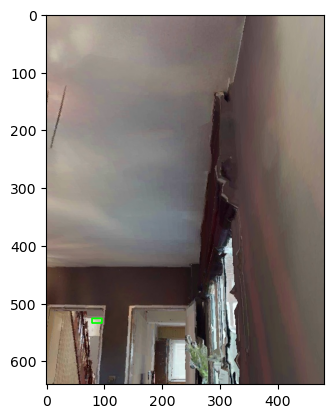

In [181]:
img = cv2.imread('/data/interactron_detection/val/972_00003/pos=[13.30,-0.00,-2.04]_rot=[1.57rad]_rgb_angle=[1.62rad]_rgb_axis=[0.21,0.96,-0.21].jpg')
bbox = ann['data'][-1]['state_table']['pos=[13.30,-0.00,-2.04]_rot=[1.57rad]_rgb_angle=[1.62rad]_rgb_axis=[0.21,0.96,-0.21]']['detections']['3']['bbox']
print(bbox)
x_min = bbox[0]
x_max = x_min + bbox[2]
y_min = bbox[1]
y_max = y_min + bbox[3]
img = cv2.rectangle(img,(x_min,y_min),(x_max,y_max),(0,255,0), 2)
plt.imshow(img)

In [26]:
from PIL import Image
import numpy as np
import json
import pandas as pd

In [32]:
annotations['data'][0]['state_table']['pos=[0.73,-0.00,-2.66]_rot=[1.55rad]_rgb_angle=[1.62rad]_rgb_axis=[-0.26,0.93,0.25]']['detections']

{'0': {'category_id': 38, 'bbox': (91, 2, 373, 560)},
 '15': {'category_id': 36, 'bbox': (147, 123, 38, 26)},
 '18': {'category_id': 15, 'bbox': (177, 0, 19, 154)},
 '58': {'category_id': 39, 'bbox': (155, 0, 22, 66)},
 '60': {'category_id': 23, 'bbox': (165, 21, 12, 3)},
 '64': {'category_id': 38, 'bbox': (169, 11, 8, 10)},
 '65': {'category_id': 22, 'bbox': (162, 20, 18, 52)},
 '66': {'category_id': 17, 'bbox': (147, 72, 32, 7)},
 '67': {'category_id': 38, 'bbox': (151, 67, 2, 1)},
 '71': {'category_id': 17, 'bbox': (145, 67, 37, 56)},
 '72': {'category_id': 8, 'bbox': (145, 0, 18, 88)},
 '74': {'category_id': 22, 'bbox': (146, 0, 0, 1)},
 '75': {'category_id': 39, 'bbox': (147, 0, 10, 67)},
 '311': {'category_id': 21, 'bbox': (191, 0, 283, 154)},
 '325': {'category_id': 25, 'bbox': (408, 13, 66, 96)},
 '326': {'category_id': 8, 'bbox': (279, 45, 155, 203)},
 '327': {'category_id': 8, 'bbox': (384, 31, 80, 125)},
 '329': {'category_id': 8, 'bbox': (423, 157, 32, 100)},
 '330': {'cate

In [65]:
img = np.array(Image.open("/data/interactron_detection/val_mask/0_00000/pos=[-5.72,0.05,0.49]_rot=[5.78rad]_rgb_angle=[5.56rad]_rgb_axis=[0.71,-0.68,-0.18].png"))
print(np.unique(img))

[ 3  6 15 17 23 24 36 38 39]


In [119]:
with open("/data/interactron_detection/annotations/interactron_v1_val.json", "rb") as f:
    ann = json.load(f)

In [184]:
one_env.reset(972)


{'depth': array([[[0.3666198 ],
         [0.36671776],
         [0.36682191],
         ...,
         [0.30874336],
         [0.3075317 ],
         [0.30632713]],
 
        [[0.36691993],
         [0.36701807],
         [0.36712232],
         ...,
         [0.3087339 ],
         [0.30752236],
         [0.30631778]],
 
        [[0.3670119 ],
         [0.3671407 ],
         [0.36726344],
         ...,
         [0.30872443],
         [0.30751294],
         [0.3063084 ]],
 
        ...,
 
        [[0.36620393],
         [0.36632618],
         [0.36644846],
         ...,
         [0.30597684],
         [0.30480435],
         [0.3036384 ]],
 
        [[0.36620393],
         [0.36632618],
         [0.36644846],
         ...,
         [0.30595818],
         [0.3047858 ],
         [0.30361995]],
 
        [[0.3661978 ],
         [0.36632   ],
         [0.36644235],
         ...,
         [0.30593488],
         [0.30476257],
         [0.30359685]]], dtype=float32),
 'rgb': array([[[ 66,  41,  31]

In [185]:
#data = data.set_index('raw_category')
category_mapping = data['mpcat40']
index_to_title_map = {obj.category.index(): category_mapping.get(obj.category.name(), 'unlabeled') for obj in one_env.sim.semantic_annotations().objects}

sem_to_model = np.vectorize(index_to_title_map.get)(img)
#sem_to_model = np.vectorize(obj_name_to_40ids.get)(sem_to_model)
#semantic_cats = np.unique(sem_to_model)

In [186]:
np.unique(img)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

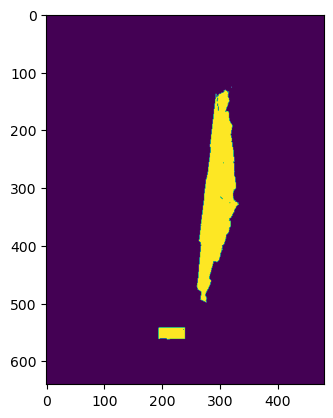

In [196]:
plt.imshow(img == 22)

In [187]:
index_to_title_map 

{0: 'unlabeled',
 1: 'ceiling',
 2: 'lighting',
 3: 'wall',
 4: 'objects',
 5: 'door',
 6: 'floor',
 7: 'cabinet',
 8: 'objects',
 9: 'unlabeled',
 10: 'objects',
 11: 'objects',
 12: 'bed',
 13: 'cushion',
 14: 'objects',
 15: 'curtain',
 16: 'window',
 17: 'window',
 18: 'curtain',
 19: 'misc',
 20: 'floor',
 21: 'door',
 22: 'towel',
 23: 'objects',
 24: 'objects',
 25: 'mirror',
 26: 'sink',
 27: 'objects',
 28: 'objects',
 29: 'plant',
 30: 'objects',
 31: 'misc',
 32: 'toilet',
 33: 'objects',
 34: 'curtain',
 35: 'clothes',
 36: 'objects',
 37: 'table',
 38: 'lighting',
 39: 'chair',
 40: 'chair',
 41: 'table',
 42: 'floor',
 43: 'misc',
 44: 'railing',
 45: 'lighting',
 46: 'misc',
 47: 'objects',
 48: 'lighting',
 49: 'misc',
 50: 'stairs',
 51: 'floor',
 52: 'objects',
 53: 'cabinet',
 54: 'objects',
 55: 'misc',
 56: 'misc',
 57: 'misc',
 58: 'fireplace',
 59: 'table',
 60: 'sofa',
 61: 'lighting',
 62: 'misc',
 63: 'picture',
 64: 'misc',
 65: 'objects',
 66: 'misc',
 67: '

In [151]:
np.unique(img)

array([ 0,  2,  3,  6,  7,  8,  9, 11, 14, 17, 18, 21, 22, 23, 24, 30, 58,
       65], dtype=uint8)

In [150]:
one_env.instance_id_to_label_id[3]

3

In [147]:
index_to_title_map

{0: 'unlabeled',
 1: 'wall',
 2: 'objects',
 3: 'objects',
 4: 'shower',
 5: 'window',
 6: 'objects',
 7: 'towel',
 8: 'misc',
 9: 'shower',
 10: 'stool',
 11: 'shower',
 12: 'objects',
 13: 'shower',
 14: 'mirror',
 15: 'misc',
 16: 'misc',
 17: 'misc',
 18: 'objects',
 19: 'toilet',
 20: 'misc',
 21: 'bathtub',
 22: 'objects',
 23: 'misc',
 24: 'door',
 25: 'floor',
 26: 'ceiling',
 27: 'lighting',
 28: 'objects',
 29: 'counter',
 30: 'sink',
 31: 'objects',
 32: 'cabinet',
 33: 'door',
 34: 'furniture',
 35: 'objects',
 36: 'shelving',
 37: 'objects',
 38: 'objects',
 39: 'clothes',
 40: 'misc',
 41: 'shelving',
 42: 'misc',
 43: 'objects',
 44: 'misc',
 45: 'objects',
 46: 'unlabeled',
 47: 'misc',
 48: 'floor',
 49: 'door',
 50: 'objects',
 51: 'cabinet',
 52: 'lighting',
 53: 'curtain',
 54: 'misc',
 55: 'chair',
 56: 'mirror',
 57: 'chest_of_drawers',
 58: 'objects',
 59: 'bed',
 60: 'objects',
 61: 'cushion',
 62: 'misc',
 63: 'misc',
 64: 'objects',
 65: 'table',
 66: 'cabinet

In [145]:
det_gt=ann["data"][-1]["state_table"]["pos=[13.30,-0.00,-2.04]_rot=[1.57rad]_rgb_angle=[1.62rad]_rgb_axis=[0.21,0.96,-0.21]"]["detections"]

In [198]:
bbox_list = []
for index, iid in enumerate(np.unique(img)):
    seg_value = iid
    #print(seg_value)
    segmentation = np.where(img == seg_value)

    # Bounding Box
    bbox = 0, 0, 0, 0
    if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
        x_min = int(np.min(segmentation[1]))
        x_max = int(np.max(segmentation[1]))
        y_min = int(np.min(segmentation[0]))
        y_max = int(np.max(segmentation[0]))

        bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
        bbox = list(bbox)
        print(bbox)
        bbox_list.append(bbox)
#print(bbox_list)

[2, 1, 330, 638]
[0, 0, 342, 541]
[0, 0, 479, 639]
[65, 555, 27, 84]
[67, 555, 230, 84]
[0, 502, 243, 137]
[0, 489, 270, 150]
[42, 514, 42, 125]
[176, 617, 11, 22]
[153, 528, 2, 29]
[187, 563, 24, 76]
[194, 561, 19, 74]
[194, 126, 138, 436]
[211, 368, 118, 271]
[209, 572, 1, 12]
[200, 383, 133, 256]
[212, 562, 28, 72]
[319, 384, 0, 0]


In [148]:
det_gt

{'0': {'category_id': 38, 'bbox': [2, 1, 330, 638]},
 '3': {'category_id': 7, 'bbox': [79, 526, 17, 8]},
 '5': {'category_id': 39, 'bbox': [64, 525, 30, 31]},
 '8': {'category_id': 39, 'bbox': [16, 514, 41, 125]},
 '11': {'category_id': 18, 'bbox': [65, 555, 27, 84]},
 '12': {'category_id': 18, 'bbox': [67, 632, 19, 7]},
 '13': {'category_id': 25, 'bbox': [67, 612, 5, 20]},
 '22': {'category_id': 26, 'bbox': [42, 514, 42, 125]},
 '24': {'category_id': 7, 'bbox': [175, 514, 65, 0]},
 '25': {'category_id': 7, 'bbox': [190, 535, 50, 6]},
 '26': {'category_id': 39, 'bbox': [148, 514, 45, 125]},
 '28': {'category_id': 39, 'bbox': [194, 542, 0, 0]},
 '30': {'category_id': 15, 'bbox': [182, 556, 5, 53]},
 '31': {'category_id': 15, 'bbox': [182, 560, 5, 56]},
 '34': {'category_id': 37, 'bbox': [176, 617, 11, 22]},
 '54': {'category_id': 22, 'bbox': [153, 555, 0, 2]},
 '55': {'category_id': 22, 'bbox': [154, 528, 1, 22]},
 '56': {'category_id': 28, 'bbox': [187, 563, 24, 76]},
 '61': {'category

In [95]:
label_id_to_40id = {
}
def get_iou(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
    assert bb1['x1'] <= bb1['x2']
    assert bb1['y1'] <= bb1['y2']
    assert bb2['x1'] <= bb2['x2']
    assert bb2['y1'] <= bb2['y2']

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou
bbox_list = []
for k, det in det_gt.items():
    found  =  0
    for index, iid in enumerate(np.unique(img)):
        seg_value = iid
        print(seg_value)
        segmentation = np.where(img == seg_value)
    
        # Bounding Box
        bbox = 0, 0, 0, 0
        if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
            x_min = int(np.min(segmentation[1]))
            x_max = int(np.max(segmentation[1]))
            y_min = int(np.min(segmentation[0]))
            y_max = int(np.max(segmentation[0]))
    
            bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
            bbox = list(bbox)
            
        if det['bbox'] == bbox:
            label_id_to_40id[iid] = det['category_id']
            found = 1
            
    if found == 0:
        iou_max = 0
        for index, iid in enumerate(np.unique(img)):
            seg_value = iid
            print(seg_value)
            segmentation = np.where(img == seg_value)
        
            # Bounding Box
            bbox = 0, 0, 0, 0
            if len(segmentation) != 0 and len(segmentation[1]) != 0 and len(segmentation[0]) != 0:
                x_min = int(np.min(segmentation[1]))
                x_max = int(np.max(segmentation[1]))
                y_min = int(np.min(segmentation[0]))
                y_max = int(np.max(segmentation[0]))
        
                bbox = x_min, y_min, (x_max - x_min), (y_max - y_min)
                bbox = list(bbox)
                x, y, w, h = det['bbox']
                bb1 = {
                    'x1': x_min,
                    'x2': x_max,
                    'y1': y_min,
                    'y2': y_max
                }
                bb2 = {
                    'x1': x,
                    'x2': x+w,
                    'y1': y,
                    'y2': y+h
                }
                iou = get_iou(bb1, bb2)
                if iou > iou_max:
                    label_id_to_40id[iid] = det['category_id']

0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9
11
14
17
18
21
22
23
24
30
58
65
0
2
3
6
7
8
9

In [96]:
label_id_to_40id

{0: 39,
 2: 39,
 3: 39,
 8: 39,
 9: 39,
 11: 39,
 6: 15,
 7: 15,
 22: 15,
 23: 15,
 30: 15,
 14: 15,
 17: 15,
 18: 15,
 21: 15,
 58: 15,
 24: 15,
 65: 28}

In [94]:
bbox_list

[[2, 1, 330, 638],
 [0, 0, 342, 541],
 [0, 0, 479, 639],
 [65, 555, 27, 84],
 [67, 555, 230, 84],
 [0, 502, 243, 137],
 [0, 489, 270, 150],
 [42, 514, 42, 125],
 [176, 617, 11, 22],
 [153, 528, 2, 29],
 [187, 563, 24, 76],
 [194, 561, 19, 74],
 [194, 126, 138, 436],
 [211, 368, 118, 271],
 [209, 572, 1, 12],
 [200, 383, 133, 256],
 [212, 562, 28, 72],
 [319, 384, 0, 0]]

In [88]:
print(det_gt)

{'0': {'category_id': 38, 'bbox': [2, 1, 330, 638]}, '3': {'category_id': 7, 'bbox': [79, 526, 17, 8]}, '5': {'category_id': 39, 'bbox': [64, 525, 30, 31]}, '8': {'category_id': 39, 'bbox': [16, 514, 41, 125]}, '11': {'category_id': 18, 'bbox': [65, 555, 27, 84]}, '12': {'category_id': 18, 'bbox': [67, 632, 19, 7]}, '13': {'category_id': 25, 'bbox': [67, 612, 5, 20]}, '22': {'category_id': 26, 'bbox': [42, 514, 42, 125]}, '24': {'category_id': 7, 'bbox': [175, 514, 65, 0]}, '25': {'category_id': 7, 'bbox': [190, 535, 50, 6]}, '26': {'category_id': 39, 'bbox': [148, 514, 45, 125]}, '28': {'category_id': 39, 'bbox': [194, 542, 0, 0]}, '30': {'category_id': 15, 'bbox': [182, 556, 5, 53]}, '31': {'category_id': 15, 'bbox': [182, 560, 5, 56]}, '34': {'category_id': 37, 'bbox': [176, 617, 11, 22]}, '54': {'category_id': 22, 'bbox': [153, 555, 0, 2]}, '55': {'category_id': 22, 'bbox': [154, 528, 1, 22]}, '56': {'category_id': 28, 'bbox': [187, 563, 24, 76]}, '61': {'category_id': 13, 'bbox': 

In [71]:
print(np.unique(img))

[ 0  2  3  6  7  8  9 11 14 17 18 21 22 23 24 30 58 65]


In [68]:
sem_to_model = np.vectorize(label_id_to_40id.get)(img)
#sem_to_model = np.vectorize(obj_name_to_40ids.get)(sem_to_model)

In [69]:
print(np.unique(sem_to_model))

TypeError: '<' not supported between instances of 'NoneType' and 'NoneType'

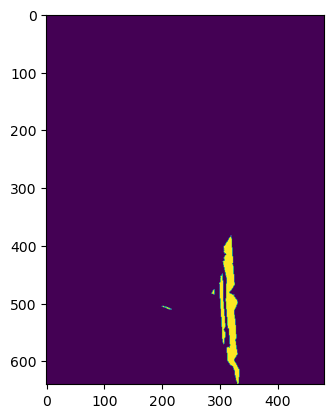

In [49]:
plt.imshow(sem_to_model == 30)